In [1]:
import time
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import pickle
import seaborn as sns

import os
import sys
import annoy
from annoy import AnnoyIndex
import random



from IPython.display import display_markdown

from collections import Counter

from sklearn import preprocessing
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from scipy.spatial import cKDTree
from sklearn.decomposition import PCA
from sklearn.decomposition import SparsePCA
from sklearn.ensemble import RandomForestClassifier


import antares_client

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# set random seed for consistent results
import random
random.seed(0)

plt.style.use('fig_publication.mplstyle')
%config InlineBackend.figure_format = 'retina'  #for MacOS, make plots crisp

In [2]:
# From 106 available features from Kostya's lc_feature_extractor, use the 82 from SNAD Miner paper 
# R and g bands
feature_names_r_g = ['feature_amplitude_magn_r', 
                         'feature_anderson_darling_normal_magn_r',
                         'feature_beyond_1_std_magn_r', 
                         'feature_beyond_2_std_magn_r',
                         'feature_cusum_magn_r', 
                         #'feature_eta_e_magn_r',
                         'feature_inter_percentile_range_2_magn_r',
                         'feature_inter_percentile_range_10_magn_r',
                         'feature_inter_percentile_range_25_magn_r', 
                         'feature_kurtosis_magn_r',
                         'feature_linear_fit_slope_magn_r',
                         'feature_linear_fit_slope_sigma_magn_r',
                         #'feature_linear_fit_reduced_chi2_magn_r', 
                         #'feature_linear_trend_magn_r', # cadence removal
                         #'feature_linear_trend_sigma_magn_r',  # cadence removal
                         'feature_magnitude_percentage_ratio_40_5_magn_r',
                         'feature_magnitude_percentage_ratio_20_5_magn_r',
                         #'feature_maximum_slope_magn_r',
                         'feature_mean_magn_r',
                         'feature_median_absolute_deviation_magn_r',
                         'feature_percent_amplitude_magn_r',
                         'feature_median_buffer_range_percentage_10_magn_r',
                         'feature_median_buffer_range_percentage_20_magn_r',
                         'feature_percent_difference_magnitude_percentile_5_magn_r',
                         'feature_percent_difference_magnitude_percentile_10_magn_r',
                         #'feature_period_0_magn_r',  # should be negated
                         #'feature_period_s_to_n_0_magn_r', # cadence removal
                         #'feature_period_1_magn_r', 
                         #'feature_period_s_to_n_1_magn_r', # cadence removal
                         #'feature_period_2_magn_r', 
                         #'feature_period_s_to_n_2_magn_r', # cadence removal
                         #'feature_period_3_magn_r', 
                         #'feature_period_s_to_n_3_magn_r', # cadence removal
                         #'feature_period_4_magn_r', 
                         #'feature_period_s_to_n_4_magn_r', # cadence removal
                         #'feature_periodogram_amplitude_magn_r',
                         #'feature_periodogram_beyond_2_std_magn_r',  # cadence removal
                         #'feature_periodogram_beyond_3_std_magn_r',  # cadence removal
                         #'feature_periodogram_standard_deviation_magn_r',   # cadence removal
                         #'feature_chi2_magn_r',
                         'feature_skew_magn_r', 
                         'feature_standard_deviation_magn_r',
                         'feature_stetson_k_magn_r',
                         'feature_weighted_mean_magn_r',
                         'feature_anderson_darling_normal_flux_r', 
                         'feature_cusum_flux_r',
                         #'feature_eta_e_flux_r', 
                         'feature_excess_variance_flux_r',
                         'feature_kurtosis_flux_r', 
                         'feature_mean_variance_flux_r',
                         #'feature_chi2_flux_r', 
                         'feature_skew_flux_r',
                         'feature_stetson_k_flux_r',

                         'feature_amplitude_magn_g', 
                         'feature_anderson_darling_normal_magn_g',
                         'feature_beyond_1_std_magn_g', 
                         'feature_beyond_2_std_magn_g',
                         'feature_cusum_magn_g', 
                         #'feature_eta_e_magn_g',
                         'feature_inter_percentile_range_2_magn_g',
                         'feature_inter_percentile_range_10_magn_g',
                         'feature_inter_percentile_range_25_magn_g', 
                         'feature_kurtosis_magn_g',
                         'feature_linear_fit_slope_magn_g',
                         'feature_linear_fit_slope_sigma_magn_g',
                         #'feature_linear_fit_reduced_chi2_magn_g', 
                         #'feature_linear_trend_magn_g', # cadence removal
                         #'feature_linear_trend_sigma_magn_g',  # cadence removal
                         'feature_magnitude_percentage_ratio_40_5_magn_g',
                         'feature_magnitude_percentage_ratio_20_5_magn_g',
                         #'feature_maximum_slope_magn_g', 
                         'feature_mean_magn_g',
                         'feature_median_absolute_deviation_magn_g',
                         'feature_median_buffer_range_percentage_10_magn_g',
                         'feature_median_buffer_range_percentage_20_magn_g',
                         'feature_percent_amplitude_magn_g',
                         'feature_percent_difference_magnitude_percentile_5_magn_g',
                         'feature_percent_difference_magnitude_percentile_10_magn_g',
                         #'feature_period_0_magn_g',  # should be negated
                         #'feature_period_s_to_n_0_magn_g', # cadence removal
                         #'feature_period_1_magn_g', 
                         #'feature_period_s_to_n_1_magn_g', # cadence removal
                         #'feature_period_2_magn_g', 
                         #'feature_period_s_to_n_2_magn_g', # cadence removal
                         #'feature_period_3_magn_g', 
                         #'feature_period_s_to_n_3_magn_g', # cadence removal
                         #'feature_period_4_magn_g', 
                         #'feature_period_s_to_n_4_magn_g', # cadence removal
                         #'feature_periodogram_amplitude_magn_g',
                         #'feature_periodogram_beyond_2_std_magn_g',  # cadence removal
                         #'feature_periodogram_beyond_3_std_magn_g', # cadence removal
                         #'feature_periodogram_standard_deviation_magn_g',  # cadence removal
                         #'feature_chi2_magn_g',
                         'feature_skew_magn_g', 
                         'feature_standard_deviation_magn_g',
                         'feature_stetson_k_magn_g', 
                         'feature_weighted_mean_magn_g',
                         'feature_anderson_darling_normal_flux_g', 
                         'feature_cusum_flux_g',
                         #'feature_eta_e_flux_g', 
                         'feature_excess_variance_flux_g',
                         'feature_kurtosis_flux_g', 
                         'feature_mean_variance_flux_g',
                         #'feature_chi2_flux_g', 
                         'feature_skew_flux_g',
                         'feature_stetson_k_flux_g'] 
    
ztf_id_and_features_r_g = ['Unnamed: 0'] + ['locus_id', 'ra', 'dec',\
                            'tags', 'catalogs', 'ztf_object_id', 'ztf_ssnamenr', 'num_alerts',\
                            'num_mag_values', 'oldest_alert_id', 'oldest_alert_magnitude',\
                            'oldest_alert_observation_time', 'newest_alert_id',\
                            'newest_alert_magnitude', 'newest_alert_observation_time',\
                            'brightest_alert_id', 'brightest_alert_magnitude', \
                            'brightest_alert_observation_time'] + feature_names_r_g +\
                        ['horizons_targetname', 'anomaly', 'anom_score', 'anomaly_score',\
                         'anomaly_mask', 'anomaly_type', 'is_corrected', 'vpdf_extreme_version',\
                         'vpdf_extreme_faint', 'vpdf_extreme_bright', 'locus_gal_l', 'locus_gal_b']


feature_names_hostgal = [
#  'Unnamed: 0',
#  'level_0',
#  'index',
#  'objName',
#  'objAltName1',
#  'objAltName2',
#  'objAltName3',
#  'objID',
#  'uniquePspsOBid',
#  'ippObjID',
#  'surveyID',
#  'htmID',
#  'zoneID',
#  'tessID',
#  'projectionID',
#  'skyCellID',
#  'randomID',
#  'batchID',
#  'dvoRegionID',
#  'processingVersion',
#  'objInfoFlag',
#  'qualityFlag',
#  'raStack',
#  'decStack',
#  'raStackErr',
#  'decStackErr',
#  'raMean',
#  'decMean',
#  'raMeanErr',
#  'decMeanErr',
#  'epochMean',
#  'posMeanChisq',
#  'cx',
#  'cy',
#  'cz',
#  'lambda',
#  'beta',
#  'l',
#  'b',
#  'nStackObjectRows',
#  'nStackDetections',
#  'nDetections',
#  'ng',
#  'nr',
#  'ni',
#  'nz',
#  'ny',
#  'uniquePspsSTid',
#  'primaryDetection',
#  'bestDetection',
#  'gippDetectID',
#  'gstackDetectID',
#  'gstackImageID',
#  'gra',
#  'gdec',
#  'graErr',
#  'gdecErr',
#  'gEpoch',
#  'gPSFMag',
#  'gPSFMagErr',
#  'gApMag',
#  'gApMagErr',
#  'gKronMag',
#  'gKronMagErr',
#  'ginfoFlag',
#  'ginfoFlag2',
#  'ginfoFlag3',
#  'gnFrames',
#  'gxPos',
#  'gyPos',
#  'gxPosErr',
#  'gyPosErr',
#  'gpsfMajorFWHM',
#  'gpsfMinorFWHM',
#  'gpsfTheta',
#  'gpsfCore',
#  'gpsfLikelihood',
#  'gpsfQf',
#  'gpsfQfPerfect',
#  'gpsfChiSq',
 'gmomentXX',
 'gmomentXY',
 'gmomentYY',
 'gmomentR1',
 'gmomentRH',
 'gPSFFlux',
#  'gPSFFluxErr',
 'gApFlux',
#  'gApFluxErr',
#  'gApFillFac',
#  'gApRadius',
 'gKronFlux',
#  'gKronFluxErr',
 'gKronRad',
#  'gexpTime',
 'gExtNSigma',
#  'gsky',
#  'gskyErr',
#  'gzp',
#  'gPlateScale',
#  'rippDetectID',
#  'rstackDetectID',
#  'rstackImageID',
#  'rra',
#  'rdec',
#  'rraErr',
#  'rdecErr',
#  'rEpoch',
# 'rPSFMag',
#  'rPSFMagErr',
# 'rApMag',
#  'rApMagErr',
# 'rKronMag',
#  'rKronMagErr',
#  'rinfoFlag',
#  'rinfoFlag2',
#  'rinfoFlag3',
#  'rnFrames',
#  'rxPos',
#  'ryPos',
#  'rxPosErr',
#  'ryPosErr',
#  'rpsfMajorFWHM',
#  'rpsfMinorFWHM',
#  'rpsfTheta',
#  'rpsfCore',
#  'rpsfLikelihood',
#  'rpsfQf',
#  'rpsfQfPerfect',
#  'rpsfChiSq',
 'rmomentXX',
 'rmomentXY',
 'rmomentYY',
 'rmomentR1',
 'rmomentRH',
'rPSFFlux',
#  'rPSFFluxErr',
'rApFlux',
#  'rApFluxErr',
#  'rApFillFac',
# 'rApRadius',
'rKronFlux',
#  'rKronFluxErr',
'rKronRad',
#  'rexpTime',
 'rExtNSigma',
#  'rsky',
#  'rskyErr',
#  'rzp',
#  'rPlateScale',
#  'iippDetectID',
#  'istackDetectID',
#  'istackImageID',
#  'ira',
#  'idec',
#  'iraErr',
#  'idecErr',
#  'iEpoch',
#  'iPSFMag',
#  'iPSFMagErr',
#  'iApMag',
#  'iApMagErr',
#  'iKronMag',
#  'iKronMagErr',
#  'iinfoFlag',
#  'iinfoFlag2',
#  'iinfoFlag3',
#  'inFrames',
#  'ixPos',
#  'iyPos',
#  'ixPosErr',
#  'iyPosErr',
#  'ipsfMajorFWHM',
#  'ipsfMinorFWHM',
#  'ipsfTheta',
#  'ipsfCore',
#  'ipsfLikelihood',
#  'ipsfQf',
#  'ipsfQfPerfect',
#  'ipsfChiSq',
  'imomentXX',
 'imomentXY',
 'imomentYY',
 'imomentR1',
 'imomentRH',
 'iPSFFlux',
#  'iPSFFluxErr',
 'iApFlux',
#  'iApFluxErr',
#  'iApFillFac',
#  'iApRadius',
 'iKronFlux',
#  'iKronFluxErr',
 'iKronRad',
#  'iexpTime',
  'iExtNSigma',
#  'isky',
#  'iskyErr',
#  'izp',
#  'iPlateScale',
#  'zippDetectID',
#  'zstackDetectID',
#  'zstackImageID',
#  'zra',
#  'zdec',
#  'zraErr',
#  'zdecErr',
#  'zEpoch',
#  'zPSFMag',
#  'zPSFMagErr',
#  'zApMag',
#  'zApMagErr',
#  'zKronMag',
#  'zKronMagErr',
#  'zinfoFlag',
#  'zinfoFlag2',
#  'zinfoFlag3',
#  'znFrames',
#  'zxPos',
#  'zyPos',
#  'zxPosErr',
#  'zyPosErr',
#  'zpsfMajorFWHM',
#  'zpsfMinorFWHM',
#  'zpsfTheta',
#  'zpsfCore',
#  'zpsfLikelihood',
#  'zpsfQf',
#  'zpsfQfPerfect',
#  'zpsfChiSq',
  'zmomentXX',
 'zmomentXY',
 'zmomentYY',
 'zmomentR1',
 'zmomentRH',
 'zPSFFlux',
# #  'zPSFFluxErr',
 'zApFlux',
# #  'zApFluxErr',
# #  'zApFillFac',
# #  'zApRadius',
 'zKronFlux',
# #  'zKronFluxErr',
 'zKronRad',
# #  'zexpTime',
  'zExtNSigma',
#  'zsky',
#  'zskyErr',
#  'zzp',
#  'zPlateScale',
#  'yippDetectID',
#  'ystackDetectID',
#  'ystackImageID',
#  'yra',
#  'ydec',
#  'yraErr',
#  'ydecErr',
#  'yEpoch',
#  'yPSFMag',
#  'yPSFMagErr',
#  'yApMag',
#  'yApMagErr',
#  'yKronMag',
#  'yKronMagErr',
#  'yinfoFlag',
#  'yinfoFlag2',
#  'yinfoFlag3',
#  'ynFrames',
#  'yxPos',
#  'yyPos',
#  'yxPosErr',
#  'yyPosErr',
#  'ypsfMajorFWHM',
#  'ypsfMinorFWHM',
#  'ypsfTheta',
#  'ypsfCore',
#  'ypsfLikelihood',
#  'ypsfQf',
#  'ypsfQfPerfect',
#  'ypsfChiSq',
  'ymomentXX',
  'ymomentXY',
  'ymomentYY',
  'ymomentR1',
  'ymomentRH',
  'yPSFFlux',
# #   'yPSFFluxErr',
  'yApFlux',
# #   'yApFluxErr',
# #   'yApFillFac',
# #  'yApRadius',
 'yKronFlux',
# #  'yKronFluxErr',
 'yKronRad',
# #  'yexpTime',
  'yExtNSigma',
#  'ysky',
#  'yskyErr',
#  'yzp',
#  'yPlateScale',
#  'distance',
#  'SkyMapper_StarClass',
#  'gelong',
#  'g_a',
#  'g_b',
#  'g_pa',
#  'relong',
#  'r_a',
#  'r_b',
#  'r_pa',
#  'ielong',
#  'i_a',
#  'i_b',
#  'i_pa',
#  'zelong',
#  'z_a',
#  'z_b',
#  'z_pa',
   'i-z', # try throwing in
#    'g-r',
#    'r-i',
#    'g-i',
#    'z-y',
#   'g-rErr',
#   'r-iErr',
#   'i-zErr',
#   'z-yErr',
 'gApMag_gKronMag',
 'rApMag_rKronMag',
 'iApMag_iKronMag',
 'zApMag_zKronMag',
 'yApMag_yKronMag',
 '7DCD', 
#  'NED_name',
#  'NED_type',
#  'NED_vel',
#  'NED_redshift',
#  'NED_mag',
#  'class',
   'dist/DLR',
#   'dist',
#  'TransientClass',
#  'TransientRA',
#  'TransientDEC'
   ]

feature_names_tns = ['has_tns', 'tns_cls', 'spec_z', 'report_group']

lc_and_host_features = feature_names_r_g+feature_names_hostgal
lc_and_host_and_tns_features = lc_and_host_features + feature_names_tns

In [52]:
def plot_conf_matrix(y_test, y_pred, labels, title, kind, figsize=(6, 4)):
    if kind == 'completeness':
        counts = confusion_matrix(y_test, y_pred, labels=labels, normalize=None)
        recall = confusion_matrix(y_test, y_pred, labels=labels, normalize='true')
        annotations = np.vectorize(lambda c, r: f'{r:.2g}\n({c})')(counts, recall)
        heatmap = pd.DataFrame(recall, index=labels, columns=labels)
    
    if kind == 'purity':
        counts = confusion_matrix(y_test, y_pred, labels=labels, normalize=None)
        recall = confusion_matrix(y_test, y_pred, labels=labels, normalize='pred')
        annotations = np.vectorize(lambda c, r: f'{r:.2g}\n({c})')(counts, recall)
        heatmap = pd.DataFrame(recall, index=labels, columns=labels)
    
    plt.figure(figsize=figsize)
    sns.heatmap(heatmap, annot=annotations, fmt='s', cmap='Blues', vmin=0, vmax=1, annot_kws={"fontsize":18})
    plt.title(title, fontsize=24)
    plt.ylabel('True class', fontsize=24)
    plt.xlabel('Predicted class', fontsize=24)
    #plt.show()

In [4]:
def plot_RFC_prob_vs_lc(dataframe, anom_thresh):
    import antares_client

    df_path = "/Users/patrickaleo/Desktop/Illinois/LAISS-antares/repo/CVAE_dataframes"
    anom_thresh = anom_thresh

    num_anom_epochs_l = []
    anom_ztfid_l, tnscls_l = [],[]
    for anom_ztfid, tnscls in zip(dataframe.index, dataframe.tns_cls):
        print(anom_ztfid, tnscls)
        try:
            lc_and_hosts_df = pd.read_csv(f'{df_path}/{anom_ztfid}_timeseries.csv')
        except:
            print(f"couldn't feature space as func of time for {anom_ztfid}. Make anom epoch -9")
            num_anom_epochs_l.append(-9)
            continue

        lc_and_hosts_df = lc_and_hosts_df.dropna()
        anom_obj_df = lc_and_hosts_df[x_test.columns]

        pred_prob_anom = 100 * clf.predict_proba(anom_obj_df)
        num_anom_epochs = len(np.where(pred_prob_anom[:, 1]>=anom_thresh)[0])
        num_anom_epochs_l.append(num_anom_epochs)

        try: 
            #anom_idx = np.where(pred_prob_anom[:, 1]>=50)[0][0]
            orig = pd.read_csv(f'{df_path}/{anom_ztfid}_timeseries.csv')
            diff = len(orig)-len(pred_prob_anom)
            #if len(np.where(pred_prob_anom[:, 1]>=anom_thresh)) == 1:
            if not np.where(pred_prob_anom[:, 1]>=anom_thresh)[0][0] == 0:
                anom_idx = lc_and_hosts_df.loc[np.where(pred_prob_anom[:, 1]>=anom_thresh)[0][0]].obs_num + diff
            else: anom_idx = lc_and_hosts_df.iloc[np.where(pred_prob_anom[:, 1]>=anom_thresh)[0][0]].obs_num + diff
            anom_idx_is = True

        except: 
            print(f"Prediction doesn't exceed anom_threshold of {anom_thresh}% for {anom_ztfid}.")
            anom_idx_is = False

        ztf_id_ref = anom_ztfid 

        ref_info = antares_client.search.get_by_ztf_object_id(ztf_object_id=ztf_id_ref)

        try: df_ref = ref_info.timeseries.to_pandas()
        except: 
            print(f"No ref_info.timeseries.to_pandas() for {anom_ztfid}. Continue...")
            continue

        print(num_anom_epochs)
        anom_ztfid_l.append(anom_ztfid), tnscls_l.append(tnscls)

        df_ref_g = df_ref[(df_ref.ant_passband == 'g') & (~df_ref.ant_mag.isna())]
        df_ref_r = df_ref[(df_ref.ant_passband == 'R') & (~df_ref.ant_mag.isna())]

        mjd_idx_at_min_mag_r_ref = df_ref_r[['ant_mag']].reset_index().idxmin().ant_mag
        mjd_idx_at_min_mag_g_ref = df_ref_g[['ant_mag']].reset_index().idxmin().ant_mag

        fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(7,10))
        ax1.invert_yaxis()
        ax1.errorbar(x=df_ref_r.ant_mjd, y=df_ref_r.ant_mag, yerr=df_ref_r.ant_magerr, fmt='o', c='r', 
                    label=f'REF: {ztf_id_ref}')
        ax1.errorbar(x=df_ref_g.ant_mjd, y=df_ref_g.ant_mag, yerr=df_ref_g.ant_magerr, fmt='o', c='g')
        #ax1.axvline(x=lc_and_hosts_df.loc[lc_and_hosts_df.loc[anom_idx].obs_num].mjd_cutoff)
        if anom_idx_is == True:
            ax1.axvline(x=lc_and_hosts_df[lc_and_hosts_df.obs_num == anom_idx].mjd_cutoff.values[0])
        #ax1.set_xlim(min(df_ref_r.ant_mjd), max(df_ref_r.ant_mjd))
        ax1.set_ylabel('Mag')


        print(f'https://alerce.online/object/{anom_ztfid}', tnscls)
        ax2.plot(lc_and_hosts_df['mjd_cutoff'], pred_prob_anom[:, 0], label='p(Normal)')
        ax2.plot(lc_and_hosts_df['mjd_cutoff'], pred_prob_anom[:, 1], label='p(Other)')
        #ax2.axhline(y=50)

        ax2.set_ylabel('Probability (%)')


        #ax2.set_xlim(min(df_ref_r.ant_mjd), max(df_ref_r.ant_mjd))

        plt.xlabel('mjd_cutoff')
        plt.legend()
        plt.show()
        
def plot_RFC_prob_vs_lc_ztfid(anom_ztfid, anom_thresh, df_path):
    # Predict Excluded Object
    import antares_client
    
    df_path = df_path
    anom_thresh = anom_thresh

    try:
        lc_and_hosts_df = pd.read_csv(f'{df_path}/{anom_ztfid}_timeseries.csv')
    except:
        print(f"couldn't feature space as func of time for {anom_ztfid}. pass.")
        pass

    lc_and_hosts_df = lc_and_hosts_df.dropna()
    anom_obj_df = lc_and_hosts_df[x_test.columns]

    pred_prob_anom = 100 * clf.predict_proba(anom_obj_df)
    num_anom_epochs = len(np.where(pred_prob_anom[:, 1]>=anom_thresh)[0])

    try: 
        #anom_idx = np.where(pred_prob_anom[:, 1]>=50)[0][0]
        orig = pd.read_csv(f'{df_path}/{anom_ztfid}_timeseries.csv')
        diff = len(orig)-len(pred_prob_anom)
        anom_idx = lc_and_hosts_df.loc[np.where(pred_prob_anom[:, 1]>=anom_thresh)[0][0]].obs_num + diff
        anom_idx_is = True

    except: 
        print(f"Prediction doesn't exceed anom_threshold of {anom_thresh}% for {anom_ztfid}.")
        anom_idx_is = False
    
    ztf_id_ref = anom_ztfid 

    ref_info = antares_client.search.get_by_ztf_object_id(ztf_object_id=ztf_id_ref)

    df_ref = ref_info.timeseries.to_pandas()

    df_ref_g = df_ref[(df_ref.ant_passband == 'g') & (~df_ref.ant_mag.isna())]
    df_ref_r = df_ref[(df_ref.ant_passband == 'R') & (~df_ref.ant_mag.isna())]

    mjd_idx_at_min_mag_r_ref = df_ref_r[['ant_mag']].reset_index().idxmin().ant_mag
    mjd_idx_at_min_mag_g_ref = df_ref_g[['ant_mag']].reset_index().idxmin().ant_mag

    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(7,10))
    ax1.invert_yaxis()
    ax1.errorbar(x=df_ref_r.ant_mjd, y=df_ref_r.ant_mag, yerr=df_ref_r.ant_magerr, fmt='o', c='r', 
                label=f'REF: {ztf_id_ref}')
    ax1.errorbar(x=df_ref_g.ant_mjd, y=df_ref_g.ant_mag, yerr=df_ref_g.ant_magerr, fmt='o', c='g')
    if anom_idx_is == True:
        ax1.axvline(x=lc_and_hosts_df[lc_and_hosts_df.obs_num == anom_idx].mjd_cutoff.values[0])
    #ax1.set_xlim(min(df_ref_r.ant_mjd), max(df_ref_r.ant_mjd))

    print(f'https://alerce.online/object/{anom_ztfid}')
    ax2.plot(lc_and_hosts_df['mjd_cutoff'], pred_prob_anom[:, 0], label='p(Normal)')
    ax2.plot(lc_and_hosts_df['mjd_cutoff'], pred_prob_anom[:, 1], label='p(Other)')
    #ax2.axhline(y=50)

    #ax2.set_xlim(min(df_ref_r.ant_mjd), max(df_ref_r.ant_mjd))

    plt.xlabel('mjd_cutoff')
    plt.ylabel('Probability (%)')
    plt.legend()
    plt.show()

In [5]:
#fakes_suffix = 'SMOTE_train_test_80-20_min14_kneighbors8'
fakes_suffix = 'SMOTE_train_test_70-30_min14_kneighbors8'
#suffix=f"noTNScut_pca60_noCadence_NOtransf_HasHostGalOnly_SS_AlerceCls_NOfw_{smote_suffix}"
#dataset_bank_tns_df_resampled_train = pd.read_csv(f'../loci_dbs/alerce_cut/dataset_bank_tns_df_resampled_train_{smote_suffix}.csv.gz', compression='gzip', index_col=0)
#dataset_bank_tns_df_resampled_test = pd.read_csv(f'../loci_dbs/alerce_cut/dataset_bank_tns_df_resampled_test_{smote_suffix}.csv.gz', compression='gzip', index_col=0)

#num=3039 #5000
#n_classes=11 #12
#n_epochs=4000 #500
#fakes_suffix = f'PZFLOW_train_test_70-30_min14_classes{n_classes}_epochs{n_epochs}'
#fakes_suffix = f'PZFLOW_train_test_80-20_min14_classes{n_classes}_epochs{n_epochs}_n{num}'
#fakes_suffix = f'PZFLOW_train_test_80-20_min14_classes{n_classes}_epochs{n_epochs}_n{num}_RollingSplineCoupling_B=5'
#fakes_suffix = f'PZFLOW_train_test_80-20_min14_classes{n_classes}_epochs{n_epochs}_n{num}_RollingSplineCoupling_B=5_chunks20'

suffix=f"noTNScut_pca60_noCadence_NOtransf_HasHostGalOnly_SS_AlerceCls_NOfw_{fakes_suffix}"

#dataset_bank_tns_df_resampled_train = pd.read_csv(f'../loci_dbs/alerce_cut/dataset_bank_tns_df_resampled_train_{fakes_suffix}.csv.gz', compression='gzip', index_col=0)
#dataset_bank_tns_df_resampled_test = pd.read_csv(f'../loci_dbs/alerce_cut/dataset_bank_tns_df_resampled_test_{fakes_suffix}.csv.gz', compression='gzip', index_col=0)

df_folder_path = f"../figures/CVAE/SMOTE_train_test_70-30_min14_kneighbors8/256_epochs=250_latent_dim=3_10000xClassLoss/dataframes/"
    
x_train_all_latent_df = pd.read_csv(f'{df_folder_path}/x_train_all_3sdims_df.csv.gz', compression='gzip', index_col=0)
x_test_all_latent_df = pd.read_csv(f'{df_folder_path}/x_test_all_3sdims_df.csv.gz', compression='gzip', index_col=0)

dataset_bank_tns_df_resampled_train = x_train_all_latent_df
dataset_bank_tns_df_resampled_test = x_test_all_latent_df

dataset_bank_tns_df_resampled_train

,feature_amplitude_magn_r,feature_anderson_darling_normal_magn_r,feature_beyond_1_std_magn_r,feature_beyond_2_std_magn_r,feature_cusum_magn_r,feature_inter_percentile_range_2_magn_r,feature_inter_percentile_range_10_magn_r,feature_inter_percentile_range_25_magn_r,feature_kurtosis_magn_r,feature_linear_fit_slope_magn_r,...,yApMag_yKronMag,7DCD,dist/DLR,has_tns,tns_cls,spec_z,report_group,s1,s2,s3
ztf_object_id,,,,,,,,,,,,,,,,,,,,,
ZTF19abvhaqq,0.391695,0.368108,0.375000,0.000000,0.395856,0.783390,0.723513,0.435022,-0.830757,0.000424,...,0.587200,43.259193,0.629409,Yes_TNS,None,-99.00000,ZTF,0.522837,1.322096,-0.154813
ZTF21aaswtkh,0.356501,0.355052,0.300000,0.000000,0.321765,0.713001,0.551514,0.300600,0.231450,0.000459,...,-0.157801,8.971037,0.034890,No_TNS,None,-99.00000,None,3.169624,1.283513,3.707779
ZTF18abscghc,0.224128,0.290376,0.400000,0.000000,0.345730,0.448256,0.448256,0.169133,2.276334,0.003358,...,0.673201,2.667939,0.236800,No_TNS,None,-99.00000,None,0.202315,1.831499,2.775185
ZTF21abjpjcn,0.392974,0.806768,0.142857,0.142857,0.316430,0.785948,0.671357,0.204642,4.390367,-0.040870,...,0.001501,14.958282,0.031570,Yes_TNS,None,-99.00000,ALeRCE,1.685265,2.415032,5.273047
ZTF21aarhzdh,0.908470,0.317764,0.263158,0.000000,0.397708,1.816940,1.555440,0.847626,-0.448936,0.021725,...,0.594801,22.116211,1.116821,Yes_TNS,SN Ia,0.06975,ALeRCE,-0.346589,-0.360863,-1.361462
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTFabc91973,0.648056,0.438369,0.306405,0.000000,0.350863,1.296113,1.132292,0.416165,2.372943,-0.013326,...,0.579434,39.665981,0.019535,Fake,TDE,-99.00000,None,2.163637,-2.137986,0.782973
ZTFabc46594,0.486110,0.605627,0.258561,0.017279,0.317578,0.937265,0.604629,0.378644,0.566701,-0.007330,...,-0.116639,8.221067,0.055221,Fake,TDE,-99.00000,None,3.185683,0.419032,3.490731
ZTFabc20988,0.447717,0.433476,0.428571,0.000000,0.403265,0.895435,0.820801,0.547785,-0.871551,0.005264,...,0.121683,2.985047,0.021310,Fake,TDE,-99.00000,None,0.664488,1.051691,-0.522939


In [6]:
# Try RFC without None
dataset_bank_tns_df_resampled_train = dataset_bank_tns_df_resampled_train[dataset_bank_tns_df_resampled_train['tns_cls'] != 'None']
dataset_bank_tns_df_resampled_train

# Try with None
#dataset_bank_tns_df_resampled_train

,feature_amplitude_magn_r,feature_anderson_darling_normal_magn_r,feature_beyond_1_std_magn_r,feature_beyond_2_std_magn_r,feature_cusum_magn_r,feature_inter_percentile_range_2_magn_r,feature_inter_percentile_range_10_magn_r,feature_inter_percentile_range_25_magn_r,feature_kurtosis_magn_r,feature_linear_fit_slope_magn_r,...,yApMag_yKronMag,7DCD,dist/DLR,has_tns,tns_cls,spec_z,report_group,s1,s2,s3
ztf_object_id,,,,,,,,,,,,,,,,,,,,,
ZTF21aarhzdh,0.908470,0.317764,0.263158,0.000000,0.397708,1.816940,1.555440,0.847626,-0.448936,0.021725,...,0.594801,22.116211,1.116821,Yes_TNS,SN Ia,0.06975,ALeRCE,-0.346589,-0.360863,-1.361462
ZTF21aatvcdl,1.001925,0.535585,0.384615,0.076923,0.355134,2.003849,1.392731,0.589785,1.890188,0.011990,...,0.188101,1.118396,0.810604,Yes_TNS,SN Ia,0.05000,ALeRCE,2.191991,-1.739919,0.280441
ZTF20ackzfvn,0.842765,0.292838,0.285714,0.000000,0.347289,1.685530,1.470047,0.522483,1.647548,-0.057671,...,0.385101,172.179993,0.152137,Yes_TNS,SN II,0.01700,AMPEL,1.125501,-1.050369,3.296125
ZTF21abngbrl,0.734040,0.614425,0.125000,0.000000,0.424395,1.468081,1.324121,0.883477,-0.647679,0.022412,...,1.926700,136.301710,3.633416,Yes_TNS,SN Ib,0.03000,ALeRCE,-2.708708,0.627959,-1.945612
ZTF21aaaroyw,0.411922,0.292416,0.222222,0.000000,0.347490,0.823845,0.629479,0.208841,1.513798,-0.006436,...,1.456800,65.883768,0.599778,Yes_TNS,SN Ib,0.04360,ZTF,-2.303108,-0.651038,4.840856
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTFabc91973,0.648056,0.438369,0.306405,0.000000,0.350863,1.296113,1.132292,0.416165,2.372943,-0.013326,...,0.579434,39.665981,0.019535,Fake,TDE,-99.00000,None,2.163637,-2.137986,0.782973
ZTFabc46594,0.486110,0.605627,0.258561,0.017279,0.317578,0.937265,0.604629,0.378644,0.566701,-0.007330,...,-0.116639,8.221067,0.055221,Fake,TDE,-99.00000,None,3.185683,0.419032,3.490731
ZTFabc20988,0.447717,0.433476,0.428571,0.000000,0.403265,0.895435,0.820801,0.547785,-0.871551,0.005264,...,0.121683,2.985047,0.021310,Fake,TDE,-99.00000,None,0.664488,1.051691,-0.522939


In [7]:
# Try RFC without None
dataset_bank_tns_df_resampled_test = dataset_bank_tns_df_resampled_test[dataset_bank_tns_df_resampled_test['tns_cls'] != 'None']
dataset_bank_tns_df_resampled_test

# Try with None
#dataset_bank_tns_df_resampled_test

,feature_amplitude_magn_r,feature_anderson_darling_normal_magn_r,feature_beyond_1_std_magn_r,feature_beyond_2_std_magn_r,feature_cusum_magn_r,feature_inter_percentile_range_2_magn_r,feature_inter_percentile_range_10_magn_r,feature_inter_percentile_range_25_magn_r,feature_kurtosis_magn_r,feature_linear_fit_slope_magn_r,...,yApMag_yKronMag,7DCD,dist/DLR,has_tns,tns_cls,spec_z,report_group,s1,s2,s3
ztf_object_id,,,,,,,,,,,,,,,,,,,,,
ZTF21abflgpq,0.870663,0.832949,0.450000,0.000000,0.415719,1.741325,1.641349,1.051812,-1.050923,0.018559,...,1.665099,93.210482,0.797120,Yes_TNS,SN Ia,0.051000,ZTF,-1.347940,-2.143846,-1.058898
ZTF21abkaoxe,0.889637,0.438159,0.333333,0.083333,0.393583,1.779274,1.299865,0.737659,0.696188,0.008549,...,1.276100,384.035238,0.572413,Yes_TNS,SN Ia,0.054300,AMPEL,-1.808721,-3.478097,1.683576
ZTF20acpkled,0.609564,0.510436,0.461538,0.000000,0.402370,1.219128,0.992767,0.743933,-0.870991,0.027804,...,1.398200,191.718352,0.380678,Yes_TNS,SN Ia,0.091000,ALeRCE,-1.263091,-0.775184,-0.464462
ZTF21aaazjia,0.910465,0.654931,0.166667,0.000000,0.353590,1.820930,1.700190,0.613535,3.543068,-0.108279,...,0.519999,32.729238,0.628186,Yes_TNS,SN Ia,0.047000,ALeRCE,2.126118,-0.276193,-0.051114
ZTF21acqyqwu,0.164925,0.191106,0.222222,0.000000,0.351634,0.329849,0.255836,0.119952,0.677669,0.011867,...,0.603100,72.697663,0.963197,Yes_TNS,SN Ib,0.042000,ATLAS,-0.498909,1.834771,1.366241
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF21acdalyp,1.061692,0.242709,0.357143,0.071429,0.375832,2.123384,1.597695,0.657423,-0.115655,0.024840,...,1.092001,48.668157,0.124452,Yes_TNS,SN Ia-91T-like,0.037437,ALeRCE,0.129944,-3.278610,-0.884733
ZTF21abdcauj,0.633349,0.322944,0.400000,0.000000,0.419177,1.266699,0.828672,0.586951,-0.800553,0.020024,...,0.422300,58.550706,0.012833,Yes_TNS,SN Ia,0.097780,AMPEL,1.303050,0.591592,-0.530924
ZTF21aaetnfe,1.442822,1.007647,0.380952,0.000000,0.455937,2.885643,2.600447,1.725258,-1.641959,0.034872,...,1.225500,124.418488,0.916609,Yes_TNS,SN Ia,0.040000,ALeRCE,0.306471,-7.196171,-2.161669


In [8]:
print("ZTFID TNS_CLS SPEC_Z DIST/DLR")
for ob, cls, z, dDLR in zip(dataset_bank_tns_df_resampled_test.index, 
                            dataset_bank_tns_df_resampled_test.tns_cls,
                            dataset_bank_tns_df_resampled_test.spec_z,
                            dataset_bank_tns_df_resampled_test['dist/DLR']):
    print(ob, cls, z, dDLR)

ZTFID TNS_CLS SPEC_Z DIST/DLR
ZTF21abflgpq SN Ia 0.051 0.7971204547741477
ZTF21abkaoxe SN Ia 0.0543 0.5724129038352377
ZTF20acpkled SN Ia 0.091 0.3806781382275735
ZTF21aaazjia SN Ia 0.047 0.6281856974372859
ZTF21acqyqwu SN Ib 0.042 0.9631973226887764
ZTF20acvdqtg SN Ia 0.077 0.2395643229266864
ZTF21aaabwem SN IIP 0.03179 0.616871366506101
ZTF20acqzpta SN Ia 0.07135 0.0567877004822395
ZTF21abhrmrv SN Ia 0.04 0.4818397663260769
ZTF21aaabuoj SN Ia 0.07 0.1742342393467569
ZTF20acbiwri SN II 0.03 0.2879998945577168
ZTF20abarsvz SN Ia 0.039 0.1907033136343334
ZTF21abrxoir SN Ia 0.026657 1.1559320032472018
ZTF21aaagzee SN Ia 0.06 0.3117462328540907
ZTF21abfxjkq SN II 0.019937 0.981774033106263
ZTF21abcnkbe SN Ia 0.046 0.5368238656644737
ZTF21aciqcge SN Ia 0.025 0.6001743167315271
ZTF20acwfftd SN Ia 0.02147 0.8680081504560269
ZTF21abzbwfo SN II 0.22 1.2653106941890944
ZTF21aahzspd SN Ia 0.11 4.9917805641145145
ZTF21aalnhby SN Ia 0.064 0.0924074010139341
ZTF21abizxkw SN Ia 0.091 0.0101268148320

In [9]:
np.unique(np.array(dataset_bank_tns_df_resampled_train['tns_cls']))

array(['SLSN-II', 'SN II', 'SN IIP', 'SN IIb', 'SN IIn', 'SN Ia',
       'SN Ia-91T-like', 'SN Ib', 'SN Ic', 'SN Ic-BL', 'TDE'],
      dtype=object)

In [10]:
# Without None class
#dataset_bank_tns_df_resampled_val = dataset_bank_tns_df_resampled_test.iloc[0:100, :]
#dataset_bank_tns_df_resampled_test = dataset_bank_tns_df_resampled_test.iloc[100:, :]

# With None class
# for best results: Val 0:800, test 800:
#dataset_bank_tns_df_resampled_val = dataset_bank_tns_df_resampled_test.iloc[0:200, :]
#dataset_bank_tns_df_resampled_test = dataset_bank_tns_df_resampled_test.iloc[200:, :]

In [11]:
pd.concat([dataset_bank_tns_df_resampled_train.iloc[:, 0:120], dataset_bank_tns_df_resampled_train.iloc[:, 124:]], axis=1)



,feature_amplitude_magn_r,feature_anderson_darling_normal_magn_r,feature_beyond_1_std_magn_r,feature_beyond_2_std_magn_r,feature_cusum_magn_r,feature_inter_percentile_range_2_magn_r,feature_inter_percentile_range_10_magn_r,feature_inter_percentile_range_25_magn_r,feature_kurtosis_magn_r,feature_linear_fit_slope_magn_r,...,gApMag_gKronMag,rApMag_rKronMag,iApMag_iKronMag,zApMag_zKronMag,yApMag_yKronMag,7DCD,dist/DLR,s1,s2,s3
ztf_object_id,,,,,,,,,,,,,,,,,,,,,
ZTF21aarhzdh,0.908470,0.317764,0.263158,0.000000,0.397708,1.816940,1.555440,0.847626,-0.448936,0.021725,...,0.604300,0.554300,0.658100,0.554300,0.594801,22.116211,1.116821,-0.346589,-0.360863,-1.361462
ZTF21aatvcdl,1.001925,0.535585,0.384615,0.076923,0.355134,2.003849,1.392731,0.589785,1.890188,0.011990,...,0.299500,0.310101,0.245600,0.215601,0.188101,1.118396,0.810604,2.191991,-1.739919,0.280441
ZTF20ackzfvn,0.842765,0.292838,0.285714,0.000000,0.347289,1.685530,1.470047,0.522483,1.647548,-0.057671,...,0.244598,0.381500,0.568100,0.528400,0.385101,172.179993,0.152137,1.125501,-1.050369,3.296125
ZTF21abngbrl,0.734040,0.614425,0.125000,0.000000,0.424395,1.468081,1.324121,0.883477,-0.647679,0.022412,...,0.717699,2.400501,2.056900,2.181299,1.926700,136.301710,3.633416,-2.708708,0.627959,-1.945612
ZTF21aaaroyw,0.411922,0.292416,0.222222,0.000000,0.347490,0.823845,0.629479,0.208841,1.513798,-0.006436,...,1.267200,1.400800,1.457999,1.562500,1.456800,65.883768,0.599778,-2.303108,-0.651038,4.840856
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTFabc91973,0.648056,0.438369,0.306405,0.000000,0.350863,1.296113,1.132292,0.416165,2.372943,-0.013326,...,0.413701,0.502309,0.721143,0.811645,0.579434,39.665981,0.019535,2.163637,-2.137986,0.782973
ZTFabc46594,0.486110,0.605627,0.258561,0.017279,0.317578,0.937265,0.604629,0.378644,0.566701,-0.007330,...,-0.055093,-0.059388,-0.053494,-0.067460,-0.116639,8.221067,0.055221,3.185683,0.419032,3.490731
ZTFabc20988,0.447717,0.433476,0.428571,0.000000,0.403265,0.895435,0.820801,0.547785,-0.871551,0.005264,...,0.066699,0.466027,0.127562,0.206142,0.121683,2.985047,0.021310,0.664488,1.051691,-0.522939


In [12]:
# x_train = dataset_bank_tns_df_resampled_train.iloc[:, 0:120]
# x_test = dataset_bank_tns_df_resampled_test.iloc[:, 0:120]
# x_val = dataset_bank_tns_df_resampled_val.iloc[:, 0:120]

x_train = pd.concat([dataset_bank_tns_df_resampled_train.iloc[:, 0:120], 
                     dataset_bank_tns_df_resampled_train.iloc[:, 124:]], axis=1)
x_test = pd.concat([dataset_bank_tns_df_resampled_test.iloc[:, 0:120], 
                     dataset_bank_tns_df_resampled_test.iloc[:, 124:]], axis=1)
#x_val = pd.concat([dataset_bank_tns_df_resampled_val.iloc[:, 0:120], 
#                     dataset_bank_tns_df_resampled_val.iloc[:, 124:]], axis=1)

x_train_all = dataset_bank_tns_df_resampled_train 
x_test_all = dataset_bank_tns_df_resampled_test
#x_val_all = dataset_bank_tns_df_resampled_val

# Normalize the input data & validation data
x_train_mean = np.mean(x_train, axis=0)
x_train_std = np.std(x_train, axis=0)
x_train_normalized = (x_train - x_train_mean) / x_train_std

x_test_mean = np.mean(x_test, axis=0)
x_test_std = np.std(x_test, axis=0)
x_test_normalized = (x_test - x_train_mean) / x_train_std # scale test by train

#x_val_mean = np.mean(x_val, axis=0)
#x_val_std = np.std(x_val, axis=0)
#x_val_normalized = (x_val - x_train_mean) / x_train_std # scale to training

%%time

# Grid search
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(n_estimators=100)

param_grid = {'max_depth': [30, 60, 90],
              'class_weight': [{"None": 1, "SLSN-II": w, "SN II": w, 'SN IIP': w, 'SN IIb': w, 'SN IIn': w, 'SN Ia': 1,
       'SN Ia-91T-like': w, 'SN Ib': w, 'SN Ic': w, 'SN Ic-BL': w, 'TDE': w} for w in range(1, 3)], 
             'max_features': [30, 60, 90],
             }
grid_search = GridSearchCV(rfc, param_grid=param_grid, cv=5, verbose=True, n_jobs=-1)
grid_search.fit(dataset_bank_tns_df_resampled_train.iloc[:, 0:120], np.array(dataset_bank_tns_df_resampled_train['tns_cls']))
best_params = grid_search.best_params_
print(best_params)

In [13]:
di  = {'CV': 'Other', 
      'SLSN-I': 'Other', 
      'SLSN-II': 'Other', 
      'SN II': 'Normal', 
      'SN IIP': 'Normal', 
      'SN IIb': 'Other', 
      'SN IIn': 'Other',
      'SN Ia': 'Normal', 
      'SN Ia-91T-like': 'Normal', 
      'SN Ia-CSM': 'Other',
      'SN Ia-91bg-like': 'Normal',
      'SN Ia-pec': 'Other', 
      'SN Ib': 'Other', 
      'SN Ib/c': 'Other',
      'SN Ibn': 'Other',
      'SN Ic': 'Other',
      'SN Ic-BL': 'Other', 
      'TDE': 'Other',
      'None': 'Other',
      'SN': 'Other',
      'SN I': 'Other',
      'Other': 'Other',
      'AGN': 'Other'}

x_train_all = x_train_all.replace({"tns_cls": di})
x_train_all

,feature_amplitude_magn_r,feature_anderson_darling_normal_magn_r,feature_beyond_1_std_magn_r,feature_beyond_2_std_magn_r,feature_cusum_magn_r,feature_inter_percentile_range_2_magn_r,feature_inter_percentile_range_10_magn_r,feature_inter_percentile_range_25_magn_r,feature_kurtosis_magn_r,feature_linear_fit_slope_magn_r,...,yApMag_yKronMag,7DCD,dist/DLR,has_tns,tns_cls,spec_z,report_group,s1,s2,s3
ztf_object_id,,,,,,,,,,,,,,,,,,,,,
ZTF21aarhzdh,0.908470,0.317764,0.263158,0.000000,0.397708,1.816940,1.555440,0.847626,-0.448936,0.021725,...,0.594801,22.116211,1.116821,Yes_TNS,Normal,0.06975,ALeRCE,-0.346589,-0.360863,-1.361462
ZTF21aatvcdl,1.001925,0.535585,0.384615,0.076923,0.355134,2.003849,1.392731,0.589785,1.890188,0.011990,...,0.188101,1.118396,0.810604,Yes_TNS,Normal,0.05000,ALeRCE,2.191991,-1.739919,0.280441
ZTF20ackzfvn,0.842765,0.292838,0.285714,0.000000,0.347289,1.685530,1.470047,0.522483,1.647548,-0.057671,...,0.385101,172.179993,0.152137,Yes_TNS,Normal,0.01700,AMPEL,1.125501,-1.050369,3.296125
ZTF21abngbrl,0.734040,0.614425,0.125000,0.000000,0.424395,1.468081,1.324121,0.883477,-0.647679,0.022412,...,1.926700,136.301710,3.633416,Yes_TNS,Other,0.03000,ALeRCE,-2.708708,0.627959,-1.945612
ZTF21aaaroyw,0.411922,0.292416,0.222222,0.000000,0.347490,0.823845,0.629479,0.208841,1.513798,-0.006436,...,1.456800,65.883768,0.599778,Yes_TNS,Other,0.04360,ZTF,-2.303108,-0.651038,4.840856
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTFabc91973,0.648056,0.438369,0.306405,0.000000,0.350863,1.296113,1.132292,0.416165,2.372943,-0.013326,...,0.579434,39.665981,0.019535,Fake,Other,-99.00000,None,2.163637,-2.137986,0.782973
ZTFabc46594,0.486110,0.605627,0.258561,0.017279,0.317578,0.937265,0.604629,0.378644,0.566701,-0.007330,...,-0.116639,8.221067,0.055221,Fake,Other,-99.00000,None,3.185683,0.419032,3.490731
ZTFabc20988,0.447717,0.433476,0.428571,0.000000,0.403265,0.895435,0.820801,0.547785,-0.871551,0.005264,...,0.121683,2.985047,0.021310,Fake,Other,-99.00000,None,0.664488,1.051691,-0.522939


In [14]:
x_train = x_train.iloc[:, 0:120] # change to include or not include s1, s2, s3...
x_test = x_test.iloc[:, 0:120] # if so, add back in val set...

x_train

,feature_amplitude_magn_r,feature_anderson_darling_normal_magn_r,feature_beyond_1_std_magn_r,feature_beyond_2_std_magn_r,feature_cusum_magn_r,feature_inter_percentile_range_2_magn_r,feature_inter_percentile_range_10_magn_r,feature_inter_percentile_range_25_magn_r,feature_kurtosis_magn_r,feature_linear_fit_slope_magn_r,...,yKronRad,yExtNSigma,i-z,gApMag_gKronMag,rApMag_rKronMag,iApMag_iKronMag,zApMag_zKronMag,yApMag_yKronMag,7DCD,dist/DLR
ztf_object_id,,,,,,,,,,,,,,,,,,,,,
ZTF21aarhzdh,0.908470,0.317764,0.263158,0.000000,0.397708,1.816940,1.555440,0.847626,-0.448936,0.021725,...,6.417160,28.099199,0.218201,0.604300,0.554300,0.658100,0.554300,0.594801,22.116211,1.116821
ZTF21aatvcdl,1.001925,0.535585,0.384615,0.076923,0.355134,2.003849,1.392731,0.589785,1.890188,0.011990,...,3.865140,13.535500,0.170500,0.299500,0.310101,0.245600,0.215601,0.188101,1.118396,0.810604
ZTF20ackzfvn,0.842765,0.292838,0.285714,0.000000,0.347289,1.685530,1.470047,0.522483,1.647548,-0.057671,...,5.579200,19.530100,0.114399,0.244598,0.381500,0.568100,0.528400,0.385101,172.179993,0.152137
ZTF21abngbrl,0.734040,0.614425,0.125000,0.000000,0.424395,1.468081,1.324121,0.883477,-0.647679,0.022412,...,12.039500,27.575800,-0.179399,0.717699,2.400501,2.056900,2.181299,1.926700,136.301710,3.633416
ZTF21aaaroyw,0.411922,0.292416,0.222222,0.000000,0.347490,0.823845,0.629479,0.208841,1.513798,-0.006436,...,15.069100,21.057301,0.118999,1.267200,1.400800,1.457999,1.562500,1.456800,65.883768,0.599778
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTFabc91973,0.648056,0.438369,0.306405,0.000000,0.350863,1.296113,1.132292,0.416165,2.372943,-0.013326,...,5.658320,23.231739,0.049878,0.413701,0.502309,0.721143,0.811645,0.579434,39.665981,0.019535
ZTFabc46594,0.486110,0.605627,0.258561,0.017279,0.317578,0.937265,0.604629,0.378644,0.566701,-0.007330,...,2.332852,3.105119,0.225153,-0.055093,-0.059388,-0.053494,-0.067460,-0.116639,8.221067,0.055221
ZTFabc20988,0.447717,0.433476,0.428571,0.000000,0.403265,0.895435,0.820801,0.547785,-0.871551,0.005264,...,3.818522,13.005092,0.128931,0.066699,0.466027,0.127562,0.206142,0.121683,2.985047,0.021310


In [15]:
x_test

,feature_amplitude_magn_r,feature_anderson_darling_normal_magn_r,feature_beyond_1_std_magn_r,feature_beyond_2_std_magn_r,feature_cusum_magn_r,feature_inter_percentile_range_2_magn_r,feature_inter_percentile_range_10_magn_r,feature_inter_percentile_range_25_magn_r,feature_kurtosis_magn_r,feature_linear_fit_slope_magn_r,...,yKronRad,yExtNSigma,i-z,gApMag_gKronMag,rApMag_rKronMag,iApMag_iKronMag,zApMag_zKronMag,yApMag_yKronMag,7DCD,dist/DLR
ztf_object_id,,,,,,,,,,,,,,,,,,,,,
ZTF21abflgpq,0.870663,0.832949,0.450000,0.000000,0.415719,1.741325,1.641349,1.051812,-1.050923,0.018559,...,11.69860,35.223301,0.259401,1.335201,1.591801,1.692201,1.602599,1.665099,93.210482,0.797120
ZTF21abkaoxe,0.889637,0.438159,0.333333,0.083333,0.393583,1.779274,1.299865,0.737659,0.696188,0.008549,...,15.93050,31.723900,0.207601,1.882001,2.202700,1.481800,1.467400,1.276100,384.035238,0.572413
ZTF20acpkled,0.609564,0.510436,0.461538,0.000000,0.402370,1.219128,0.992767,0.743933,-0.870991,0.027804,...,10.11250,36.576199,0.070599,1.351299,1.617300,1.303200,1.465701,1.398200,191.718352,0.380678
ZTF21aaazjia,0.910465,0.654931,0.166667,0.000000,0.353590,1.820930,1.700190,0.613535,3.543068,-0.108279,...,4.05334,21.545601,0.189098,0.732800,0.889000,0.369099,0.496201,0.519999,32.729238,0.628186
ZTF21acqyqwu,0.164925,0.191106,0.222222,0.000000,0.351634,0.329849,0.255836,0.119952,0.677669,0.011867,...,5.05903,14.666400,-0.069401,0.857800,0.892899,1.073400,0.977501,0.603100,72.697663,0.963197
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF21acdalyp,1.061692,0.242709,0.357143,0.071429,0.375832,2.123384,1.597695,0.657423,-0.115655,0.024840,...,10.04680,32.497700,-0.015600,0.788101,0.869000,1.001200,1.090099,1.092001,48.668157,0.124452
ZTF21abdcauj,0.633349,0.322944,0.400000,0.000000,0.419177,1.266699,0.828672,0.586951,-0.800553,0.020024,...,5.83520,19.448601,0.135399,0.275200,0.387199,0.329800,0.383400,0.422300,58.550706,0.012833
ZTF21aaetnfe,1.442822,1.007647,0.380952,0.000000,0.455937,2.885643,2.600447,1.725258,-1.641959,0.034872,...,15.10720,31.269800,0.290100,1.152600,1.349999,1.271399,1.157599,1.225500,124.418488,0.916609


In [16]:
n_estimators=100 #3500
max_depth=35 #35
random_state=11
max_features=35 # {“sqrt”, “log2”, None}, int or float, default=”sqrt” - sqrt(120) ~ 10
#class_weight={"None": 1, "SLSN-II": 1, "SN II": 1, 'SN IIP': 1, 'SN IIb': 1, 'SN IIn': 1, 'SN Ia': 1,
#       'SN Ia-91T-like': 1, 'SN Ib': 1, 'SN Ic': 1, 'SN Ic-BL': 1, 'TDE': 1} #"balanced"
class_weight={"Normal": 1, "Other": 1} #"balanced"

In [17]:
%%time
# Train Random Forest Classifier
clf = RandomForestClassifier(n_estimators=n_estimators, 
                             max_depth=max_depth, 
                             random_state=random_state, 
                             max_features=max_features,
                             class_weight=class_weight,
                             verbose=1, 
                             n_jobs=-1)
#clf.fit(dataset_bank_tns_df_resampled_train.iloc[:, 0:120], np.array(dataset_bank_tns_df_resampled_train['tns_cls']))
#clf.fit(x_train_normalized, np.array(x_train_all['tns_cls']))
clf.fit(x_train, np.array(x_train_all['tns_cls']))

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    8.2s


CPU times: user 2min 33s, sys: 369 ms, total: 2min 33s
Wall time: 20.7 s


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   20.6s finished


RandomForestClassifier(class_weight={'Normal': 1, 'Other': 1}, max_depth=35,
                       max_features=35, n_jobs=-1, random_state=11, verbose=1)

In [18]:
# pkl_path = f"../pickles/{fakes_suffix}/"
# if not os.path.exists(pkl_path):
#     os.makedirs(pkl_path)
# pickle.dump(clf, open(f'../pickles/{fakes_suffix}/SMOTE_RFC_model_grid_search_n_estimators={n_estimators}_max_depth={max_depth}_random_state={random_state}_max_features={max_features}_class_weight=1-1_noNoneCls.pkl', 'wb'))


### Load pickle

In [19]:
# with open(f'../pickles/{fakes_suffix}/SMOTE_RFC_model_grid_search_n_estimators={n_estimators}_max_depth={max_depth}_random_state={random_state}_max_features={max_features}_class_weight=1-1_noNoneCls.pkl', 'rb') as f:
#     clf = pickle.load(f)

In [20]:
# Predict Excluded Object
predicted_probability = 100 * clf.predict_proba(x_test)

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


In [21]:
#clf.classes_[1:]
clf.classes_

array(['Normal', 'Other'], dtype=object)

In [22]:
# Create a dataframe from the arrays
df = pd.DataFrame(predicted_probability, columns=clf.classes_)
df = df.set_index(x_test_all.index)

# Add a new column "RFC_best_cls" to the existing dataframe that contains the class label with the highest probability per row
# clf.classes_[1:] and row.values[1:] ignores the None class
#df['RFC_best_cls'] = df.apply(lambda row: clf.classes_[1:][np.argmax(row.values[1:])], axis=1)
# USE clf.classes_ and row.values if you don't train on the None class
df['RFC_best_cls'] = df.apply(lambda row: clf.classes_[np.argmax(row.values)], axis=1)
df

,Normal,Other,RFC_best_cls
ztf_object_id,,,
ZTF21abflgpq,63.037486,36.962514,Normal
ZTF21abkaoxe,92.000000,8.000000,Normal
ZTF20acpkled,91.000000,9.000000,Normal
ZTF21aaazjia,85.000000,15.000000,Normal
ZTF21acqyqwu,81.000000,19.000000,Normal
...,...,...,...
ZTF21acdalyp,92.000000,8.000000,Normal
ZTF21abdcauj,86.000000,14.000000,Normal
ZTF21aaetnfe,87.000000,13.000000,Normal


In [23]:
df2 = pd.concat([x_test_all, df], axis=1)
df2 = df2.replace({"tns_cls": di})
df2

,feature_amplitude_magn_r,feature_anderson_darling_normal_magn_r,feature_beyond_1_std_magn_r,feature_beyond_2_std_magn_r,feature_cusum_magn_r,feature_inter_percentile_range_2_magn_r,feature_inter_percentile_range_10_magn_r,feature_inter_percentile_range_25_magn_r,feature_kurtosis_magn_r,feature_linear_fit_slope_magn_r,...,has_tns,tns_cls,spec_z,report_group,s1,s2,s3,Normal,Other,RFC_best_cls
ztf_object_id,,,,,,,,,,,,,,,,,,,,,
ZTF21abflgpq,0.870663,0.832949,0.450000,0.000000,0.415719,1.741325,1.641349,1.051812,-1.050923,0.018559,...,Yes_TNS,Normal,0.051000,ZTF,-1.347940,-2.143846,-1.058898,63.037486,36.962514,Normal
ZTF21abkaoxe,0.889637,0.438159,0.333333,0.083333,0.393583,1.779274,1.299865,0.737659,0.696188,0.008549,...,Yes_TNS,Normal,0.054300,AMPEL,-1.808721,-3.478097,1.683576,92.000000,8.000000,Normal
ZTF20acpkled,0.609564,0.510436,0.461538,0.000000,0.402370,1.219128,0.992767,0.743933,-0.870991,0.027804,...,Yes_TNS,Normal,0.091000,ALeRCE,-1.263091,-0.775184,-0.464462,91.000000,9.000000,Normal
ZTF21aaazjia,0.910465,0.654931,0.166667,0.000000,0.353590,1.820930,1.700190,0.613535,3.543068,-0.108279,...,Yes_TNS,Normal,0.047000,ALeRCE,2.126118,-0.276193,-0.051114,85.000000,15.000000,Normal
ZTF21acqyqwu,0.164925,0.191106,0.222222,0.000000,0.351634,0.329849,0.255836,0.119952,0.677669,0.011867,...,Yes_TNS,Other,0.042000,ATLAS,-0.498909,1.834771,1.366241,81.000000,19.000000,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF21acdalyp,1.061692,0.242709,0.357143,0.071429,0.375832,2.123384,1.597695,0.657423,-0.115655,0.024840,...,Yes_TNS,Normal,0.037437,ALeRCE,0.129944,-3.278610,-0.884733,92.000000,8.000000,Normal
ZTF21abdcauj,0.633349,0.322944,0.400000,0.000000,0.419177,1.266699,0.828672,0.586951,-0.800553,0.020024,...,Yes_TNS,Normal,0.097780,AMPEL,1.303050,0.591592,-0.530924,86.000000,14.000000,Normal
ZTF21aaetnfe,1.442822,1.007647,0.380952,0.000000,0.455937,2.885643,2.600447,1.725258,-1.641959,0.034872,...,Yes_TNS,Normal,0.040000,ALeRCE,0.306471,-7.196171,-2.161669,87.000000,13.000000,Normal


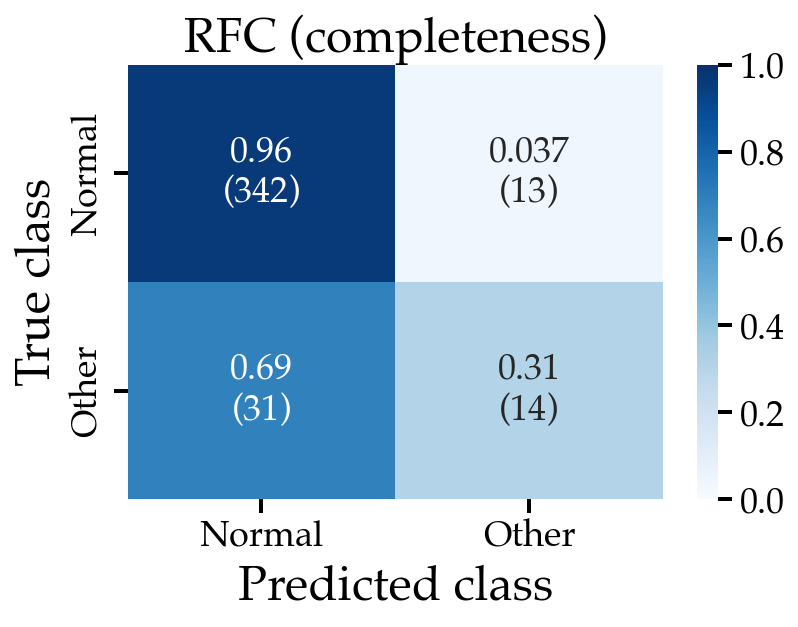

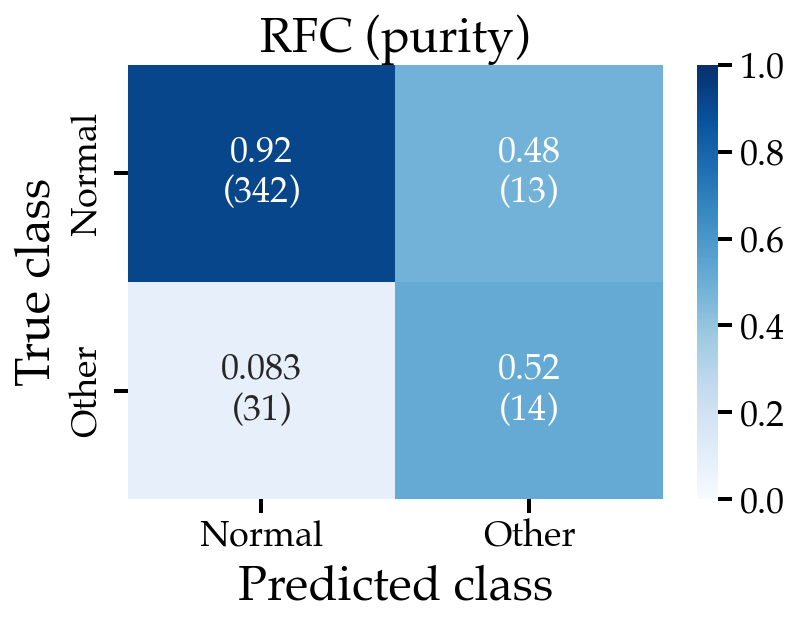

In [53]:
# Confusion matrices
title='RFC'
df = df2
true_labels = np.array(df['tns_cls'])
predicted_labels = np.array(df['RFC_best_cls'])#np.array(df['most_common_cls_ann=1-100']) # np.array(df['ann=1_tns_cls'])
# define the class labels
class_names = np.unique(true_labels)
nclasses = len(class_names)

# folder_path = f"../figures/confusion_matrix/{suffix}/grid_search_n_estimators={n_estimators}_max_depth={max_depth}_random_state={random_state}_max_features={max_features}_class_weight=1-1_noNoneCls/"
# if not os.path.exists(folder_path):
#     os.makedirs(folder_path)

KINDS = ['completeness', 'purity']
for KIND in KINDS:
    # Sims test set
    plot_conf_matrix(true_labels, predicted_labels, labels=class_names, 
             title=f'{title} ({KIND})', kind=KIND)
    #plt.savefig(f'{folder_path}/confmatrix_nclasses={nclasses}_noNone_{title}_{KIND}.jpg', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

In [25]:
df2_other =df2[df2['tns_cls'] == 'Other']
df2_other_cor = df2_other[df2_other['tns_cls'] == df2_other['RFC_best_cls']]
df2_other_inc = df2_other[df2_other['tns_cls'] != df2_other['RFC_best_cls']]

df2_other_inc

,feature_amplitude_magn_r,feature_anderson_darling_normal_magn_r,feature_beyond_1_std_magn_r,feature_beyond_2_std_magn_r,feature_cusum_magn_r,feature_inter_percentile_range_2_magn_r,feature_inter_percentile_range_10_magn_r,feature_inter_percentile_range_25_magn_r,feature_kurtosis_magn_r,feature_linear_fit_slope_magn_r,...,has_tns,tns_cls,spec_z,report_group,s1,s2,s3,Normal,Other,RFC_best_cls
ztf_object_id,,,,,,,,,,,,,,,,,,,,,
ZTF21acqyqwu,0.164925,0.191106,0.222222,0.000000,0.351634,0.329849,0.255836,0.119952,0.677669,0.011867,...,Yes_TNS,Other,0.042000,ATLAS,-0.498909,1.834771,1.366241,81.000000,19.000000,Normal
ZTF21abchjer,0.913735,0.840731,0.300000,0.000000,0.433554,1.827471,1.705356,1.144432,-1.258488,0.040391,...,Yes_TNS,Other,0.024617,ALeRCE,-2.587601,-2.852107,2.015551,75.000420,24.999580,Normal
ZTF20abtjjhb,1.216100,1.723425,0.212766,0.063830,0.379014,2.288193,1.320570,0.658627,1.810624,-0.005769,...,Yes_TNS,Other,0.064000,ALeRCE,1.095970,-0.752407,1.390395,57.033217,42.966783,Normal
ZTF21aaffxdt,0.090092,0.572517,0.444444,0.000000,0.266570,0.180183,0.172565,0.140915,-1.796589,-0.003439,...,Yes_TNS,Other,0.090000,ATLAS,2.616150,1.548226,1.418332,88.000000,12.000000,Normal
ZTF20actekrw,0.489840,1.396014,0.166667,0.083333,0.382213,0.979679,0.923296,0.357985,0.701300,-0.003793,...,Yes_TNS,Other,0.033000,ALeRCE,-2.508101,-1.007435,2.457370,61.000000,39.000000,Normal
ZTF20acyydkh,0.224917,0.229615,0.222222,0.000000,0.341828,0.449835,0.366381,0.194325,0.178001,0.008407,...,Yes_TNS,Other,0.133000,ATLAS,1.362269,0.836418,3.228479,75.000000,25.000000,Normal
ZTF20abvquuo,1.015534,1.125783,0.413793,0.000000,0.447048,2.024803,1.637210,1.180090,-1.405189,0.021116,...,Yes_TNS,Other,0.030000,ZTF,3.136287,-0.814260,-2.272558,68.017921,31.982079,Normal
ZTF19abstsvm,0.533802,0.952866,0.227273,0.045455,0.343511,1.067604,0.388201,0.271093,5.288960,0.003764,...,Yes_TNS,Other,0.039000,AMPEL,1.990464,-1.140887,1.279958,63.000000,37.000000,Normal
ZTF20acueziy,0.884608,0.583604,0.333333,0.000000,0.439915,1.769217,1.548727,1.222932,-1.761423,0.024822,...,Yes_TNS,Other,0.023303,ZTF,-2.017529,-2.077537,0.045917,80.000000,20.000000,Normal


In [26]:
print("Missed `anomalies' (labeled as Normal)")
for ob in df2_other_inc.index:
    print(f'https://alerce.online/object/{ob}', x_test_all.loc[ob].tns_cls)

Missed `anomalies' (labeled as Normal)
https://alerce.online/object/ZTF21acqyqwu SN Ib
https://alerce.online/object/ZTF21abchjer SN Ic-BL
https://alerce.online/object/ZTF20abtjjhb SN IIn
https://alerce.online/object/ZTF21aaffxdt SN IIn
https://alerce.online/object/ZTF20actekrw SN Ic
https://alerce.online/object/ZTF20acyydkh TDE
https://alerce.online/object/ZTF20abvquuo SN Ib
https://alerce.online/object/ZTF19abstsvm SN IIn
https://alerce.online/object/ZTF20acueziy SN Ic
https://alerce.online/object/ZTF20acusecr SN IIb
https://alerce.online/object/ZTF21acmrdga SN IIb
https://alerce.online/object/ZTF22aaaedas TDE
https://alerce.online/object/ZTF20aclnplo SN Ic
https://alerce.online/object/ZTF21abtdvpg SN IIn
https://alerce.online/object/ZTF20acgiglu SN IIb
https://alerce.online/object/ZTF20aczgmai SN IIn
https://alerce.online/object/ZTF21aaxtctv SN Ic
https://alerce.online/object/ZTF21aaxxihx SN Ic-BL
https://alerce.online/object/ZTF21aarasky SN IIb
https://alerce.online/object/ZTF20adad

ZTF21acqyqwu Other


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


12
https://alerce.online/object/ZTF21acqyqwu Other


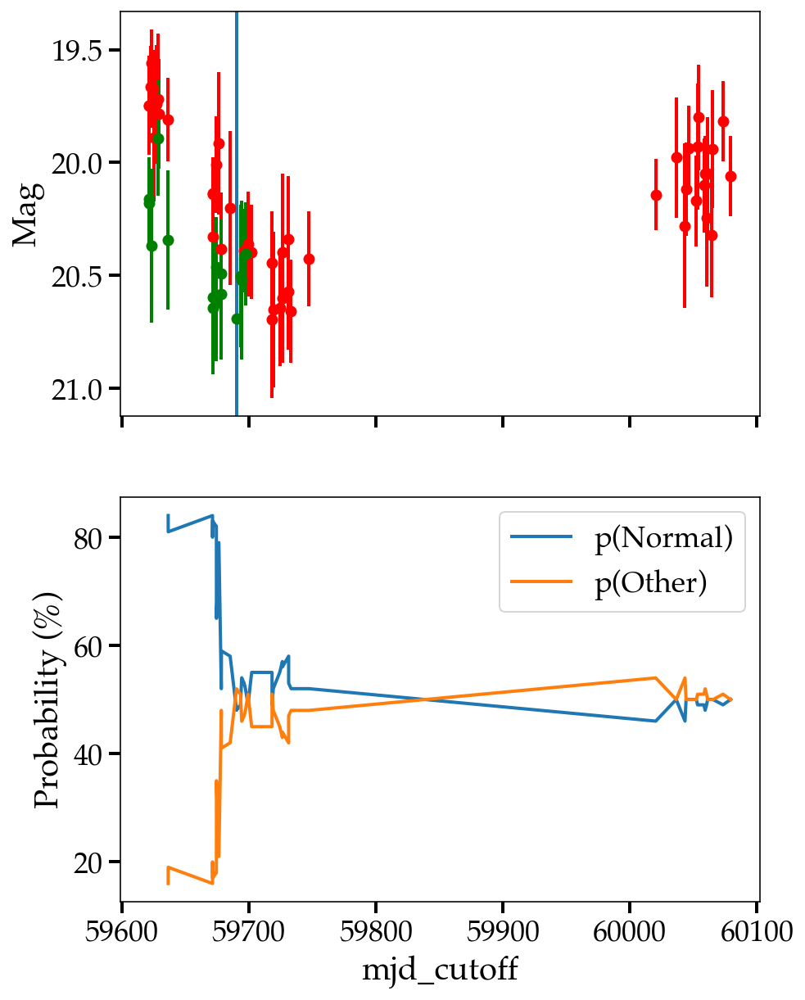

ZTF21abchjer Other


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


2
https://alerce.online/object/ZTF21abchjer Other


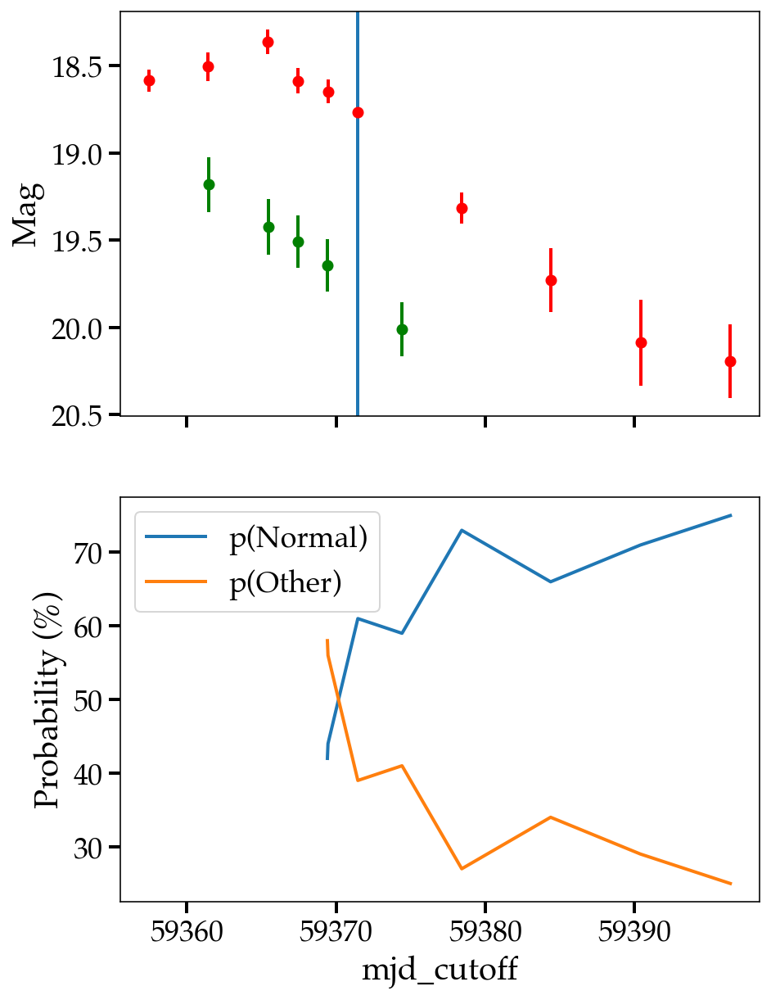

ZTF20abtjjhb Other
Prediction doesn't exceed anom_threshold of 50% for ZTF20abtjjhb.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF20abtjjhb Other


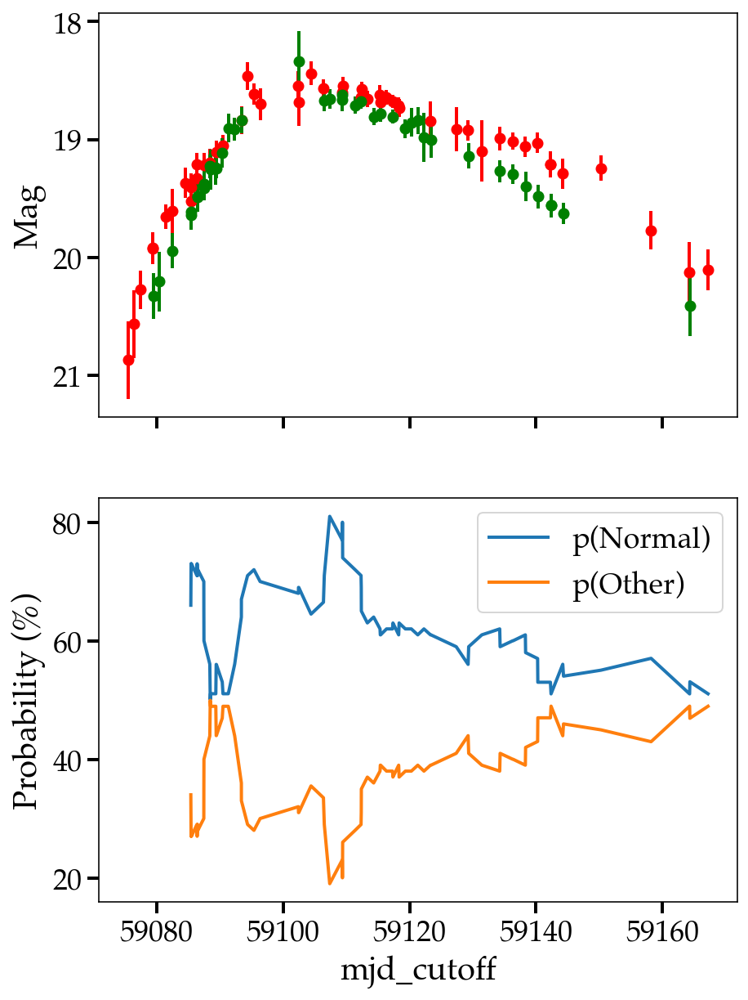

ZTF21aaffxdt Other
Prediction doesn't exceed anom_threshold of 50% for ZTF21aaffxdt.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF21aaffxdt Other


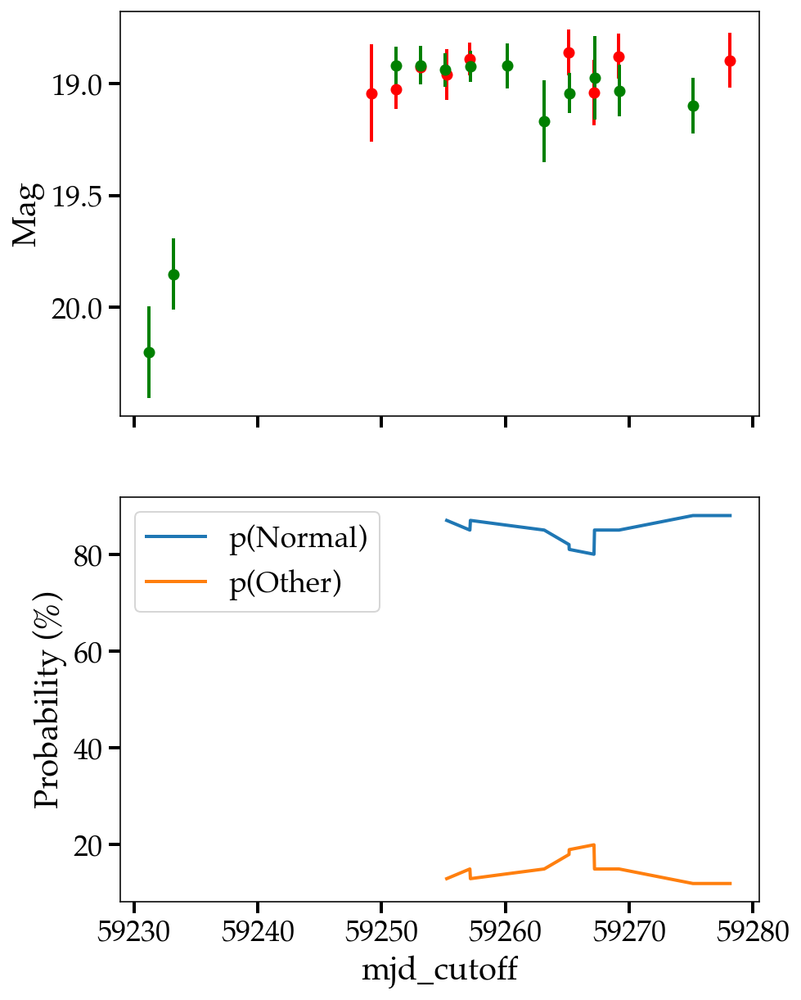

ZTF20actekrw Other


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


1
https://alerce.online/object/ZTF20actekrw Other


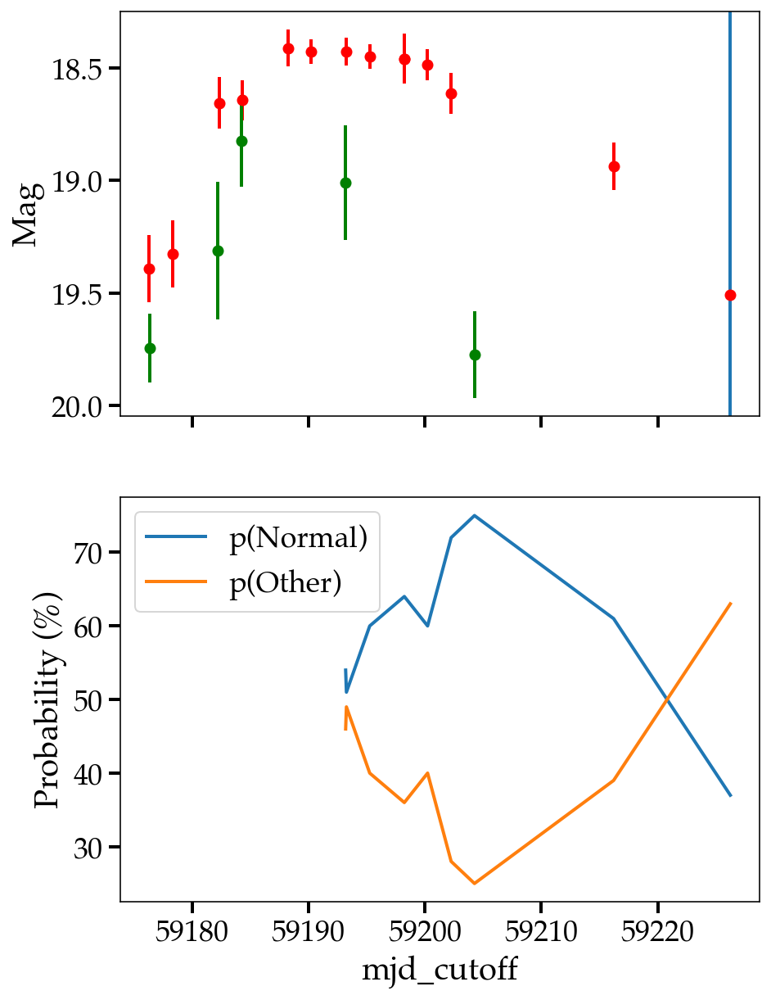

ZTF20acyydkh Other
Prediction doesn't exceed anom_threshold of 50% for ZTF20acyydkh.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF20acyydkh Other


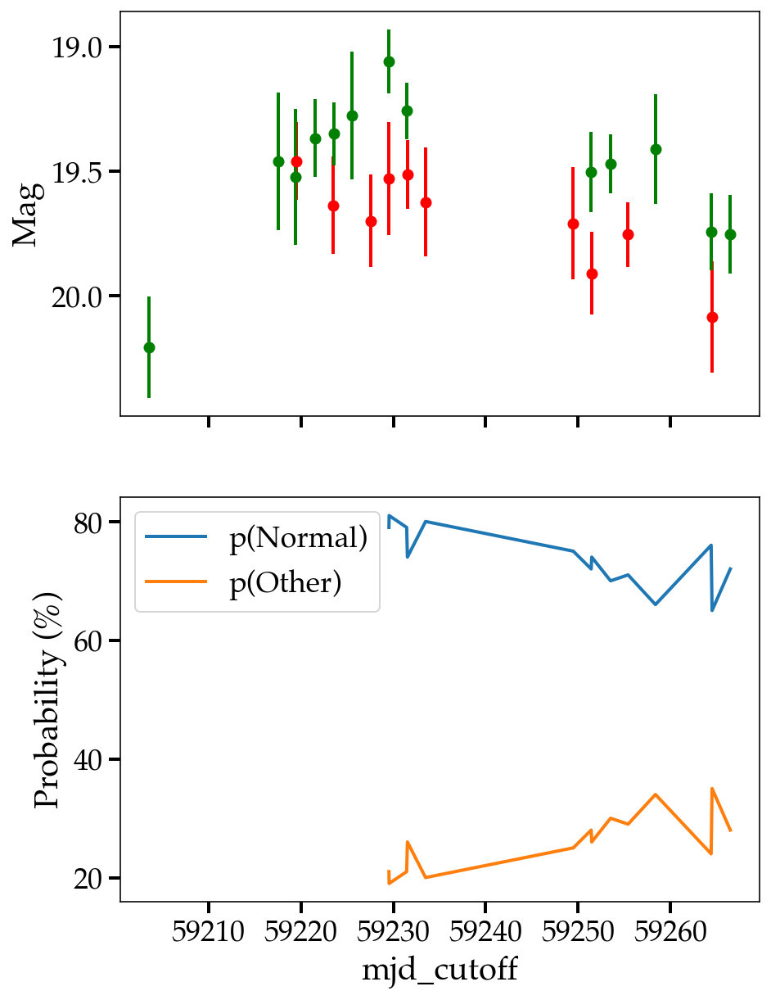

ZTF20abvquuo Other
Prediction doesn't exceed anom_threshold of 50% for ZTF20abvquuo.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished


0
https://alerce.online/object/ZTF20abvquuo Other


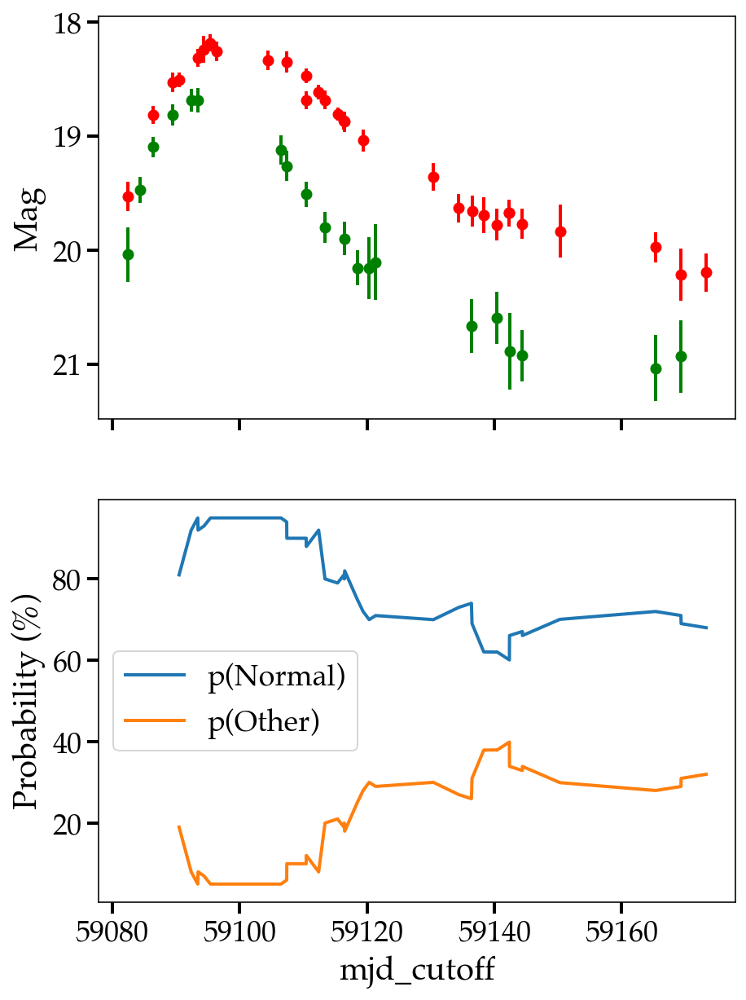

ZTF19abstsvm Other
Prediction doesn't exceed anom_threshold of 50% for ZTF19abstsvm.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF19abstsvm Other


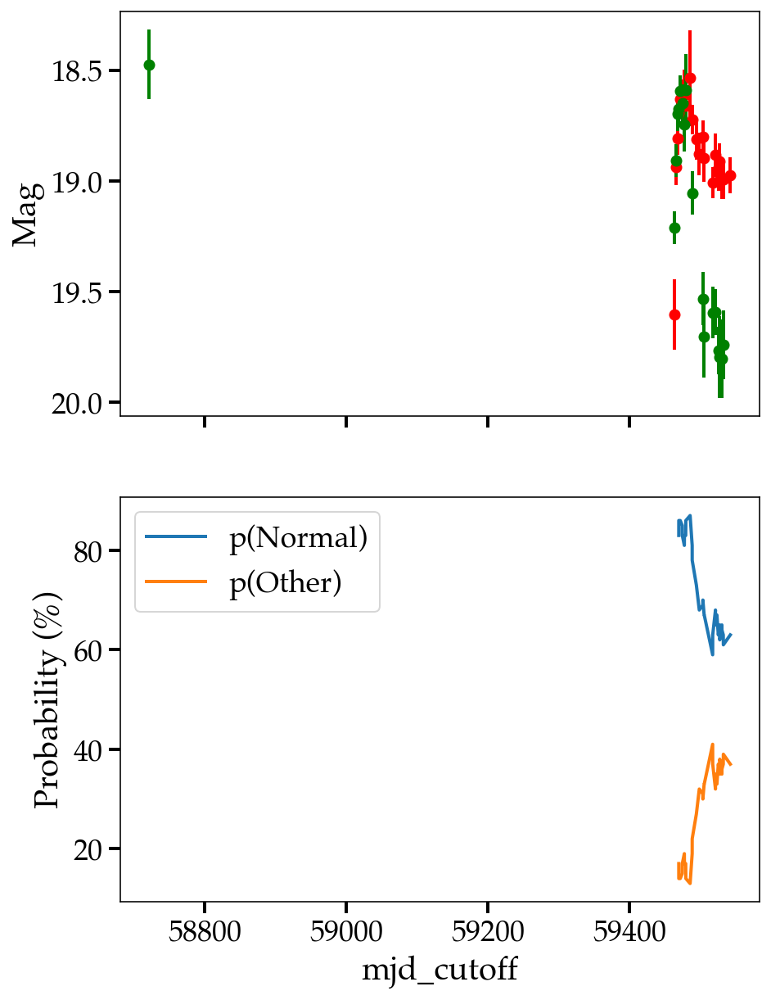

ZTF20acueziy Other
Prediction doesn't exceed anom_threshold of 50% for ZTF20acueziy.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF20acueziy Other


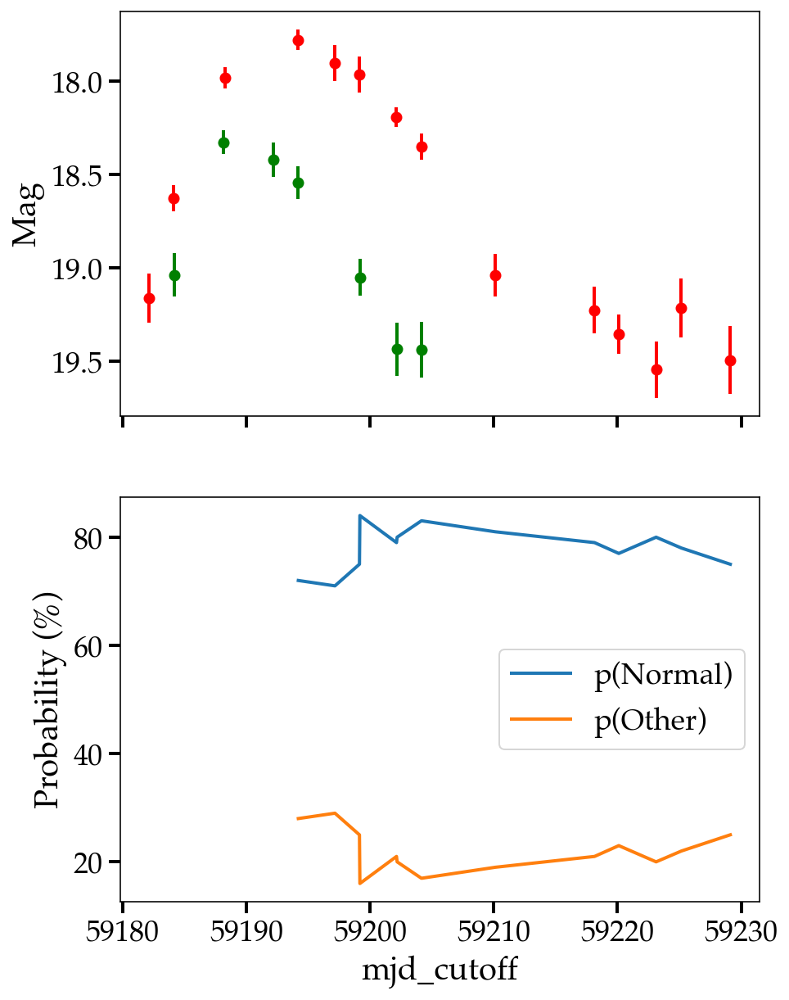

ZTF20acusecr Other
Prediction doesn't exceed anom_threshold of 50% for ZTF20acusecr.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF20acusecr Other


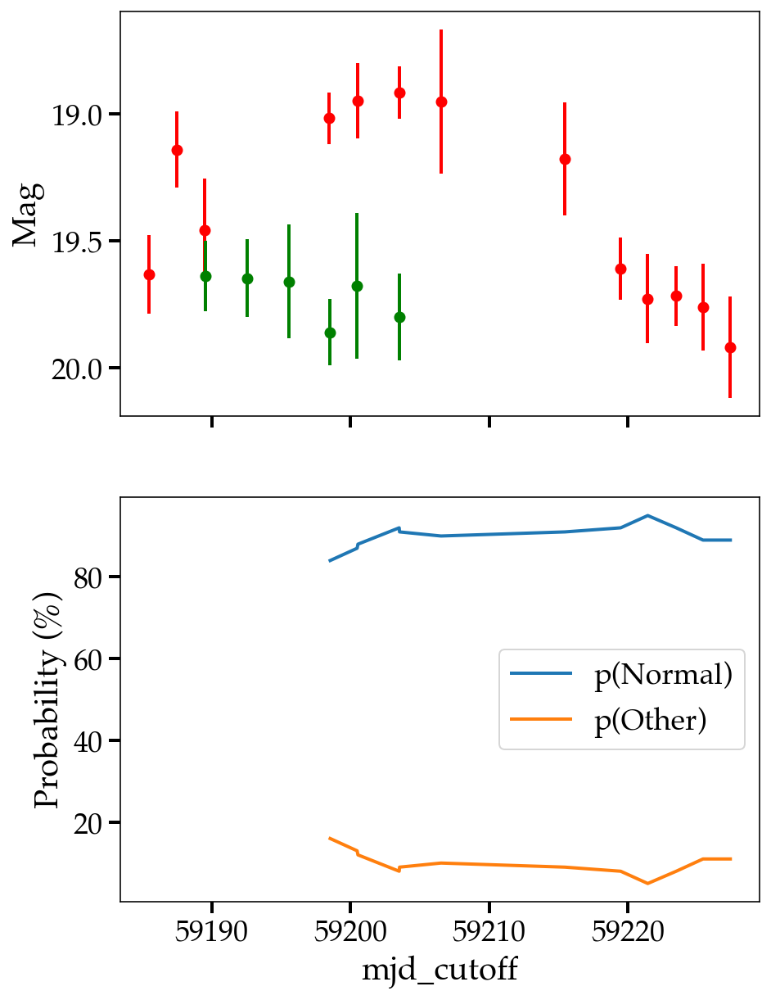

ZTF21acmrdga Other
Prediction doesn't exceed anom_threshold of 50% for ZTF21acmrdga.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF21acmrdga Other


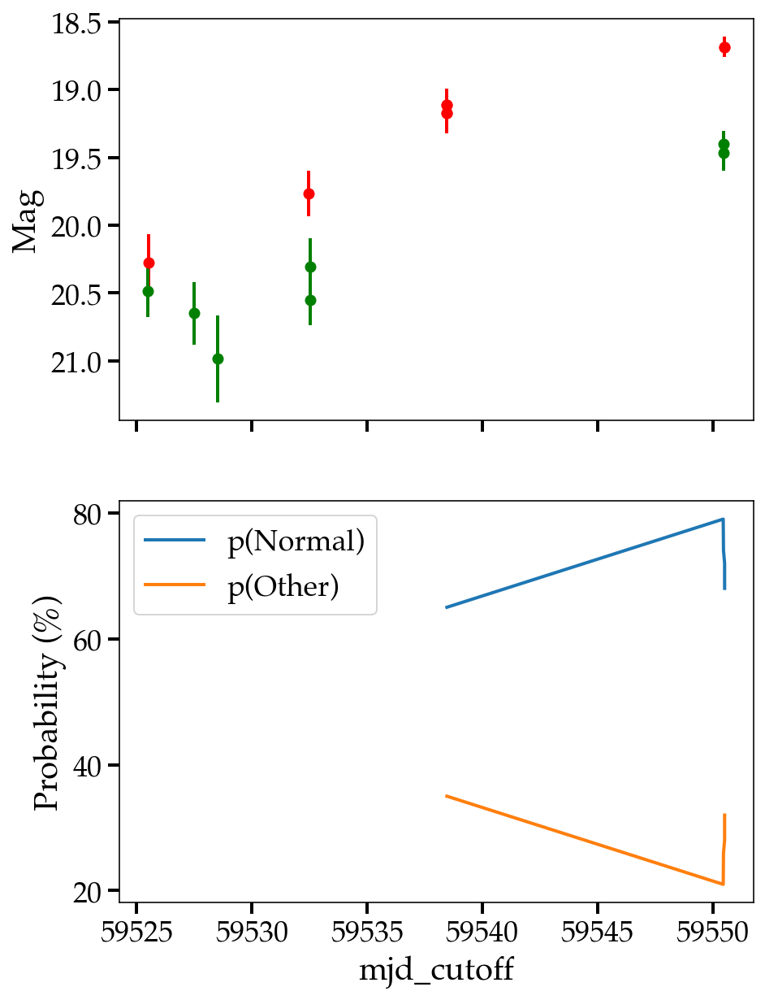

ZTF22aaaedas Other


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


1
https://alerce.online/object/ZTF22aaaedas Other


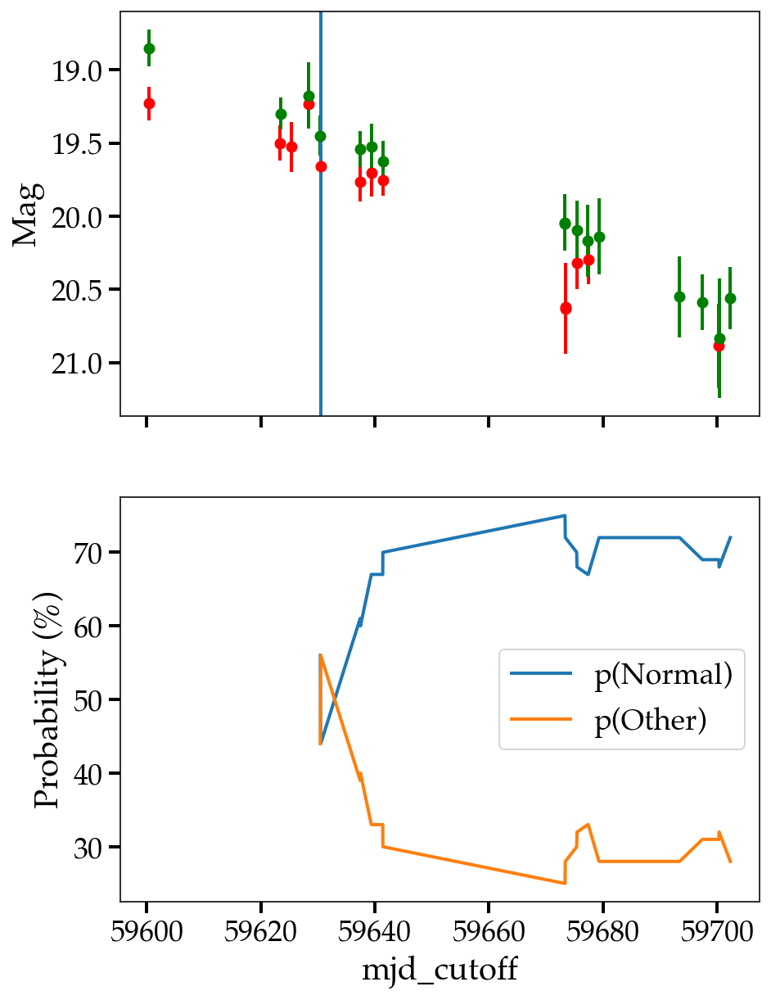

ZTF20aclnplo Other
Prediction doesn't exceed anom_threshold of 50% for ZTF20aclnplo.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF20aclnplo Other


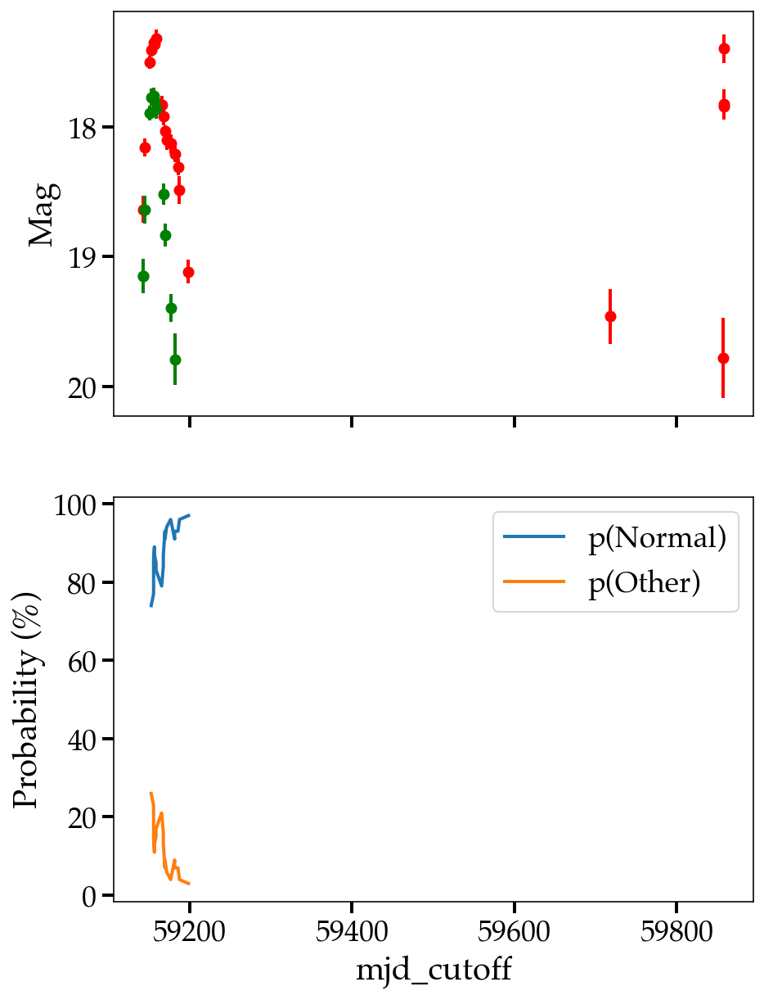

ZTF21abtdvpg Other


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished


52
https://alerce.online/object/ZTF21abtdvpg Other


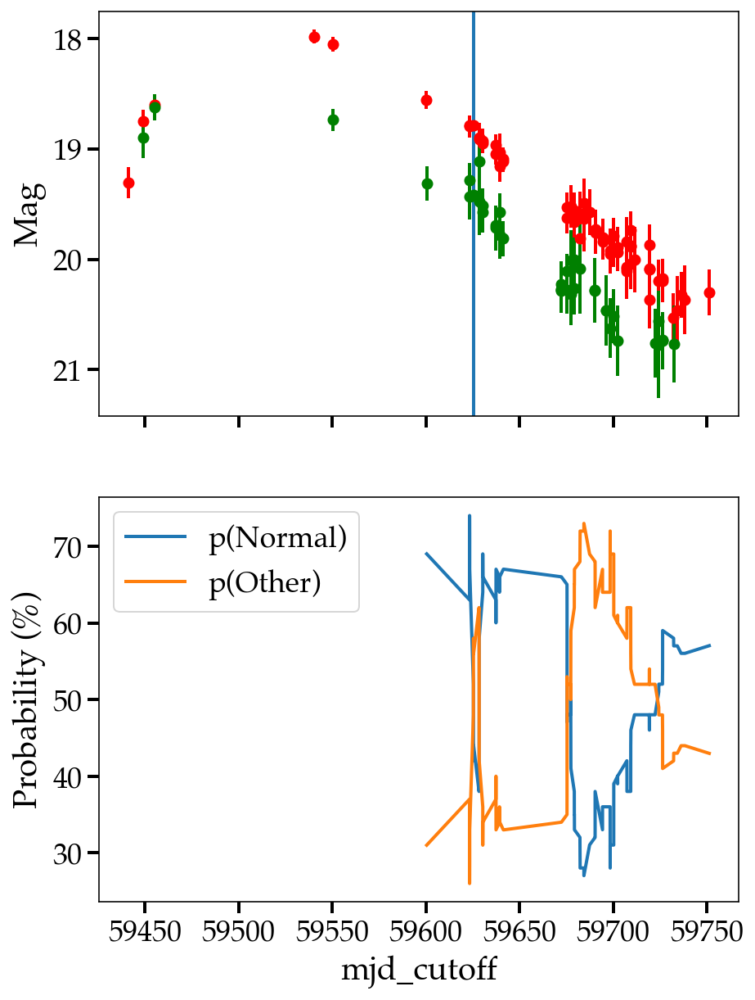

ZTF20acgiglu Other
Prediction doesn't exceed anom_threshold of 50% for ZTF20acgiglu.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF20acgiglu Other


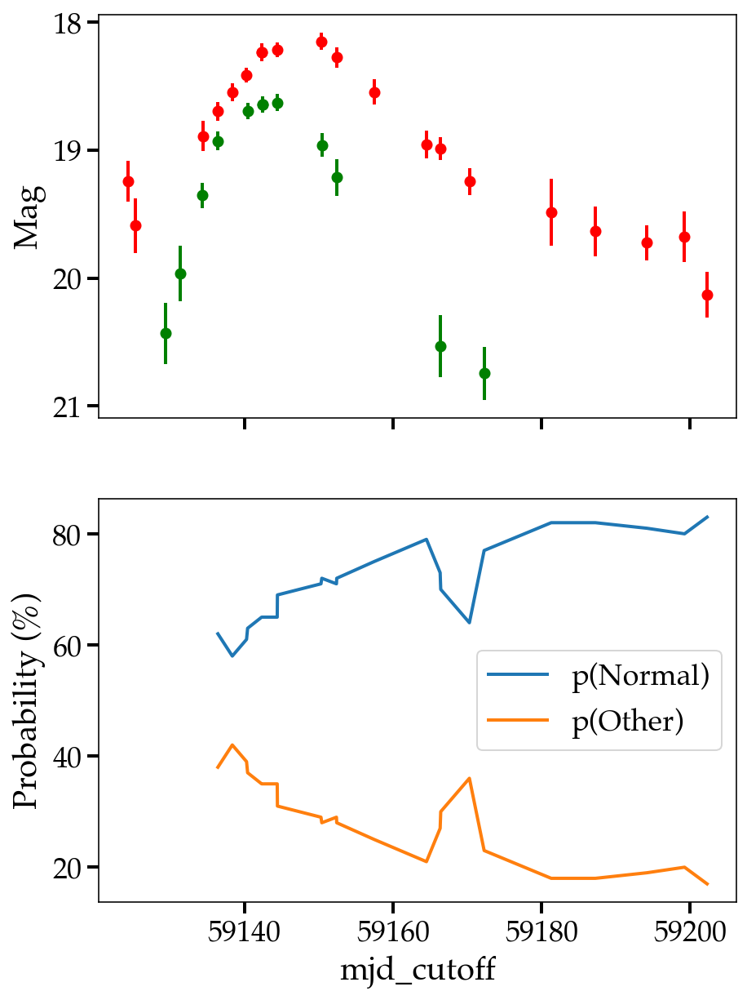

ZTF20aczgmai Other


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


4
https://alerce.online/object/ZTF20aczgmai Other


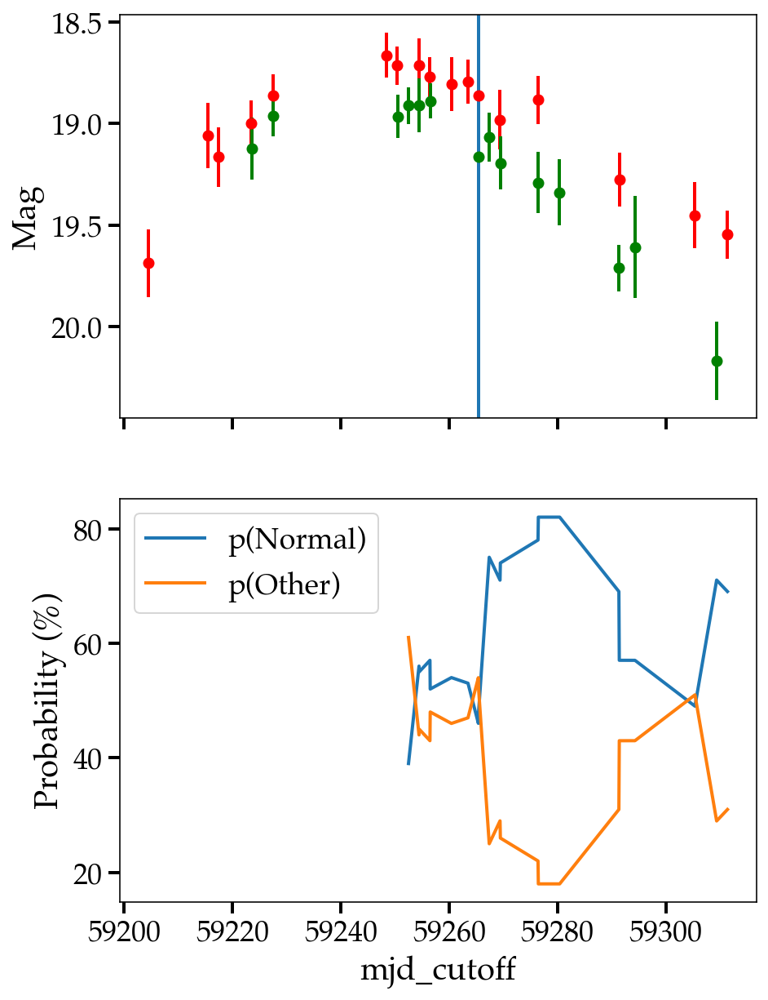

ZTF21aaxtctv Other
Prediction doesn't exceed anom_threshold of 50% for ZTF21aaxtctv.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF21aaxtctv Other


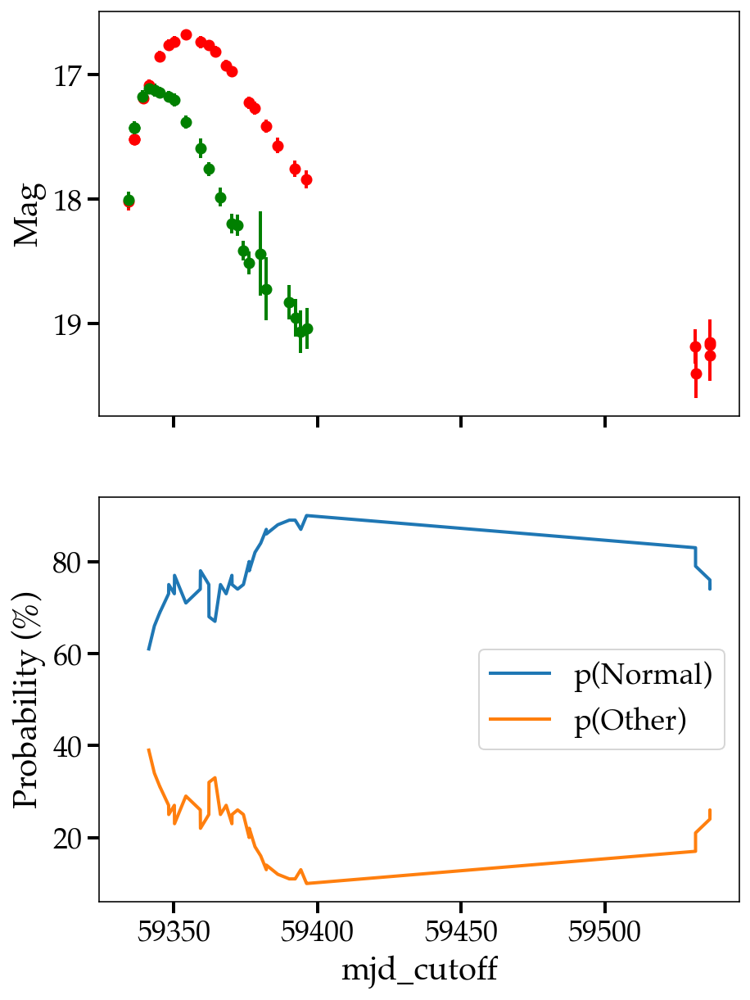

ZTF21aaxxihx Other
Prediction doesn't exceed anom_threshold of 50% for ZTF21aaxxihx.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF21aaxxihx Other


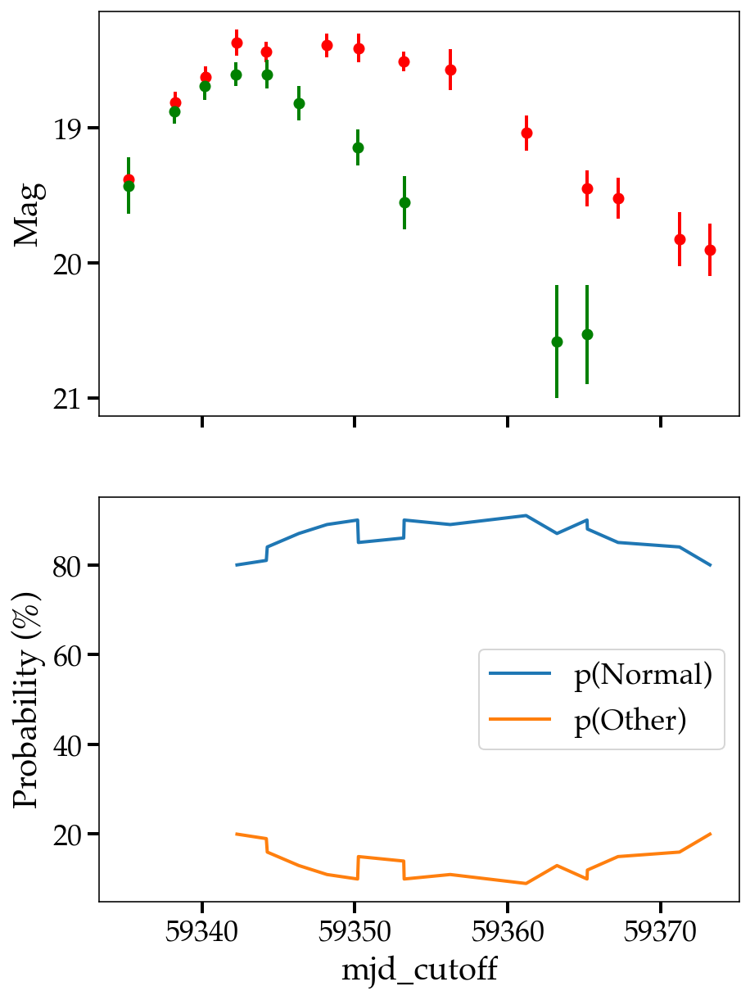

ZTF21aarasky Other
Prediction doesn't exceed anom_threshold of 50% for ZTF21aarasky.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF21aarasky Other


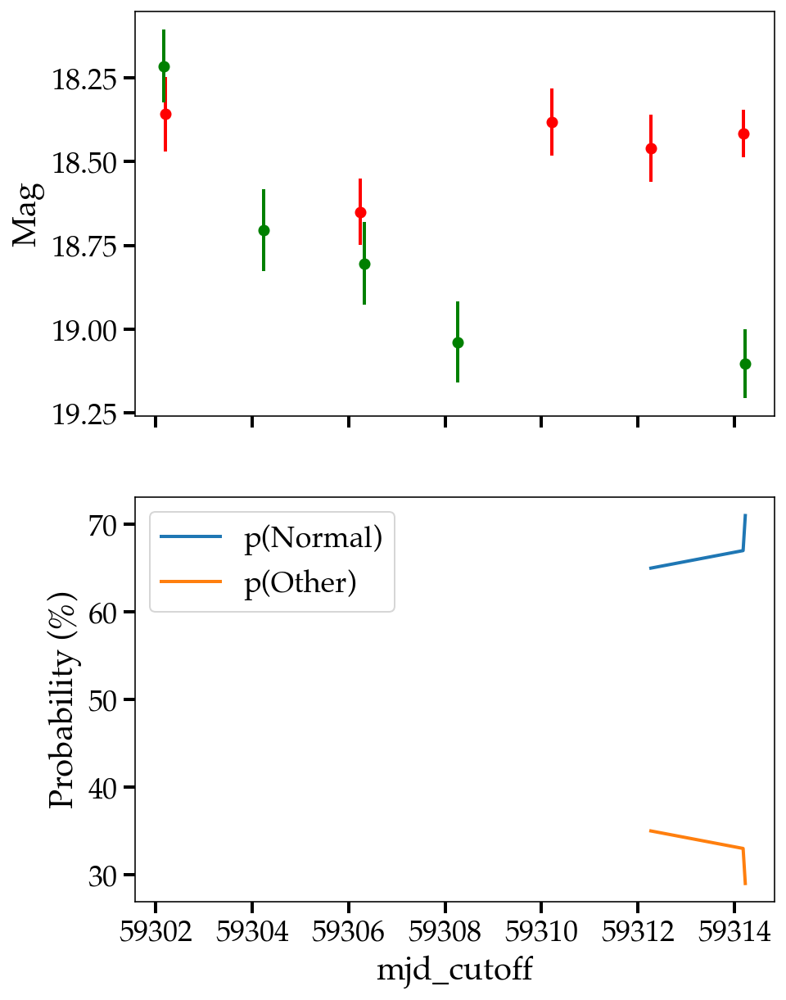

ZTF20adadrhw Other
Prediction doesn't exceed anom_threshold of 50% for ZTF20adadrhw.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF20adadrhw Other


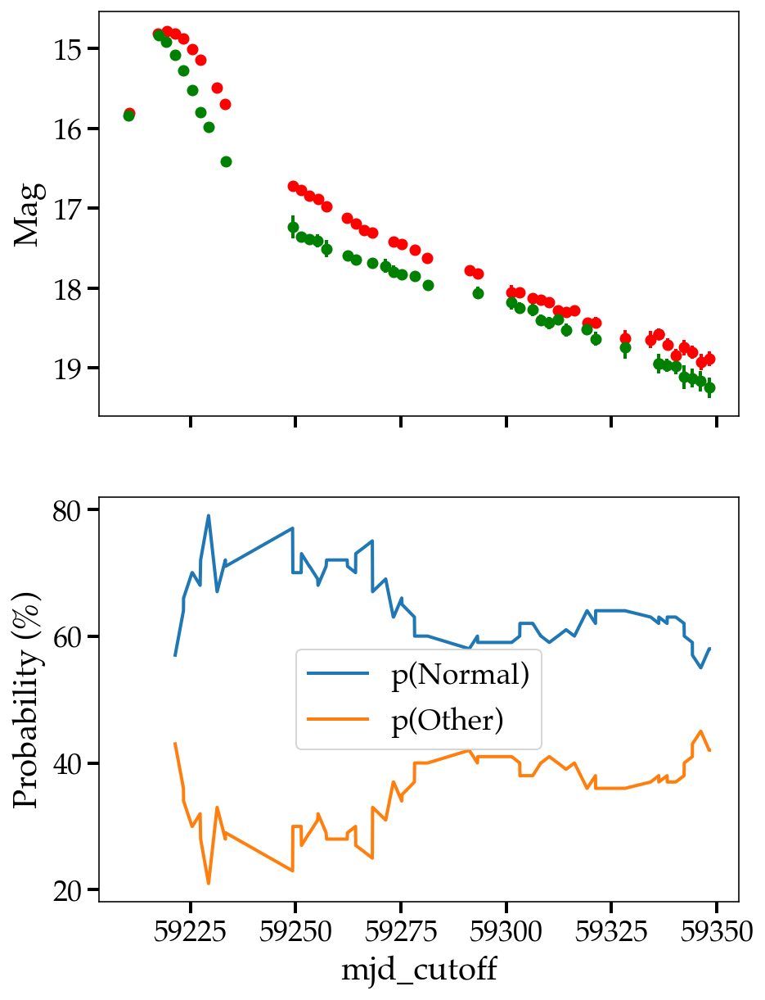

ZTF21aadatfg Other
Prediction doesn't exceed anom_threshold of 50% for ZTF21aadatfg.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished


0
https://alerce.online/object/ZTF21aadatfg Other


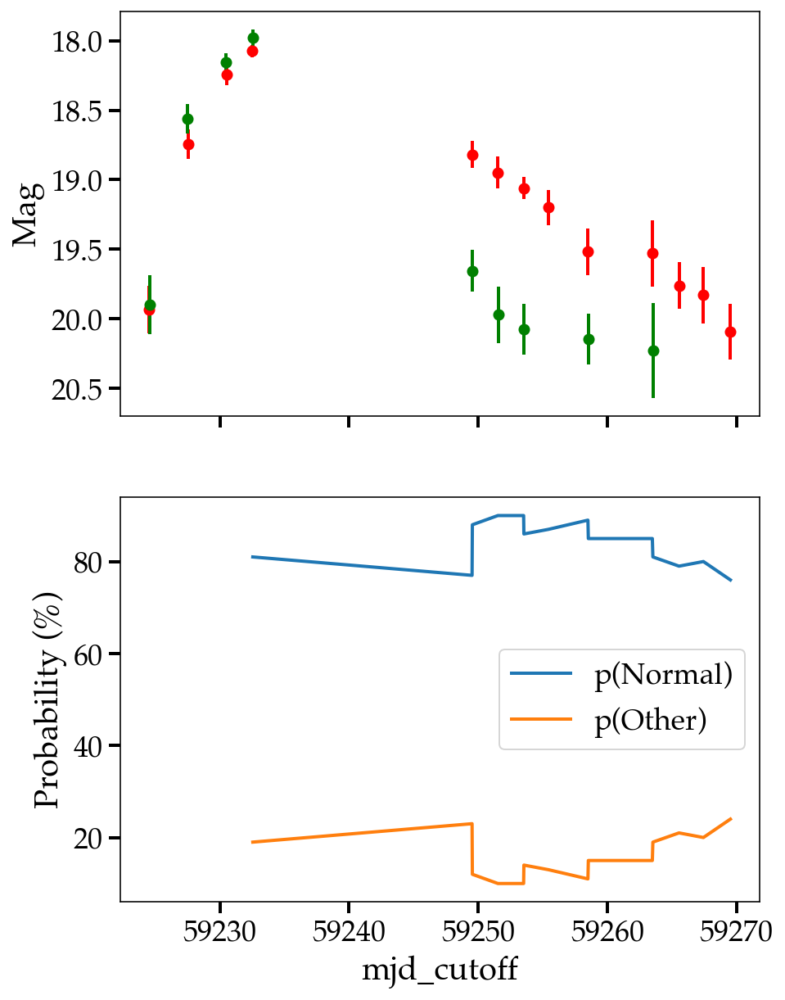

ZTF21aaoqbbw Other


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


2
https://alerce.online/object/ZTF21aaoqbbw Other


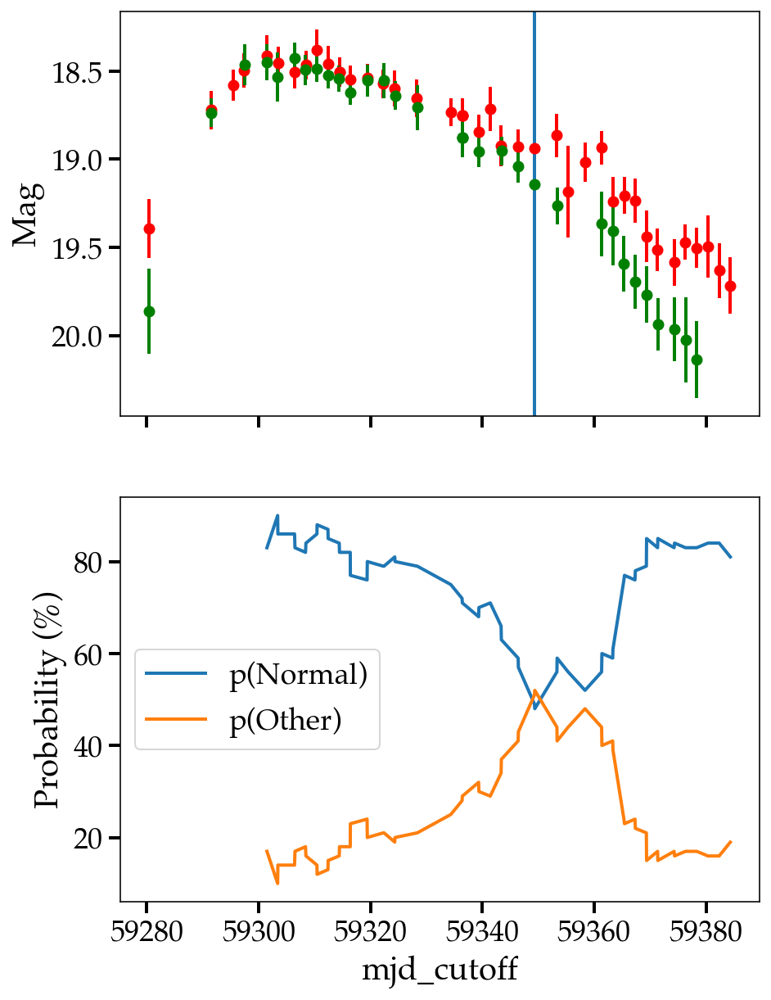

ZTF20aceokvr Other
Prediction doesn't exceed anom_threshold of 50% for ZTF20aceokvr.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF20aceokvr Other


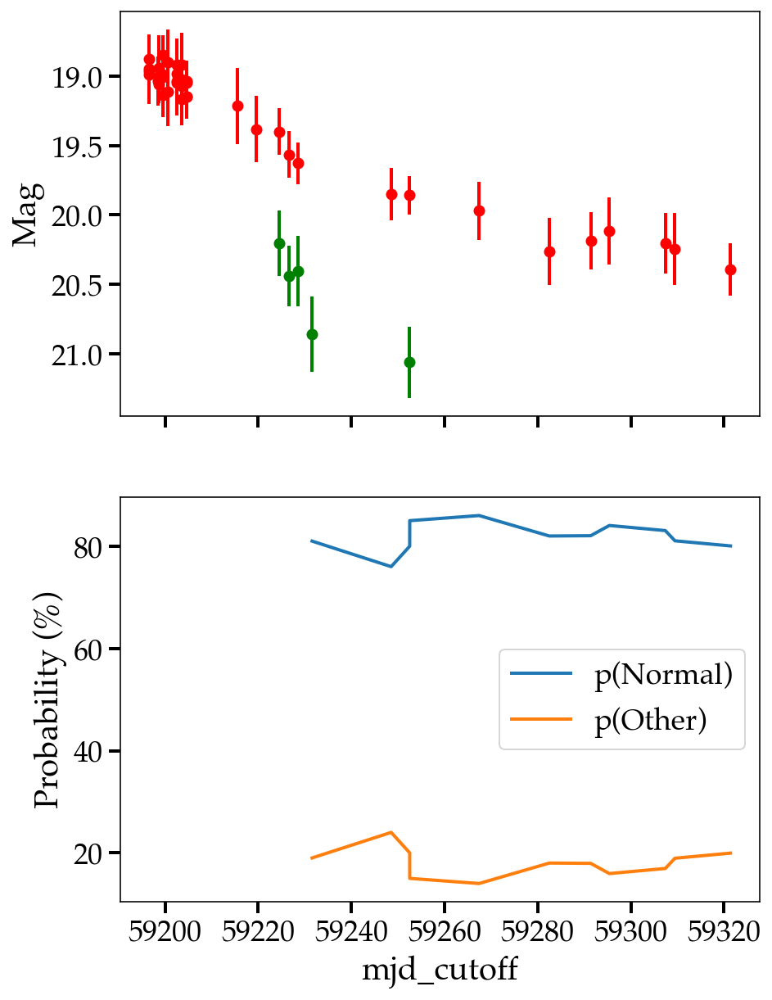

ZTF20acwofhd Other
Prediction doesn't exceed anom_threshold of 50% for ZTF20acwofhd.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF20acwofhd Other


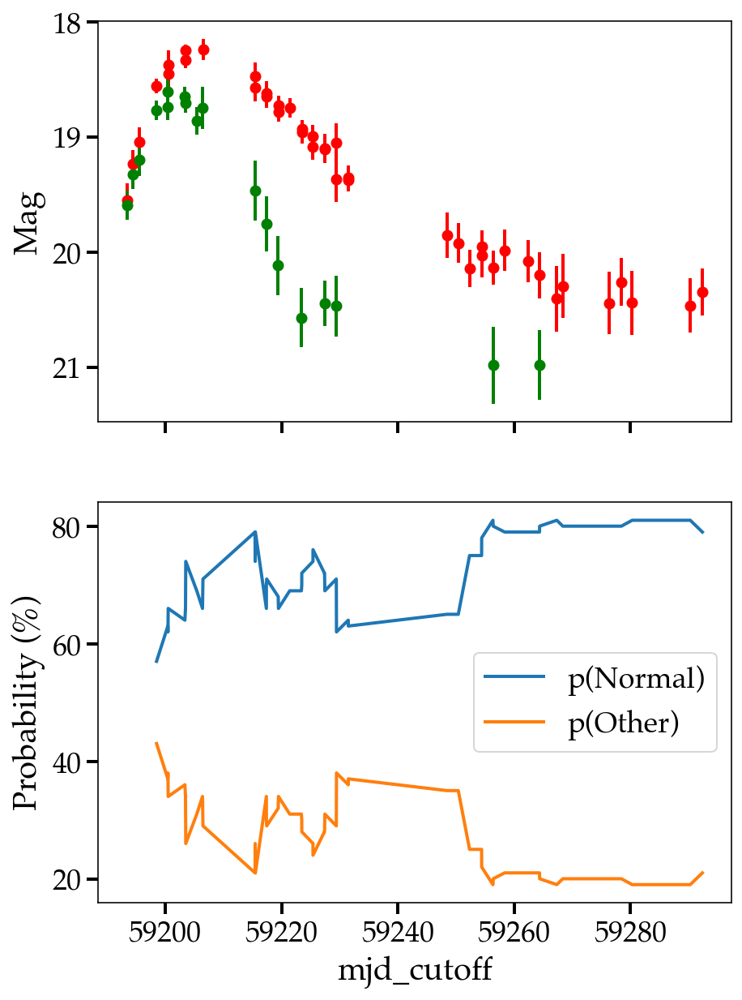

ZTF21aayonfd Other
Prediction doesn't exceed anom_threshold of 50% for ZTF21aayonfd.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF21aayonfd Other


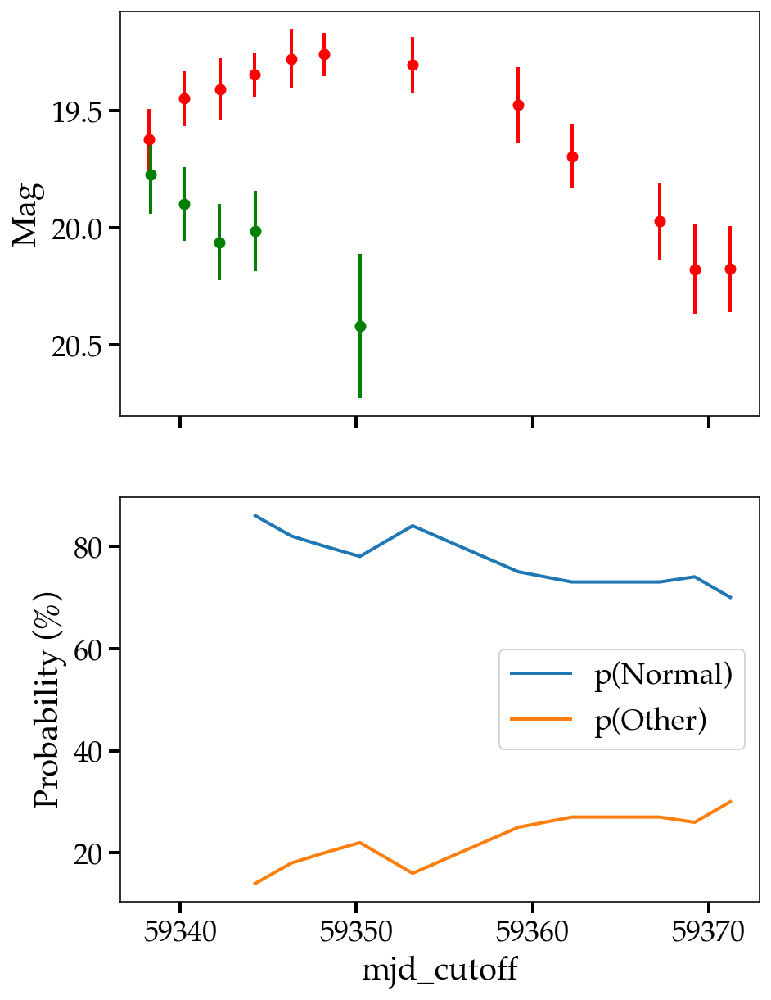

ZTF20acounxo Other


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


1
https://alerce.online/object/ZTF20acounxo Other


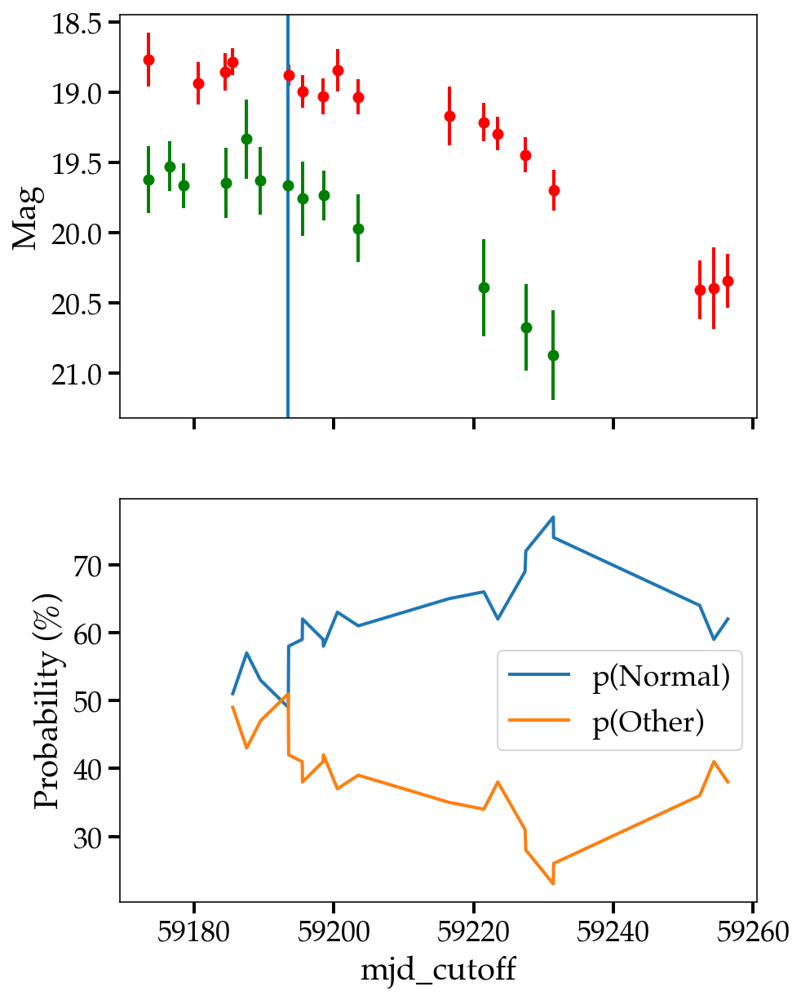

ZTF21aaradzm Other
Prediction doesn't exceed anom_threshold of 50% for ZTF21aaradzm.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF21aaradzm Other


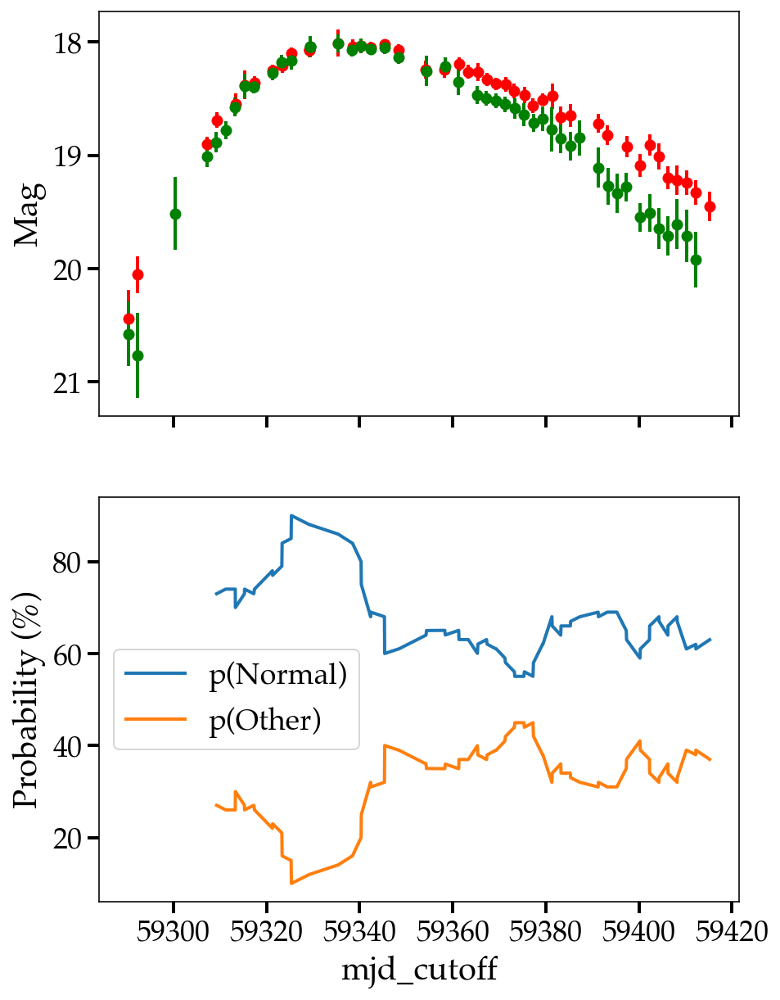

ZTF21aaxvcmj Other
Prediction doesn't exceed anom_threshold of 50% for ZTF21aaxvcmj.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished


0
https://alerce.online/object/ZTF21aaxvcmj Other


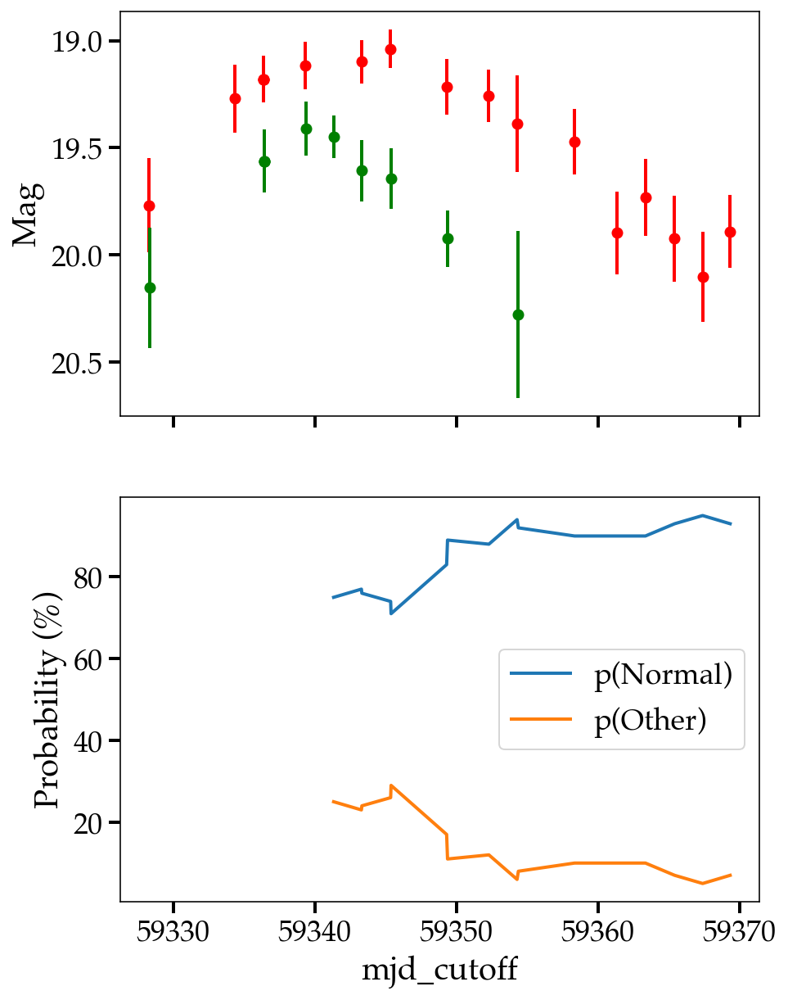

ZTF21acqvuyb Other
Prediction doesn't exceed anom_threshold of 50% for ZTF21acqvuyb.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF21acqvuyb Other


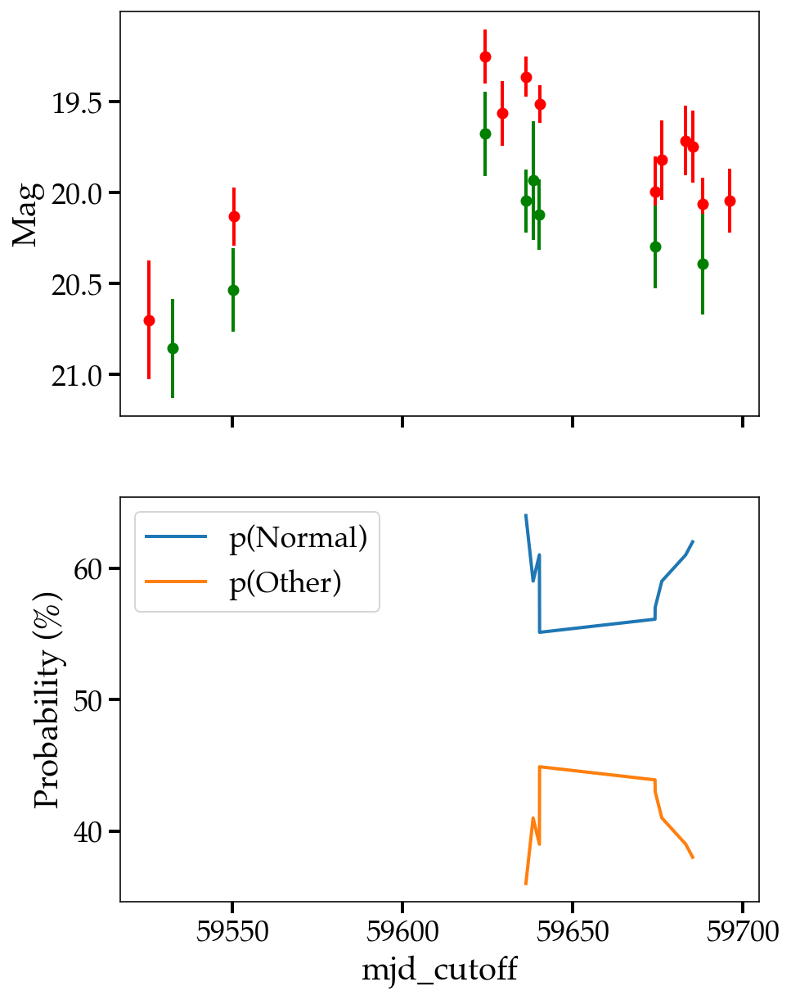

ZTF21aahfjrr Other
Prediction doesn't exceed anom_threshold of 50% for ZTF21aahfjrr.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF21aahfjrr Other


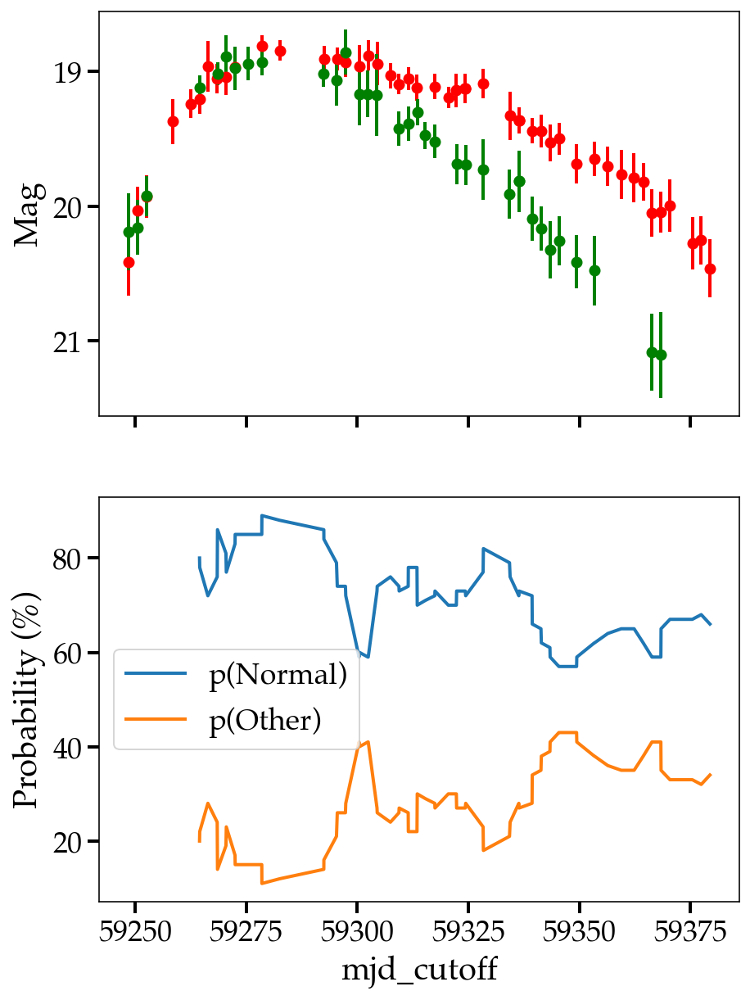

ZTF21acjmvhx Other
Prediction doesn't exceed anom_threshold of 50% for ZTF21acjmvhx.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF21acjmvhx Other


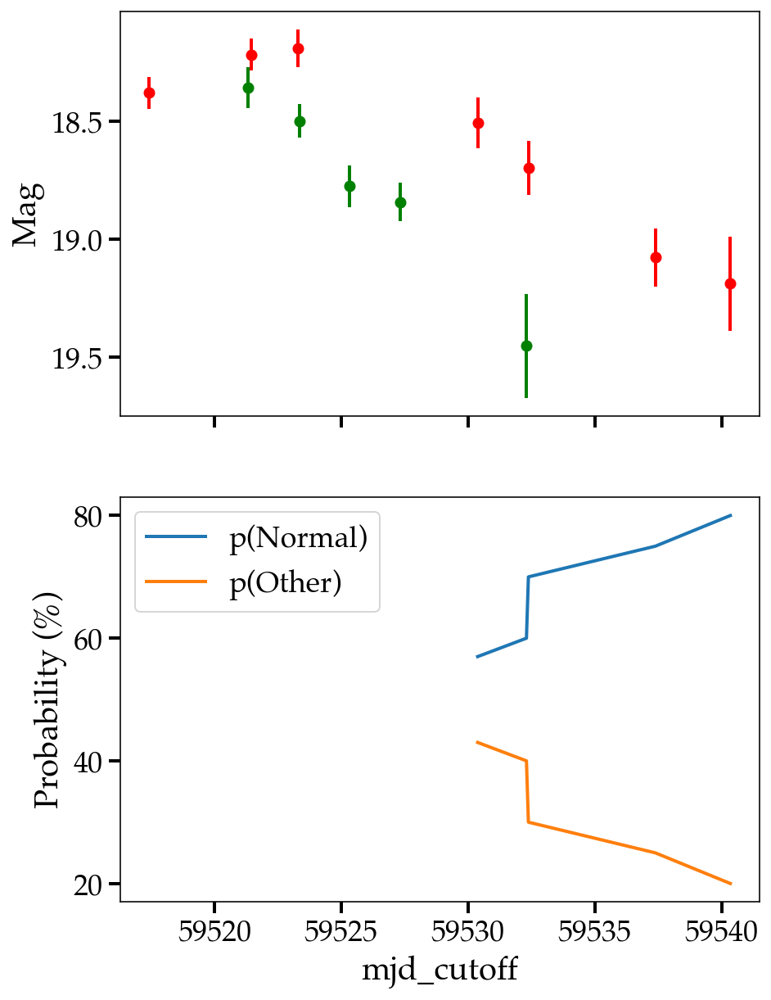

In [27]:
plot_RFC_prob_vs_lc(dataframe=df2_other_inc, anom_thresh=50)

Missed `anomalies` (labeled as Normal). But flag which ones are anomalous via timeseries/ func of time!
https://alerce.online/object/ZTF21acqyqwu SN Ib - NOT. 2021aghp; z=0.042. SN happened Dec 2021 (ATLAS) but first public ZTF obs are Feb 2022 (well on decline). So LC doesn't look Ib like at all. Understandable.
https://alerce.online/object/ZTF21abchjer SN Ic-BL - ANOM. 2021nc; z=0.02461. 2 anomalous epochs at beginning of features calc. 18.7mag.
https://alerce.online/object/ZTF20abtjjhb SN IIn - NOT. 2020rno; z=0.064. But few epochs SUPER CLOSE to 50% anom thresh. Would be anom with slightly lower threshold. Faint host gal.
https://alerce.online/object/ZTF21aaffxdt SN IIn - NOT. 2021bmv; z= 0.09. Only slight LC rise and at peak. No decline. Faint host gal. Kinda understandable.
https://alerce.online/object/ZTF20actekrw SN Ic - ANOM. 2020aauc; z=0.033. Anom at last epoch (19.5 mag). 
https://alerce.online/object/ZTF20acyydkh TDE - NOT. 2021ack; z=0.133. ? Always high normal classification...
https://alerce.online/object/ZTF20abvquuo SN Ib - NOT. 2020sai; z=0.03. ? Nice Ib... Small, faint elliptical. Always medium normal classification...
https://alerce.online/object/ZTF19abstsvm SN IIn - NOT. 2021yaz; z=0.039 ? Decent IIn... Always high normal classification...
https://alerce.online/object/ZTF20acueziy SN Ic - NOT. 2020abpa; z=0.023303 ? Nice Ic. Always high normal classification... Big spiral.
https://alerce.online/object/ZTF20acusecr SN IIb - NOT. 2020abkp; z=0.030884. ? decent IIb. Always high normal classification... M/MS elliptical.
https://alerce.online/object/ZTF21acmrdga SN IIb - NOT. 2021adud; z=0.034. Only LC rise. Understandable. no obvious second peak. Big elliptical. 
https://alerce.online/object/ZTF22aaaedas TDE - ANOM. 2022rz; z=0.107. 1 anomalous epochs at beginning of features calc, which is on LC decline (disc at decline); 19.5mag. 
https://alerce.online/object/ZTF20aclnplo SN Ic - NOT. 2020xpn; z=0.0347. ? Nice Ic. Always high normal classification... M/ML elliptical.
https://alerce.online/object/ZTF21abtdvpg SN IIn - ANOM. 2021waf; z=0.1265. Tagged after peak but earlier on in LC, at 19mag. Long lived after. 52 total anom epochs.
https://alerce.online/object/ZTF20acgiglu SN IIb - NOT. 2020urc; z=0.026728. ? Nice IIb. Always high normal. big spiral.
https://alerce.online/object/ZTF20aczgmai SN IIn - ANOM. 2020aeuv; z=0.042843. 2 anomalous epochs at beginning of features calc. 18.75mag, at peak.
https://alerce.online/object/ZTF21aaxtctv SN Ic - NOT. 2021krf; z=0.01356. ? Nice Ic. Always high normal classification...
https://alerce.online/object/ZTF21aaxxihx SN Ic-BL - NOT. 2021ktv; z=0.06. ? Nice Ic-BL. Always high normal classification...LSB host.
https://alerce.online/object/ZTF21aarasky SN IIb - NOT. 2021hlv; z=0.021698. Only 2 epochs of extracted feature data.
https://alerce.online/object/ZTF20adadrhw SN Ic - NOT. 2020adow; z=0.0075050001. ? Nice Ic. But can be found by mag cuts (15 mag)
https://alerce.online/object/ZTF21aadatfg SN Ic-BL - NOT. 2021xv; z=0.05. ? Nice Ic-BL. Always high normal classification...LSB host. Big gap after peak tho.
https://alerce.online/object/ZTF21aaoqbbw SN IIn - ANOM. 2021ezt; z=0.050162. 2 anom epochs. 19 mag, 20d after peak.
https://alerce.online/object/ZTF20aceokvr SN IIn - NOT. 2020uaq; z=0.115. Red, only decline of LC.
https://alerce.online/object/ZTF20acwofhd SN Ic - NOT. 2020acfp; z=0.032816. ? Nice Ic. Always high normal classification...spiral host
https://alerce.online/object/ZTF21aayonfd SN Ic - NOT. 2021lei; z=0.112 ? Nice Ic. Always high normal classification...LSB host
https://alerce.online/object/ZTF20acounxo SN IIn - ANOM. 2020aatv; z=0.019153. Early in feature extract, just after peak. 19mag.
https://alerce.online/object/ZTF21aaradzm SN IIn - NOT. 2021hur; z=0.03. ? Nice IIn.
https://alerce.online/object/ZTF21aaxvcmj SN Ib - NOT. 2021ksr; z=0.053. ? Nice Ib. Always high normal classification...
https://alerce.online/object/ZTF21acqvuyb SLSN-II - NOT. 2022akb; z=0.229. ? Kinda gappy but normal SLSN. LSB host.
https://alerce.online/object/ZTF21aahfjrr SN IIn - NOT. 2021bwf; z=0.194. ? Nice IIn.
https://alerce.online/object/ZTF21acjmvhx SN Ic-BL - NOT. 2021acpm; z=0.042. ? Nice Ic-BL. Always high normal classification. No real rise tho.

31 "other" objects by TNS label missed by RFC for full LC.
__________
7 tagged anomalous via timeseries (0 for full LC). 
* 4 SN IIn, 
* 1 TDE, 
* 1 Ic,
* 1 Ic-BL.

24 still missed by timeseries
* 1 SLSN-II,
* 6 SN IIn, 
* 4 SN IIb, 
* 1 TDE, 
* 3 Ib,
* 6 Ic,
* 3 Ic-BL.

In [28]:
df2_other_inc.loc['ZTF20aczgmai'] # new 2023 obs after adam's feature tar. 

feature_amplitude_magn_r                   0.511466
feature_anderson_darling_normal_magn_r     0.864766
feature_beyond_1_std_magn_r                0.235294
feature_beyond_2_std_magn_r                0.058824
feature_cusum_magn_r                       0.398861
                                            ...    
s2                                        -1.963357
s3                                         3.036371
Normal                                    69.018971
Other                                     30.981029
RFC_best_cls                                 Normal
Name: ZTF20aczgmai, Length: 130, dtype: object

In [29]:
df2_other_inc.loc['ZTF21acqyqwu'] # new 2023 obs after adam's feature tar. 

feature_amplitude_magn_r                  0.164925
feature_anderson_darling_normal_magn_r    0.191106
feature_beyond_1_std_magn_r               0.222222
feature_beyond_2_std_magn_r                    0.0
feature_cusum_magn_r                      0.351634
                                            ...   
s2                                        1.834771
s3                                        1.366241
Normal                                        81.0
Other                                         19.0
RFC_best_cls                                Normal
Name: ZTF21acqyqwu, Length: 130, dtype: object

In [30]:
df2_other_inc.loc['ZTF20actekrw'] # one epoch behind the timeseries extracted one. Should be "anom"

feature_amplitude_magn_r                   0.48984
feature_anderson_darling_normal_magn_r    1.396014
feature_beyond_1_std_magn_r               0.166667
feature_beyond_2_std_magn_r               0.083333
feature_cusum_magn_r                      0.382213
                                            ...   
s2                                       -1.007435
s3                                         2.45737
Normal                                        61.0
Other                                         39.0
RFC_best_cls                                Normal
Name: ZTF20actekrw, Length: 130, dtype: object

In [31]:
print("Correctly flagged `anomalies' (labeled as Other)")
for ob in df2_other_cor.index:
    print(f'https://alerce.online/object/{ob}', x_test_all.loc[ob].tns_cls)

Correctly flagged `anomalies' (labeled as Other)
https://alerce.online/object/ZTF20abwxywy SN Ic
https://alerce.online/object/ZTF21aafmkjk SN IIn
https://alerce.online/object/ZTF21aaabwfu SN IIb
https://alerce.online/object/ZTF21aautijg SN IIn
https://alerce.online/object/ZTF20acxqxyw SN Ib
https://alerce.online/object/ZTF21abcgnqn TDE
https://alerce.online/object/ZTF18acvgjqv SN IIn
https://alerce.online/object/ZTF21abaxaqq TDE
https://alerce.online/object/ZTF18acaqdaa TDE
https://alerce.online/object/ZTF21aaaokyp TDE
https://alerce.online/object/ZTF21aapvvtb TDE
https://alerce.online/object/ZTF20acnznms SLSN-II
https://alerce.online/object/ZTF19aaadwfi SLSN-II
https://alerce.online/object/ZTF20acwytxn TDE


ZTF20abwxywy Other


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


18
https://alerce.online/object/ZTF20abwxywy Other


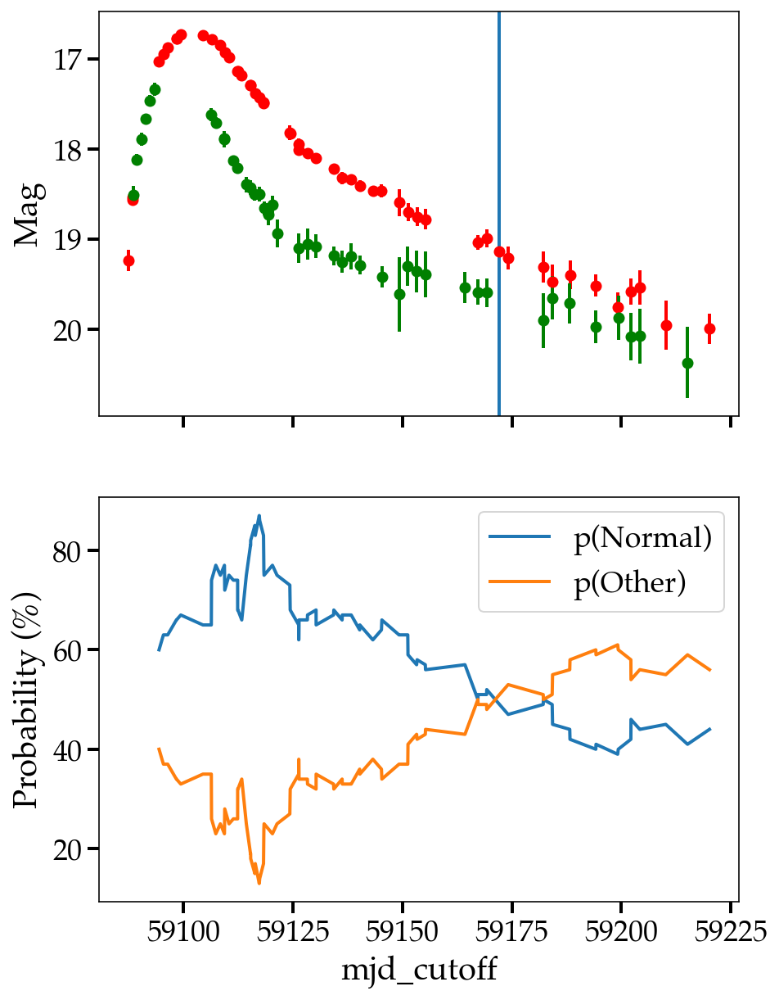

ZTF21aafmkjk Other


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


21
https://alerce.online/object/ZTF21aafmkjk Other


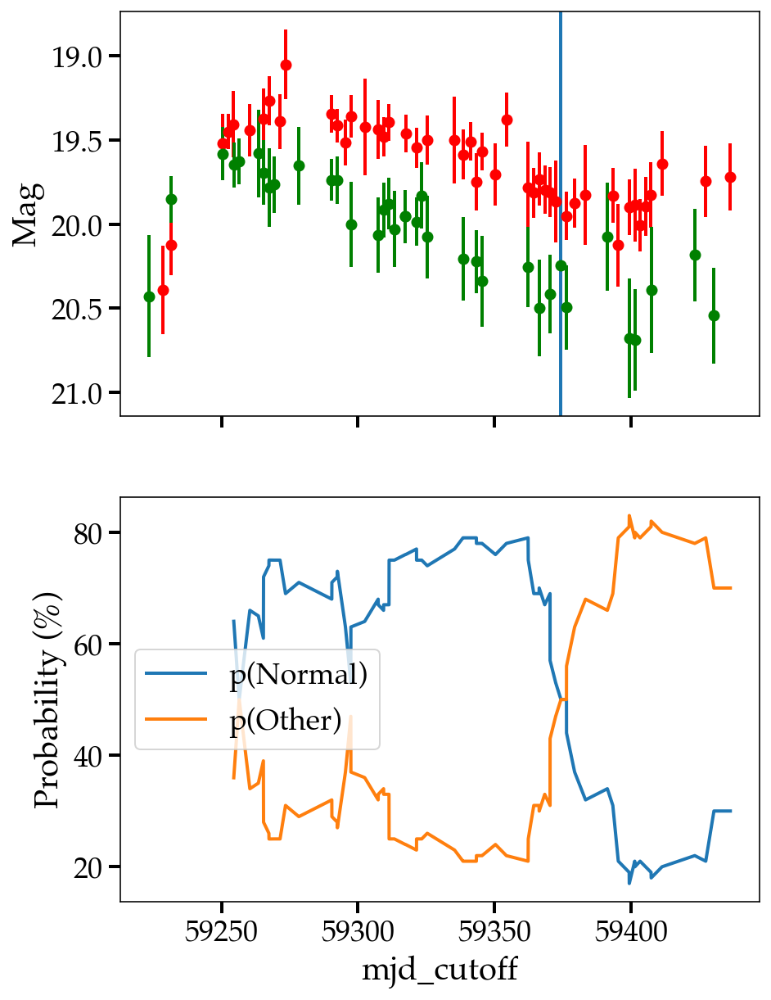

ZTF21aaabwfu Other
Prediction doesn't exceed anom_threshold of 50% for ZTF21aaabwfu.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


5
https://alerce.online/object/ZTF21aaabwfu Other


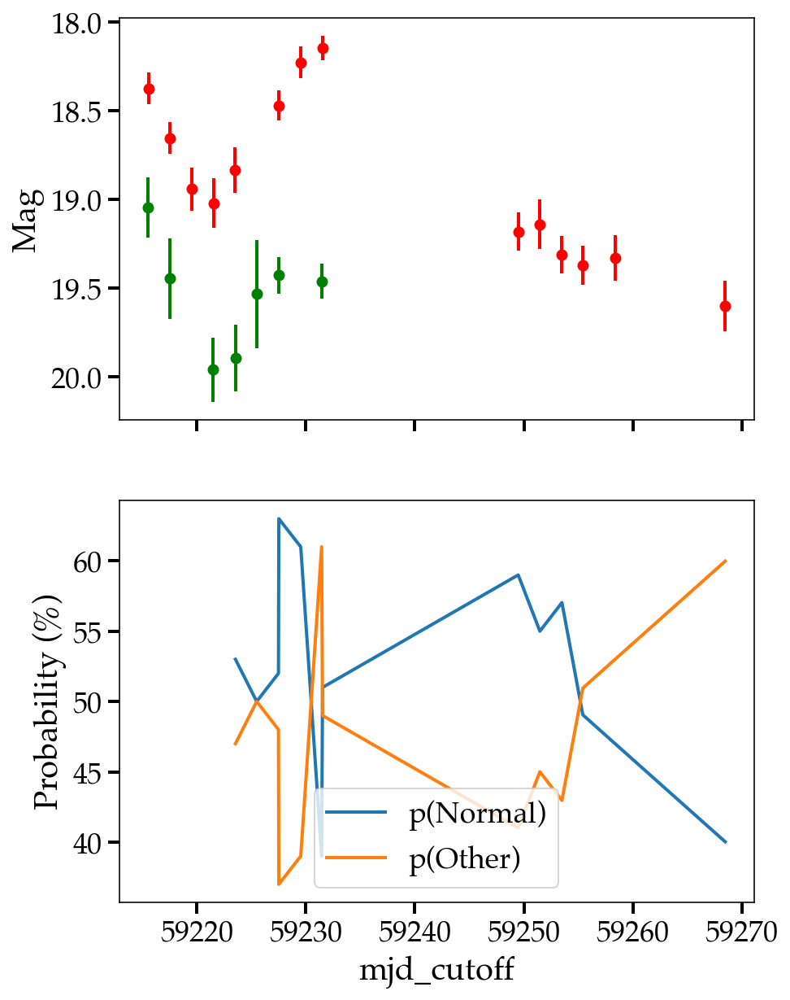

ZTF21aautijg Other


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished


7
https://alerce.online/object/ZTF21aautijg Other


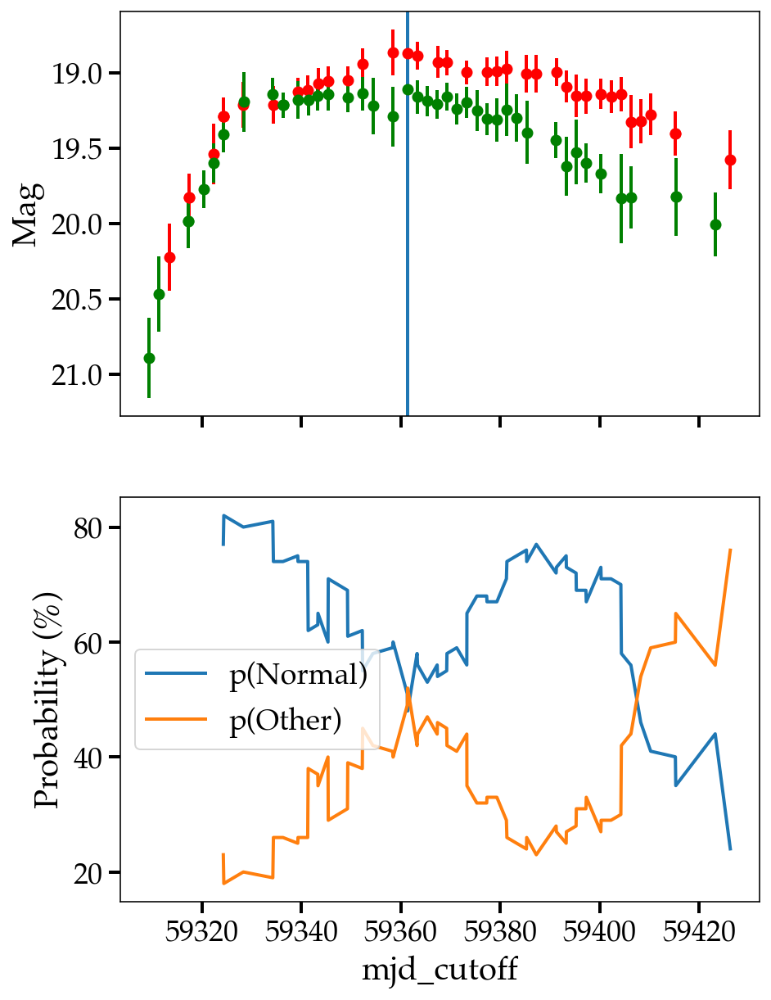

ZTF20acxqxyw Other


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


6
https://alerce.online/object/ZTF20acxqxyw Other


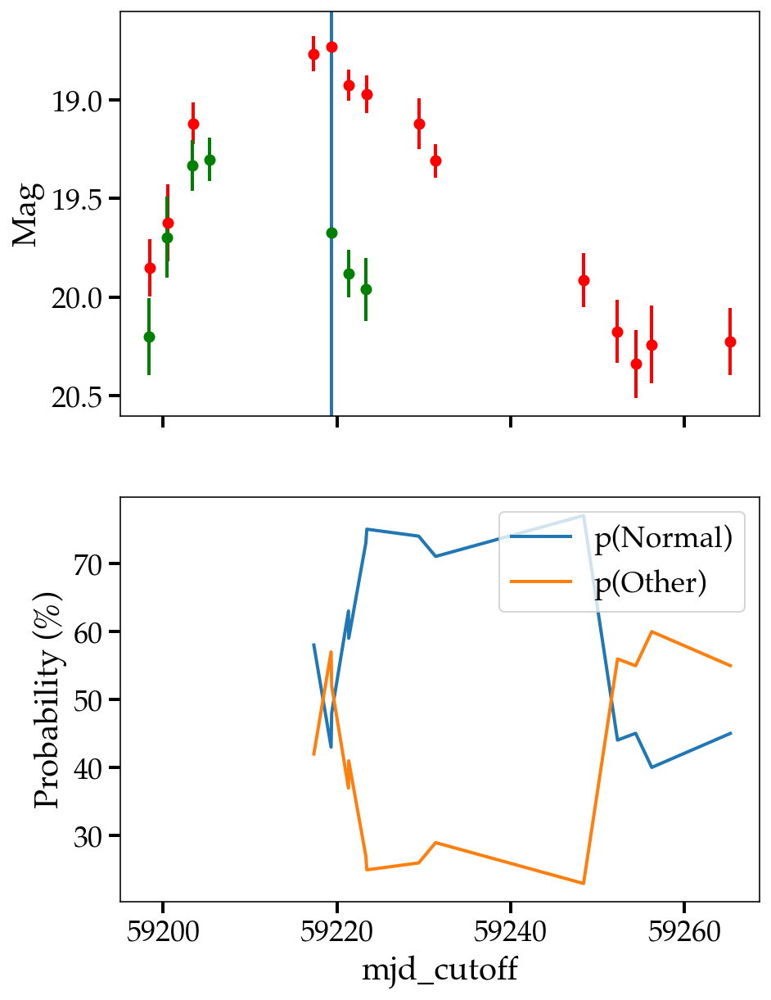

ZTF21abcgnqn Other


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


12
https://alerce.online/object/ZTF21abcgnqn Other


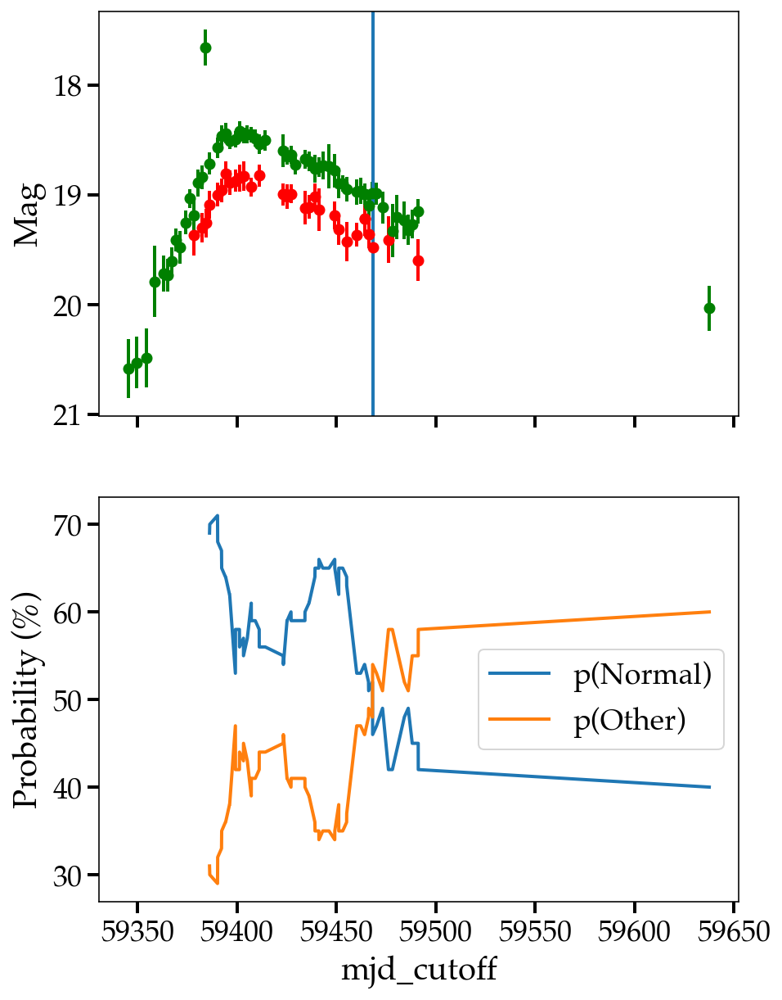

ZTF18acvgjqv Other


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


29
https://alerce.online/object/ZTF18acvgjqv Other


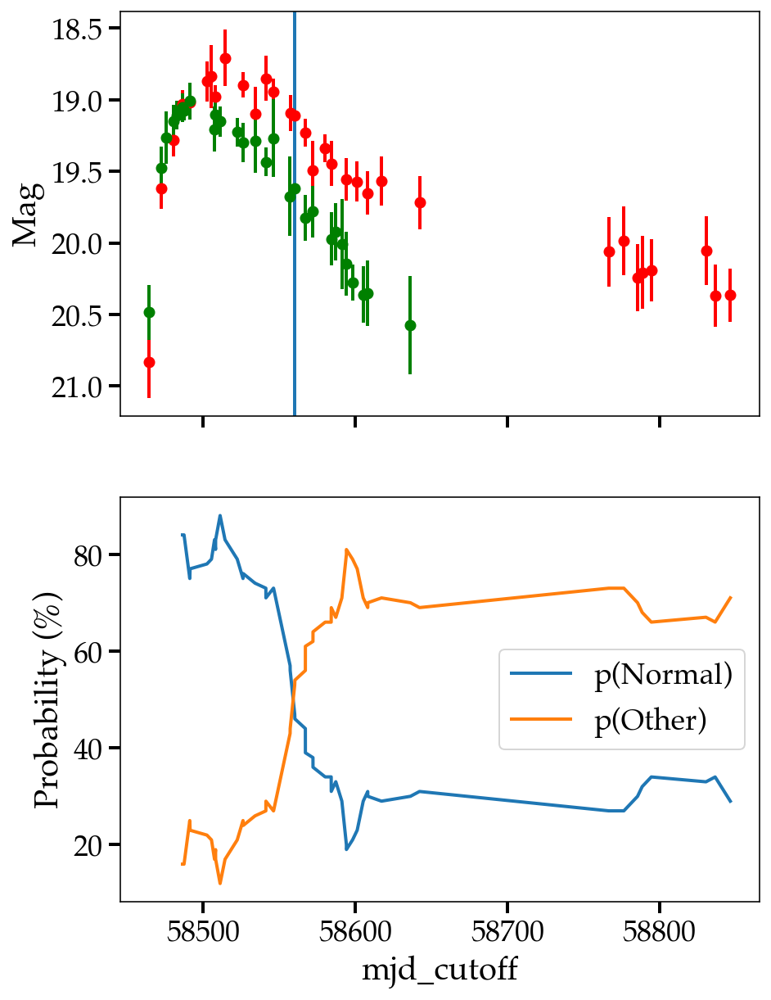

ZTF21abaxaqq Other
Prediction doesn't exceed anom_threshold of 50% for ZTF21abaxaqq.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


86
https://alerce.online/object/ZTF21abaxaqq Other


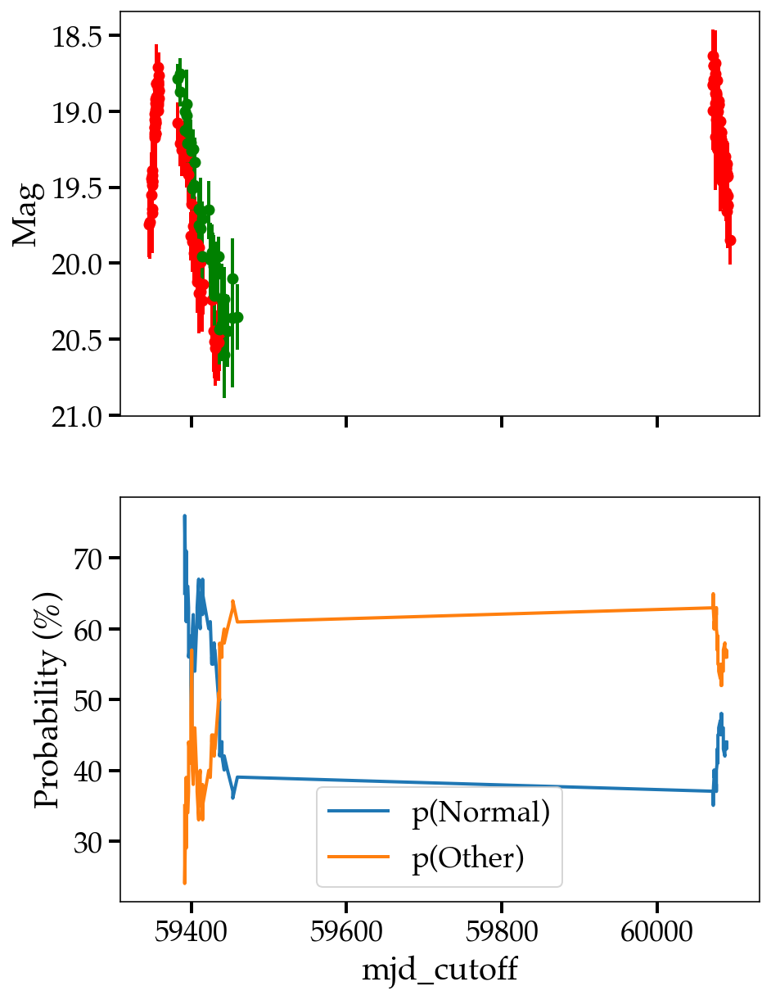

ZTF18acaqdaa Other


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


73
https://alerce.online/object/ZTF18acaqdaa Other


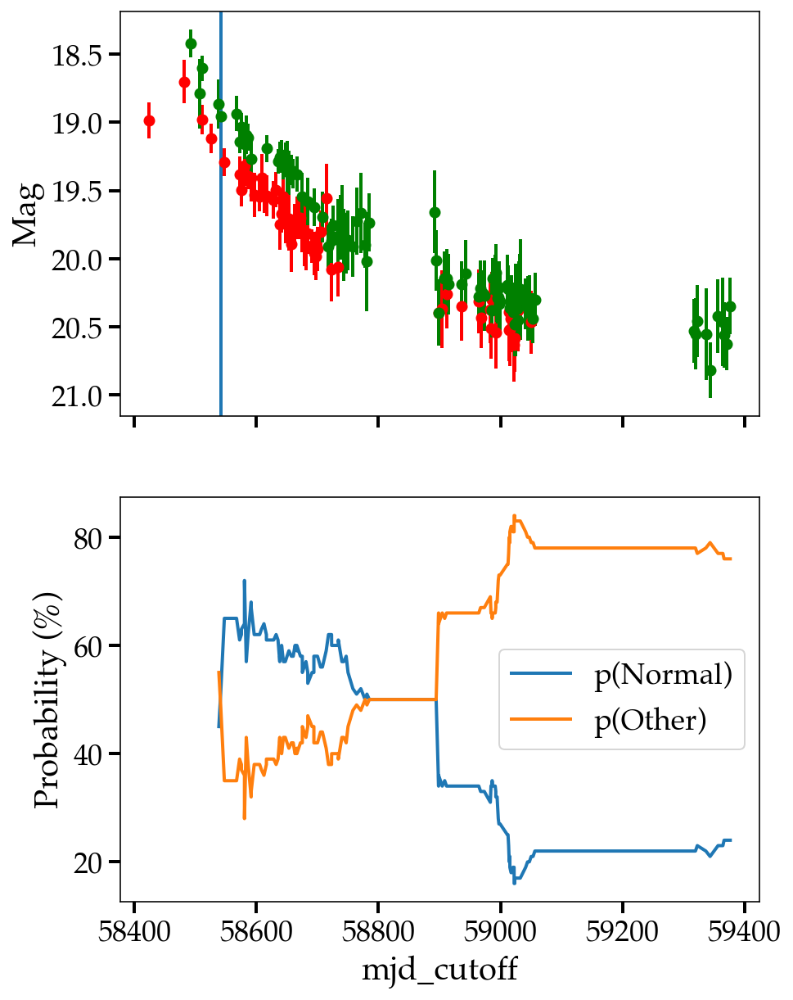

ZTF21aaaokyp Other


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


48
https://alerce.online/object/ZTF21aaaokyp Other


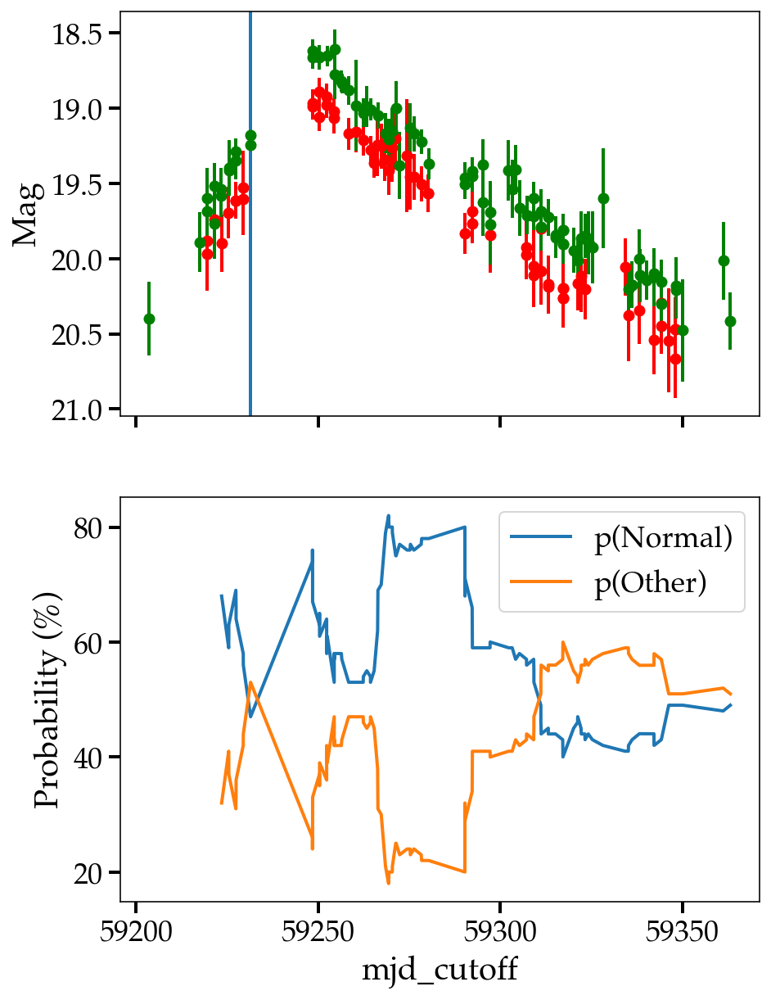

ZTF21aapvvtb Other


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


18
https://alerce.online/object/ZTF21aapvvtb Other


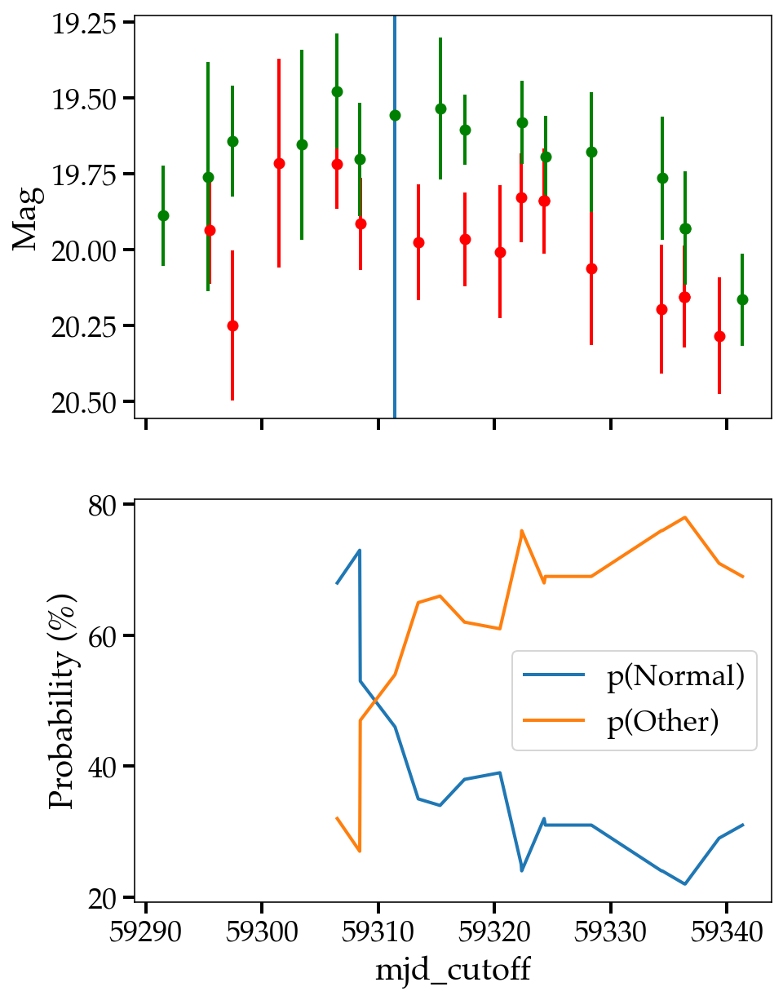

ZTF20acnznms Other


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


77
https://alerce.online/object/ZTF20acnznms Other


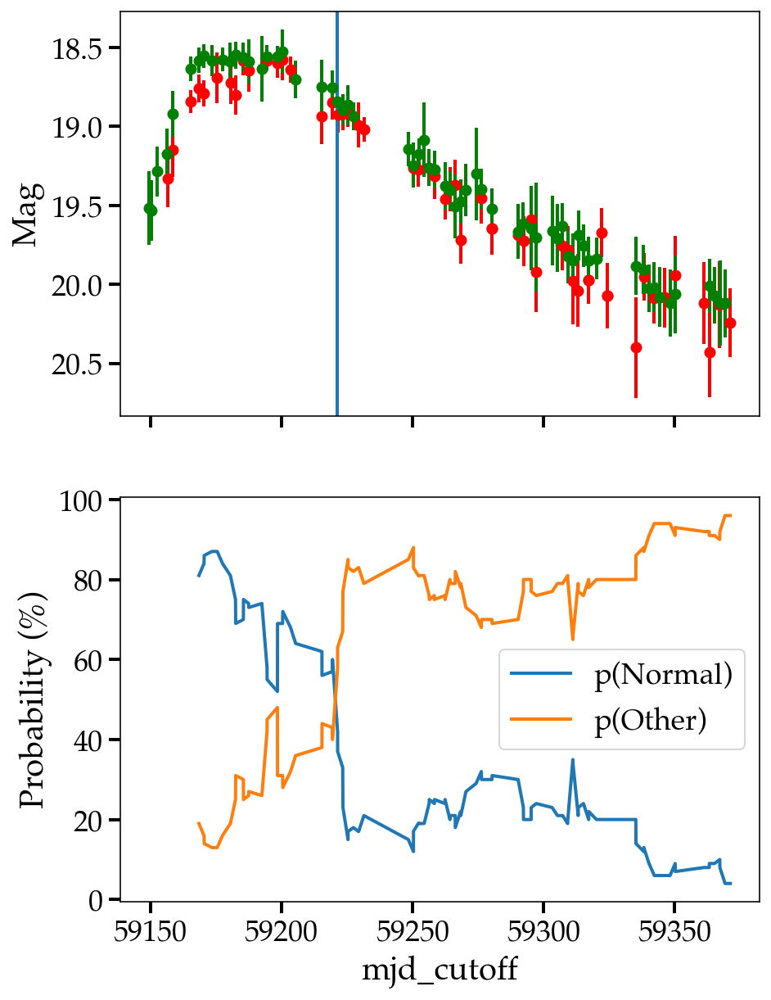

ZTF19aaadwfi Other
Prediction doesn't exceed anom_threshold of 50% for ZTF19aaadwfi.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF19aaadwfi Other


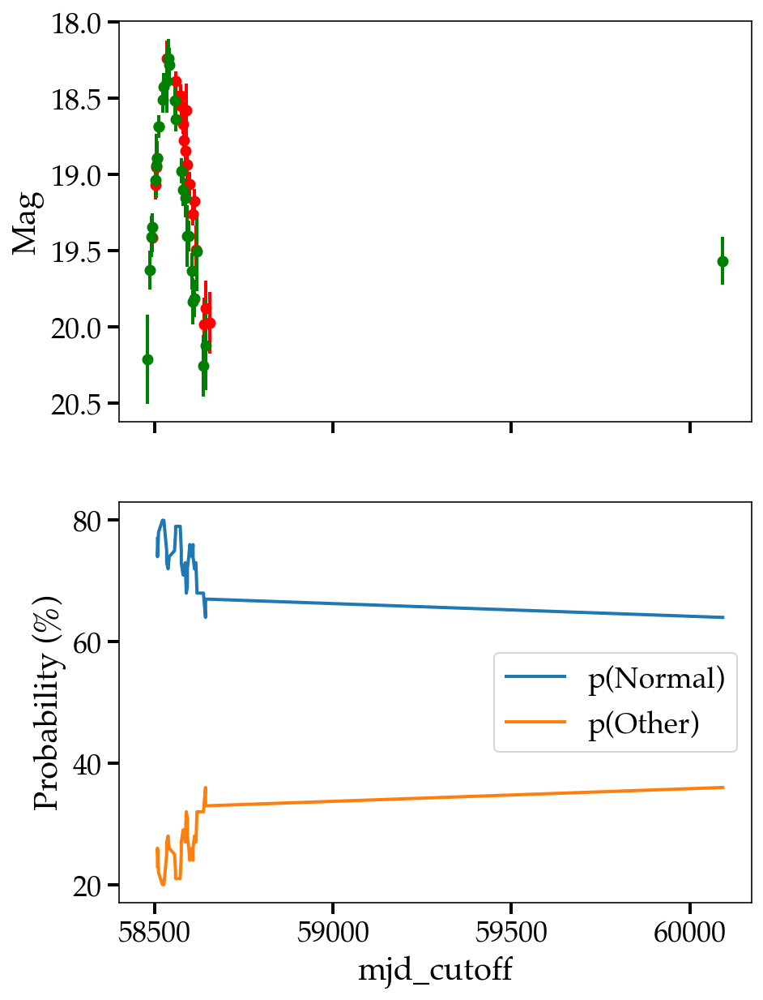

ZTF20acwytxn Other
Prediction doesn't exceed anom_threshold of 50% for ZTF20acwytxn.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


22
https://alerce.online/object/ZTF20acwytxn Other


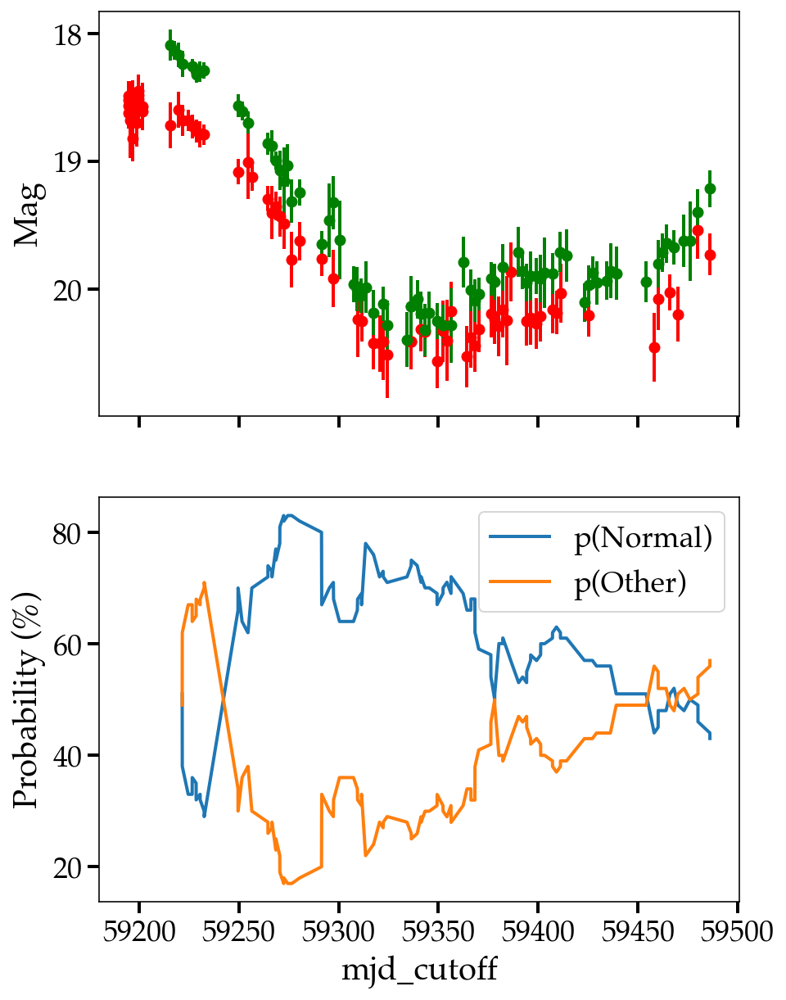

In [32]:
plot_RFC_prob_vs_lc(dataframe=df2_other_cor, anom_thresh=50)

14 "other" objects by TNS label correcly classified as other by RFC for full LC.
__________
14 tagged anomalous via full LC . 
* 2 SLSN-II,
* 3 SN IIn, 
* 1 SN IIb, 
* 6 TDE, 
* 1 Ib,
* 1 Ic,
* 0 Ic-BL.

+7 tagged anomalous recovered via timeseries ONLY (0 for full LC). 
* 0 SLSN-II,
* 4 SN IIn, 
* 0 SN IIb,
* 1 TDE, 
* 0 Ib,
* 1 Ic,
* 1 Ic-BL.

= 21 total tagged anomalous | anomalous label
* 2 SLSN-II, (2/3 = 66.7% total recovered)
* 7 SN IIn, (7/13 = 53.7% total recovered)
* 1 SN IIb, (1/5 = 20% total recovered)
* 7 TDE, (7/8 = 87.5% total recovered)
* 1 Ib, (1/4 = 25% total recovered)
* 2 Ic, (2/8 = 25% total recovered)
* 1 Ic-BL. (1/4 = 25% total recovered)

In [33]:
Counter(x_test_all.tns_cls)

Counter({'SN Ia': 279,
         'SN Ib': 4,
         'SN IIP': 4,
         'SN II': 63,
         'SN Ic': 8,
         'SN Ia-91T-like': 9,
         'SN Ic-BL': 4,
         'SN IIn': 13,
         'TDE': 8,
         'SN IIb': 5,
         'SLSN-II': 3})

In [34]:
df2_normal =df2[df2['tns_cls'] != 'Other']

df2_normal_cor = df2_normal[df2_normal['tns_cls'] == df2_normal['RFC_best_cls']]
df2_normal_inc = df2_normal[df2_normal['tns_cls'] != df2_normal['RFC_best_cls']]

print("Inorrectly flagged `anomalies' (Technically `Normal` by its TNS label. But investigate!)")
for ob in df2_normal_inc.index:
    print(f'https://alerce.online/object/{ob}', x_test_all.loc[ob].tns_cls)

Inorrectly flagged `anomalies' (Technically `Normal` by its TNS label. But investigate!)
https://alerce.online/object/ZTF20abarsvz SN Ia
https://alerce.online/object/ZTF21aaizyqc SN II
https://alerce.online/object/ZTF21aajvukh SN II
https://alerce.online/object/ZTF20accmtgt SN Ia
https://alerce.online/object/ZTF21aadacxv SN II
https://alerce.online/object/ZTF21aadkhte SN II
https://alerce.online/object/ZTF20actkutp SN II
https://alerce.online/object/ZTF21acmnpqa SN Ia
https://alerce.online/object/ZTF20acyroke SN Ia
https://alerce.online/object/ZTF18abaeqpf SN II
https://alerce.online/object/ZTF21aapffqd SN II
https://alerce.online/object/ZTF20abqlmwn SN II
https://alerce.online/object/ZTF21abpyauz SN II


ZTF20abarsvz Normal


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


23
https://alerce.online/object/ZTF20abarsvz Normal


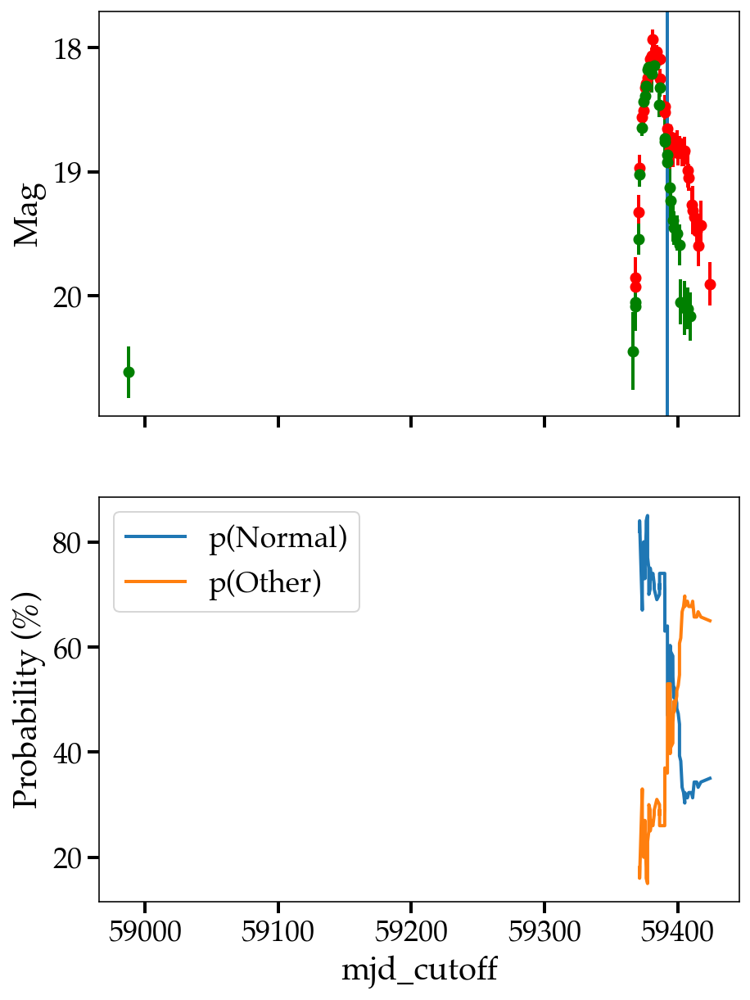

ZTF21aaizyqc Normal


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


23
https://alerce.online/object/ZTF21aaizyqc Normal


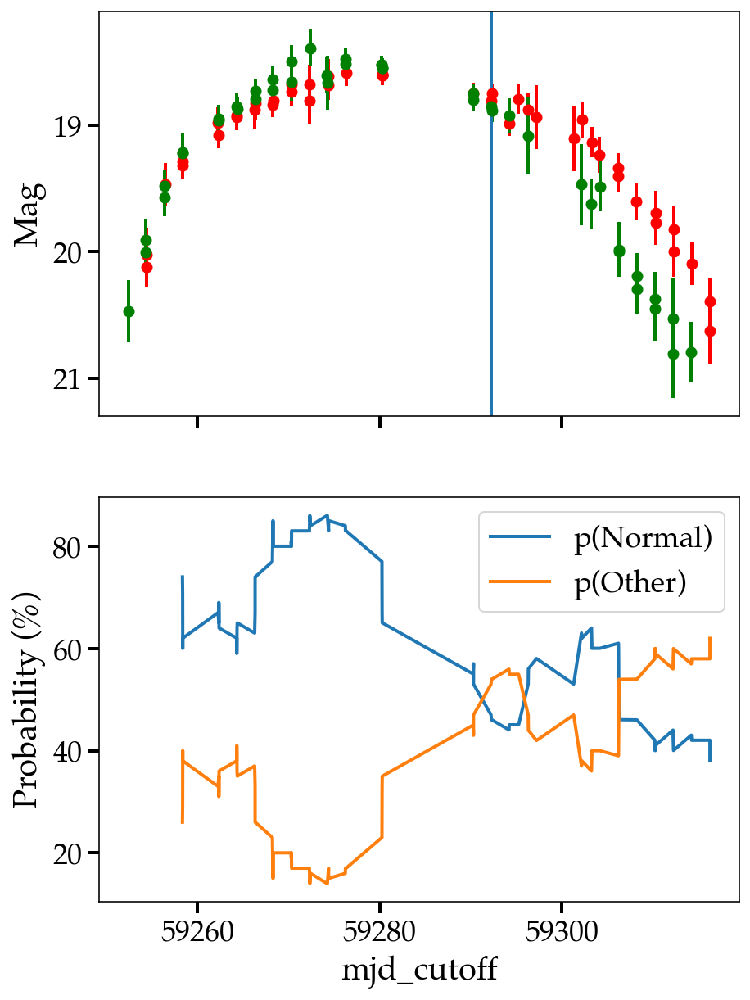

ZTF21aajvukh Normal


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


5
https://alerce.online/object/ZTF21aajvukh Normal


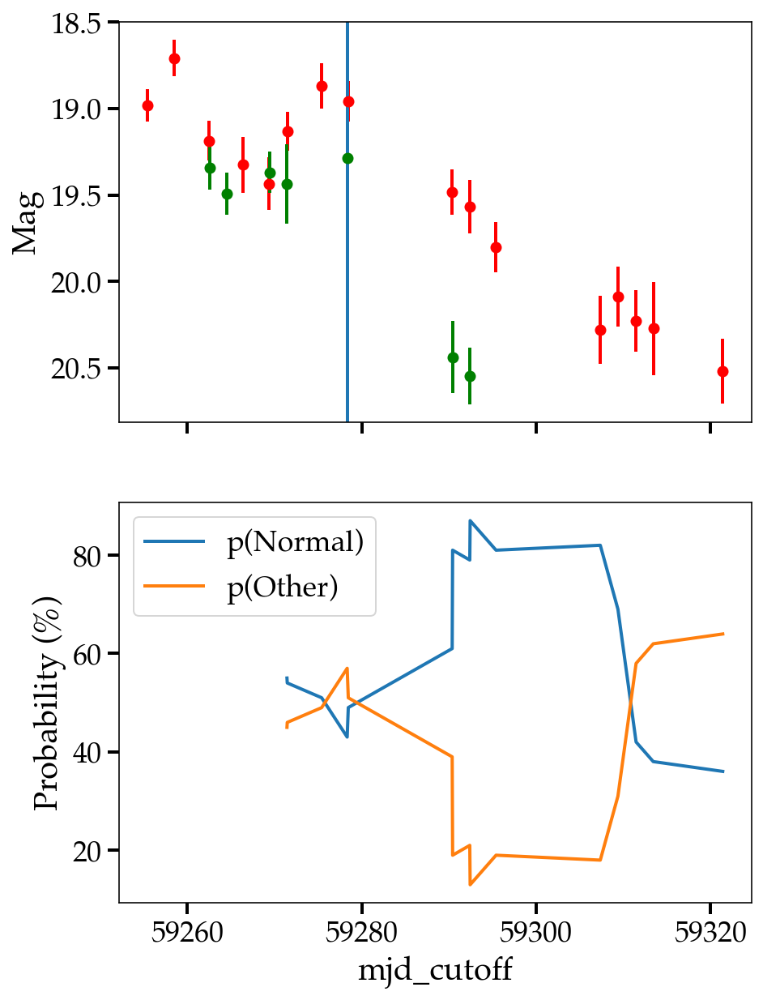

ZTF20accmtgt Normal


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


24
https://alerce.online/object/ZTF20accmtgt Normal


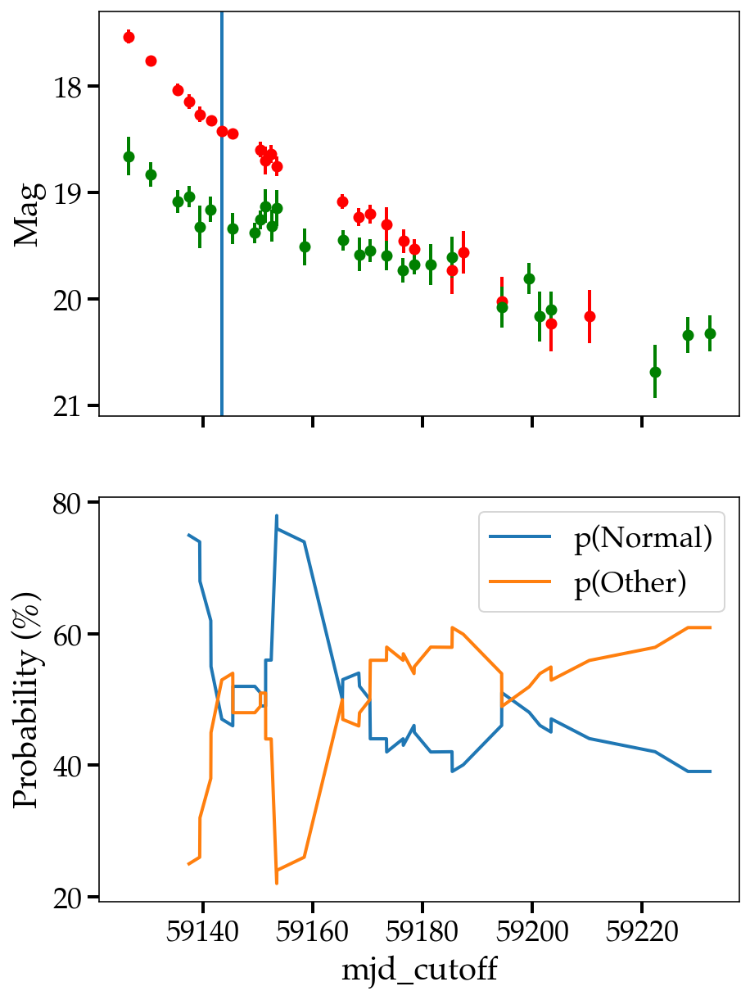

ZTF21aadacxv Normal


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


15
https://alerce.online/object/ZTF21aadacxv Normal


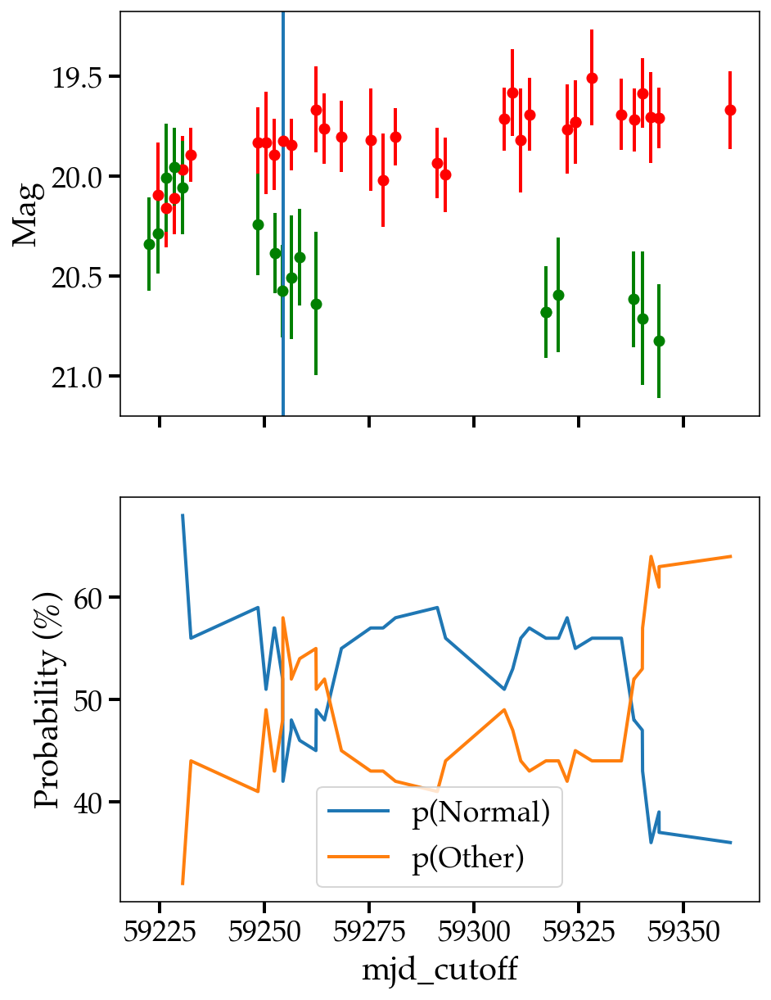

ZTF21aadkhte Normal


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


13
https://alerce.online/object/ZTF21aadkhte Normal


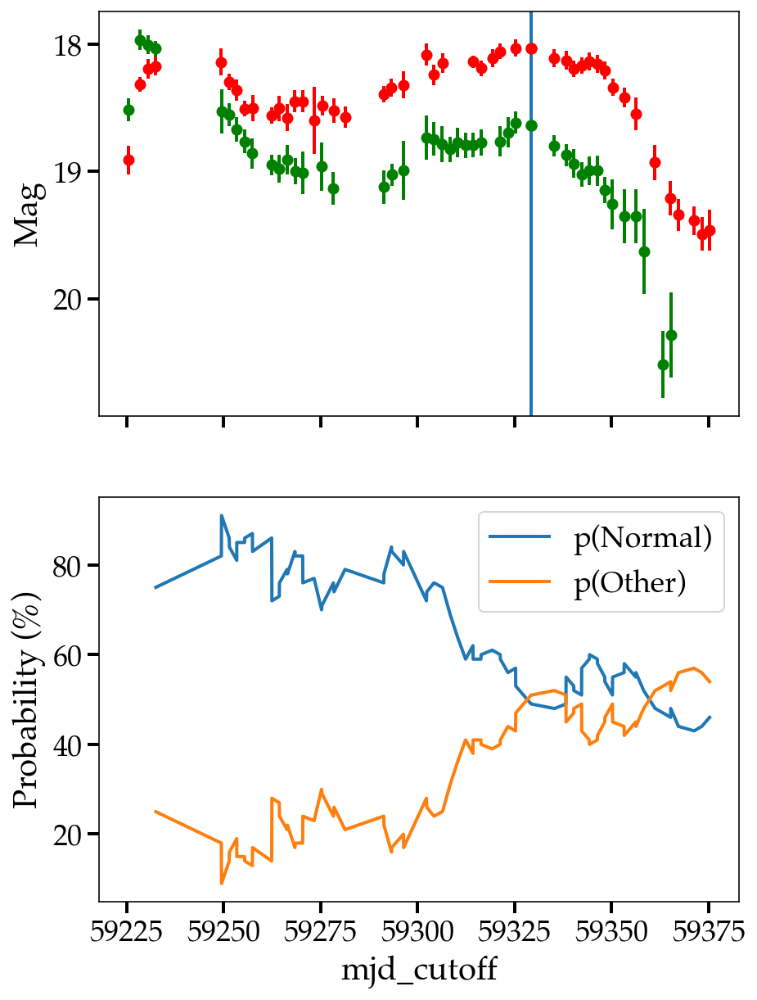

ZTF20actkutp Normal


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


31
https://alerce.online/object/ZTF20actkutp Normal


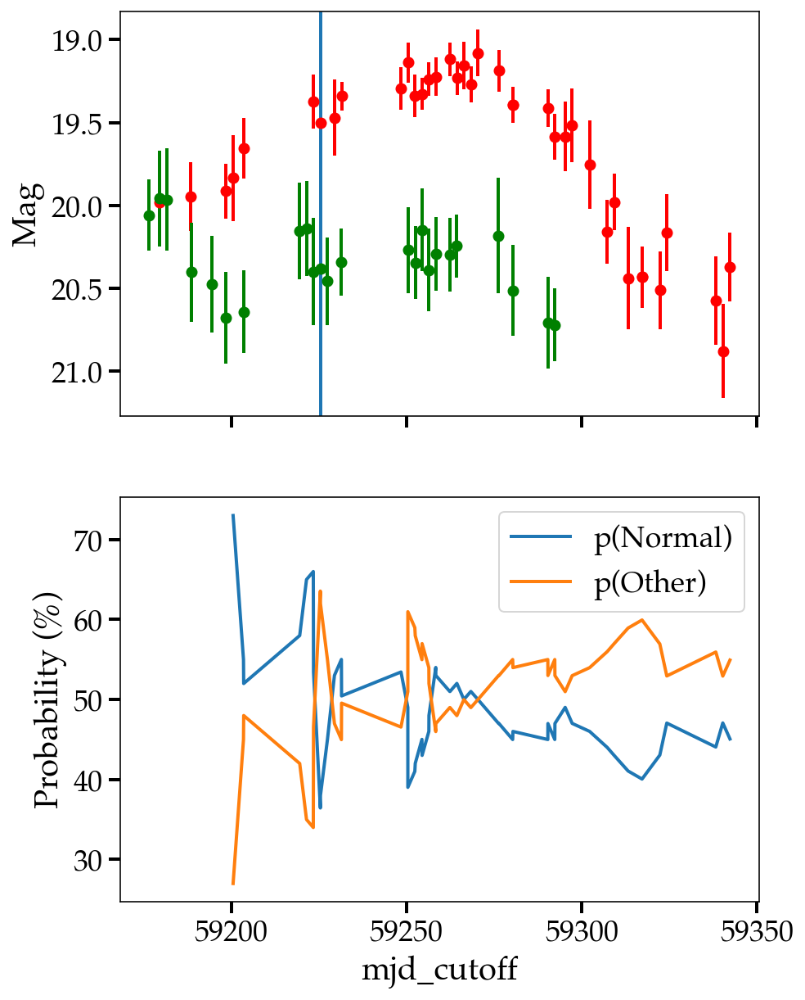

ZTF21acmnpqa Normal
Prediction doesn't exceed anom_threshold of 50% for ZTF21acmnpqa.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished


1
https://alerce.online/object/ZTF21acmnpqa Normal


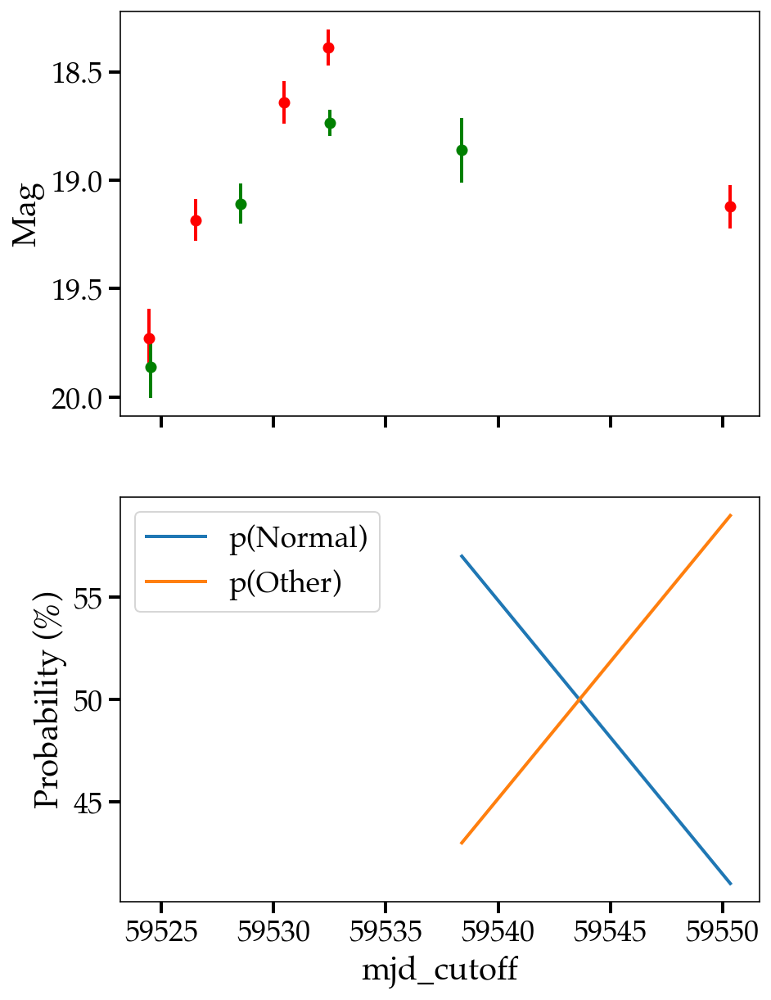

ZTF20acyroke Normal


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


28
https://alerce.online/object/ZTF20acyroke Normal


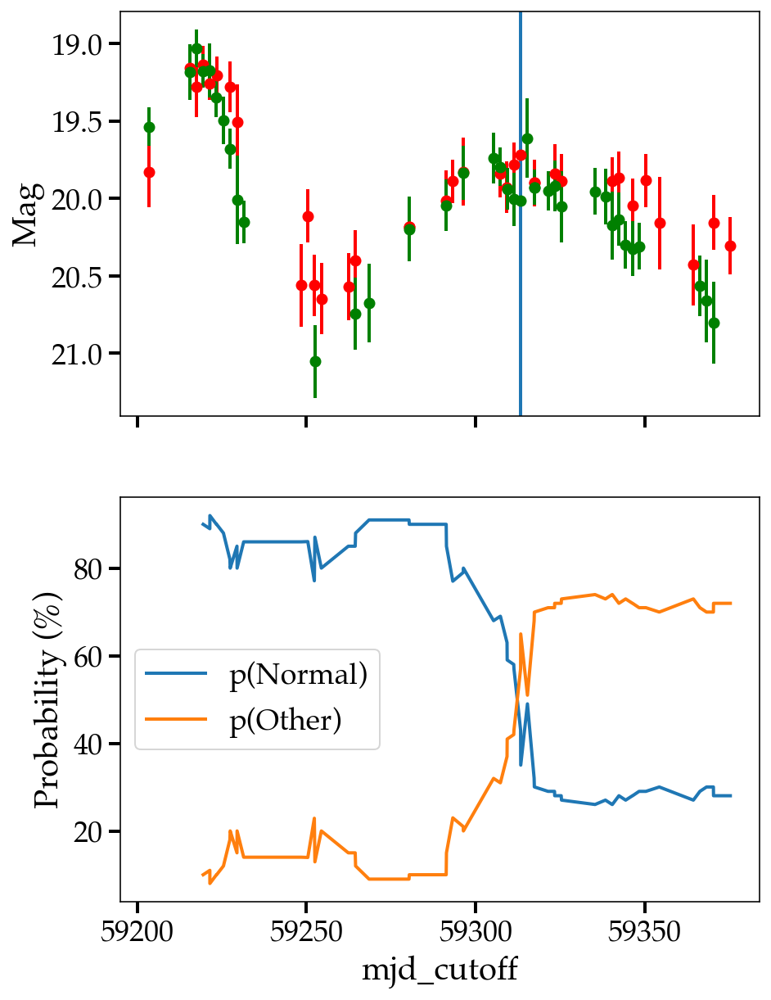

ZTF18abaeqpf Normal


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


118
https://alerce.online/object/ZTF18abaeqpf Normal


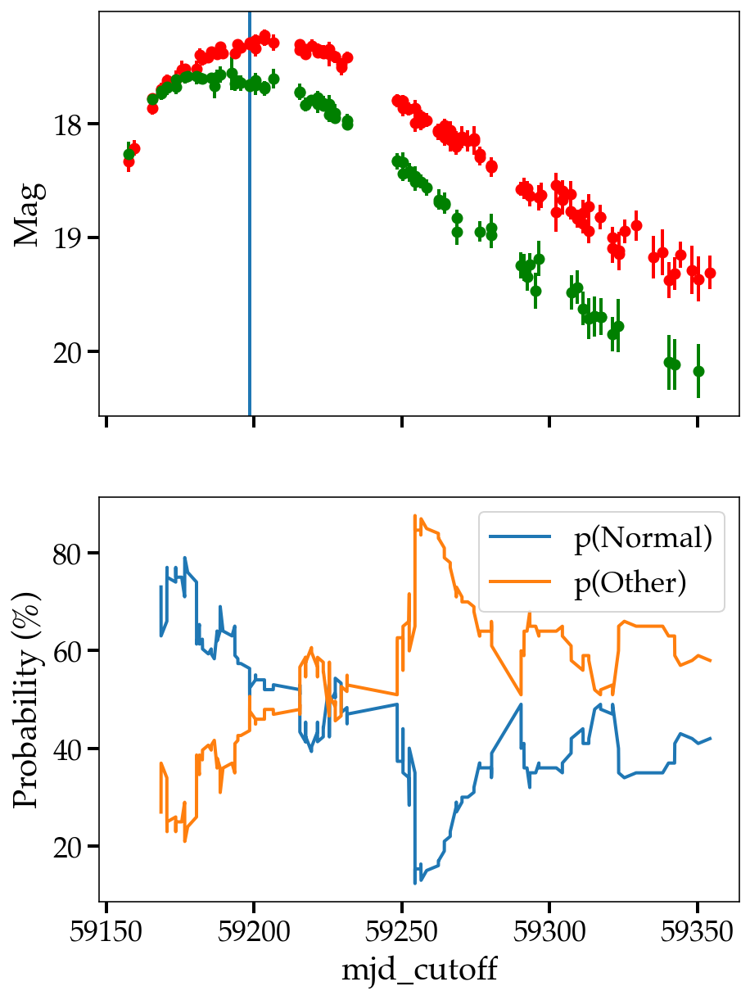

ZTF21aapffqd Normal


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


7
https://alerce.online/object/ZTF21aapffqd Normal


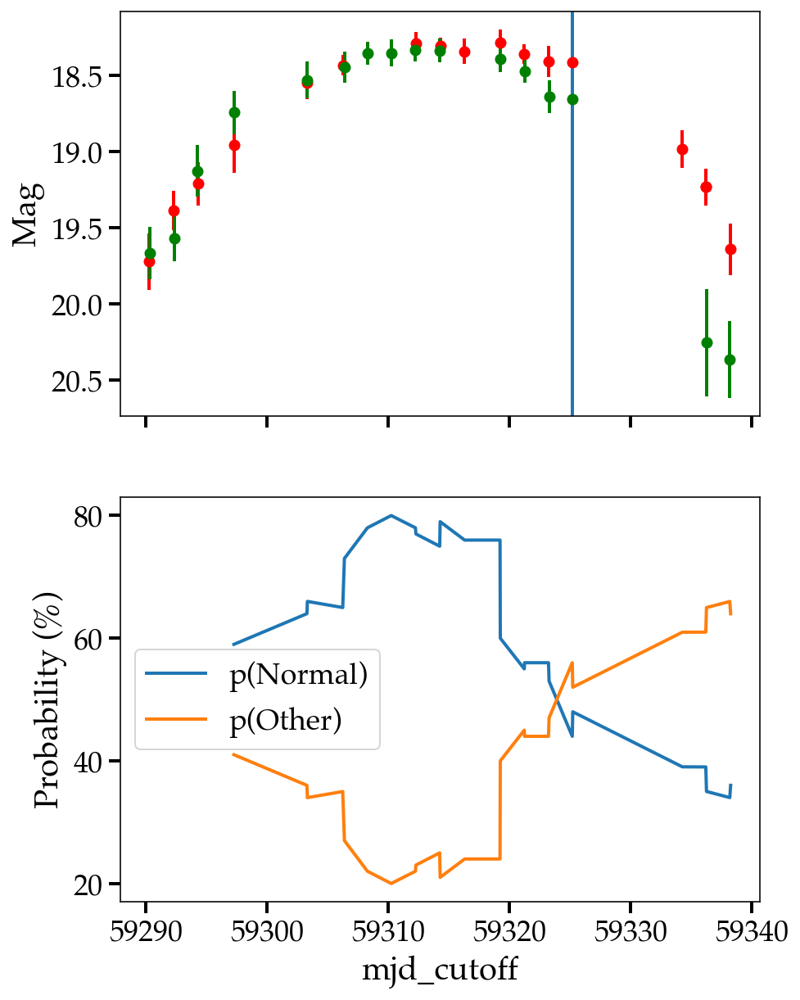

ZTF20abqlmwn Normal


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


56
https://alerce.online/object/ZTF20abqlmwn Normal


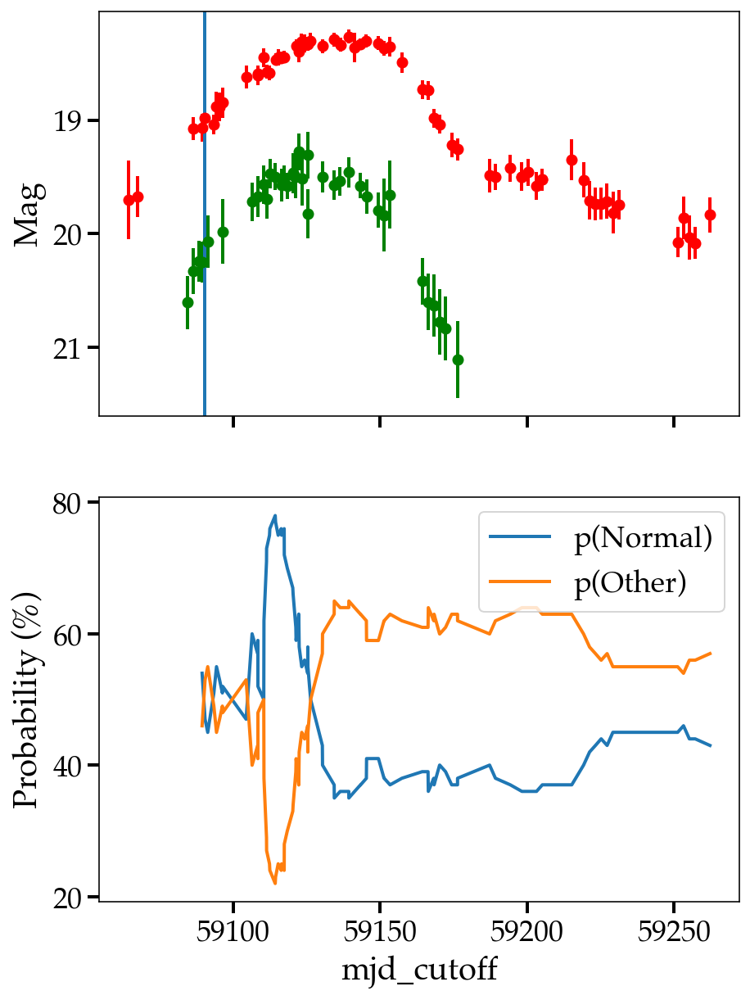

ZTF21abpyauz Normal


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


16
https://alerce.online/object/ZTF21abpyauz Normal


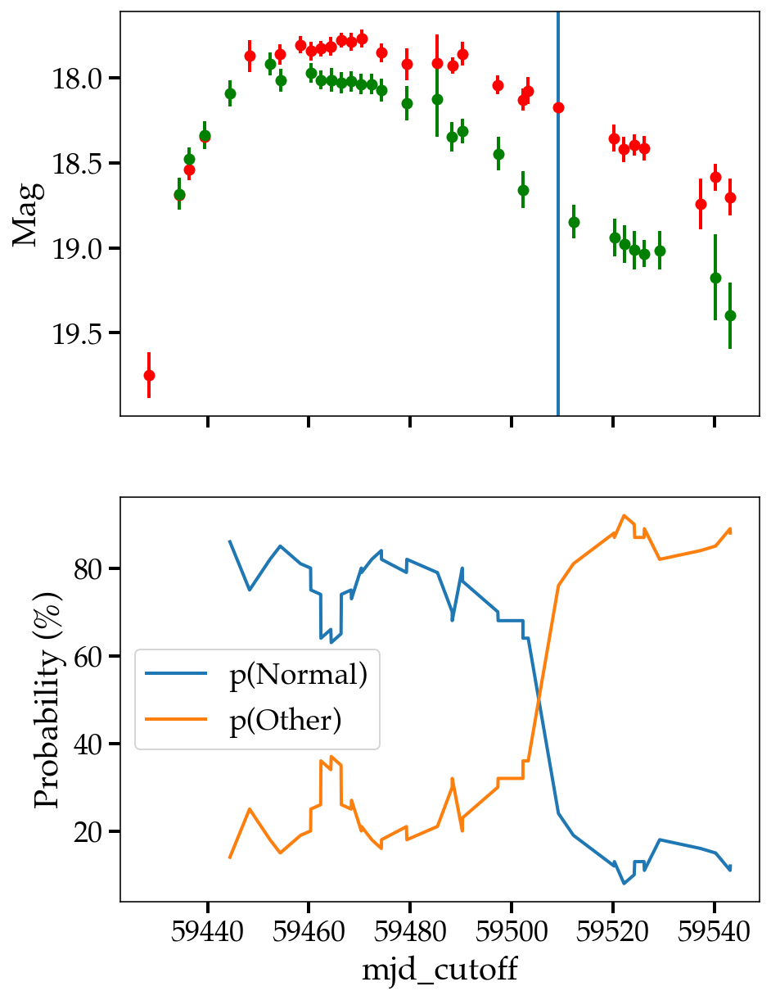

In [35]:
plot_RFC_prob_vs_lc(dataframe=df2_normal_inc, anom_thresh=50)

In [36]:
df2_normal_inc.loc['ZTF21aaizyqc']

feature_amplitude_magn_r                   1.022863
feature_anderson_darling_normal_magn_r     2.109273
feature_beyond_1_std_magn_r                 0.27907
feature_beyond_2_std_magn_r                0.046512
feature_cusum_magn_r                       0.407611
                                            ...    
s2                                        -0.626242
s3                                        -1.395525
Normal                                    38.030514
Other                                     61.969486
RFC_best_cls                                  Other
Name: ZTF21aaizyqc, Length: 130, dtype: object

Inorrectly flagged `anomalies` (Technically `Normal` by its TNS label. But investigate!)
https://alerce.online/object/ZTF20abarsvz SN Ia - NOT. 2021our, z=0.039. Normal Ia. Elliptical gal. Early epoch 300d before event probably is reason.
https://alerce.online/object/ZTF21aaizyqc SN II - ? 2021ckb; z=0.070265. Could be IIn. Lasted 70d. Interesting enough.
https://alerce.online/object/ZTF21aajvukh SN II - ANOM.  2021cpi; z=0.055. LC looks IIb.
https://alerce.online/object/ZTF20accmtgt SN Ia - ANOM. 2020tnq; z=0.033. 100d. Very end decline of Ia. 18.5mag
https://alerce.online/object/ZTF21aadacxv SN II - NOT. 2021aff; z=0.051. ? LC looks IIP
https://alerce.online/object/ZTF21aadkhte SN II - ANOM. 2021zj; z=0.046. 150d double peak SN II. Tag at 2nd peak
https://alerce.online/object/ZTF20actkutp SN II - ANOM. 2020abah; z=0.03. 100d rise (interaction). 180d LC. 
https://alerce.online/object/ZTF21acmnpqa SN Ia - ANOM?	2021adpx; z=0.047. 91bg-like Understandable b.c only LC rise except 1 epoch (the anom one)
https://alerce.online/object/ZTF20acyroke SN Ia - ANOM. 2020aeuh; z=0.126. Really Ia-CSM. Tagged at 2nd peak.
https://alerce.online/object/ZTF18abaeqpf SN II - ANOM. 2020ywo; z=0.0475. 200d SN II. Tagged just before peak (17.5mag) 
https://alerce.online/object/ZTF21aapffqd SN II - NOT. 2021fyp; z=0.052896. ? pretty Normal SN II
https://alerce.online/object/ZTF20abqlmwn SN II - ANOM. 2020rmk; z=0.025. Heavily reddened due to dust. 200d.
https://alerce.online/object/ZTF21abpyauz SN II - ANOM. 2021uzt; z=0.061. IIn cand, LSB host.

13 total tagged p(anomalous|normal label) via full LC
* 9 SN II (7 reasonable, 2 Questionable )
    * ------R------
    * 1 IIb cand.
        * 2021cpi; z=0.055
    * 2 IIn cand.
        * 2021ckb; z=0.070265
        * 2021uzt; z=0.061. abs mag~ -19.5 mag. 120d LC. LSB host.
    * 1 double peak SN II
        * 2021zj; z=0.046. 150d LC.
    * 3 SN II lasting ~200d
        * 2020abah; z=0.03. 100d rise (interaction). 180d LC. 
        * 2020ywo; z=0.0475. 200d LC. Tagged just before peak (17.5mag) 
        * 2020rmk; z=0.025. 200d LC. Heavily reddened due to dust. 
    * ------?------
    * 2 SN II normal
        * 2021aff z=0.051. IIP
        * 2021fyp; z=0.052896. Normal II. 30d rise. *Maybe* a IIn cand though.
    
* 4 SN Ia (3 reasonable, 1 questionable)
    * ------R------
    * 1 Ia-CSM cand.
        * 2020aeuh; z=0.126. Tagged at 2nd peak.
    * 2 Weird Ia
        * 2020tnq; z=0.033. Very end decline of Ia, lasted 100d 
        * 2021adpx; z=0.047. SN Ia-91bg cand.
    * ------?------
    * 1 Ia-norm
        * 2021our, z=0.039. Normal Ia.
     

In [37]:
# actually very long lived SN II, very red, one Ia-CSM, IIb, (MUCH better than numbers suggest slightly...)
# all interesting really!...

In [38]:
print("Correctly flagged `Normal' (Technically `Normal` by its TNS label. But investigate!)")
for ob in df2_normal_cor.index:
    print(f'https://alerce.online/object/{ob}', x_test_all.loc[ob].tns_cls)

Correctly flagged `Normal' (Technically `Normal` by its TNS label. But investigate!)
https://alerce.online/object/ZTF21abflgpq SN Ia
https://alerce.online/object/ZTF21abkaoxe SN Ia
https://alerce.online/object/ZTF20acpkled SN Ia
https://alerce.online/object/ZTF21aaazjia SN Ia
https://alerce.online/object/ZTF20acvdqtg SN Ia
https://alerce.online/object/ZTF21aaabwem SN IIP
https://alerce.online/object/ZTF20acqzpta SN Ia
https://alerce.online/object/ZTF21abhrmrv SN Ia
https://alerce.online/object/ZTF21aaabuoj SN Ia
https://alerce.online/object/ZTF20acbiwri SN II
https://alerce.online/object/ZTF21abrxoir SN Ia
https://alerce.online/object/ZTF21aaagzee SN Ia
https://alerce.online/object/ZTF21abfxjkq SN II
https://alerce.online/object/ZTF21abcnkbe SN Ia
https://alerce.online/object/ZTF21aciqcge SN Ia
https://alerce.online/object/ZTF20acwfftd SN Ia
https://alerce.online/object/ZTF21abzbwfo SN II
https://alerce.online/object/ZTF21aahzspd SN Ia
https://alerce.online/object/ZTF21aalnhby SN Ia
ht

In [45]:
# RUN!
# plot_RFC_prob_vs_lc(dataframe=df2_normal_cor, anom_thresh=50)

Correctly flagged `Normal` (Technically `Normal` by its TNS label. But investigate!)
https://alerce.online/object/ZTF21abflgpq SN Ia - NOT
https://alerce.online/object/ZTF21abkaoxe SN Ia - ""
https://alerce.online/object/ZTF20acpkled SN Ia
https://alerce.online/object/ZTF21aaazjia SN Ia
https://alerce.online/object/ZTF20acvdqtg SN Ia
https://alerce.online/object/ZTF21aaabwem SN IIP
https://alerce.online/object/ZTF20acqzpta SN Ia
https://alerce.online/object/ZTF21abhrmrv SN Ia
https://alerce.online/object/ZTF21aaabuoj SN Ia
https://alerce.online/object/ZTF20acbiwri SN II
https://alerce.online/object/ZTF21abrxoir SN Ia - ANOM. 2021vju; z=0.026657. ?
https://alerce.online/object/ZTF21aaagzee SN Ia
https://alerce.online/object/ZTF21abfxjkq SN II
https://alerce.online/object/ZTF21abcnkbe SN Ia
https://alerce.online/object/ZTF21aciqcge SN Ia
https://alerce.online/object/ZTF20acwfftd SN Ia
https://alerce.online/object/ZTF21abzbwfo SN II - ANOM. 2021yfi; z=0.22. Interesting enough. (TNS classificaion report: AT2021yfi was selected as a superluminous supernova candidate by Perley et al. (AstroNote 2021-280). We determine the redshift of z = 0.22 from P-cygni emission lines, which implies a peak magnitude of M_g ~ -21.3. The lack of narrow emission lines prevents a "superluminous IIn" classification and we instead adopt a generic Type II classification.)
https://alerce.online/object/ZTF21aahzspd SN Ia
https://alerce.online/object/ZTF21aalnhby SN Ia
https://alerce.online/object/ZTF21abizxkw SN Ia
https://alerce.online/object/ZTF21abjaksr SN Ia
https://alerce.online/object/ZTF20aciudrr SN Ia
https://alerce.online/object/ZTF21aarejnt SN Ia
https://alerce.online/object/ZTF21aaxzbrn SN Ia
https://alerce.online/object/ZTF21aamucom SN Ia-91T-like
https://alerce.online/object/ZTF18aaisqmw SN Ia
https://alerce.online/object/ZTF20acowcee SN Ia
https://alerce.online/object/ZTF21aajuerd SN Ia
https://alerce.online/object/ZTF21acefbte SN Ia
https://alerce.online/object/ZTF21aapzzgf SN Ia
https://alerce.online/object/ZTF21acaegsr SN Ia
https://alerce.online/object/ZTF21aabygea SN II
https://alerce.online/object/ZTF21aaczpca SN Ia
https://alerce.online/object/ZTF22aaafdna SN Ia
https://alerce.online/object/ZTF21aamwqim SN II
https://alerce.online/object/ZTF21acnfoqn SN II
https://alerce.online/object/ZTF21aakybgi SN Ia
https://alerce.online/object/ZTF21aapkhsc SN Ia
https://alerce.online/object/ZTF18aayyqia SN Ia
https://alerce.online/object/ZTF21abqpwpu SN Ia
https://alerce.online/object/ZTF20acqlcge SN Ia
https://alerce.online/object/ZTF20achtpbn SN Ia
https://alerce.online/object/ZTF21acgyzel SN Ia
https://alerce.online/object/ZTF20acxncha SN Ia
https://alerce.online/object/ZTF21aarwlht SN Ia
https://alerce.online/object/ZTF20acwyihb SN Ia
https://alerce.online/object/ZTF21aaxtdrs SN Ia
https://alerce.online/object/ZTF21abcmtev SN II
https://alerce.online/object/ZTF21abjdqbo SN Ia
https://alerce.online/object/ZTF21abrzsol SN Ia
https://alerce.online/object/ZTF21abcnpnk SN Ia - ANOM. 2021ntw; z=0.099. ? Normal Ia. No obvious 2nd bump tho.
https://alerce.online/object/ZTF20abyzomt SN II
https://alerce.online/object/ZTF20acpwjus SN Ia-91T-like
https://alerce.online/object/ZTF21aagtqgz SN Ia-91T-like - ANOM. 2021brx; z=0.06232. One anom epoch just after peak. 18.5 mag.
https://alerce.online/object/ZTF20abywydb SN II
https://alerce.online/object/ZTF22aaabnwa SN Ia
https://alerce.online/object/ZTF21aaabzap SN Ia
https://alerce.online/object/ZTF22aaaeeva SN Ia
https://alerce.online/object/ZTF21abxknvv SN Ia
https://alerce.online/object/ZTF21aakigqr SN II
https://alerce.online/object/ZTF21abhttll SN Ia
https://alerce.online/object/ZTF21achkgap SN Ia
https://alerce.online/object/ZTF21aarohyu SN Ia
https://alerce.online/object/ZTF21abjdiok SN Ia
https://alerce.online/object/ZTF21acdoydr SN Ia
https://alerce.online/object/ZTF21aaqzqaa SN Ia
https://alerce.online/object/ZTF21abkkwie SN Ia
https://alerce.online/object/ZTF22aaafdrn SN Ia
https://alerce.online/object/ZTF20acuoclk SN Ia
https://alerce.online/object/ZTF21acdcxfz SN Ia
https://alerce.online/object/ZTF21aasufxv SN Ia
https://alerce.online/object/ZTF18abufaej SN II
https://alerce.online/object/ZTF21aarasvn SN II
https://alerce.online/object/ZTF20acjdhof SN Ia-91T-like
https://alerce.online/object/ZTF21aaxstzy SN Ia - ANOM. 2021kpu; z=0.069. ? Normal. Ia.
https://alerce.online/object/ZTF21aalxurx SN II - ANOM. 2021dqs; z=0.027. 150d LC. Understandable. Tagged at peak (~19mag). 
https://alerce.online/object/ZTF21aawckpe SN Ia
https://alerce.online/object/ZTF21aawlwoy SN Ia
https://alerce.online/object/ZTF21aaadiap SN Ia
https://alerce.online/object/ZTF21aaqzkhx SN Ia
https://alerce.online/object/ZTF18abrfccm SN Ia
https://alerce.online/object/ZTF20acsesce SN Ia
https://alerce.online/object/ZTF20acxbbaj SN Ia
https://alerce.online/object/ZTF20acfkyll SN II
https://alerce.online/object/ZTF21absbwyz SN Ia
https://alerce.online/object/ZTF20acuzlib SN Ia
https://alerce.online/object/ZTF21abicgai SN Ia
https://alerce.online/object/ZTF21aalydkl SN Ia
https://alerce.online/object/ZTF21acaqdnb SN Ia
https://alerce.online/object/ZTF21abmwgow SN Ia
https://alerce.online/object/ZTF22aaailga SN Ia
https://alerce.online/object/ZTF21aagmoqw SN Ia
https://alerce.online/object/ZTF20acywefl SN Ia
https://alerce.online/object/ZTF21abidxwo SN II
https://alerce.online/object/ZTF21abzgzvs SN Ia
https://alerce.online/object/ZTF21aagyxgr SN Ia
https://alerce.online/object/ZTF21abvqrln SN Ia
https://alerce.online/object/ZTF21abpland SN Ia
https://alerce.online/object/ZTF21acbjxhr SN Ia
https://alerce.online/object/ZTF20abweedo SN Ia
https://alerce.online/object/ZTF21aalenaa SN Ia
https://alerce.online/object/ZTF20acmbhgy SN Ia
https://alerce.online/object/ZTF21aaoekcj SN Ia
https://alerce.online/object/ZTF21aazazvw SN Ia
https://alerce.online/object/ZTF21abplsmq SN Ia
https://alerce.online/object/ZTF21abtuutw SN Ia
https://alerce.online/object/ZTF21abwdzio SN Ia
https://alerce.online/object/ZTF21abxpinb SN Ia - ANOM. 2021ydb; z=0.095. x1=-3. Normal Ia. Only 1 anom epoch. Elliptical gal. 20 mag.
https://alerce.online/object/ZTF21abnvsic SN Ia - ANOM. 2021uby; z=0.072. No second bump, spectra is normal Ia tho.
https://alerce.online/object/ZTF21aarytbc SN II
https://alerce.online/object/ZTF20acvjagm SN II
https://alerce.online/object/ZTF21abbzcxe SN Ia
https://alerce.online/object/ZTF18aawitry SN Ia
https://alerce.online/object/ZTF21aazwtoz SN Ia
https://alerce.online/object/ZTF21aavxruq SN Ia
https://alerce.online/object/ZTF21aaluoym SN Ia
https://alerce.online/object/ZTF21abbuxfm SN Ia
https://alerce.online/object/ZTF20actveqm SN Ia
https://alerce.online/object/ZTF21ackeofr SN Ia
https://alerce.online/object/ZTF20acuhgar SN II - ANOM. 2020abdi; z=0.053. 175d LC. Understandable. -19.2 Abs mag. long lived. Tagged near peak (18 mag). Spiral.
https://alerce.online/object/ZTF20aczgvcg SN Ia
https://alerce.online/object/ZTF20acpknjk SN Ia
https://alerce.online/object/ZTF21acjosgg SN Ia
https://alerce.online/object/ZTF21acajcyb SN Ia
https://alerce.online/object/ZTF20abvowvw SN Ia
https://alerce.online/object/ZTF22aaaepjq SN Ia
https://alerce.online/object/ZTF18aacnlxz SN II
https://alerce.online/object/ZTF20acflmyv SN Ia
https://alerce.online/object/ZTF20acxznai SN Ia
https://alerce.online/object/ZTF21abfxlvo SN Ia
https://alerce.online/object/ZTF20achtubm SN Ia - ANOM. 2020vem; z=0.136. Normal Ia spec. No obvious 2nd peak. 19.75 mag.
https://alerce.online/object/ZTF18aaiwewk SN Ia
https://alerce.online/object/ZTF21abuuuuj SN Ia
https://alerce.online/object/ZTF21aahsqng SN Ia
https://alerce.online/object/ZTF20achoqvb SN Ia
https://alerce.online/object/ZTF21abbkvrt SN Ia
https://alerce.online/object/ZTF22aaahhbo SN II
https://alerce.online/object/ZTF18aaoxrup SN Ia
https://alerce.online/object/ZTF18abrebsb SN Ia
https://alerce.online/object/ZTF21aayyxum SN Ia
https://alerce.online/object/ZTF21abicckd SN Ia
https://alerce.online/object/ZTF21abviabc SN II - ANOM. 2021wyn; z=0.053467. Lots of host gal extinction/red. Spiral.
https://alerce.online/object/ZTF21aaxubqf SN Ia
https://alerce.online/object/ZTF21aasgcve SN Ia-91T-like
https://alerce.online/object/ZTF21aaagypx SN IIP
https://alerce.online/object/ZTF20acxtdcm SN II
https://alerce.online/object/ZTF20acrerzb SN Ia
https://alerce.online/object/ZTF18aaqnxjb SN Ia
https://alerce.online/object/ZTF20acajvrj SN Ia
https://alerce.online/object/ZTF20aciuciv SN II
https://alerce.online/object/ZTF21aappktx SN Ia
https://alerce.online/object/ZTF21abbwbja SN Ia
https://alerce.online/object/ZTF20aatxryt SN Ia
https://alerce.online/object/ZTF21acizsaz SN Ia
https://alerce.online/object/ZTF18acbvgtu SN Ia
https://alerce.online/object/ZTF20acnagjb SN Ia
https://alerce.online/object/ZTF22aaabnan SN Ia
https://alerce.online/object/ZTF18acsremz SN Ia
https://alerce.online/object/ZTF21aaphlty SN Ia - ANOM. 2021fwz; z=0.04887. Understandable. Looks 2006gz-like (Ia-pec), at ~ -10d instead of Ia-norm.
https://alerce.online/object/ZTF20acgznau SN Ia
https://alerce.online/object/ZTF20actpbck SN Ia
https://alerce.online/object/ZTF21achqiue SN Ia
https://alerce.online/object/ZTF21aaswtok SN Ia
https://alerce.online/object/ZTF21aapkfjx SN Ia
https://alerce.online/object/ZTF21aagsypp SN Ia
https://alerce.online/object/ZTF20acpxvez SN Ia
https://alerce.online/object/ZTF20acfnuee SN Ia
https://alerce.online/object/ZTF21aagtill SN Ia
https://alerce.online/object/ZTF20acwncbd SN Ia
https://alerce.online/object/ZTF20accodxy SN Ia - ANOM. 2020uog; z=0.075. ? Normal Ia. Flagged ~10d after peak, 19.25 mag. LSB host.
https://alerce.online/object/ZTF19aaeuhgo SN II - ANOM. 2019bcv; z=0.0678. Rightfully so. 600d SN II. Very red.
https://alerce.online/object/ZTF21aabyqps SN Ia
https://alerce.online/object/ZTF21acmresp SN Ia
https://alerce.online/object/ZTF21abdlyrc SN Ia
https://alerce.online/object/ZTF21aajgdpo SN II
https://alerce.online/object/ZTF21aadzuil SN Ia
https://alerce.online/object/ZTF21aabgdda SN Ia
https://alerce.online/object/ZTF18acuimze SN Ia
https://alerce.online/object/ZTF22aaaepao SN II
https://alerce.online/object/ZTF21abzkgvc SN Ia
https://alerce.online/object/ZTF21aaahyjj SN Ia-91T-like - ANOM. 2021me; z=0.095. Understandable. No second bump. LSB host.
https://alerce.online/object/ZTF20acjpwdk SN Ia
https://alerce.online/object/ZTF21aazhegf SN II
https://alerce.online/object/ZTF18acbygcu SN Ia
https://alerce.online/object/ZTF21aavrvuj SN II
https://alerce.online/object/ZTF21aarjehy SN II
https://alerce.online/object/ZTF21abyahbi SN II
https://alerce.online/object/ZTF21aaflzqy SN Ia
https://alerce.online/object/ZTF21aaraqpr SN Ia
https://alerce.online/object/ZTF21aaigdly SN II - ANOM. 2021cdw; z=0.03969. ? flagged on decline at 19.5 mag. Spiral.
https://alerce.online/object/ZTF20achdwmq SN Ia
https://alerce.online/object/ZTF21aafkktu SN II
https://alerce.online/object/ZTF21abxsngi SN Ia - ANOM. 2021xwy; z=	0.042. very dust extincted Ia.
https://alerce.online/object/ZTF21aaublej SN Ia
https://alerce.online/object/ZTF21abchdql SN Ia
https://alerce.online/object/ZTF21acipbwd SN Ia
https://alerce.online/object/ZTF21acptqqo SN Ia
https://alerce.online/object/ZTF20acoxmsr SN Ia
https://alerce.online/object/ZTF20acgnrqu SN Ia
https://alerce.online/object/ZTF21abwzpgf SN Ia
https://alerce.online/object/ZTF20aclgnds SN Ia
https://alerce.online/object/ZTF20acowddo SN Ia
https://alerce.online/object/ZTF21aalkknw SN Ia - ANOM. 2021dnk; z=0.1. LSB host. ?  Barely reaches anom threshold right at beginning.
https://alerce.online/object/ZTF18acbyyff SN Ia 
https://alerce.online/object/ZTF21aarybxo SN Ia
https://alerce.online/object/ZTF21aaqugxm SN II
https://alerce.online/object/ZTF20acoqlav SN Ia
https://alerce.online/object/ZTF21acbntop SN Ia
https://alerce.online/object/ZTF21acjgmiy SN Ia
https://alerce.online/object/ZTF22aaagxev SN Ia
https://alerce.online/object/ZTF20acjfimy SN Ia
https://alerce.online/object/ZTF21aagsihi SN Ia
https://alerce.online/object/ZTF21aaquhqr SN II
https://alerce.online/object/ZTF20acpqagp SN Ia
https://alerce.online/object/ZTF21aagygzv SN Ia
https://alerce.online/object/ZTF20actvpyc SN Ia
https://alerce.online/object/ZTF21acizbmv SN Ia
https://alerce.online/object/ZTF18abxhsyn SN Ia
https://alerce.online/object/ZTF20accrkpa SN II - ANOM. 2020tzd; z=0.081. ? Normal SN II. Right at anom threshold.
https://alerce.online/object/ZTF21abpviss SN Ia
https://alerce.online/object/ZTF21aahaksd SN Ia
https://alerce.online/object/ZTF21aaigqir SN Ia
https://alerce.online/object/ZTF20acobamg SN Ia
https://alerce.online/object/ZTF21abmqpja SN Ia
https://alerce.online/object/ZTF20acjrytv SN Ia
https://alerce.online/object/ZTF18accrorf SN Ia
https://alerce.online/object/ZTF21aapjmgf SN II
https://alerce.online/object/ZTF21aakvrgb SN Ia
https://alerce.online/object/ZTF21aceaiqm SN Ia
https://alerce.online/object/ZTF22aaaenuc SN Ia
https://alerce.online/object/ZTF21aavsbkt SN Ia
https://alerce.online/object/ZTF20accdijx SN II
https://alerce.online/object/ZTF22aaayjne SN Ia
https://alerce.online/object/ZTF18acsohut SN Ia
https://alerce.online/object/ZTF21aamgcrv SN Ia
https://alerce.online/object/ZTF21aalgszc SN Ia
https://alerce.online/object/ZTF21abdahai SN II
https://alerce.online/object/ZTF20abptxls SN Ia
https://alerce.online/object/ZTF21abvdazf SN Ia
https://alerce.online/object/ZTF18aaszvfn SN IIP
https://alerce.online/object/ZTF21acdnnfg SN Ia
https://alerce.online/object/ZTF20acpgzif SN Ia
https://alerce.online/object/ZTF21aaukcog SN II - ANOM. 2021jaj. z=0.04. Interesting II LC. Tagged on rise (barely)
https://alerce.online/object/ZTF18aawfofp SN Ia
https://alerce.online/object/ZTF21acjxiqw SN IIP
https://alerce.online/object/ZTF20acvemao SN Ia
https://alerce.online/object/ZTF21abmdhes SN Ia
https://alerce.online/object/ZTF21acilvjb SN Ia
https://alerce.online/object/ZTF22aaaehtn SN II
https://alerce.online/object/ZTF21aagtqgq SN Ia
https://alerce.online/object/ZTF21aagoliy SN Ia - ANOM. 2021cjc; z=0.07484. Ia-pec from spectra. Right at 50% thresh.
https://alerce.online/object/ZTF21aasafkl SN Ia
https://alerce.online/object/ZTF21aasbjgq SN Ia
https://alerce.online/object/ZTF21abxzzys SN Ia
https://alerce.online/object/ZTF18abuxjrd SN Ia
https://alerce.online/object/ZTF20acgchsp SN II
https://alerce.online/object/ZTF21aabfwwl SN II
https://alerce.online/object/ZTF21aatwlhj SN Ia
https://alerce.online/object/ZTF21aaxxoei SN II
https://alerce.online/object/ZTF21abctnoh SN Ia
https://alerce.online/object/ZTF21abtsoky SN Ia
https://alerce.online/object/ZTF22aaabpkx SN Ia
https://alerce.online/object/ZTF20adagenq SN Ia - ANOM. 2020aeps; z=0.0244. ? Tagged right at beginning of feature calc on rise.
https://alerce.online/object/ZTF19abkftvd SN Ia
https://alerce.online/object/ZTF21aaaadvr SN II - ANOM. 2020aerc; z=0.0166. 250d LC. Understandable. Long lived, red, gappy.
https://alerce.online/object/ZTF20abrjmgi SN Ia - ANOM. 2020qxp. z=nan. Understandable. on decline of bright Ia. The spectrum is similar to other transitional Type Ia supernova such as SN 2007on (TNS report).
https://alerce.online/object/ZTF21aaaovua SN Ia
https://alerce.online/object/ZTF21aapfpod SN Ia
https://alerce.online/object/ZTF20acxyipy SN Ia
https://alerce.online/object/ZTF21acermmd SN Ia
https://alerce.online/object/ZTF18actuhrs SN Ia - ANOM. 2018evt; z=0.029. Bright SN on decline. Red. No second bump obs (maybe all after).... Understandable.
https://alerce.online/object/ZTF21abvdyoj SN Ia
https://alerce.online/object/ZTF21aavodtn SN Ia
https://alerce.online/object/ZTF21aaaalaf SN Ia
https://alerce.online/object/ZTF21aafnabs SN Ia
https://alerce.online/object/ZTF21abcfgub SN Ia
https://alerce.online/object/ZTF21aawzsew SN Ia
https://alerce.online/object/ZTF21abowpnd SN Ia
https://alerce.online/object/ZTF21aaljjvt SN Ia
https://alerce.online/object/ZTF21abjamta SN II
https://alerce.online/object/ZTF20acpkprl SN Ia
https://alerce.online/object/ZTF20ackpjmb SN Ia
https://alerce.online/object/ZTF21abtgbwr SN Ia
https://alerce.online/object/ZTF21ackcrao SN Ia
https://alerce.online/object/ZTF21abtmczy SN Ia
https://alerce.online/object/ZTF21abaiicy SN Ia
https://alerce.online/object/ZTF22aaacwup SN Ia
https://alerce.online/object/ZTF20acpqbfu SN II
https://alerce.online/object/ZTF21aavozbk SN Ia
https://alerce.online/object/ZTF20abzvxyk SN Ia - ANOM. 2020tpn; z=0.093. Normal Ia.
https://alerce.online/object/ZTF20acfvgdp SN II
https://alerce.online/object/ZTF21abmspzt SN Ia
https://alerce.online/object/ZTF21aagojfe SN Ia
https://alerce.online/object/ZTF21abbgkgc SN Ia
https://alerce.online/object/ZTF20acyybvq SN Ia
https://alerce.online/object/ZTF21aaxtzzj SN II
https://alerce.online/object/ZTF18acploez SN II
https://alerce.online/object/ZTF22aaacdfe SN Ia
https://alerce.online/object/ZTF21abkkuja SN Ia
https://alerce.online/object/ZTF21acfccil SN Ia-91T-like
https://alerce.online/object/ZTF20acmntog SN Ia
https://alerce.online/object/ZTF21aadrtcs SN Ia
https://alerce.online/object/ZTF20aczhajq SN Ia
https://alerce.online/object/ZTF22aabhtsw SN Ia
https://alerce.online/object/ZTF22aaarcds SN Ia
https://alerce.online/object/ZTF21abnspht SN Ia
https://alerce.online/object/ZTF21abrlslx SN Ia
https://alerce.online/object/ZTF20acpkzxq SN Ia
https://alerce.online/object/ZTF21aagtqna SN II
https://alerce.online/object/ZTF20actskcf SN Ia
https://alerce.online/object/ZTF20acwfcfs SN Ia
https://alerce.online/object/ZTF21aanuyro SN Ia
https://alerce.online/object/ZTF21acioiha SN Ia
https://alerce.online/object/ZTF21aaabviz SN Ia
https://alerce.online/object/ZTF20acpkpla SN Ia
https://alerce.online/object/ZTF21aaaecrv SN Ia
https://alerce.online/object/ZTF20achrklb SN Ia-91T-like
https://alerce.online/object/ZTF20acwogqz SN Ia
https://alerce.online/object/ZTF20acwozwz SN Ia
https://alerce.online/object/ZTF21abfjgwr SN Ia
https://alerce.online/object/ZTF21aaufthj SN Ia
https://alerce.online/object/ZTF21aalnyny SN Ia
https://alerce.online/object/ZTF20acplqek SN Ia
https://alerce.online/object/ZTF21ackwgzm SN Ia
https://alerce.online/object/ZTF20aciuftf SN Ia
https://alerce.online/object/ZTF21abxdibe SN Ia
https://alerce.online/object/ZTF21aanzcuj SN II
https://alerce.online/object/ZTF20acwyoxc SN Ia
https://alerce.online/object/ZTF21aaxgzln SN Ia
https://alerce.online/object/ZTF21abfiuqf SN II - ANOM. 2021pla; z=0.023646. SN II on rise. Right at anom thresh. 1 epoch.
https://alerce.online/object/ZTF20acorjop SN II
https://alerce.online/object/ZTF20aclxbwk SN Ia
https://alerce.online/object/ZTF20achbejn SN II
https://alerce.online/object/ZTF21aaxwcgj SN Ia
https://alerce.online/object/ZTF21aaqgrrf SN Ia
https://alerce.online/object/ZTF21abeokcr SN Ia
https://alerce.online/object/ZTF21aavqphe SN Ia
https://alerce.online/object/ZTF21acdalyp SN Ia-91T-like
https://alerce.online/object/ZTF21abdcauj SN Ia
https://alerce.online/object/ZTF21aaetnfe SN Ia
https://alerce.online/object/ZTF21acgzwsc SN Ia
https://alerce.online/object/ZTF21aatklhw SN Ia

342 "normal" objects by TNS label.
_____________
317 total tagged p(normal|normal label), timeseries & full LC. 

27 total tagged p(anomalous|normal label) via timeseries ONLY (0 for full LC). 
* 10 SN II (6 reasonable, 4 questionable)
    * ------R------
    * 1 High-z SN II: 
        * 2021yfi; z=0.22, abs mag~ -21mag. (AT2021yfi was selected as a superluminous supernova candidate by Perley et al. (AstroNote 2021-280). We determine the redshift of z = 0.22 from P-cygni emission lines, which implies a peak magnitude of M_g ~ -21.3. The lack of narrow emission lines prevents a "superluminous IIn" classification and we instead adopt a generic Type II classification.)
    * 4 SN II lasting >=150d:
        * 2021dqs; z=0.027. 150d LC.
        * 2020abdi; z=0.053. 175d LC. (ATel #14305: Blue spectrum, with an indication of a P-Cygni H-alpha component at -7,000 km/s. The long rise (~ 1 month) and the luminosity (M_g = -19 mag) indicates some interaction)
        * 2019bcv; z=0.0678. 600d LC(!). Very red. Also IIn candidate (Abs mag ~ -19.5 mag).
        * 2020aerc; z=0.0166. 250d LC. 
    * 1 SN II with lots of host gal extinction/ very red
        * 2021wyn; z=0.053467. ~100d LC. (g-r = 1 mag).
    * ------?------
    * 4 Normal SN II
        * 2021cdw; z=0.03969. (spectrum is characterized by a blue continuum with weak hydrogen and helium P-Cygni lines superimposed, indicating that this object is a young Type II supernova.)
        * 2020tzd; z=0.081. Normal SN II. 60d LC.
        * 2021jaj. z=0.04. Normal SN II. 65d LC. 20d Rise.
        * 2021pla; z=0.023646. Normal SN II. 80d LC.
        
* 17 SN Ia (7 reasonable, 10 questionable)
    * ------R------
    * 7 Weird(ish) Ia-norm
        * 2021ydb; z=0.095. SALT3 x1=-3. 
        * 2021fwz; z=0.04887. Looks 2006gz-like (Ia-pec), at ~ -10d instead of Ia-norm.
        * 2021me; z=0.095. SN Ia-91T-like. SALT3 x1=-3, bad fit. LSB host.
        * 2021xwy; z=0.042. Very dust extincted Ia (g-r = 1 mag). SALT3 c= +0.3. 
        * 2021cjc; z=0.07484. SN Ia-pec from spectra.
        * 2020qxp; z=0.003. Transitional SN Ia / 91bg-like. (TNS report: The spectrum is similar to other transitional Type Ia supernova such as SN 2007on. The spectrum exhibits prevalent features associated with O-I and the Ca-II near-infrared triplet.)
        * 2018evt; z=0.029. Red, no second bump. SN Ia-91T-like. LC looks more like SN II. 10 YSE spectra.
    * ------?------
    * 1 SN Ia-91T-like: 
        * 2021brx; z=0.06232.
    * 9 Ia-norm: 
        * 2021vju; z=0.026657. Normal Ia.
        * 2021ntw; z=0.099. Normal Ia. (no visible 2nd bump but gappy).
        * 2021kpu; z=0.069. Normal Ia.
        * 2021uby; z=0.072. Normal Ia. (no visible 2nd bump but spectrum is normal).
        * 2020vem; z=0.136. Normal Ia.
        * 2020uog; z=0.075. Normal Ia. LSB host. Kinda weird LC, but not really.
        * 2021dnk; z=0.1. Normal Ia. LSB host. 
        * 2020aeps; z=0.0244. Normal Ia. Very near red star (check host). 
        * 2020tpn; z=0.093. Normal Ia.
    
    
    
From before, 13 total tagged p(anomalous|normal label) via full LC. 
* 9 SN II (7 reasonable, 2 Questionable )
    * ------R------
    * 1 IIb cand.
        * 2021cpi; z=0.055
    * 2 IIn cand.
        * 2021ckb; z=0.070265
        * 2021uzt; z=0.061. abs mag~ -19.5 mag. 120d LC. LSB host.
    * 1 double peak SN II
        * 2021zj; z=0.046. 150d LC.
    * 3 SN II lasting ~200d
        * 2020abah; z=0.03. 100d rise (interaction). 180d LC. 
        * 2020ywo; z=0.0475. 200d LC. Tagged just before peak (17.5mag) 
        * 2020rmk; z=0.025. 200d LC. Heavily reddened due to dust. 
    * ------?------
    * 2 SN II normal
        * 2021aff z=0.051. IIP
        * 2021fyp; z=0.052896. Normal II. 30d rise. *Maybe* a IIn cand though.
    
* 4 SN Ia (3 reasonable, 1 questionable)
    * ------R------
    * 1 Ia-CSM cand.
        * 2020aeuh; z=0.126. Tagged at 2nd peak.
    * 2 Weird Ia
        * 2020tnq; z=0.033. Very end decline of Ia, lasted 100d 
        * 2021adpx; z=0.047. SN Ia-91bg cand.
    * ------?------
    * 1 Ia-norm
        * 2021our, z=0.039. Normal Ia.
    
    
    
+++++++++++++++++++++++++
+++++++++++++++++++++++++
    
**Thus, 40 TOTAL p(anomalous|normal label) via timeseries OR full LC:**
* 19 SN II (13 reasonable, 6 questionable)
    * ------R------
    * 1 High-z SN II: 
        * 2021yfi; z=0.22, abs mag~ -21mag. (AT2021yfi was selected as a superluminous supernova candidate by Perley et al. (AstroNote 2021-280). We determine the redshift of z = 0.22 from P-cygni emission lines, which implies a peak magnitude of M_g ~ -21.3. The lack of narrow emission lines prevents a "superluminous IIn" classification and we instead adopt a generic Type II classification.)
    * 7 SN II lasting >=150d:
        * 2021dqs; z=0.027. 150d LC.
        * 2020abdi; z=0.053. 175d LC. (ATel #14305: Blue spectrum, with an indication of a P-Cygni H-alpha component at -7,000 km/s. The long rise (~ 1 month) and the luminosity (M_g = -19 mag) indicates some interaction)
        * 2019bcv; z=0.0678. 600d LC(!). Very red. Also IIn candidate (Abs mag ~ -19.5 mag).
        * 2020aerc; z=0.0166. 250d LC. 
        * 2020abah; z=0.03. 100d rise (interaction). 180d LC. 
        * 2020ywo; z=0.0475. 200d LC. Tagged just before peak (17.5mag) 
        * 2020rmk; z=0.025. 200d LC. Heavily reddened due to dust. 
    * 1 SN II with lots of host gal extinction/ very red
        * 2021wyn; z=0.053467. ~100d LC. (g-r = 1 mag).
    * 1 IIb cand.
        * 2021cpi; z=0.055
    * 2 IIn cand.
        * 2021ckb; z=0.070265
        * 2021uzt; z=0.061. abs mag~ -19.5 mag. 120d LC. LSB host.
    * 1 double peak SN II
        * 2021zj; z=0.046. 150d LC.

    * ------?------
    * 6 Normal SN II
        * 2021cdw; z=0.03969. (spectrum is characterized by a blue continuum with weak hydrogen and helium P-Cygni lines superimposed, indicating that this object is a young Type II supernova.)
        * 2020tzd; z=0.081. Normal SN II. 60d LC.
        * 2021jaj. z=0.04. Normal SN II. 65d LC. 20d Rise.
        * 2021pla; z=0.023646. Normal SN II. 80d LC.
        * 2021aff z=0.051. IIP
        * 2021fyp; z=0.052896. Normal II. 30d rise. *Maybe* a IIn cand though.
        
* 21 SN Ia (10 reasonable, 11 questionable)
    * ------R------
    * 1 Ia-CSM cand.
        * 2020aeuh; z=0.126. Tagged at 2nd peak.
    * 9 Weird(ish) Ia-norm
        * 2021ydb; z=0.095. SALT3 x1=-3. 
        * 2021fwz; z=0.04887. Looks 2006gz-like (Ia-pec), at ~ -10d instead of Ia-norm.
        * 2021me; z=0.095. SN Ia-91T-like. SALT3 x1=-3, bad fit. LSB host.
        * 2021xwy; z=0.042. Very dust extincted Ia (g-r = 1 mag). SALT3 c= +0.3. 
        * 2021cjc; z=0.07484. SN Ia-pec from spectra.
        * 2020qxp; z=0.003. Transitional SN Ia / 91bg-like. (TNS report: The spectrum is similar to other transitional Type Ia supernova such as SN 2007on. The spectrum exhibits prevalent features associated with O-I and the Ca-II near-infrared triplet.)
        * 2018evt; z=0.029. Red, no second bump. SN Ia-91T-like. LC looks more like SN II. 10 YSE spectra.
        * 2020tnq; z=0.033. Very end decline of Ia, lasted 100d 
        * 2021adpx; z=0.047. SN Ia-91bg cand.

    * ------?------
    * 1 SN Ia-91T-like: 
        * 2021brx; z=0.06232.
    * 10 Ia-norm: 
        * 2021vju; z=0.026657. Normal Ia.
        * 2021ntw; z=0.099. Normal Ia. (no visible 2nd bump but gappy).
        * 2021kpu; z=0.069. Normal Ia.
        * 2021uby; z=0.072. Normal Ia. (no visible 2nd bump but spectrum is normal).
        * 2020vem; z=0.136. Normal Ia.
        * 2020uog; z=0.075. Normal Ia. LSB host. Kinda weird LC, but not really.
        * 2021dnk; z=0.1. Normal Ia. LSB host. 
        * 2020aeps; z=0.0244. Normal Ia. Very near red star (check host). 
        * 2020tpn; z=0.093. Normal Ia.
        * 2021our, z=0.039. Normal Ia.

**approx 1/2 are reasonable/explainable**

# Totals

**21/45=46.6% completeness TOTAL tagged p(anomalous|anomalous label), timeseries & full LC.**

14 total tagged p(anomalous|anomalous label)
* 2 SLSN-II, (2/3 = 66.7% total recovered) | 1 missed
* 7 SN IIn, (7/13 = 53.7% total recovered) | 6 missed
* 1 SN IIb, (1/5 = 20% total recovered)    | 4 missed
* 7 TDE, (7/8 = 87.5% total recovered)     | 1 missed
* 1 Ib, (1/4 = 25% total recovered)        | 3 missed
* 2 Ic, (2/8 = 25% total recovered)        | 6 missed
* 1 Ic-BL. (1/4 = 25% total recovered)     | 3 missed

13 total tagged p(anomalous|normal label)
* 9 SN II (7 weird/interesting, 2 normal)    
* 4 SN Ia (3 weird/interesting, 1 normal)

**40/355 (= 11%) TOTAL tagged p(anomalous|normal label), timeseries OR full LC:**
* 19 SN II (13 reasonable, 6 questionable)
* 21 SN Ia (10 reasonable, 11 questionable)

**23 reasonable, 17 questionable** (**approx 1/2 are reasonable/explainable**)
**=44 Legit or Reasonable / 41 Missed OR questionable.
**=(21+13 solid cand.=)34 LEGIT ANOM / 41 Missed OR questionable = 66% 

**= 44 Legit or reasonable /61 p(anom) = 72% Purity
**= 34 LEGIT ANOM /61 p(anom) = 55.7% Purity


## **OVERALL, 315/355 (=89%) TOTAL tagged p(normal|normal label), timeseries OR full LC**

# **OVERALL, 14/45=31.1% completeness of anom labels for p(anom)>0.5 from full LC ONLY!!** @:
    * (14/27=)52% Purity | anom labels only
    * (24/27=)88% Purity | anom labels + interesting things
# **OVERALL, 21/45=46.6% completeness of anom labels for p(anom)>0.5 from timeseries AND full LC!!** @:
    * (21/61=)34% Purity | anom labels only
    * (44/61=)72% Purity | anom labels + interesting things

In [40]:
len(df2_other_cor)+len(df2_other_inc)+len(df2_normal_cor)+len(df2_normal_inc)

400

In [41]:
len(df2_other_cor)+len(df2_other_inc)

45

In [42]:
len(df2_normal_cor)+len(df2_normal_inc)

355

In [43]:
len(df2_normal_cor)

342

# for objects w/o spectra in test set


In [60]:
x_test_phot = x_test_all_latent_df[x_test_all_latent_df.tns_cls == 'None']
#x_test_phot = x_test_phot.iloc[:, 0:120]
x_test_phot


,feature_amplitude_magn_r,feature_anderson_darling_normal_magn_r,feature_beyond_1_std_magn_r,feature_beyond_2_std_magn_r,feature_cusum_magn_r,feature_inter_percentile_range_2_magn_r,feature_inter_percentile_range_10_magn_r,feature_inter_percentile_range_25_magn_r,feature_kurtosis_magn_r,feature_linear_fit_slope_magn_r,...,yApMag_yKronMag,7DCD,dist/DLR,has_tns,tns_cls,spec_z,report_group,s1,s2,s3
ztf_object_id,,,,,,,,,,,,,,,,,,,,,
ZTF21aazhvdk,0.126699,0.111518,0.500000,0.000000,0.317395,0.253399,0.253399,0.131350,1.504865,0.000935,...,0.246399,12.892952,0.489686,Yes_TNS,None,-99.0,YSE,2.247761,1.001794,3.211192
ZTF21aasgirv,0.553014,0.313536,0.416667,0.000000,0.419009,1.106028,0.953766,0.554241,-1.152887,0.008377,...,0.537899,22.663350,0.187577,Yes_TNS,None,-99.0,ALeRCE,1.302920,0.966297,-0.016873
ZTF20abxurnb,0.932099,5.755516,0.290909,0.018182,0.424212,1.519733,1.123900,0.608107,-0.607693,-0.002258,...,1.028999,38.097322,1.465016,Yes_TNS,None,-99.0,AMPEL,2.874399,-1.014490,0.268641
ZTF21abiaxnv,0.480581,0.608540,0.520000,0.000000,0.419712,0.961163,0.764732,0.558737,-1.090552,0.013381,...,0.421101,25.896667,0.840436,Yes_TNS,None,-99.0,ALeRCE,1.634727,0.000969,0.096400
ZTF21aarigez,0.233550,0.811238,0.111111,0.111111,0.259825,0.467100,0.363947,0.108472,3.845928,-0.001983,...,-0.031000,13.737326,0.777280,Yes_TNS,None,-99.0,ALeRCE,0.576549,4.025294,5.292566
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF21acdrwjj,0.531735,0.764937,0.444444,0.000000,0.424533,1.063471,0.954860,0.759442,-1.400138,0.022689,...,0.627499,24.289091,0.638848,Yes_TNS,None,-99.0,ZTF,0.894619,1.575136,-0.735518
ZTF20acupxyy,0.630460,1.074418,0.400000,0.000000,0.457814,1.260920,1.047050,0.832848,-1.744178,0.027233,...,-0.101900,14.188714,2.588904,Yes_TNS,None,-99.0,ZTF,3.338372,2.389332,1.231523
ZTF21aarzxnb,0.121910,0.562210,0.142857,0.000000,0.376162,0.243820,0.218541,0.099431,1.578408,0.012642,...,-0.012701,0.801429,0.175727,Yes_TNS,None,-99.0,ALeRCE,2.349040,0.550623,1.790922


ZTF20aabqvyu None
Prediction doesn't exceed anom_threshold of 50% for ZTF20aabqvyu.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF20aabqvyu None


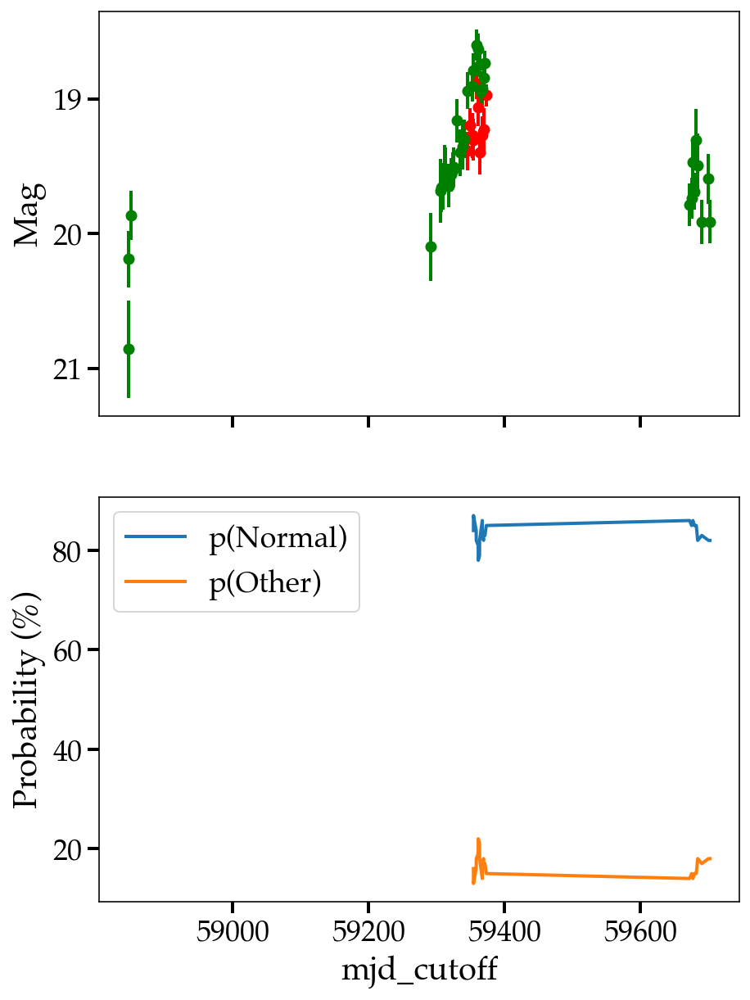

ZTF21acgrhma None
Prediction doesn't exceed anom_threshold of 50% for ZTF21acgrhma.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF21acgrhma None


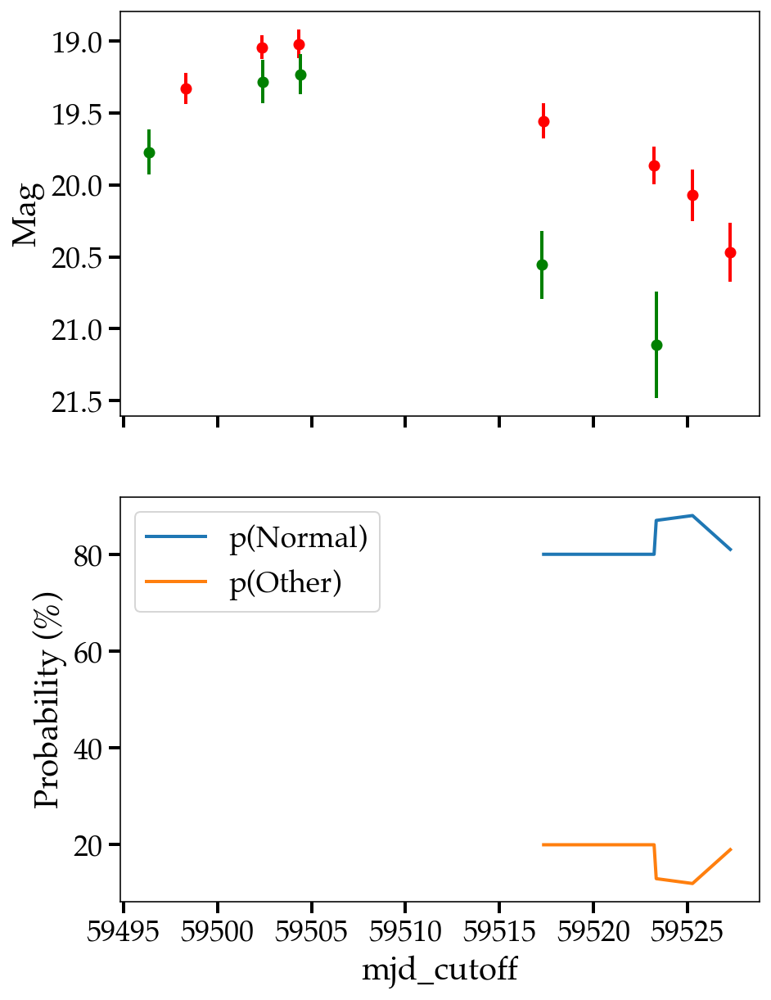

ZTF21aalghsu None
Prediction doesn't exceed anom_threshold of 50% for ZTF21aalghsu.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF21aalghsu None


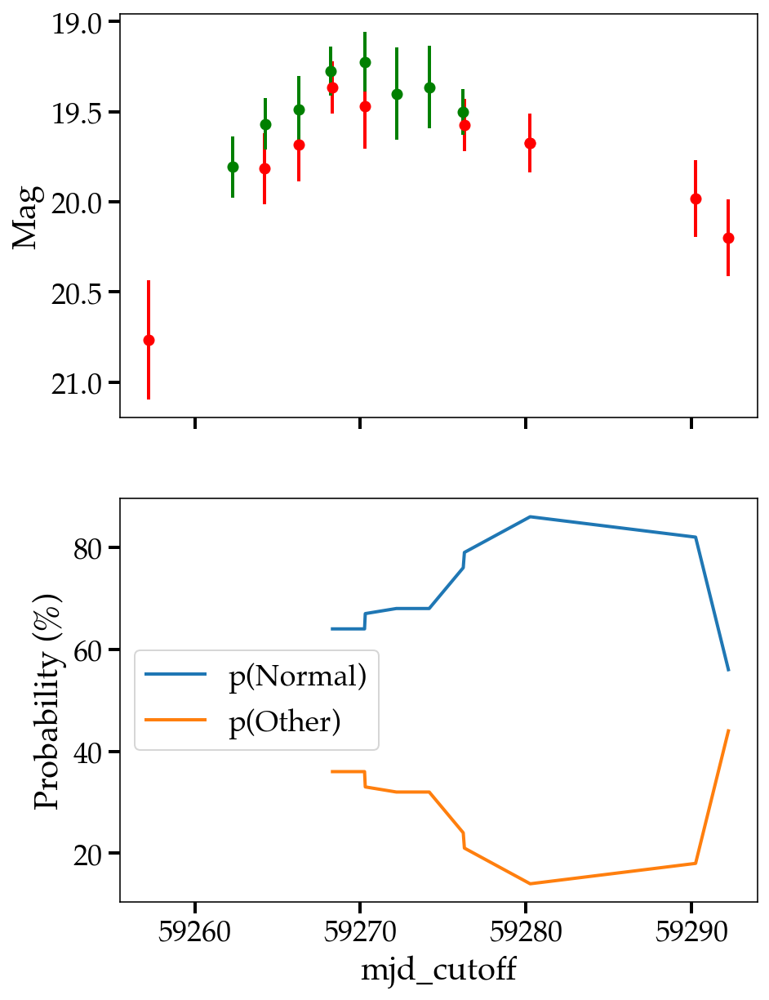

ZTF20acipeqz None
Prediction doesn't exceed anom_threshold of 50% for ZTF20acipeqz.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF20acipeqz None


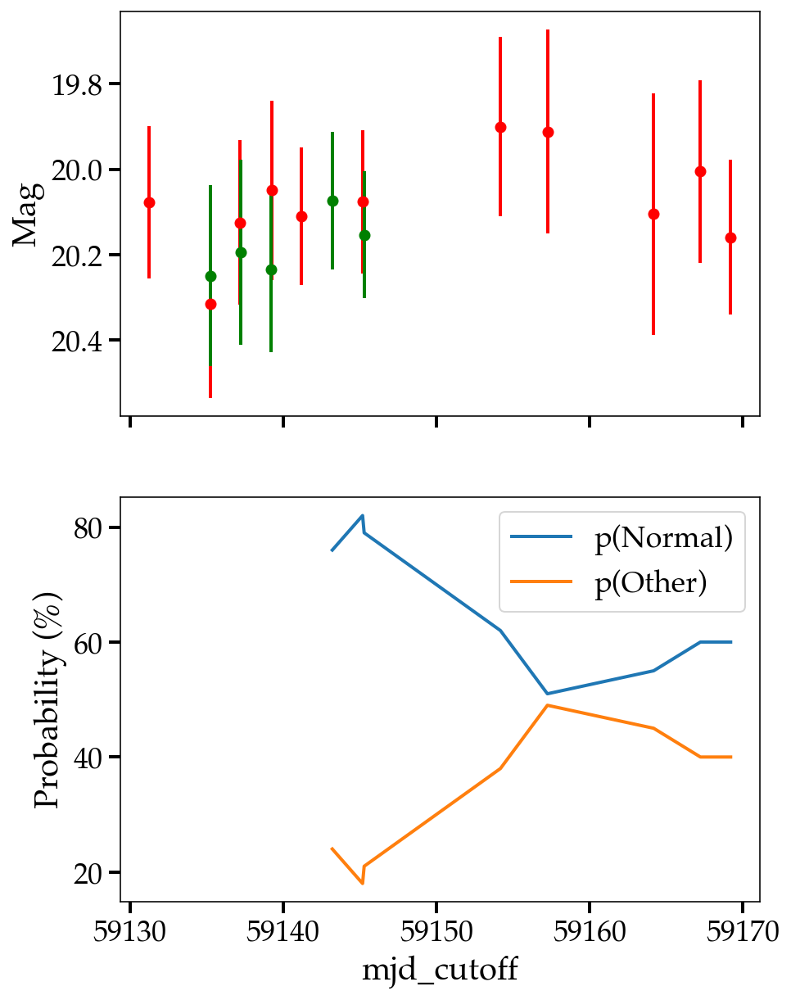

ZTF21aaijkpx None
Prediction doesn't exceed anom_threshold of 50% for ZTF21aaijkpx.


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


0
https://alerce.online/object/ZTF21aaijkpx None


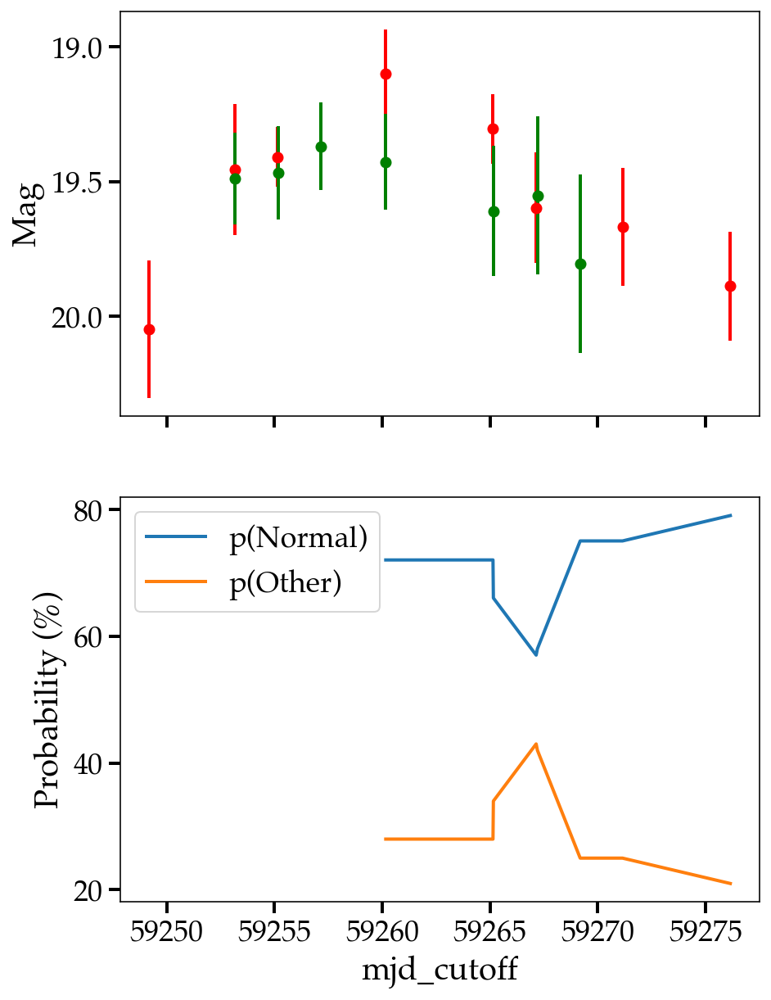

In [84]:
plot_RFC_prob_vs_lc(dataframe=x_test_phot.iloc[705:710, :], anom_thresh=50)

#### robust to stars and most bogus except AGN.

# Missed TDE??

https://alerce.online/object/ZTF20acpmojv 2020zev: (shame b/c would've tagged early too)
https://alerce.online/object/ZTF21abownod 2021ugf: either very blue Ia or TDE
https://alerce.online/object/ZTF21aazqmfh 2021stx: TDE, maybe SLSN

# Other interesting ones (not all encompassing)

https://alerce.online/object/ZTF18aazydub prob SLSN from SNAD120
https://alerce.online/object/ZTF20acphjfv  High z SN Ia w/ LSB host?
https://alerce.online/object/ZTF21aalhtgv 2021fao: Missed SLSN
https://alerce.online/object/ZTF20acpiesv 2020zoj (YSE): SN II/ IIn (Abs mag ~ -19.5 mag) that lasted 180d
https://alerce.online/object/ZTF21aagpdzy 2021bvl: missed SN Ibc
https://alerce.online/object/ZTF20actkqax: missed SLSN (and not reported?)
https://alerce.online/object/ZTF21aaeotnn 2021asj: prob slsn
https://alerce.online/object/ZTF21aaygekw 2021lhi (YSE): missed SLSN

In [62]:
# (for Non-latent space input) TDE like FLEET works, not SN Ib, SN Ic, SLSN-II...

# custom anomalous objects outside of test set

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF22aaezyos


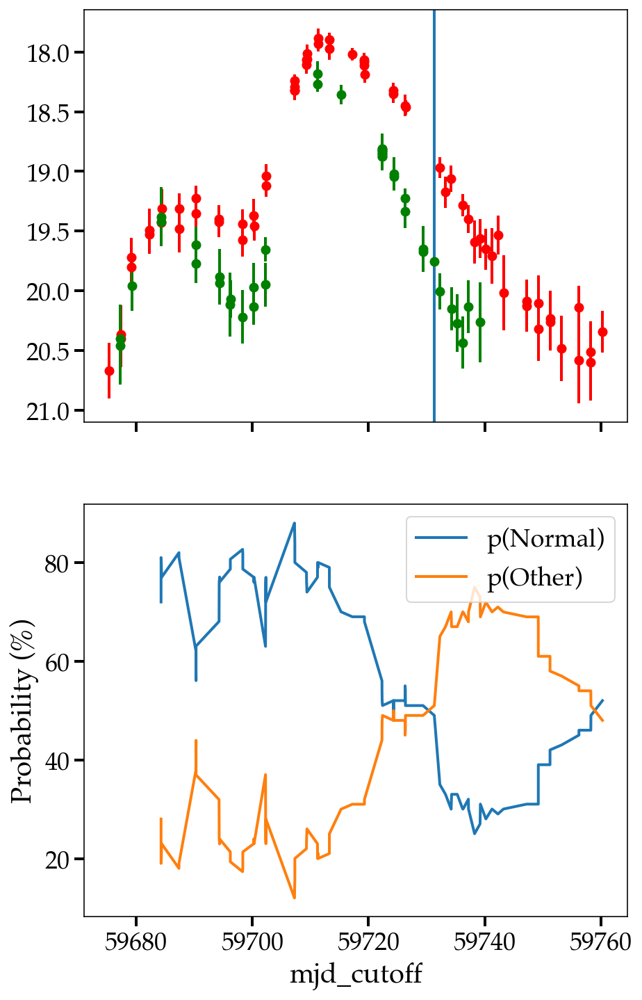

In [63]:
plot_RFC_prob_vs_lc_ztfid(anom_ztfid='ZTF22aaezyos', 
                          anom_thresh=50, 
                          #df_path = "/Users/patrickaleo/Desktop/Illinois/LAISS-antares/repo/CVAE_dataframes"
                          df_path = "/Users/patrickaleo/Desktop/Illinois/LAISS-antares/repo/figures/CVAE/SMOTE_train_test_70-30_min14_kneighbors8/256_epochs=250_latent_dim=3_10000xClassLoss/dataframes"
                         )

# TODO: add in latent space dim data with features input!!

In [29]:
# (with latent space input) TDE like FLEET works, not SN Ib, SN Ic, SLSN-II...

# See time dependence! When were things tagged interesting?

In [30]:
anom_thresh = 55
#df_path = "/Users/patrickaleo/Desktop/Illinois/LAISS-antares/repo/CVAE_dataframes"
df_path = "/Users/patrickaleo/Desktop/Illinois/LAISS-antares/repo/figures/CVAE/SMOTE_train_test_70-30_min14_kneighbors8/256_epochs=250_latent_dim=3_10000xClassLoss/dataframes"

anom_ztfid = 'ZTF22aaezyos'   #'ZTF22aaaedas'  #'ZTF21aaquhqr'  #'ZTF22aaezyos' #'ZTF21acaqdnb' #'ZTF19aamsetj' # 'ZTF20aalxlis'
#anom_ztfid = 'ZTF20aciudrr'   #'ZTF20aclgnds'  #'ZTF21abjdiok' #'ZTF21abeokcr'-border #'ZTF21aaabuoj' #'ZTF21abmspzt' #'ZTF20aciudrr' # really Ia inlier at s1,s2,s3=(0,0,0) for testing

#anom_ztfid ='ZTF20aciudrr'

#anom_ztfid = 'ZTF21aaazjia' # normal Ia
#lc_and_hosts_df = pd.read_csv(f'{df_path}/{anom_ztfid}.csv')
lc_and_hosts_df = pd.read_csv(f'{df_path}/{anom_ztfid}_timeseries.csv')

#lc_and_hosts_df = lc_and_hosts_df.set_index('ztf_object_id')
lc_and_hosts_df = lc_and_hosts_df.dropna()
lc_and_hosts_df

,ztf_object_id,obs_num,mjd_cutoff,feature_amplitude_magn_r,feature_anderson_darling_normal_magn_r,feature_beyond_1_std_magn_r,feature_beyond_2_std_magn_r,feature_cusum_magn_r,feature_eta_e_magn_r,feature_inter_percentile_range_2_magn_r,...,SN II,SN IIP,SN IIb,SN IIn,SN Ia,SN Ia-91T-like,SN Ib,SN Ic,SN Ic-BL,TDE
5,ZTF22aaezyos,10,59684.304931,0.589437,0.437856,0.285714,0.0,0.436823,30156.774154,1.178875,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
6,ZTF22aaezyos,11,59684.305393,0.589437,0.437856,0.285714,0.0,0.436823,30156.774154,1.178875,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
7,ZTF22aaezyos,12,59684.348762,0.622750,0.544949,0.250000,0.0,0.430437,30193.484777,1.245501,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
8,ZTF22aaezyos,13,59684.399468,0.681070,0.581715,0.444444,0.0,0.418303,19367.827935,1.362141,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
9,ZTF22aaezyos,14,59687.383322,0.681070,0.707230,0.300000,0.0,0.407507,23824.348072,1.362141,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,ZTF22aaezyos,96,59756.220231,1.393237,1.677086,0.491803,0.0,0.423914,7161.339238,2.715008,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
92,ZTF22aaezyos,97,59756.222107,1.393237,1.697444,0.500000,0.0,0.423758,9134.326249,2.713023,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
93,ZTF22aaezyos,98,59758.264468,1.393237,1.656990,0.492063,0.0,0.421838,8870.021307,2.720691,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
94,ZTF22aaezyos,99,59758.283218,1.393237,1.654980,0.515625,0.0,0.420494,8273.296064,2.718960,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [31]:
anom_obj_df = lc_and_hosts_df[x_test.columns]
anom_obj_df

,feature_amplitude_magn_r,feature_anderson_darling_normal_magn_r,feature_beyond_1_std_magn_r,feature_beyond_2_std_magn_r,feature_cusum_magn_r,feature_inter_percentile_range_2_magn_r,feature_inter_percentile_range_10_magn_r,feature_inter_percentile_range_25_magn_r,feature_kurtosis_magn_r,feature_linear_fit_slope_magn_r,...,yKronRad,yExtNSigma,i-z,gApMag_gKronMag,rApMag_rKronMag,iApMag_iKronMag,zApMag_zKronMag,yApMag_yKronMag,7DCD,dist/DLR
5,0.589437,0.437856,0.285714,0.0,0.436823,1.178875,1.117517,0.815537,-1.933226,-0.162193,...,2.75986,11.0589,-0.169199,0.091301,0.059401,0.0732,0.254101,-0.025002,32.441865,0.229362
6,0.589437,0.437856,0.285714,0.0,0.436823,1.178875,1.117517,0.815537,-1.933226,-0.162193,...,2.75986,11.0589,-0.169199,0.091301,0.059401,0.0732,0.254101,-0.025002,32.441865,0.229362
7,0.622750,0.544949,0.250000,0.0,0.430437,1.245501,1.144123,0.872781,-1.591579,-0.131938,...,2.75986,11.0589,-0.169199,0.091301,0.059401,0.0732,0.254101,-0.025002,32.441865,0.229362
8,0.681070,0.581715,0.444444,0.0,0.418303,1.362141,1.206965,0.898657,-1.253605,-0.130593,...,2.75986,11.0589,-0.169199,0.091301,0.059401,0.0732,0.254101,-0.025002,32.441865,0.229362
9,0.681070,0.707230,0.300000,0.0,0.407507,1.362141,1.224514,0.940102,-0.970987,-0.100963,...,2.75986,11.0589,-0.169199,0.091301,0.059401,0.0732,0.254101,-0.025002,32.441865,0.229362
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,1.393237,1.677086,0.491803,0.0,0.423914,2.715008,2.242063,1.352417,-1.173598,-0.002104,...,2.75986,11.0589,-0.169199,0.091301,0.059401,0.0732,0.254101,-0.025002,32.441865,0.229362
92,1.393237,1.697444,0.500000,0.0,0.423758,2.713023,2.232467,1.387230,-1.191989,-0.000450,...,2.75986,11.0589,-0.169199,0.091301,0.059401,0.0732,0.254101,-0.025002,32.441865,0.229362
93,1.393237,1.656990,0.492063,0.0,0.421838,2.720691,2.278589,1.396633,-1.187418,0.000201,...,2.75986,11.0589,-0.169199,0.091301,0.059401,0.0732,0.254101,-0.025002,32.441865,0.229362
94,1.393237,1.654980,0.515625,0.0,0.420494,2.718960,2.314863,1.439628,-1.197615,0.001179,...,2.75986,11.0589,-0.169199,0.091301,0.059401,0.0732,0.254101,-0.025002,32.441865,0.229362


In [32]:
pred_prob_anom = 100 * clf.predict_proba(anom_obj_df)

orig = pd.read_csv(f'{df_path}/{anom_ztfid}_timeseries.csv')
diff = len(orig)-len(pred_prob_anom)
anom_idx = lc_and_hosts_df.loc[np.where(pred_prob_anom[:, 1]>=anom_thresh)[0][0]].obs_num + diff

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


https://alerce.online/object/ZTF22aaezyos


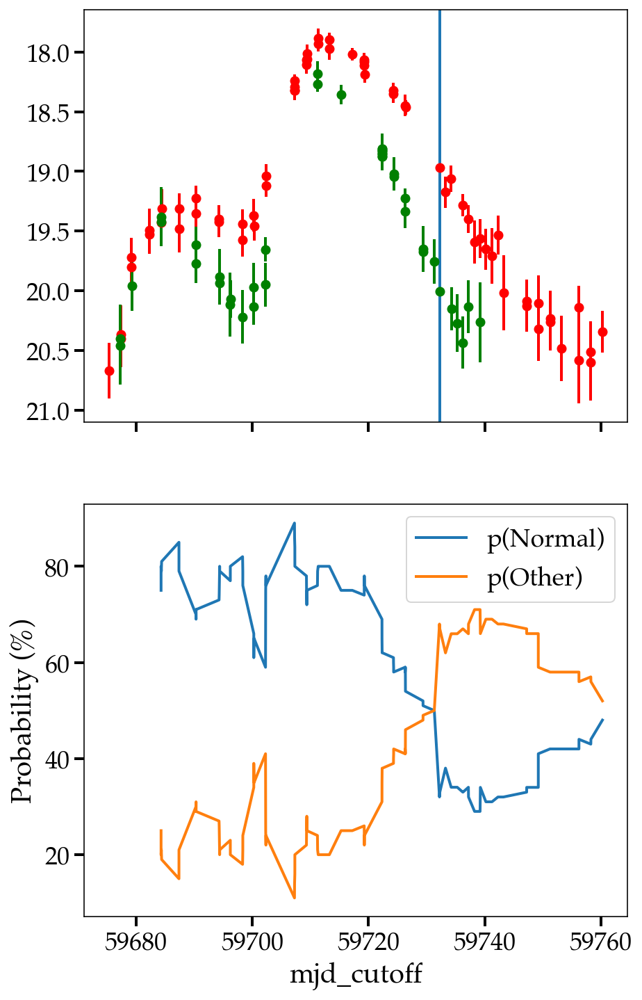

In [33]:
# Predict Excluded Object
import antares_client
ztf_id_ref = anom_ztfid 

ref_info = antares_client.search.get_by_ztf_object_id(ztf_object_id=ztf_id_ref)

df_ref = ref_info.timeseries.to_pandas()

df_ref_g = df_ref[(df_ref.ant_passband == 'g') & (~df_ref.ant_mag.isna())]
df_ref_r = df_ref[(df_ref.ant_passband == 'R') & (~df_ref.ant_mag.isna())]

mjd_idx_at_min_mag_r_ref = df_ref_r[['ant_mag']].reset_index().idxmin().ant_mag
mjd_idx_at_min_mag_g_ref = df_ref_g[['ant_mag']].reset_index().idxmin().ant_mag

fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(7,12))
ax1.invert_yaxis()
ax1.errorbar(x=df_ref_r.ant_mjd, y=df_ref_r.ant_mag, yerr=df_ref_r.ant_magerr, fmt='o', c='r', 
            label=f'REF: {ztf_id_ref}')
ax1.errorbar(x=df_ref_g.ant_mjd, y=df_ref_g.ant_mag, yerr=df_ref_g.ant_magerr, fmt='o', c='g')
ax1.axvline(x=lc_and_hosts_df[lc_and_hosts_df.obs_num == anom_idx].mjd_cutoff.values[0])
#ax1.set_xlim(min(df_ref_r.ant_mjd), max(df_ref_r.ant_mjd))

print(f'https://alerce.online/object/{anom_ztfid}')
ax2.plot(lc_and_hosts_df['mjd_cutoff'], pred_prob_anom[:, 0], label='p(Normal)')
ax2.plot(lc_and_hosts_df['mjd_cutoff'], pred_prob_anom[:, 1], label='p(Other)')
#ax2.axhline(y=50)

#ax2.set_xlim(min(df_ref_r.ant_mjd), max(df_ref_r.ant_mjd))

plt.xlabel('mjd_cutoff')
plt.ylabel('Probability (%)')
plt.legend()
plt.show()

In [34]:
# gets ZTF22aaezyos/2022hgk (double peak Ib at z=0.033 at ~18.8mag)
# gets ZTF20aalxlis/2020bvc (Ic-BL at z=0.02 at ~19mag)

### all objects in test set.

ZTF21abflgpq SN Ia
ZTF21abkaoxe SN Ia
ZTF20acpkled SN Ia
ZTF21aaazjia SN Ia
ZTF21acqyqwu SN Ib
ZTF20acvdqtg SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aaabwem SN IIP
ZTF20acqzpta SN Ia
ZTF21abhrmrv SN Ia
ZTF21aaabuoj SN Ia
ZTF20acbiwri SN II
ZTF20abarsvz SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

15
https://alerce.online/object/ZTF20abarsvz SN Ia


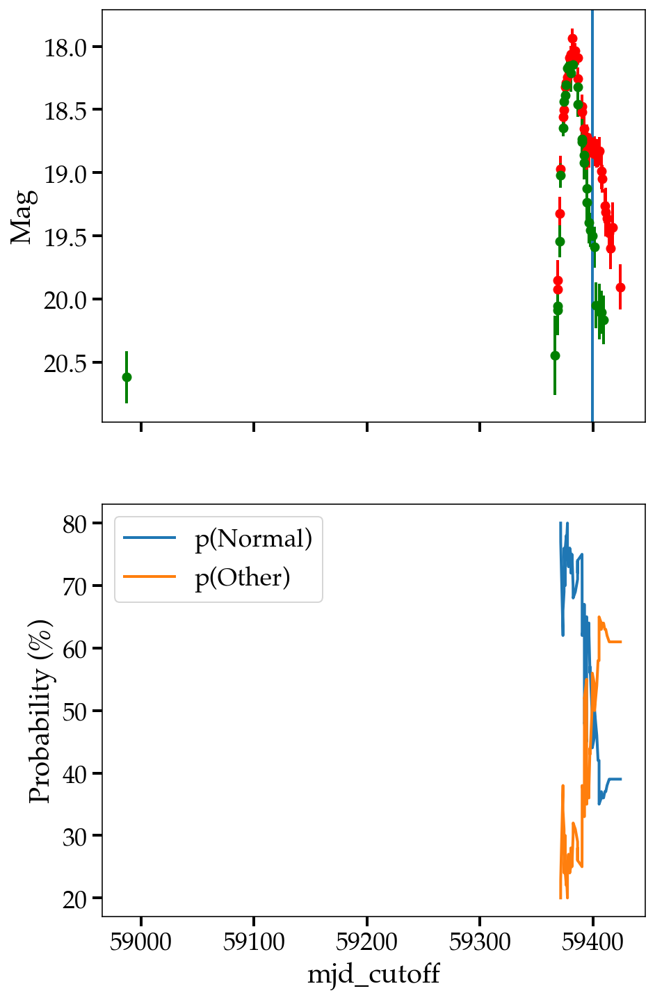

ZTF21abrxoir SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


13
https://alerce.online/object/ZTF21abrxoir SN Ia


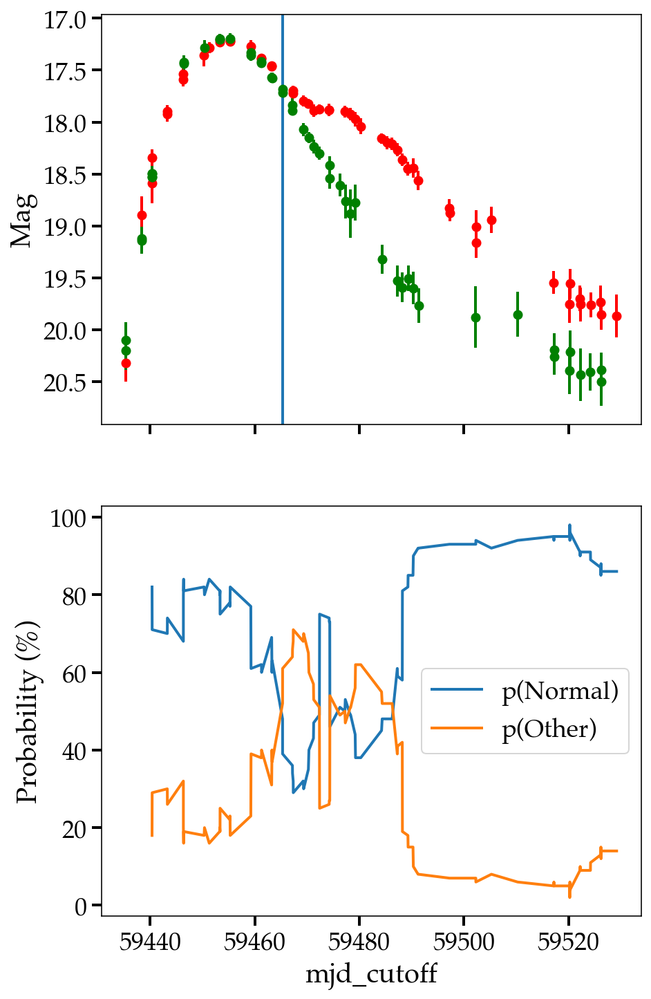

ZTF21aaagzee SN Ia
ZTF21abfxjkq SN II
ZTF21abcnkbe SN Ia
ZTF21aciqcge SN Ia
ZTF20acwfftd SN Ia
ZTF21abzbwfo SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

1
https://alerce.online/object/ZTF21abzbwfo SN II


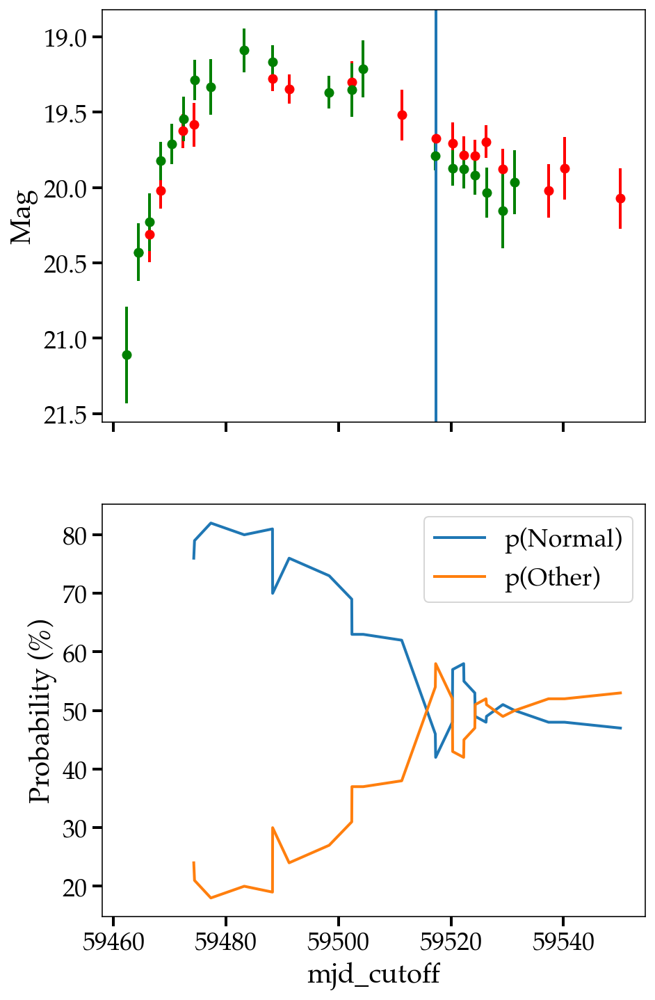

ZTF21aahzspd SN Ia
ZTF21aalnhby SN Ia
ZTF21abizxkw SN Ia
ZTF21abjaksr SN Ia
ZTF20aciudrr SN Ia
ZTF21aarejnt SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aaxzbrn SN Ia
ZTF20abwxywy SN Ic


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


8
https://alerce.online/object/ZTF20abwxywy SN Ic


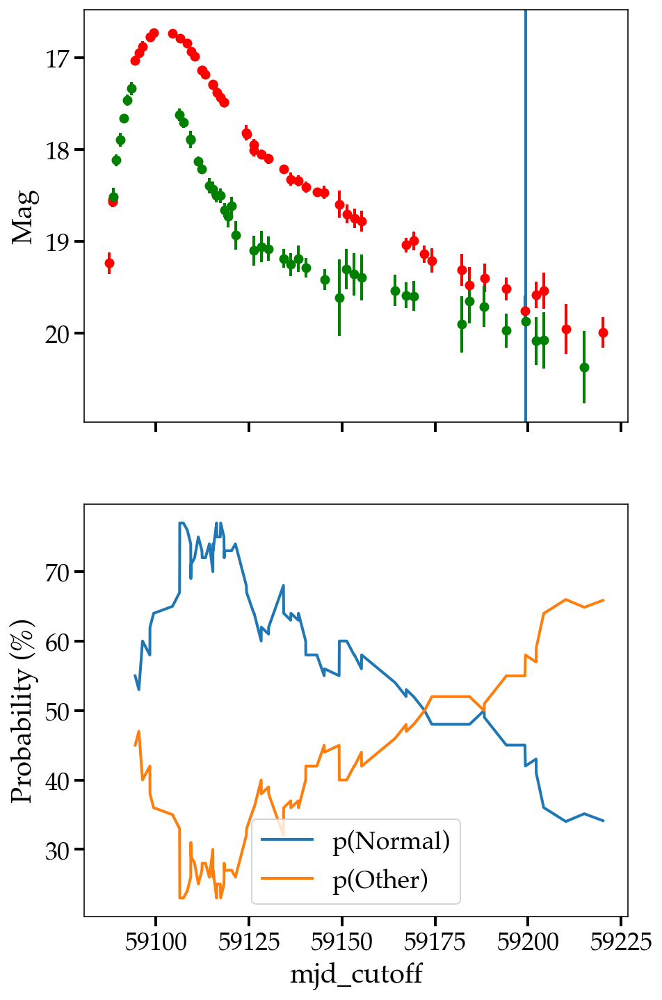

ZTF21aamucom SN Ia-91T-like
ZTF18aaisqmw SN Ia
ZTF20acowcee SN Ia
ZTF21aajuerd SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


ZTF21abchjer SN Ic-BL
ZTF21aaizyqc SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


20
https://alerce.online/object/ZTF21aaizyqc SN II


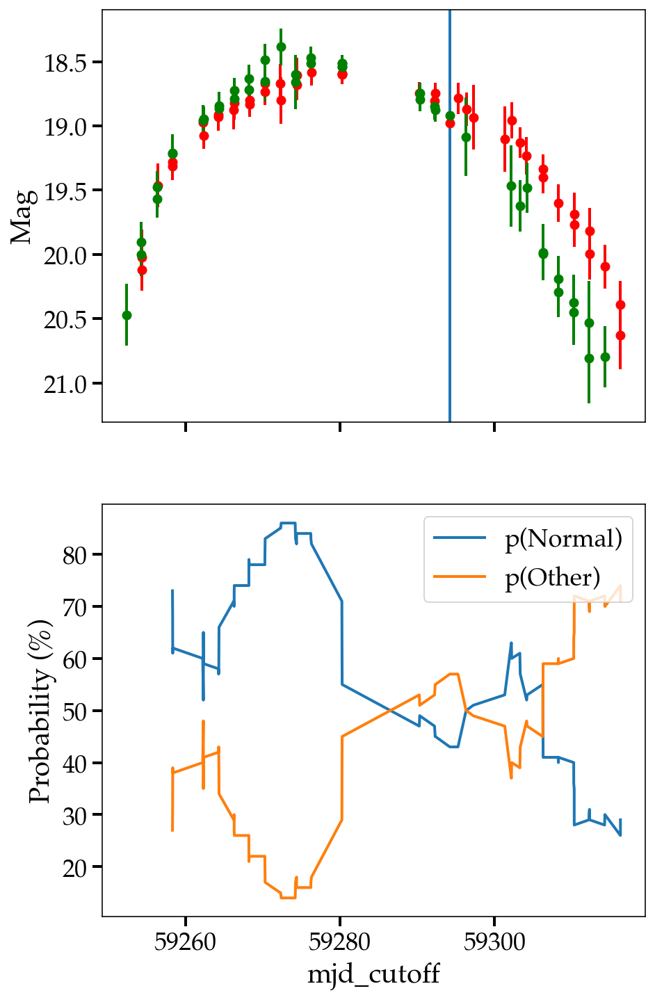

ZTF21acefbte SN Ia
ZTF21aapzzgf SN Ia
ZTF20abtjjhb SN IIn
ZTF21aaffxdt SN IIn
ZTF21acaegsr SN Ia
ZTF21aabygea SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aaczpca SN Ia


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

ZTF22aaafdna SN Ia
ZTF21aamwqim SN II
ZTF21acnfoqn SN II
ZTF21aajvukh SN II
4
https://alerce.online/object/ZTF21aajvukh SN II


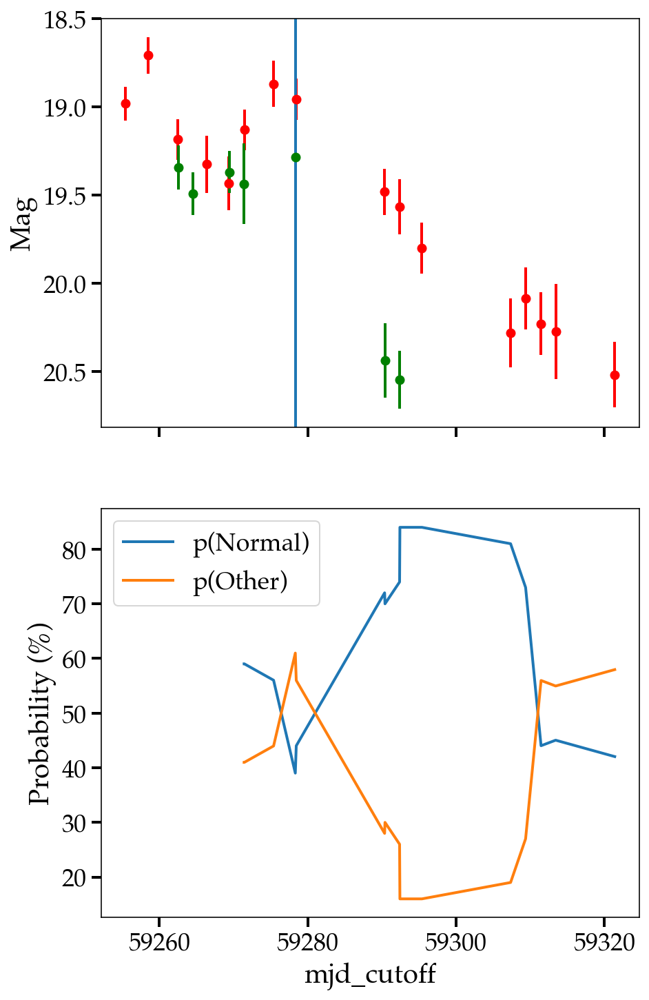

ZTF21aakybgi SN Ia
ZTF21aapkhsc SN Ia
ZTF18aayyqia SN Ia
ZTF21abqpwpu SN Ia
ZTF20acqlcge SN Ia
ZTF21aafmkjk SN IIn


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF20achtpbn SN Ia
ZTF21acgyzel SN Ia
ZTF20acxncha SN Ia
ZTF21aarwlht SN Ia
ZTF20actekrw SN Ic


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

1
https://alerce.online/object/ZTF20actekrw SN Ic


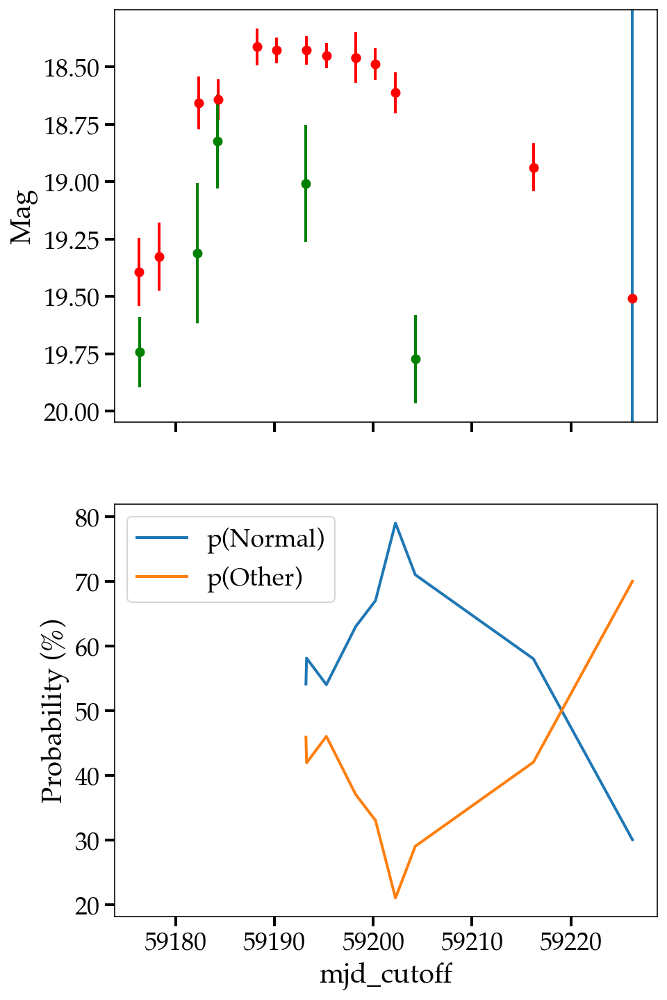

ZTF20acwyihb SN Ia
ZTF21aaxtdrs SN Ia
ZTF21abcmtev SN II
ZTF21abjdqbo SN Ia
ZTF21abrzsol SN Ia
couldn't feature space as func of time for ZTF21abrzsol. Make anom epoch -9
ZTF20acyydkh TDE
ZTF21abcnpnk SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

1
https://alerce.online/object/ZTF21abcnpnk SN Ia


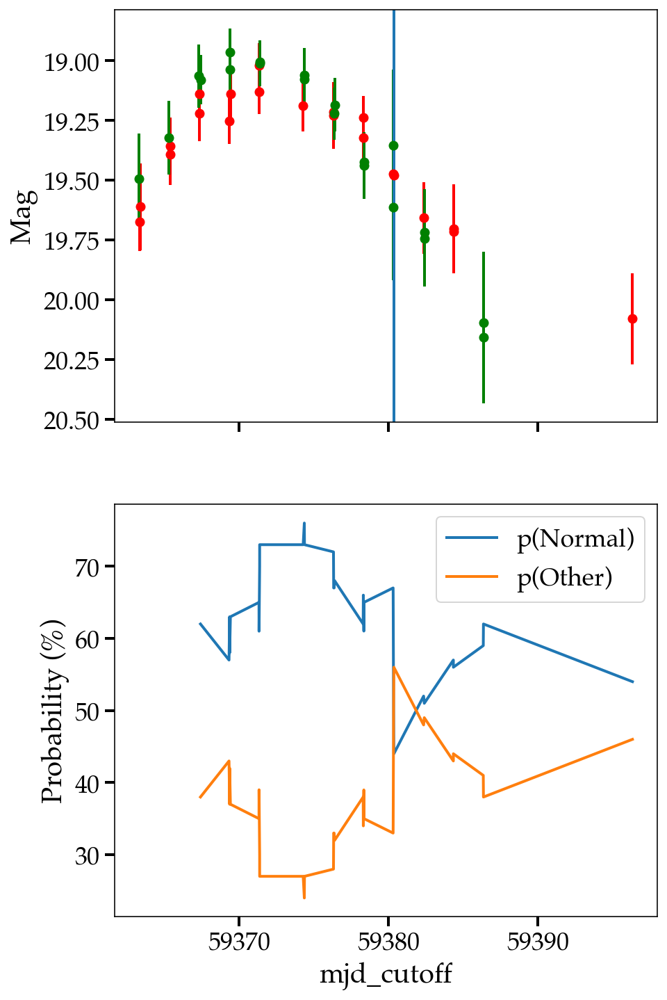

ZTF20abyzomt SN II
ZTF21aaabwfu SN IIb
ZTF20acpwjus SN Ia-91T-like
ZTF21aagtqgz SN Ia-91T-like
ZTF20abywydb SN II
ZTF22aaabnwa SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aaabzap SN Ia


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

ZTF22aaaeeva SN Ia
ZTF21abxknvv SN Ia
ZTF21aakigqr SN II
ZTF21abhttll SN Ia
ZTF20accmtgt SN Ia


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


19
https://alerce.online/object/ZTF20accmtgt SN Ia


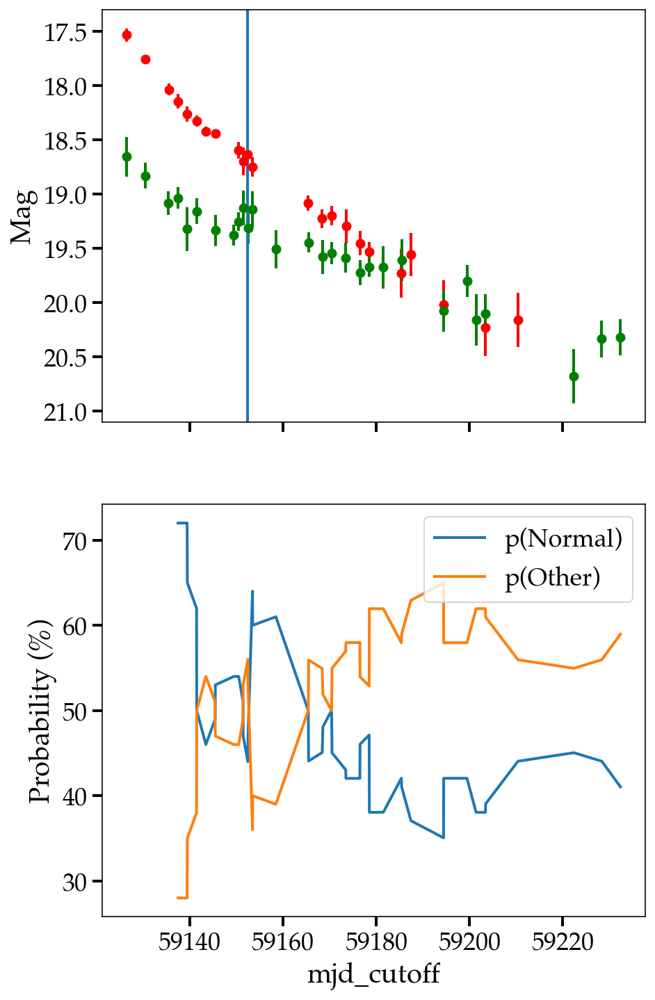

ZTF20abvquuo SN Ib
ZTF21achkgap SN Ia
ZTF21aarohyu SN Ia
ZTF21abjdiok SN Ia
ZTF21acdoydr SN Ia
ZTF21aaqzqaa SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21abkkwie SN Ia
ZTF19abstsvm SN IIn
ZTF22aaafdrn SN Ia
ZTF20acueziy SN Ic
ZTF20acuoclk SN Ia
ZTF21acdcxfz SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aasufxv SN Ia
ZTF18abufaej SN II
ZTF21aautijg SN IIn


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


4
https://alerce.online/object/ZTF21aautijg SN IIn


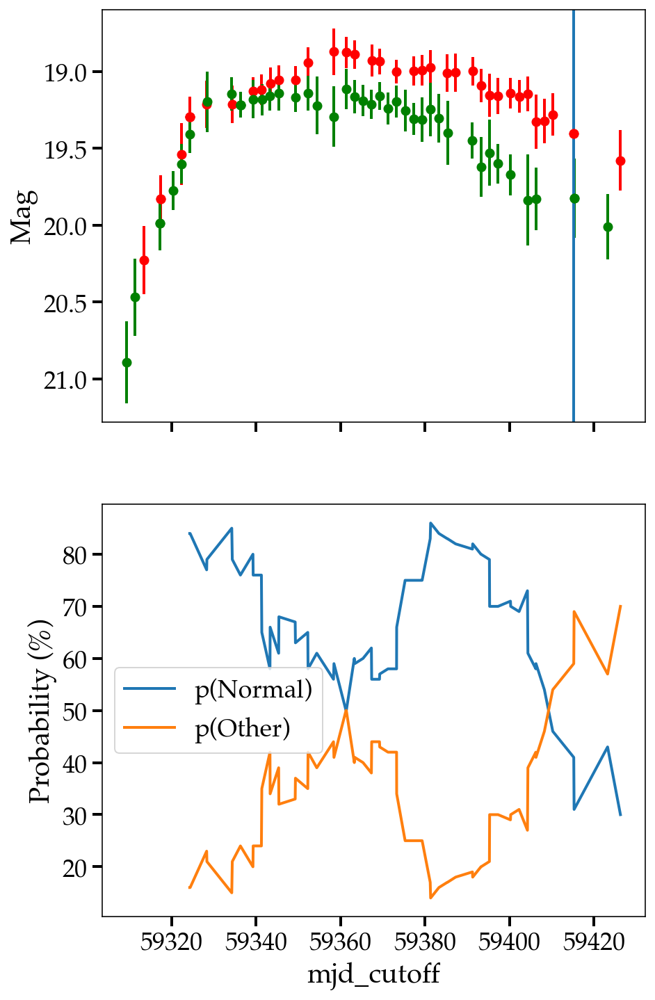

ZTF21aarasvn SN II
ZTF20acjdhof SN Ia-91T-like
ZTF21aaxstzy SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


7
https://alerce.online/object/ZTF21aaxstzy SN Ia


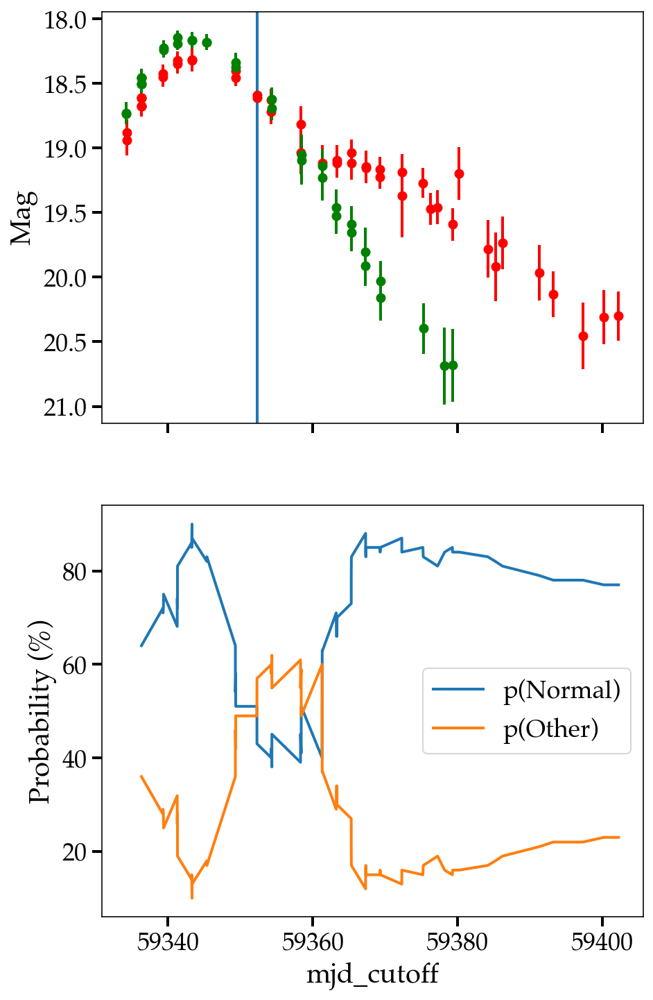

ZTF21aalxurx SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


1
https://alerce.online/object/ZTF21aalxurx SN II


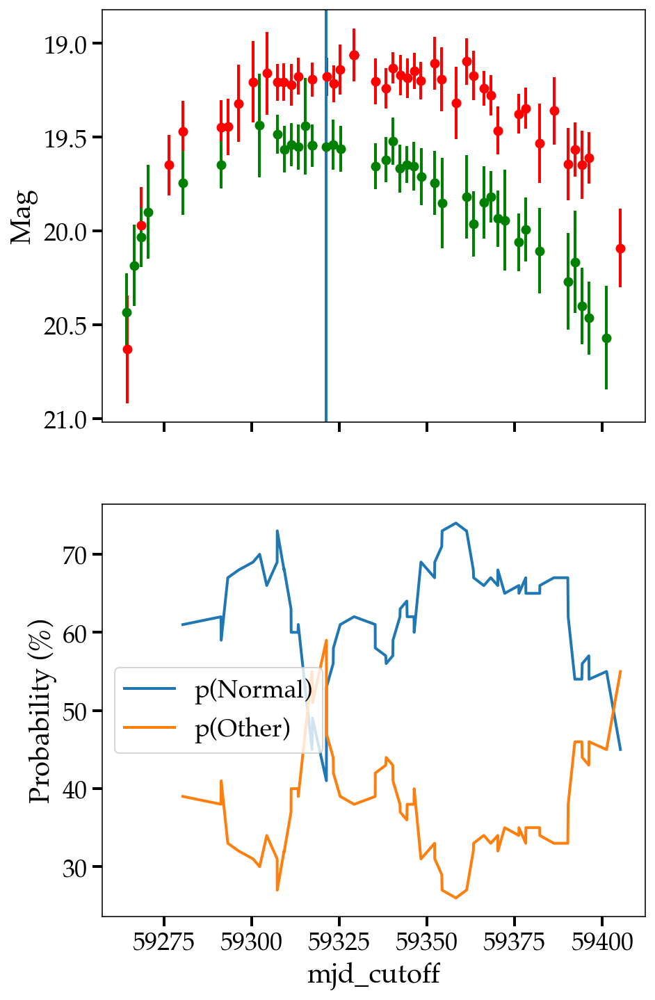

ZTF21aawckpe SN Ia
ZTF21aawlwoy SN Ia
ZTF21aaadiap SN Ia
ZTF21aaqzkhx SN Ia
ZTF18abrfccm SN Ia
ZTF20acsesce SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF20acxbbaj SN Ia
ZTF21aadacxv SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


17
https://alerce.online/object/ZTF21aadacxv SN II


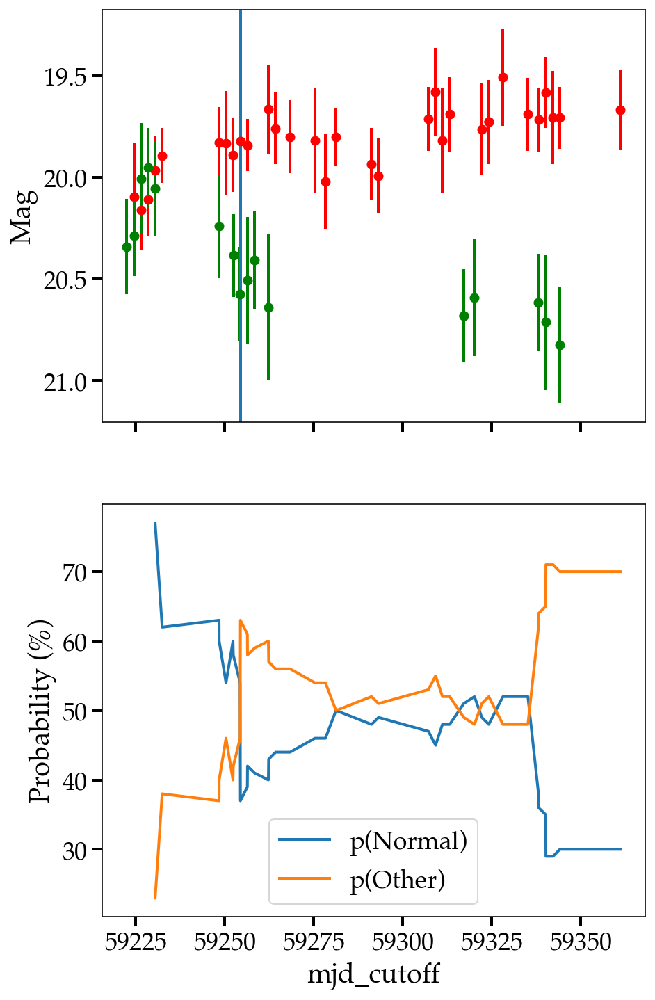

ZTF20acfkyll SN II
ZTF21absbwyz SN Ia
ZTF20acuzlib SN Ia
ZTF21abicgai SN Ia
ZTF21aalydkl SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21acaqdnb SN Ia
ZTF21abmwgow SN Ia
ZTF21aadkhte SN II
ZTF22aaailga SN Ia
ZTF21aagmoqw SN Ia
ZTF20acywefl SN Ia


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Usi

ZTF21abidxwo SN II
ZTF21abzgzvs SN Ia
ZTF20acxqxyw SN Ib


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


5
https://alerce.online/object/ZTF20acxqxyw SN Ib


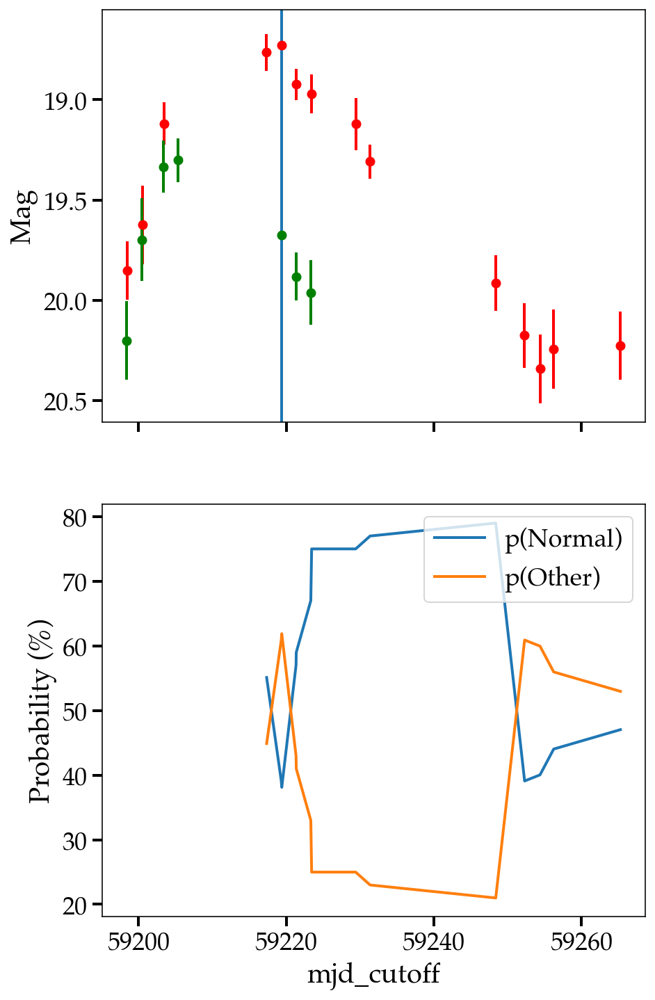

ZTF21aagyxgr SN Ia
ZTF21abvqrln SN Ia
ZTF21abpland SN Ia
ZTF21acbjxhr SN Ia
ZTF20abweedo SN Ia
ZTF21aalenaa SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF20acmbhgy SN Ia
ZTF21aaoekcj SN Ia
ZTF21aazazvw SN Ia
ZTF21abplsmq SN Ia
ZTF20actkutp SN II
ZTF21abtuutw SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21abwdzio SN Ia
ZTF21abxpinb SN Ia
ZTF21abcgnqn TDE


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


7
https://alerce.online/object/ZTF21abcgnqn TDE


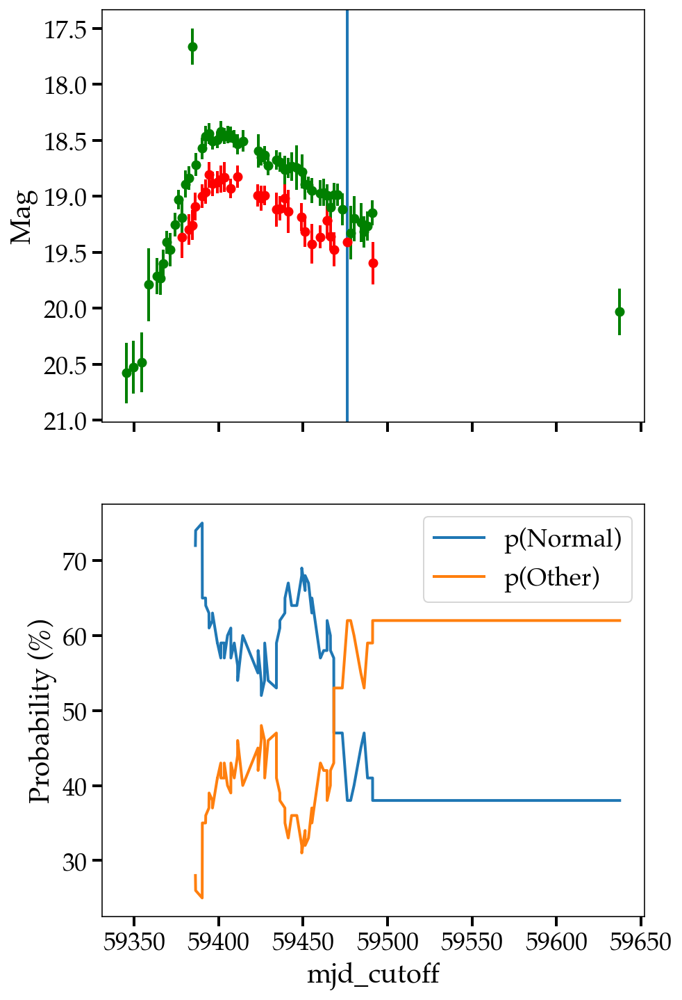

ZTF21abnvsic SN Ia
ZTF21aarytbc SN II
ZTF20acvjagm SN II
ZTF21abbzcxe SN Ia
ZTF18aawitry SN Ia
ZTF21aazwtoz SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aavxruq SN Ia
ZTF21aaluoym SN Ia
ZTF21abbuxfm SN Ia
ZTF20actveqm SN Ia
ZTF21ackeofr SN Ia
ZTF20acuhgar SN II


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


28
https://alerce.online/object/ZTF20acuhgar SN II


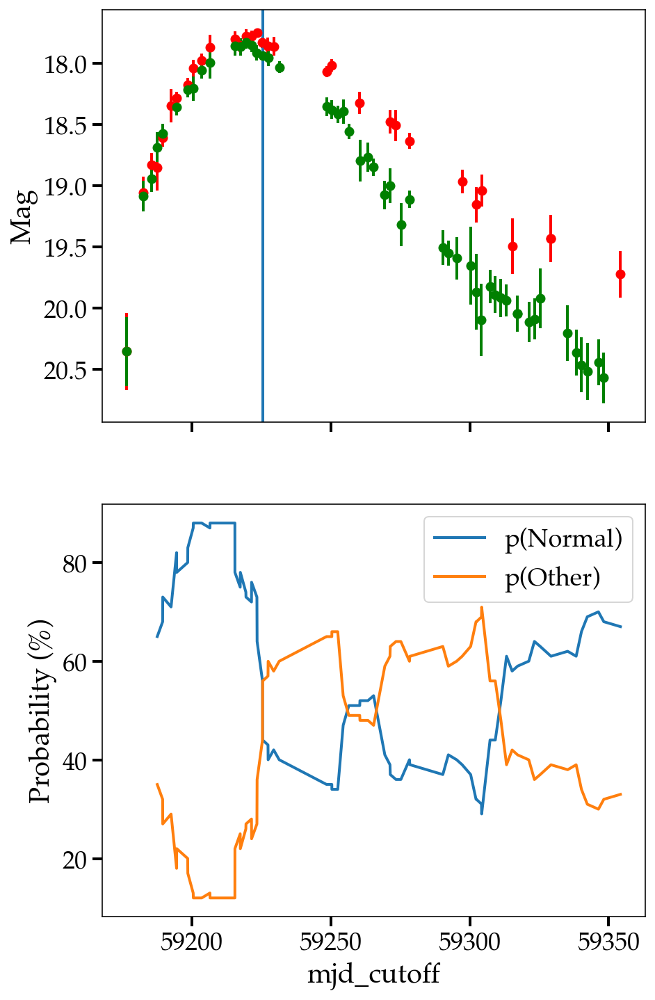

ZTF20aczgvcg SN Ia
ZTF20acpknjk SN Ia
ZTF21acjosgg SN Ia
ZTF21acajcyb SN Ia
ZTF20abvowvw SN Ia
ZTF22aaaepjq SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF18acvgjqv SN IIn


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


25
https://alerce.online/object/ZTF18acvgjqv SN IIn


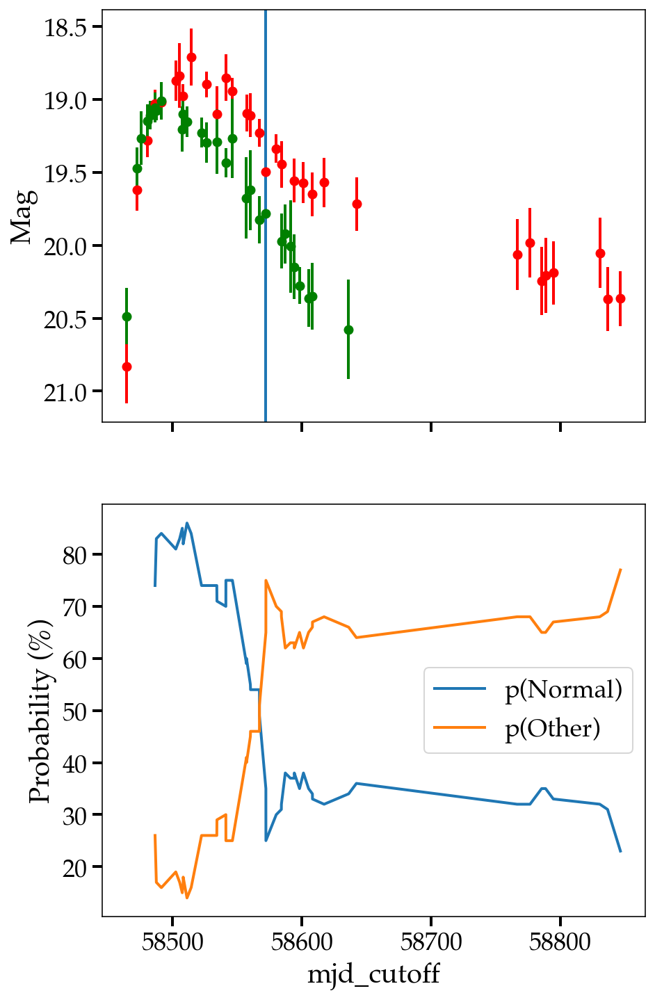

ZTF18aacnlxz SN II
ZTF20acflmyv SN Ia
ZTF20acxznai SN Ia
ZTF21abfxlvo SN Ia
ZTF20achtubm SN Ia
ZTF18aaiwewk SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21abuuuuj SN Ia
ZTF21aahsqng SN Ia
ZTF20achoqvb SN Ia
ZTF21abbkvrt SN Ia
ZTF22aaahhbo SN II
ZTF18aaoxrup SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF18abrebsb SN Ia
ZTF21aayyxum SN Ia
ZTF21abicckd SN Ia
ZTF20acusecr SN IIb
ZTF21acmrdga SN IIb
ZTF21abviabc SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aaxubqf SN Ia
ZTF21aasgcve SN Ia-91T-like
ZTF21aaagypx SN IIP
ZTF20acxtdcm SN II
ZTF20acrerzb SN Ia
ZTF18aaqnxjb SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF22aaaedas TDE


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

ZTF20acajvrj SN Ia
ZTF20aciuciv SN II
ZTF21aappktx SN Ia
ZTF21abbwbja SN Ia
ZTF20aatxryt SN Ia
couldn't feature space as func of time for ZTF20aatxryt. Make anom epoch -9
ZTF21acizsaz SN Ia
ZTF18acbvgtu SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF20acnagjb SN Ia
ZTF21abaxaqq TDE
ZTF22aaabnan SN Ia
ZTF20aclnplo SN Ic
ZTF18acsremz SN Ia
ZTF18acaqdaa TDE


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


68
https://alerce.online/object/ZTF18acaqdaa TDE


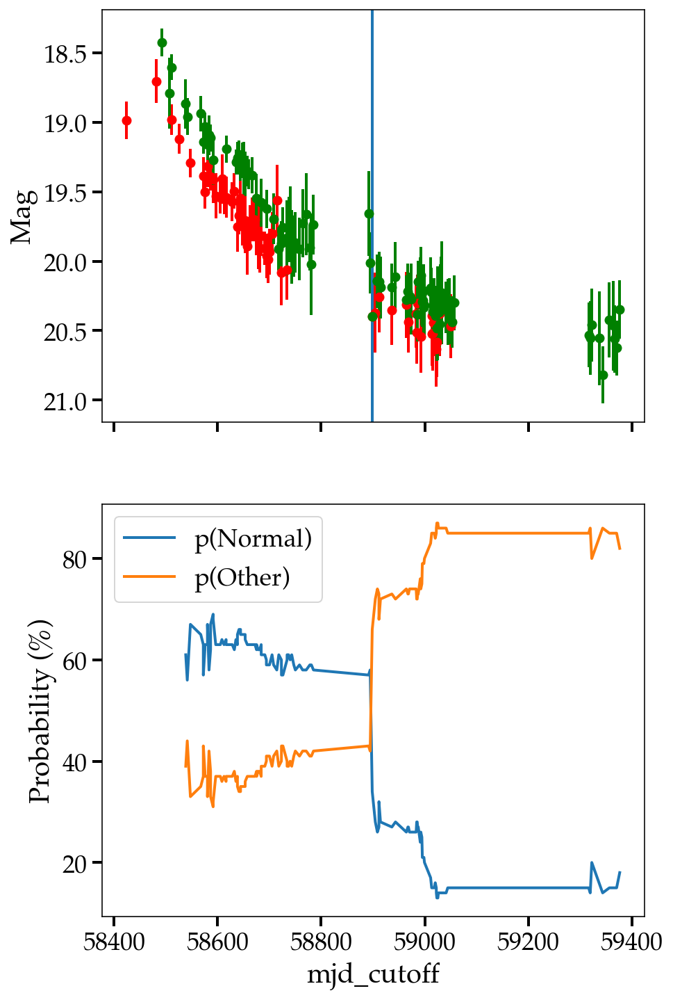

ZTF21aaphlty SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


1
https://alerce.online/object/ZTF21aaphlty SN Ia


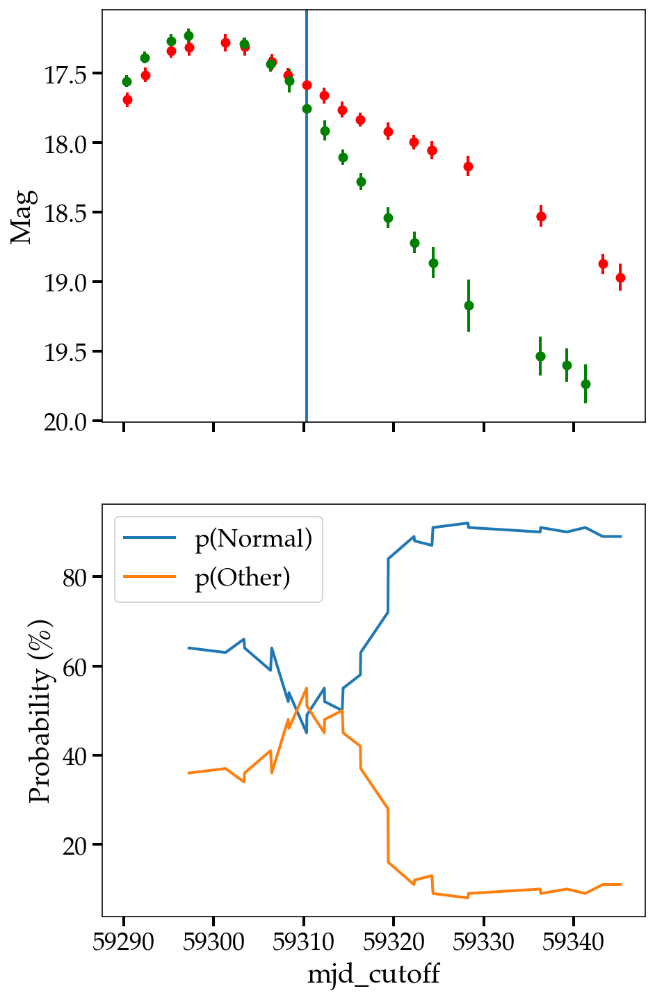

ZTF20acgznau SN Ia
ZTF20actpbck SN Ia
ZTF21achqiue SN Ia
ZTF21aaswtok SN Ia
ZTF21aapkfjx SN Ia
ZTF21aagsypp SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF20acpxvez SN Ia


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

ZTF20acfnuee SN Ia
ZTF21acmnpqa SN Ia
ZTF21aagtill SN Ia
ZTF20acwncbd SN Ia
ZTF20acyroke SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


27
https://alerce.online/object/ZTF20acyroke SN Ia


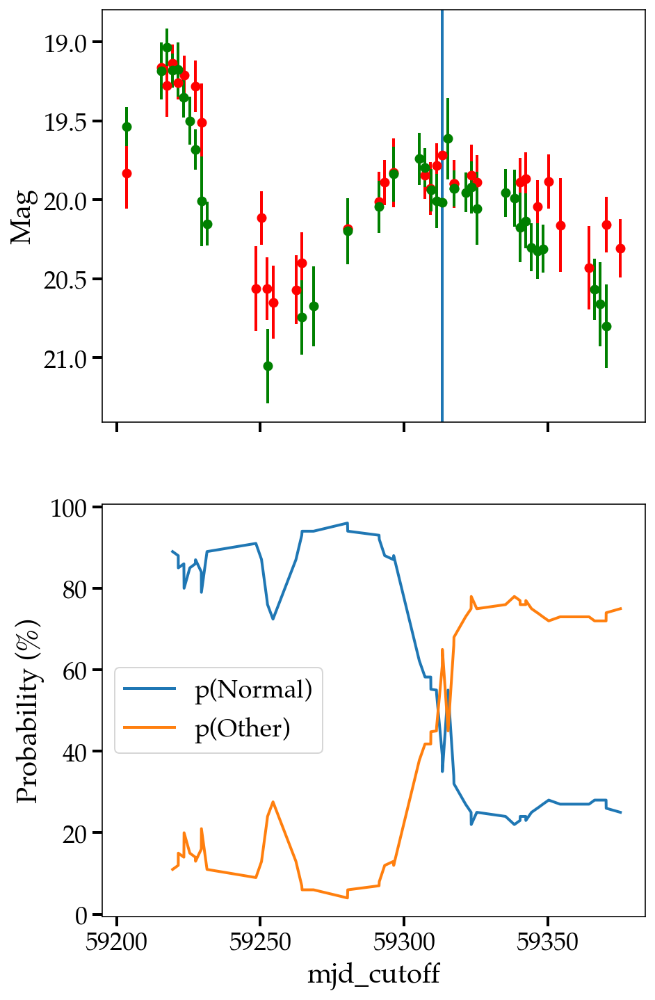

ZTF20accodxy SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


1
https://alerce.online/object/ZTF20accodxy SN Ia


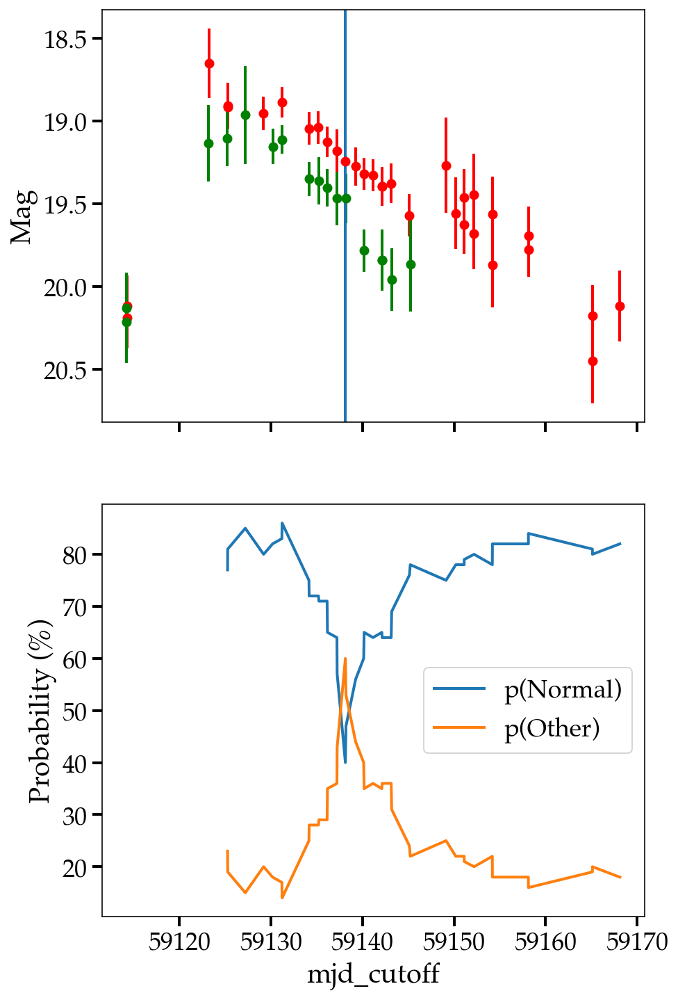

ZTF19aaeuhgo SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished


18
https://alerce.online/object/ZTF19aaeuhgo SN II


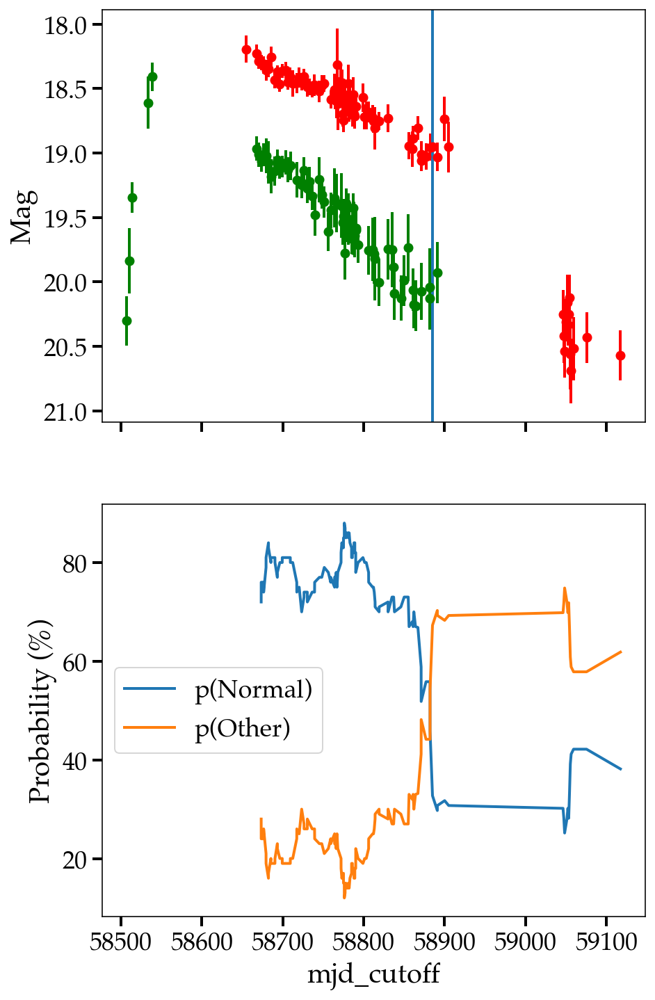

ZTF21aabyqps SN Ia
ZTF21acmresp SN Ia
ZTF21abdlyrc SN Ia
ZTF21aaaokyp TDE


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


25
https://alerce.online/object/ZTF21aaaokyp TDE


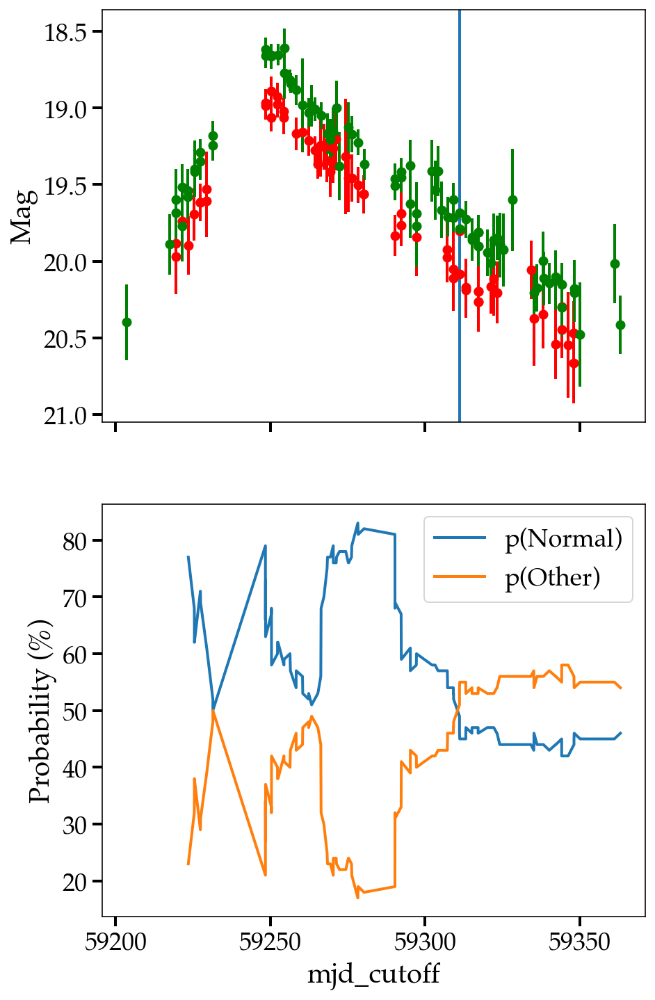

ZTF21aajgdpo SN II
ZTF21aadzuil SN Ia
ZTF21aabgdda SN Ia
ZTF18acuimze SN Ia
ZTF22aaaepao SN II
ZTF21aapvvtb TDE


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

17
https://alerce.online/object/ZTF21aapvvtb TDE


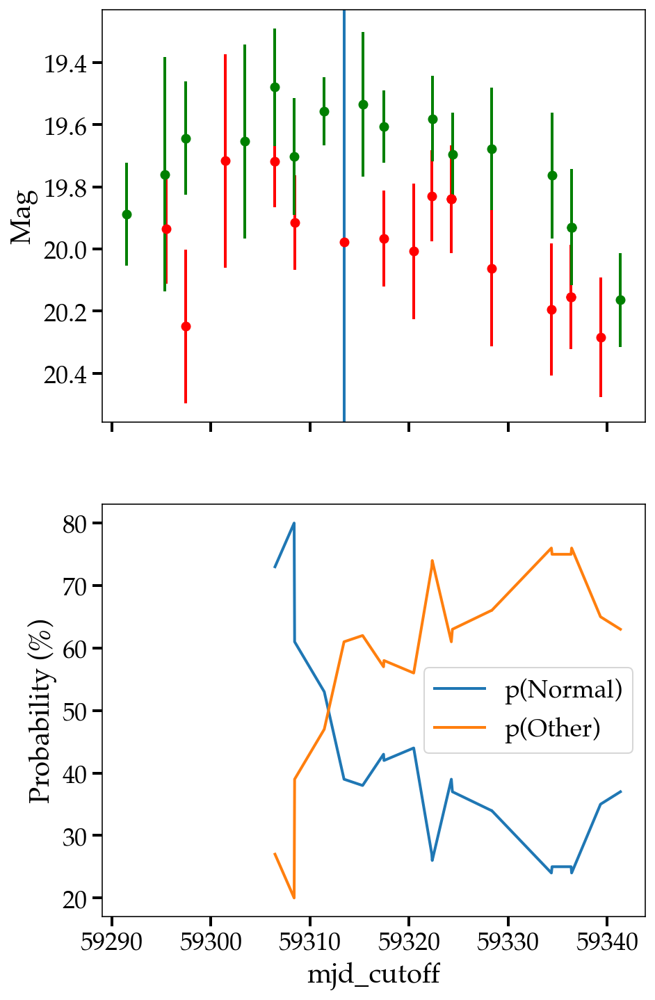

ZTF21abzkgvc SN Ia
ZTF21aaahyjj SN Ia-91T-like


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


3
https://alerce.online/object/ZTF21aaahyjj SN Ia-91T-like


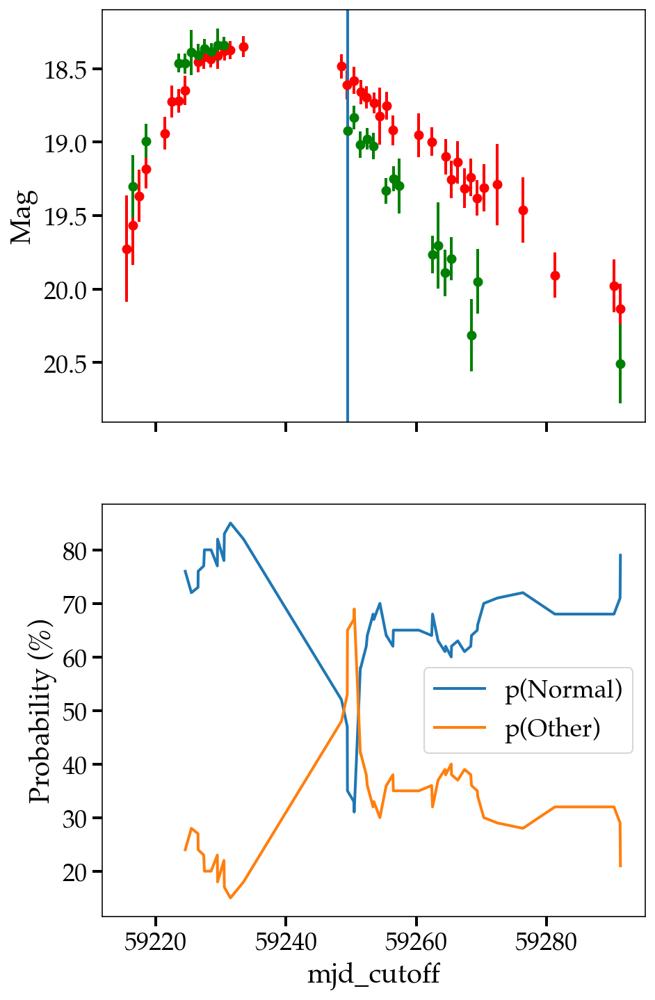

ZTF20acjpwdk SN Ia
ZTF21aazhegf SN II
ZTF18acbygcu SN Ia
ZTF21aavrvuj SN II
ZTF21aarjehy SN II
ZTF21abyahbi SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aaflzqy SN Ia
ZTF21aaraqpr SN Ia
ZTF21aaigdly SN II
ZTF20achdwmq SN Ia
ZTF21aafkktu SN II
ZTF21abxsngi SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aaublej SN Ia
ZTF21abchdql SN Ia
ZTF21acipbwd SN Ia
ZTF21acptqqo SN Ia
ZTF20acoxmsr SN Ia
ZTF20acgnrqu SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21abwzpgf SN Ia
ZTF20aclgnds SN Ia
ZTF20acowddo SN Ia
ZTF21aalkknw SN Ia
ZTF18acbyyff SN Ia
ZTF21aarybxo SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aaqugxm SN II
ZTF20acoqlav SN Ia
ZTF21acbntop SN Ia
ZTF21acjgmiy SN Ia
ZTF22aaagxev SN Ia
ZTF21abtdvpg SN IIn


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

30
https://alerce.online/object/ZTF21abtdvpg SN IIn


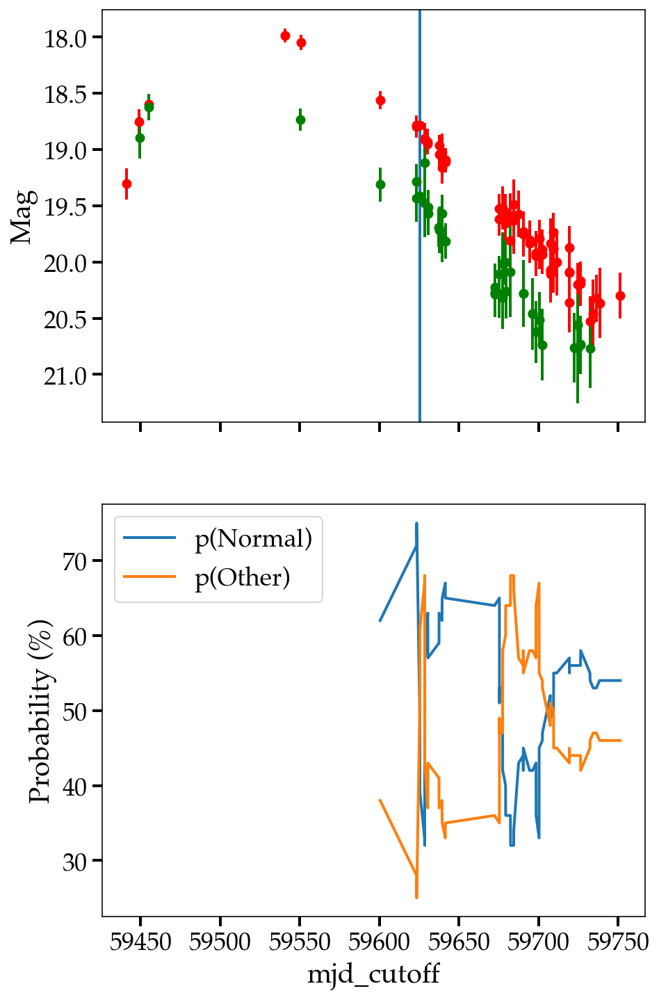

ZTF20acjfimy SN Ia
ZTF21aagsihi SN Ia
ZTF21aaquhqr SN II
ZTF20acpqagp SN Ia
ZTF21aagygzv SN Ia
ZTF20actvpyc SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21acizbmv SN Ia
ZTF18abxhsyn SN Ia
ZTF20accrkpa SN II
ZTF21abpviss SN Ia
ZTF21aahaksd SN Ia
ZTF21aaigqir SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


ZTF20acgiglu SN IIb
ZTF20acobamg SN Ia
ZTF20aczgmai SN IIn
ZTF21abmqpja SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF20acjrytv SN Ia
ZTF18accrorf SN Ia
ZTF21aapjmgf SN II
ZTF21aakvrgb SN Ia
ZTF21aceaiqm SN Ia
ZTF22aaaenuc SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aavsbkt SN Ia
ZTF21aaxtctv SN Ic
ZTF20accdijx SN II
ZTF21aaxxihx SN Ic-BL
ZTF22aaayjne SN Ia
ZTF18acsohut SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


ZTF21aamgcrv SN Ia
ZTF21aalgszc SN Ia
2
https://alerce.online/object/ZTF21aalgszc SN Ia


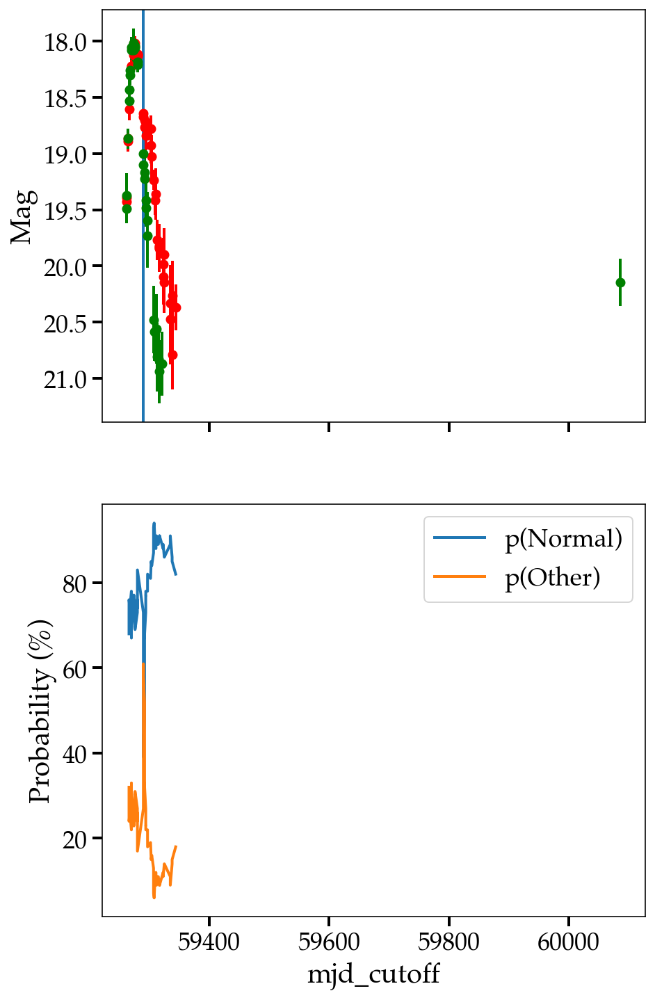

ZTF21abdahai SN II
ZTF21aarasky SN IIb
ZTF20abptxls SN Ia
ZTF21abvdazf SN Ia
ZTF18aaszvfn SN IIP
ZTF20adadrhw SN Ic


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21acdnnfg SN Ia


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


ZTF20acpgzif SN Ia
ZTF21aaukcog SN II
ZTF20acnznms SLSN-II
77
https://alerce.online/object/ZTF20acnznms SLSN-II


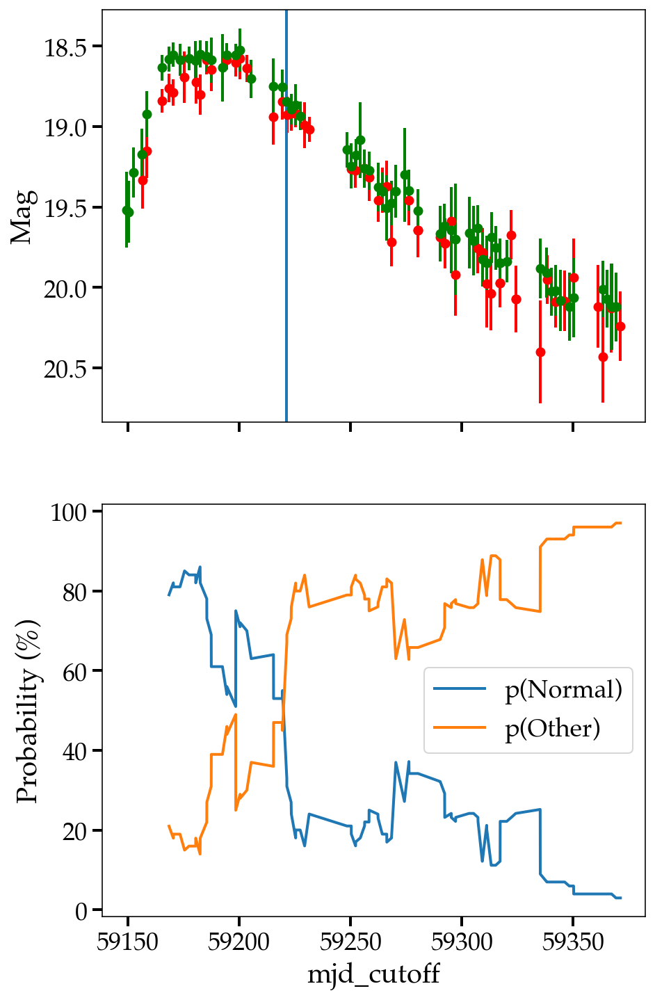

ZTF18aawfofp SN Ia
ZTF21acjxiqw SN IIP
ZTF20acvemao SN Ia
ZTF21abmdhes SN Ia
ZTF21acilvjb SN Ia
ZTF22aaaehtn SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aagtqgq SN Ia
ZTF21aagoliy SN Ia
ZTF21aadatfg SN Ic-BL
ZTF21aasafkl SN Ia
ZTF21aasbjgq SN Ia
ZTF21abxzzys SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF18abuxjrd SN Ia
ZTF20acgchsp SN II
ZTF21aaoqbbw SN IIn
ZTF21aabfwwl SN II
ZTF21aatwlhj SN Ia
ZTF21aaxxoei SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21abctnoh SN Ia
ZTF21abtsoky SN Ia
ZTF22aaabpkx SN Ia
ZTF20adagenq SN Ia
ZTF20aceokvr SN IIn
ZTF19abkftvd SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


ZTF21aaaadvr SN II
2
https://alerce.online/object/ZTF21aaaadvr SN II


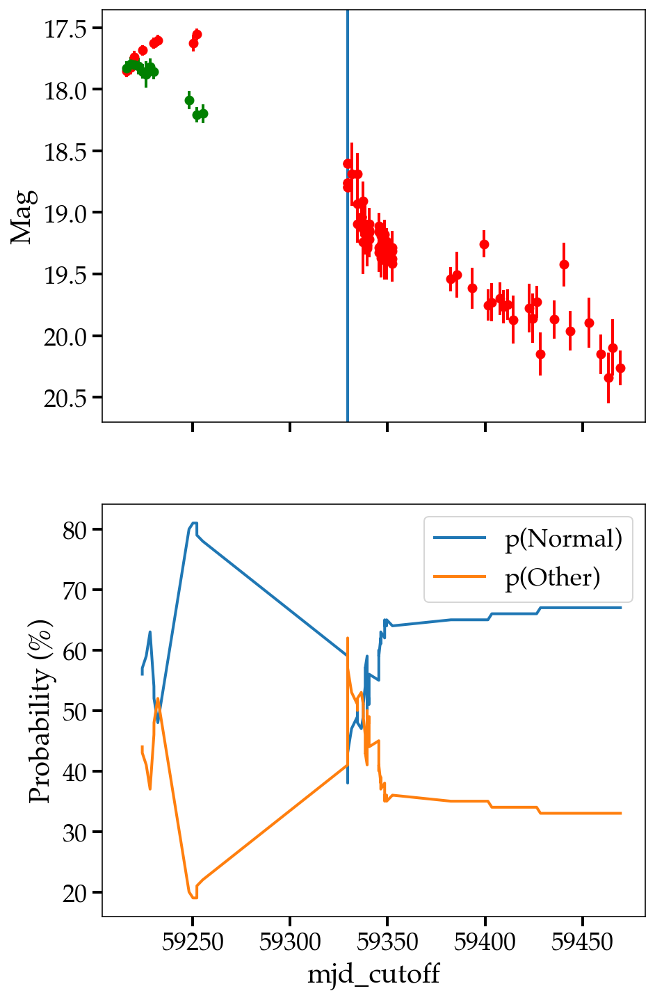

ZTF20abrjmgi SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


6
https://alerce.online/object/ZTF20abrjmgi SN Ia


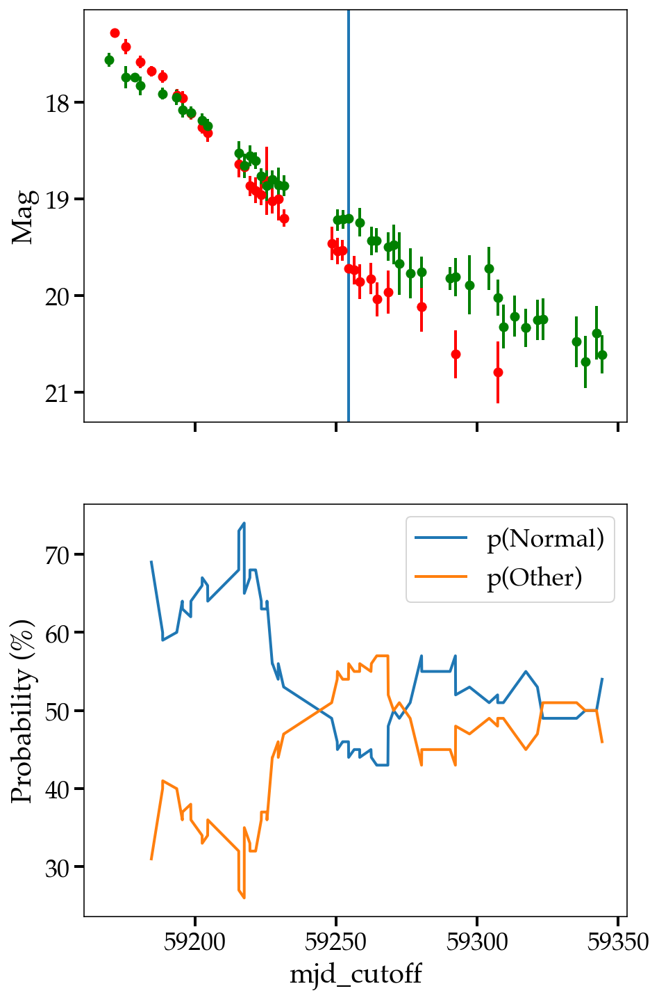

ZTF21aaaovua SN Ia
ZTF21aapfpod SN Ia
ZTF20acxyipy SN Ia
ZTF21acermmd SN Ia
ZTF18abaeqpf SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

80
https://alerce.online/object/ZTF18abaeqpf SN II


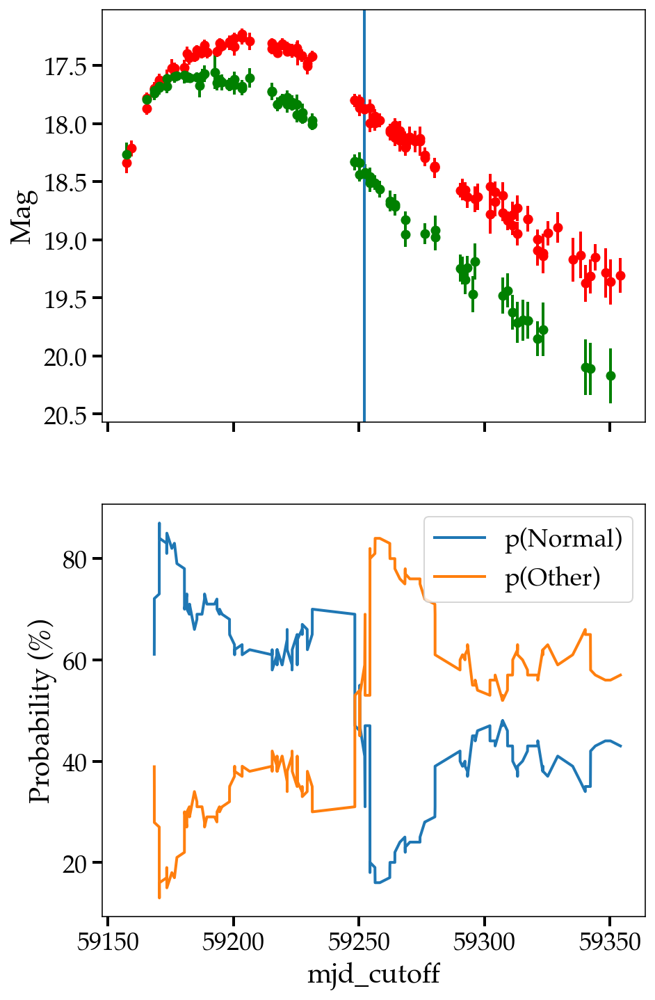

ZTF18actuhrs SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


5
https://alerce.online/object/ZTF18actuhrs SN Ia


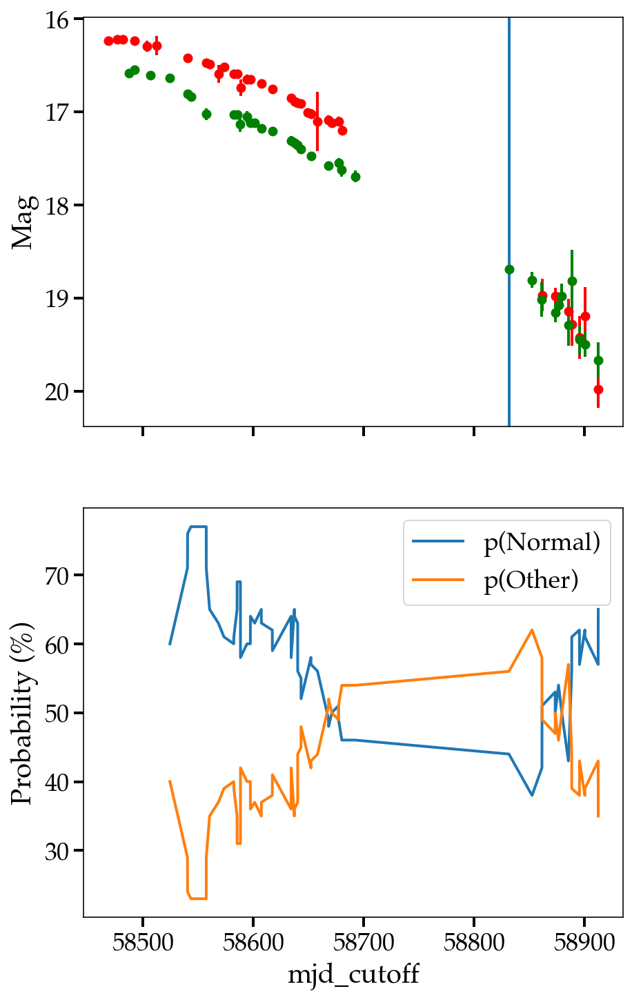

ZTF21abvdyoj SN Ia
ZTF21aavodtn SN Ia
ZTF21aaaalaf SN Ia
ZTF20acwofhd SN Ic


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s


ZTF21aafnabs SN Ia
ZTF21aayonfd SN Ic
ZTF21abcfgub SN Ia


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

ZTF21aawzsew SN Ia
ZTF21abowpnd SN Ia
ZTF21aaljjvt SN Ia
ZTF21abjamta SN II
ZTF20acpkprl SN Ia
ZTF20ackpjmb SN Ia


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Usi

ZTF21abtgbwr SN Ia
ZTF21ackcrao SN Ia
ZTF21abtmczy SN Ia
ZTF21abaiicy SN Ia
ZTF22aaacwup SN Ia
ZTF20acpqbfu SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aavozbk SN Ia
ZTF20abzvxyk SN Ia
6
https://alerce.online/object/ZTF20abzvxyk SN Ia


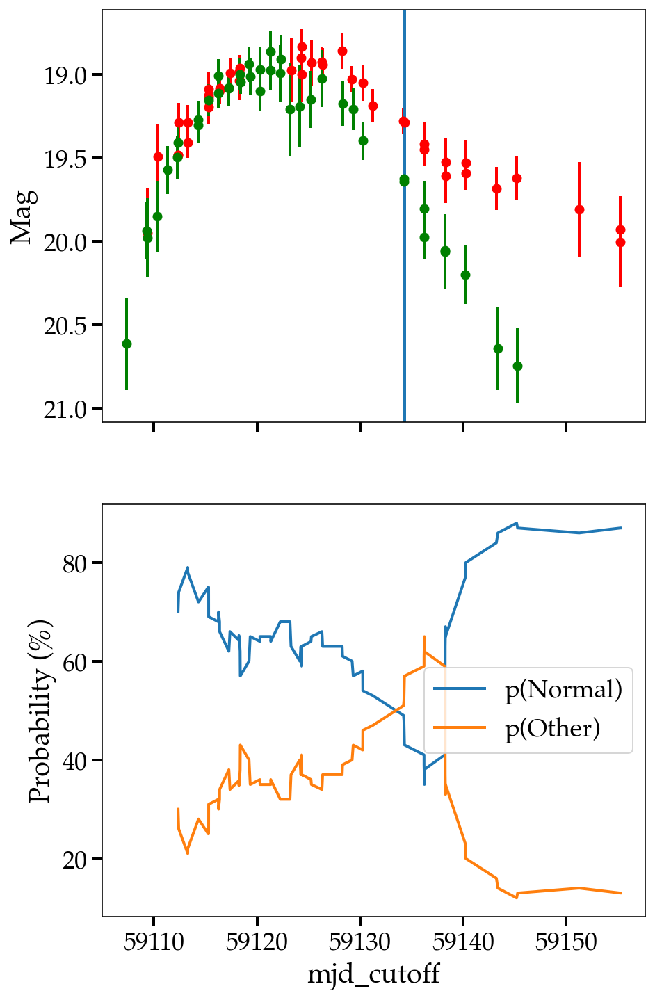

ZTF20acounxo SN IIn
ZTF20acfvgdp SN II
ZTF19aaadwfi SLSN-II
ZTF21abmspzt SN Ia
ZTF21aagojfe SN Ia
ZTF21abbgkgc SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF20acyybvq SN Ia
ZTF21aaxtzzj SN II
ZTF18acploez SN II
ZTF21aapffqd SN II
6
https://alerce.online/object/ZTF21aapffqd SN II


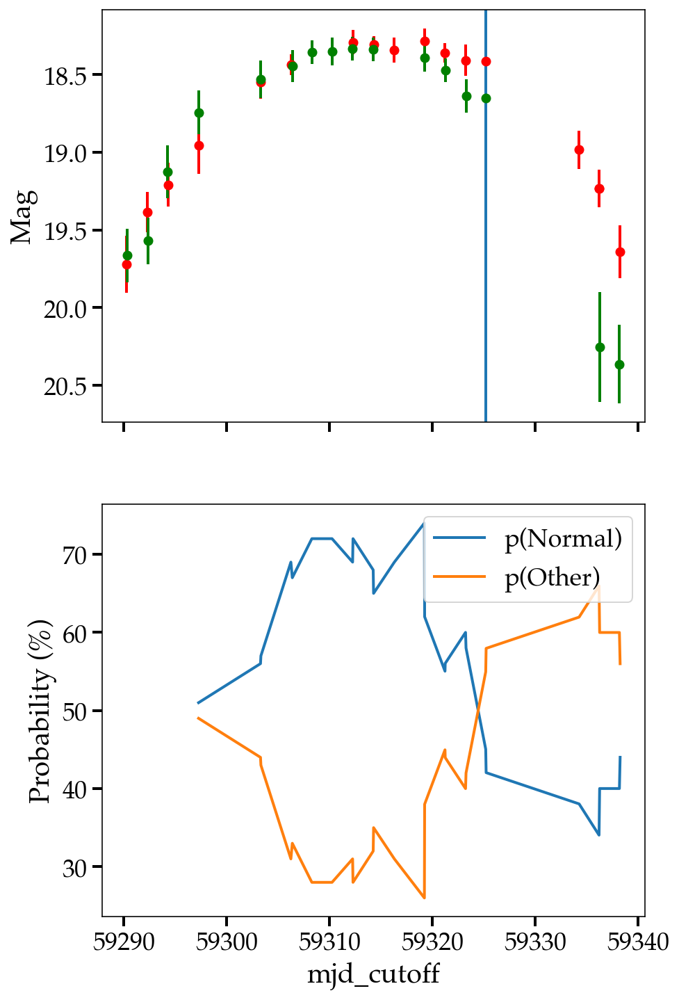

ZTF22aaacdfe SN Ia
ZTF21abkkuja SN Ia
ZTF21acfccil SN Ia-91T-like
ZTF20acmntog SN Ia
ZTF21aaradzm SN IIn
ZTF20acwytxn TDE


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21aadrtcs SN Ia
ZTF20aczhajq SN Ia
ZTF22aabhtsw SN Ia
ZTF21aaxvcmj SN Ib
ZTF22aaarcds SN Ia
couldn't feature space as func of time for ZTF22aaarcds. Make anom epoch -9
ZTF21abnspht SN Ia
ZTF20abqlmwn SN II


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

41
https://alerce.online/object/ZTF20abqlmwn SN II


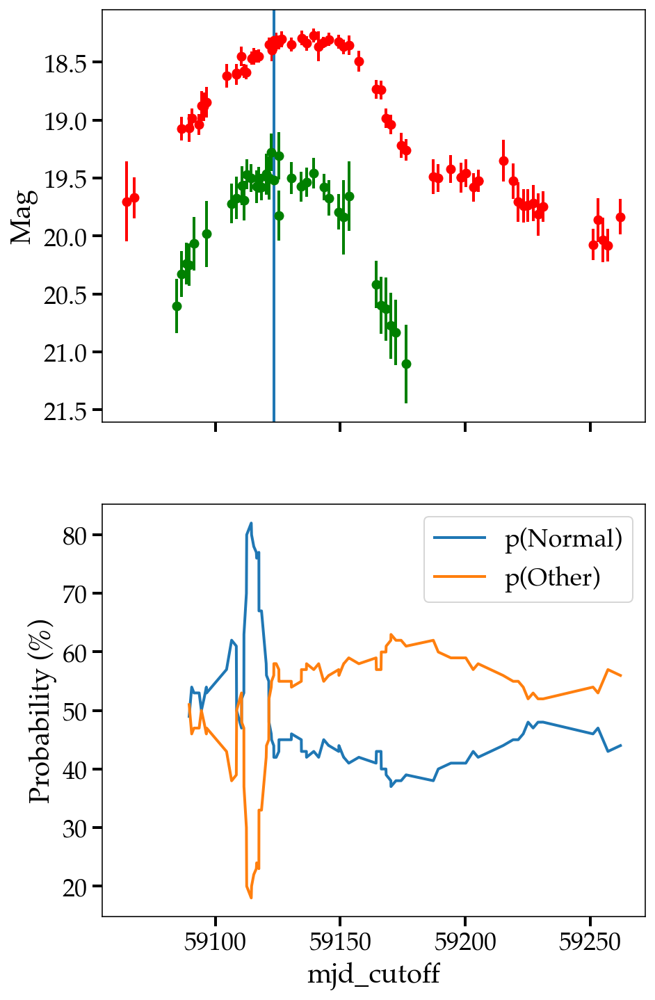

ZTF21abrlslx SN Ia
ZTF20acpkzxq SN Ia
ZTF21acqvuyb SLSN-II
ZTF21aagtqna SN II
ZTF20actskcf SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF20acwfcfs SN Ia
ZTF21aanuyro SN Ia
ZTF21acioiha SN Ia
ZTF21aaabviz SN Ia
ZTF20acpkpla SN Ia
ZTF21aaaecrv SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF20achrklb SN Ia-91T-like
ZTF20acwogqz SN Ia
ZTF21abpyauz SN II
16
https://alerce.online/object/ZTF21abpyauz SN II


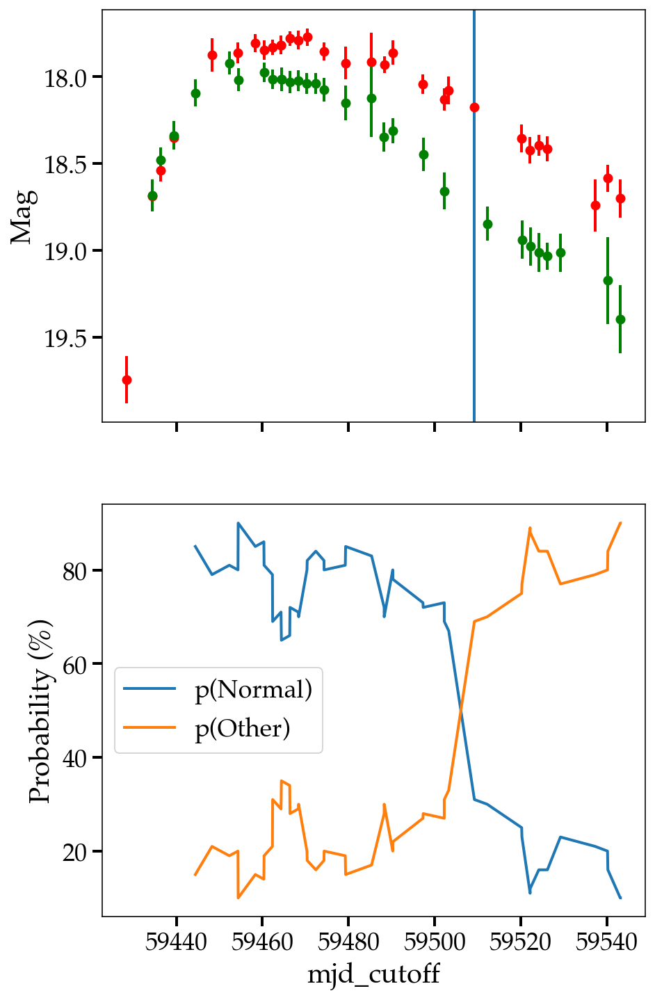

ZTF20acwozwz SN Ia
ZTF21abfjgwr SN Ia
ZTF21aahfjrr SN IIn
ZTF21aaufthj SN Ia
ZTF21aalnyny SN Ia
ZTF20acplqek SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21ackwgzm SN Ia


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Paral

ZTF21acjmvhx SN Ic-BL
ZTF20aciuftf SN Ia
ZTF21abxdibe SN Ia
ZTF21aanzcuj SN II
ZTF20acwyoxc SN Ia
ZTF21aaxgzln SN Ia


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Usi

ZTF21abfiuqf SN II
ZTF20acorjop SN II
ZTF20aclxbwk SN Ia
ZTF20achbejn SN II
ZTF21aaxwcgj SN Ia
ZTF21aaqgrrf SN Ia


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_job

ZTF21abeokcr SN Ia
ZTF21aavqphe SN Ia
ZTF21acdalyp SN Ia-91T-like
ZTF21abdcauj SN Ia
ZTF21aaetnfe SN Ia
ZTF21acgzwsc SN Ia
ZTF21aatklhw SN Ia


[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


In [35]:
import antares_client

df_path = "/Users/patrickaleo/Desktop/Illinois/LAISS-antares/repo/CVAE_dataframes"
anom_thresh = 55

num_anom_epochs_l = []
anom_ztfid_l, tnscls_l = [],[]
for anom_ztfid, tnscls in zip(x_test_all.index, x_test_all.tns_cls):
    print(anom_ztfid, tnscls)
    try:
        lc_and_hosts_df = pd.read_csv(f'{df_path}/{anom_ztfid}_timeseries.csv')
    except:
        print(f"couldn't feature space as func of time for {anom_ztfid}. Make anom epoch -9")
        num_anom_epochs_l.append(-9)
        continue
        
    lc_and_hosts_df = lc_and_hosts_df.dropna()
    anom_obj_df = lc_and_hosts_df[x_test.columns]
    
    pred_prob_anom = 100 * clf.predict_proba(anom_obj_df)
    num_anom_epochs = len(np.where(pred_prob_anom[:, 1]>=anom_thresh)[0])
    num_anom_epochs_l.append(num_anom_epochs)
    
    try: 
        #anom_idx = np.where(pred_prob_anom[:, 1]>=50)[0][0]
        orig = pd.read_csv(f'{df_path}/{anom_ztfid}_timeseries.csv')
        diff = len(orig)-len(pred_prob_anom)
        anom_idx = lc_and_hosts_df.loc[np.where(pred_prob_anom[:, 1]>=anom_thresh)[0][0]].obs_num + diff

    except: continue

    ztf_id_ref = anom_ztfid 

    ref_info = antares_client.search.get_by_ztf_object_id(ztf_object_id=ztf_id_ref)

    try: df_ref = ref_info.timeseries.to_pandas()
    except: continue

    print(num_anom_epochs)
    anom_ztfid_l.append(anom_ztfid), tnscls_l.append(tnscls)

    df_ref_g = df_ref[(df_ref.ant_passband == 'g') & (~df_ref.ant_mag.isna())]
    df_ref_r = df_ref[(df_ref.ant_passband == 'R') & (~df_ref.ant_mag.isna())]

    mjd_idx_at_min_mag_r_ref = df_ref_r[['ant_mag']].reset_index().idxmin().ant_mag
    mjd_idx_at_min_mag_g_ref = df_ref_g[['ant_mag']].reset_index().idxmin().ant_mag

    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(7,12))
    ax1.invert_yaxis()
    ax1.errorbar(x=df_ref_r.ant_mjd, y=df_ref_r.ant_mag, yerr=df_ref_r.ant_magerr, fmt='o', c='r', 
                label=f'REF: {ztf_id_ref}')
    ax1.errorbar(x=df_ref_g.ant_mjd, y=df_ref_g.ant_mag, yerr=df_ref_g.ant_magerr, fmt='o', c='g')
    #ax1.axvline(x=lc_and_hosts_df.loc[lc_and_hosts_df.loc[anom_idx].obs_num].mjd_cutoff)
    ax1.axvline(x=lc_and_hosts_df[lc_and_hosts_df.obs_num == anom_idx].mjd_cutoff.values[0])
    #ax1.set_xlim(min(df_ref_r.ant_mjd), max(df_ref_r.ant_mjd))
    ax1.set_ylabel('Mag')


    print(f'https://alerce.online/object/{anom_ztfid}', tnscls)
    ax2.plot(lc_and_hosts_df['mjd_cutoff'], pred_prob_anom[:, 0], label='p(Normal)')
    ax2.plot(lc_and_hosts_df['mjd_cutoff'], pred_prob_anom[:, 1], label='p(Other)')
    #ax2.axhline(y=50)

    ax2.set_ylabel('Probability (%)')


    #ax2.set_xlim(min(df_ref_r.ant_mjd), max(df_ref_r.ant_mjd))

    plt.xlabel('mjd_cutoff')
    plt.legend()
    plt.show()

In [36]:
for ob, cl in zip(anom_ztfid_l, tnscls_l):
    print(f'https://alerce.online/object/{ob}', cl)

https://alerce.online/object/ZTF20abarsvz SN Ia
https://alerce.online/object/ZTF21abrxoir SN Ia
https://alerce.online/object/ZTF21abzbwfo SN II
https://alerce.online/object/ZTF20abwxywy SN Ic
https://alerce.online/object/ZTF21aaizyqc SN II
https://alerce.online/object/ZTF21aajvukh SN II
https://alerce.online/object/ZTF20actekrw SN Ic
https://alerce.online/object/ZTF21abcnpnk SN Ia
https://alerce.online/object/ZTF20accmtgt SN Ia
https://alerce.online/object/ZTF21aautijg SN IIn
https://alerce.online/object/ZTF21aaxstzy SN Ia
https://alerce.online/object/ZTF21aalxurx SN II
https://alerce.online/object/ZTF21aadacxv SN II
https://alerce.online/object/ZTF20acxqxyw SN Ib
https://alerce.online/object/ZTF21abcgnqn TDE
https://alerce.online/object/ZTF20acuhgar SN II
https://alerce.online/object/ZTF18acvgjqv SN IIn
https://alerce.online/object/ZTF18acaqdaa TDE
https://alerce.online/object/ZTF21aaphlty SN Ia
https://alerce.online/object/ZTF20acyroke SN Ia
https://alerce.online/object/ZTF20accodxy 

In [37]:
Counter(x_test_all.tns_cls)

Counter({'SN Ia': 279,
         'SN Ib': 4,
         'SN IIP': 4,
         'SN II': 63,
         'SN Ic': 8,
         'SN Ia-91T-like': 9,
         'SN Ic-BL': 4,
         'SN IIn': 13,
         'TDE': 8,
         'SN IIb': 5,
         'SLSN-II': 3})

In [38]:
Counter(tnscls_l)

Counter({'SN Ia': 12,
         'SN II': 12,
         'SN Ic': 2,
         'SN IIn': 3,
         'SN Ib': 1,
         'TDE': 4,
         'SN Ia-91T-like': 1,
         'SLSN-II': 1})

In [39]:
print(f"Anom threshold = {anom_thresh}%\n-----------")
for scls in np.unique(x_test_all.tns_cls):
    print(f"{scls}: {Counter(tnscls_l).get(scls)} / {Counter(x_test_all.tns_cls).get(scls)}")

Anom threshold = 55%
-----------
SLSN-II: 1 / 3
SN II: 12 / 63
SN IIP: None / 4
SN IIb: None / 5
SN IIn: 3 / 13
SN Ia: 12 / 279
SN Ia-91T-like: 1 / 9
SN Ib: 1 / 4
SN Ic: 2 / 8
SN Ic-BL: None / 4
TDE: 4 / 8


In [40]:
#14/(15+19) # 0.4117% purity as func of time at anom_thresh of 49.5%
12/(12+12) # 50% purity as func of time at anom_thresh of 55%

0.5

### misclassified as Other are still largely very interesting! Closeby Ia, red, IIn-like, IIb-like, long lived...

# TODO: look at the tagged interesting things!!

## Correct interesting by label

## Incorrect intesesting by label

# XXX haven't updated below

In [36]:
%%time 
# In summary, you train your Random Forest Classifier to classify your data, 
# and then use the Isolation Forest algorithm on the output probabilities of the Random Forest Classifier 
# to detect anomalies.

from sklearn.ensemble import IsolationForest

anomaly_scores = IsolationForest(n_estimators=500, 
                                random_state=10, 
                                contamination=0.25,
                                max_features=11, # 12 for with None cls
                                n_jobs=-1).fit(predicted_probability).decision_function(predicted_probability)

CPU times: user 982 ms, sys: 372 ms, total: 1.35 s
Wall time: 1.02 s


In [37]:
most_anomalous_indices = np.argsort(anomaly_scores)[:25]
most_anomalous_samples = df2.iloc[most_anomalous_indices]
most_anomalous_samples

,feature_amplitude_magn_r,feature_anderson_darling_normal_magn_r,feature_beyond_1_std_magn_r,feature_beyond_2_std_magn_r,feature_cusum_magn_r,feature_inter_percentile_range_2_magn_r,feature_inter_percentile_range_10_magn_r,feature_inter_percentile_range_25_magn_r,feature_kurtosis_magn_r,feature_linear_fit_slope_magn_r,...,SN IIP,SN IIb,SN IIn,SN Ia,SN Ia-91T-like,SN Ib,SN Ic,SN Ic-BL,TDE,RFC_best_cls
ztf_object_id,,,,,,,,,,,,,,,,,,,,,
ZTF20aceokvr,0.772009,3.986711,0.225000,0.025000,0.417498,1.497513,1.275409,0.608335,-0.234187,0.012752,...,21.0,10.0,11.0,15.0,4.0,3.0,2.0,19.0,0.0,SN IIP
ZTF21abpyauz,0.987303,1.645826,0.137931,0.034483,0.388388,1.893584,0.901166,0.565298,4.289138,0.002772,...,0.0,0.0,47.0,11.0,0.0,0.0,0.0,0.0,1.0,SN IIn
ZTF21acmnpqa,0.670024,0.165766,0.400000,0.000000,0.383080,1.340048,1.340048,0.741808,-0.567954,-0.002162,...,8.0,13.0,8.0,21.0,1.0,38.0,6.0,1.0,0.0,SN Ib
ZTF21aautijg,0.678457,2.020706,0.171429,0.057143,0.343146,1.276674,0.609076,0.267091,5.422472,-0.000680,...,0.0,0.0,20.0,17.0,1.0,0.0,0.0,4.0,3.0,SLSN-II
ZTF21abgkfzh,0.441565,0.789434,0.294118,0.088235,0.396573,0.869656,0.599177,0.282619,0.081786,0.004576,...,12.0,0.0,49.0,4.0,1.0,0.0,0.0,6.0,0.0,SN IIn
ZTF21aapvvtb,0.284339,0.247243,0.357143,0.000000,0.368838,0.568678,0.534634,0.315300,-0.907417,0.006679,...,0.0,0.0,0.0,9.0,4.0,0.0,0.0,0.0,82.0,TDE
ZTF21aakigqr,0.339321,0.262226,0.200000,0.050000,0.350327,0.678642,0.362262,0.211516,0.764990,0.000725,...,27.0,0.0,7.0,8.0,2.0,4.0,0.0,6.0,1.0,SN II
ZTF21aafmkjk,0.671348,0.793086,0.234043,0.042553,0.405861,1.129119,0.569957,0.387455,0.269652,0.002722,...,4.0,0.0,35.0,13.0,1.0,1.0,0.0,2.0,9.0,SN IIn
ZTF20aatxryt,1.710750,0.856208,0.305556,0.055556,0.387801,3.417209,2.333250,1.125550,0.505491,0.009653,...,0.0,0.0,21.0,20.0,2.0,0.0,8.0,5.0,15.0,SN IIn


In [38]:
for obj, cls, rfc_cls in zip(most_anomalous_samples.index, most_anomalous_samples.tns_cls, most_anomalous_samples.RFC_best_cls):
    print(f"https://alerce.online/object/{obj}", cls, rfc_cls)

https://alerce.online/object/ZTF20aceokvr SN IIn SN IIP
https://alerce.online/object/ZTF21abpyauz SN II SN IIn
https://alerce.online/object/ZTF21acmnpqa SN Ia SN Ib
https://alerce.online/object/ZTF21aautijg SN IIn SLSN-II
https://alerce.online/object/ZTF21abgkfzh SN IIn SN IIn
https://alerce.online/object/ZTF21aapvvtb TDE TDE
https://alerce.online/object/ZTF21aakigqr SN II SN II
https://alerce.online/object/ZTF21aafmkjk SN IIn SN IIn
https://alerce.online/object/ZTF20aatxryt SN Ia SN IIn
https://alerce.online/object/ZTF20accrkpa SN II SN Ia
https://alerce.online/object/ZTF21aaaalaf SN Ia SN IIP
https://alerce.online/object/ZTF18acvgjqv SN IIn SLSN-II
https://alerce.online/object/ZTF21abplgag SN Ia SN Ic
https://alerce.online/object/ZTF20achmmex SN II SN II
https://alerce.online/object/ZTF21aadatfg SN Ic-BL SN Ia
https://alerce.online/object/ZTF21aahfjrr SN IIn SN IIn
https://alerce.online/object/ZTF21aaabwfu SN IIb SN Ib
https://alerce.online/object/ZTF20acwytxn TDE SN IIn
https://aler

In [39]:
# All long lived or big color difference

In [40]:
Counter(most_anomalous_samples['tns_cls'])

Counter({'SN IIn': 6,
         'SN II': 6,
         'SN Ia': 5,
         'TDE': 3,
         'SN Ic-BL': 3,
         'SN IIb': 1,
         'SLSN-II': 1})

In [41]:
Counter(most_anomalous_samples['RFC_best_cls'])

Counter({'SN IIP': 2,
         'SN IIn': 8,
         'SN Ib': 2,
         'SLSN-II': 2,
         'TDE': 1,
         'SN II': 6,
         'SN Ia': 3,
         'SN Ic': 1})

### Feature importance

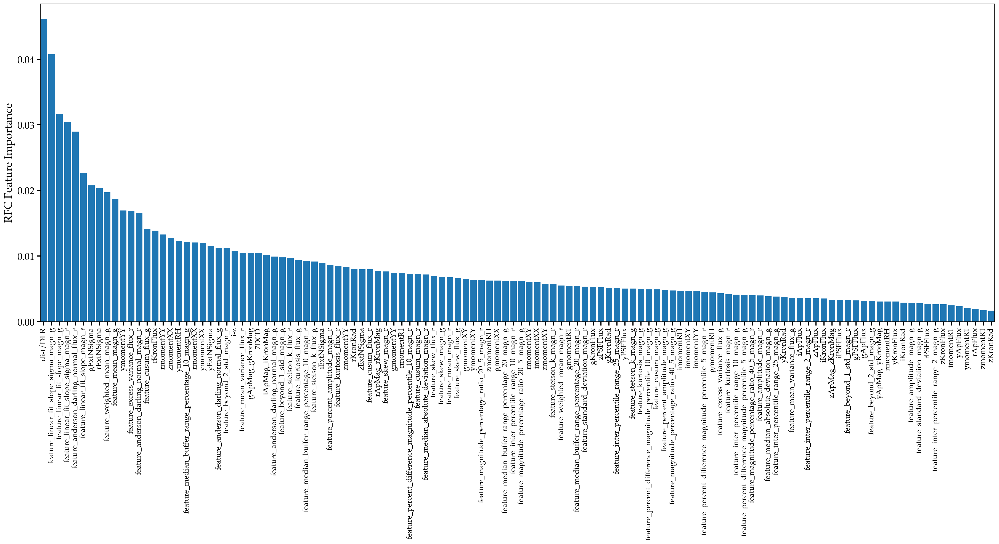

In [42]:
importances = clf.feature_importances_
indices = np.argsort(importances)[::-1]

X_train = dataset_bank_tns_df_resampled_train.iloc[:, 0:120]

fig, ax = plt.subplots(figsize=(24, 8))
ax.bar(range(X_train.shape[1]), importances[indices])
ax.set_xticks(range(X_train.shape[1]))
ax.set_xticklabels(X_train.columns[indices], rotation=90, fontsize=14)
plt.subplots_adjust(left=0.0, right=1, top=1.0, bottom=0)
ax.set_xlim(left=-0.40, right=119.4)
plt.ylabel('RFC Feature Importance')
plt.savefig(f'{folder_path}/RFC_feature_importance_horizontal.jpg', dpi=300, bbox_inches='tight')
plt.show()

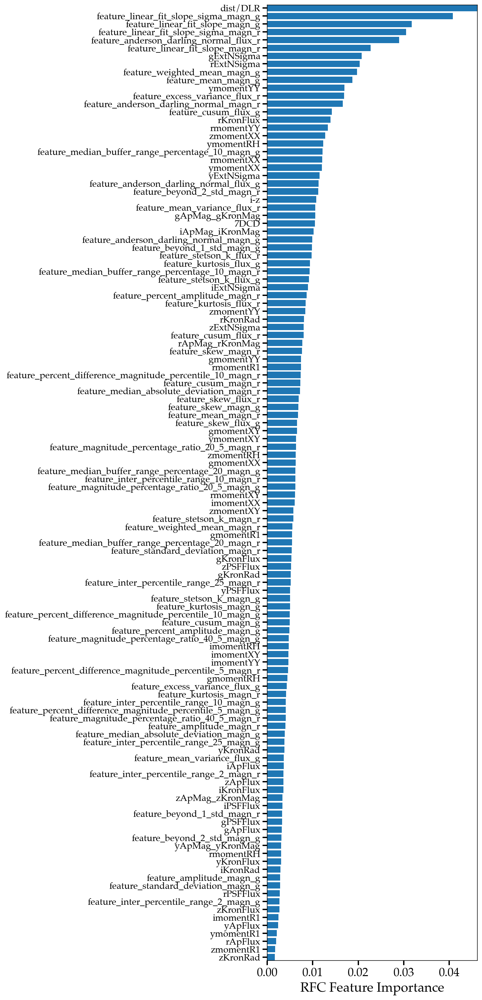

In [43]:
fig, ax = plt.subplots(figsize=(8, 20))
ax.barh(range(X_train.shape[1]), importances[indices][::-1])
ax.set_yticks(range(X_train.shape[1]))
ax.set_yticklabels(X_train.columns[indices][::-1], fontsize=14)
plt.subplots_adjust(left=0.4, right=0.95, top=1.0, bottom=0)
ax.set_ylim(top=119.4, bottom=-0.40)
ax.set_xlim(right=np.max(importances[indices][::-1]))
plt.xlabel('RFC Feature Importance')
plt.savefig(f'{folder_path}/RFC_feature_importance_vertical.jpg', dpi=300, bbox_inches='tight')
plt.show()

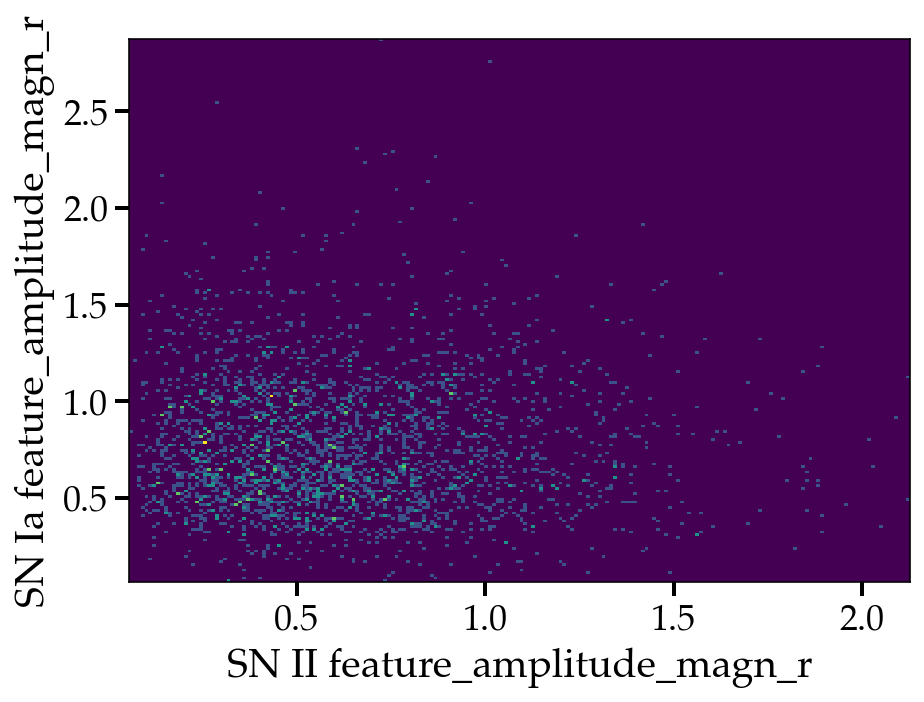

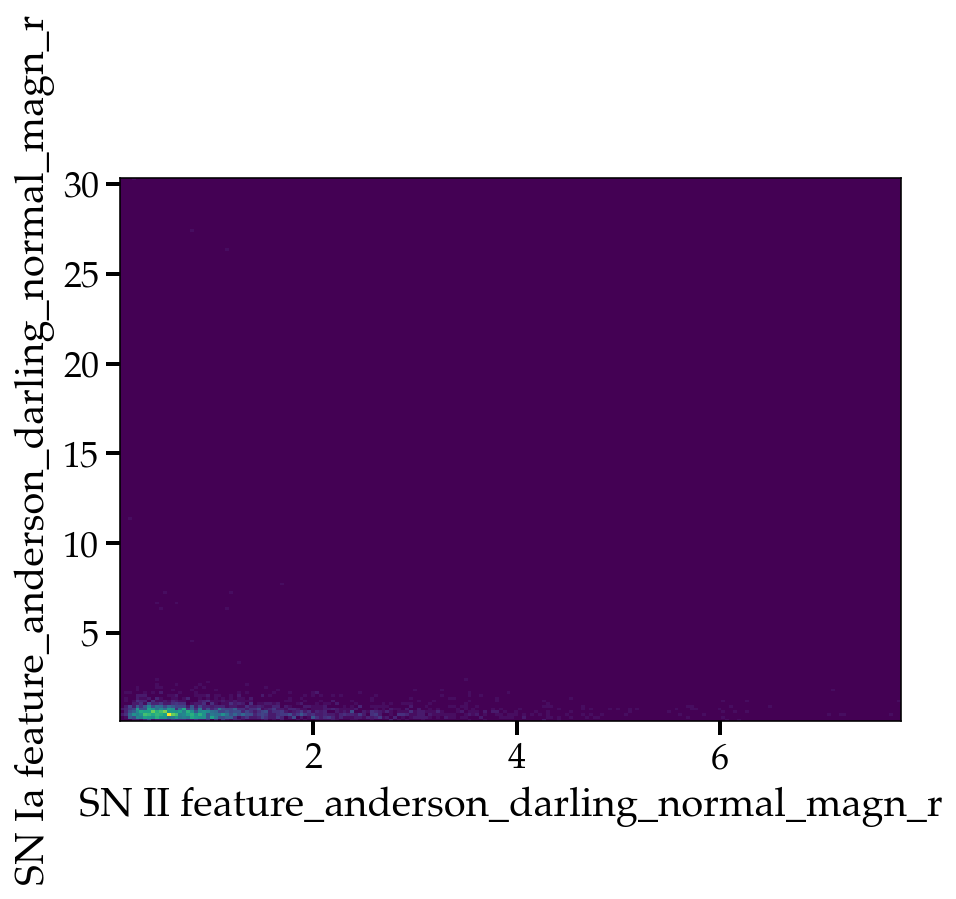

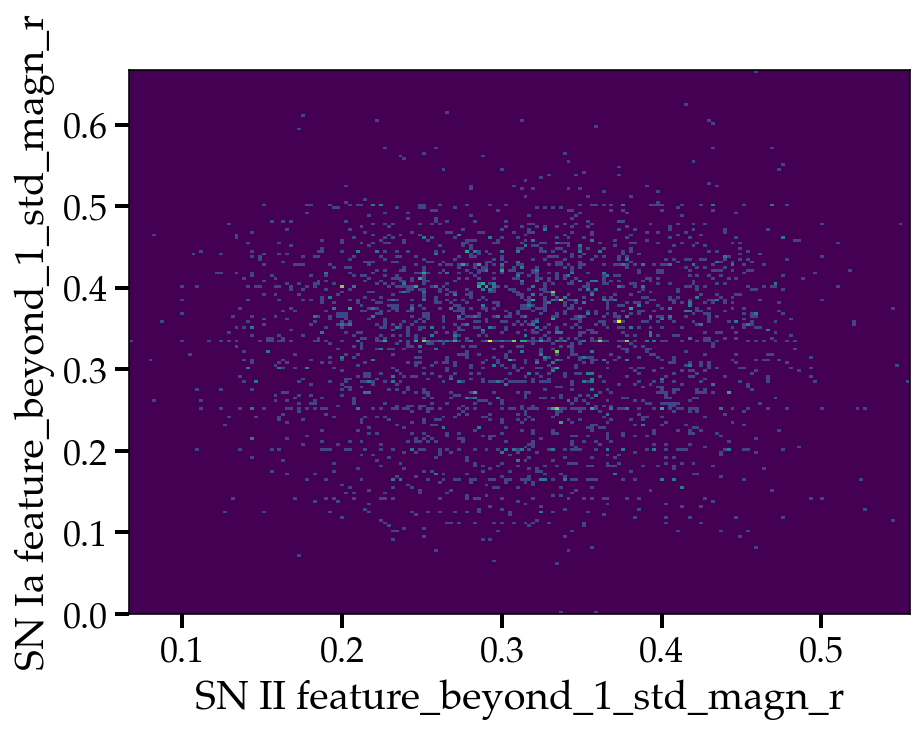

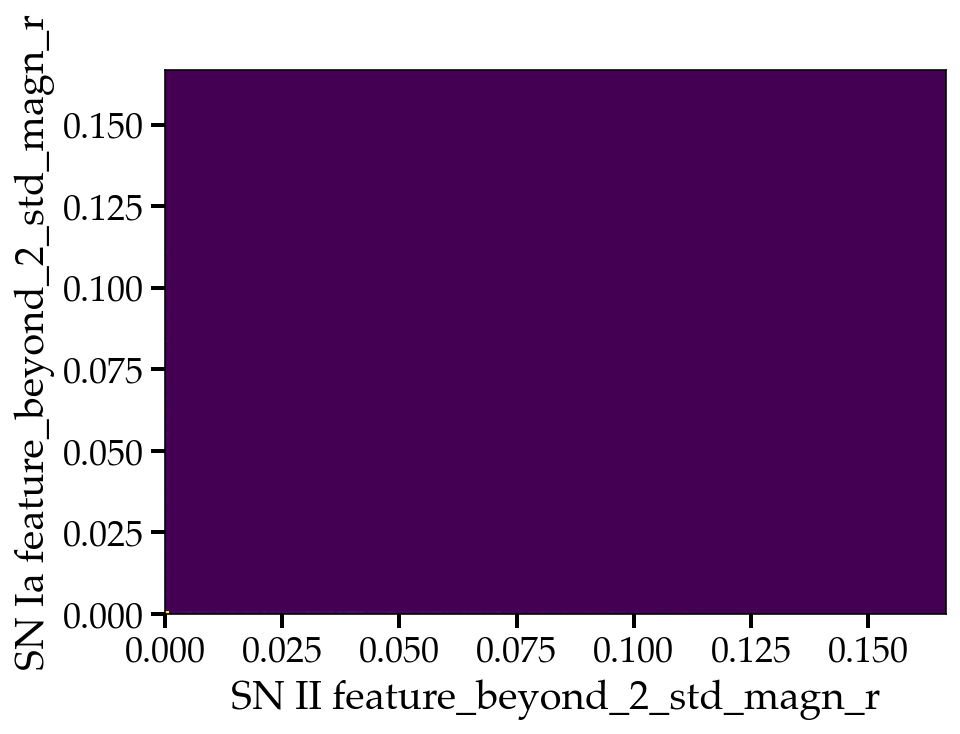

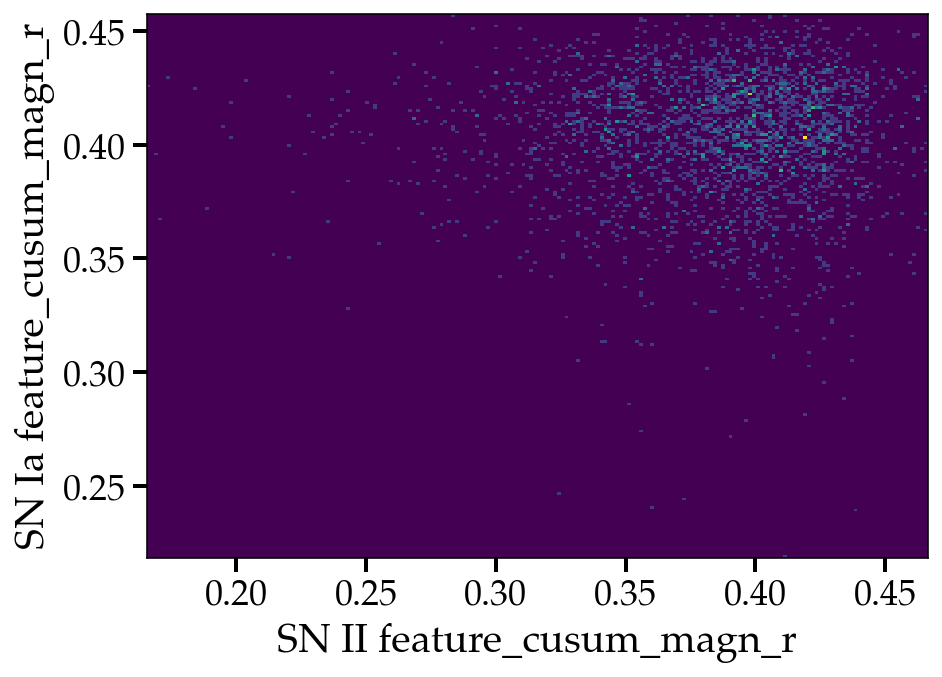

...

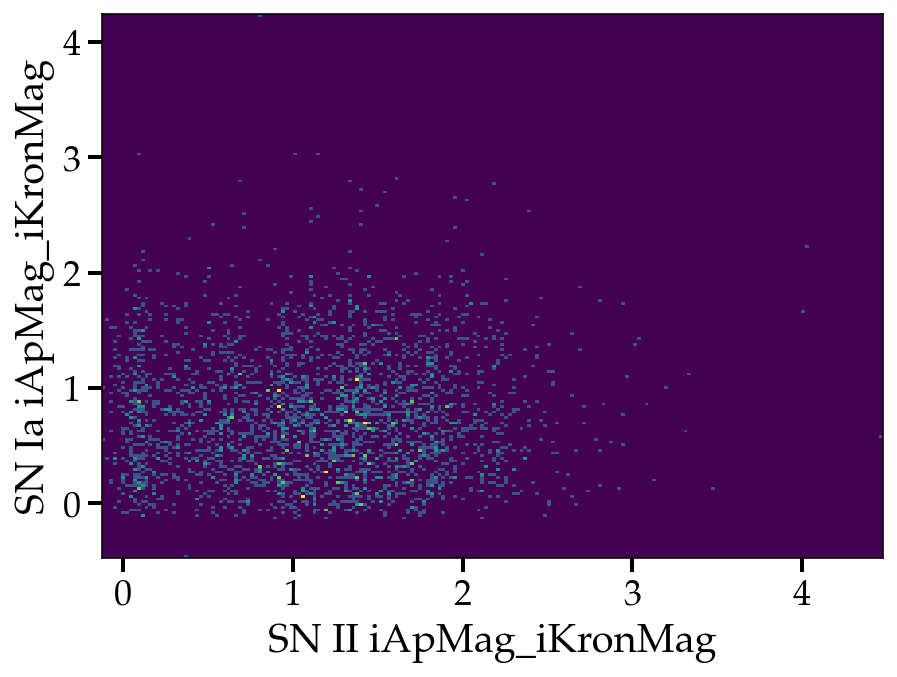

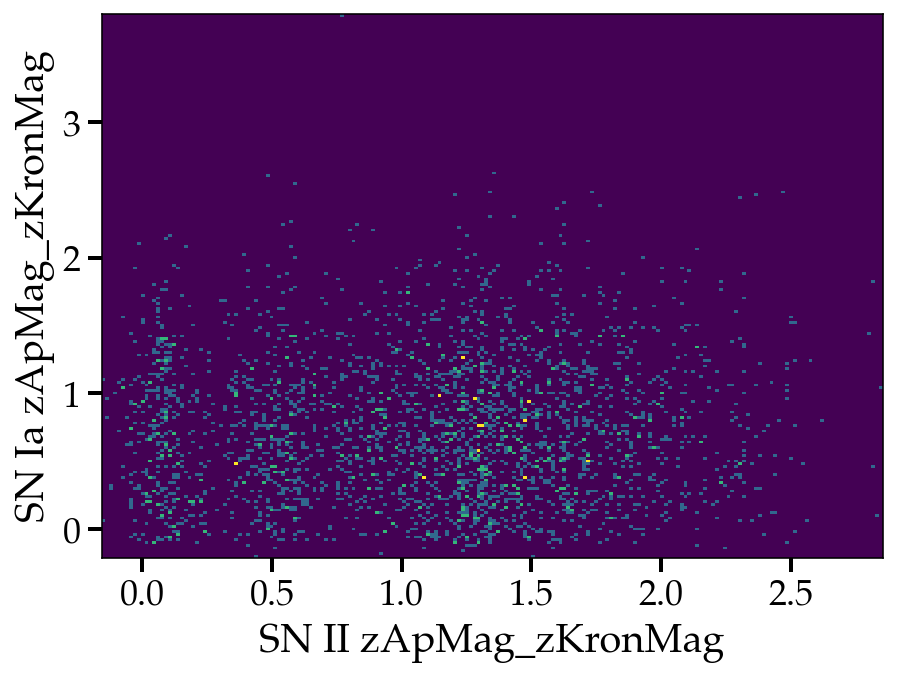

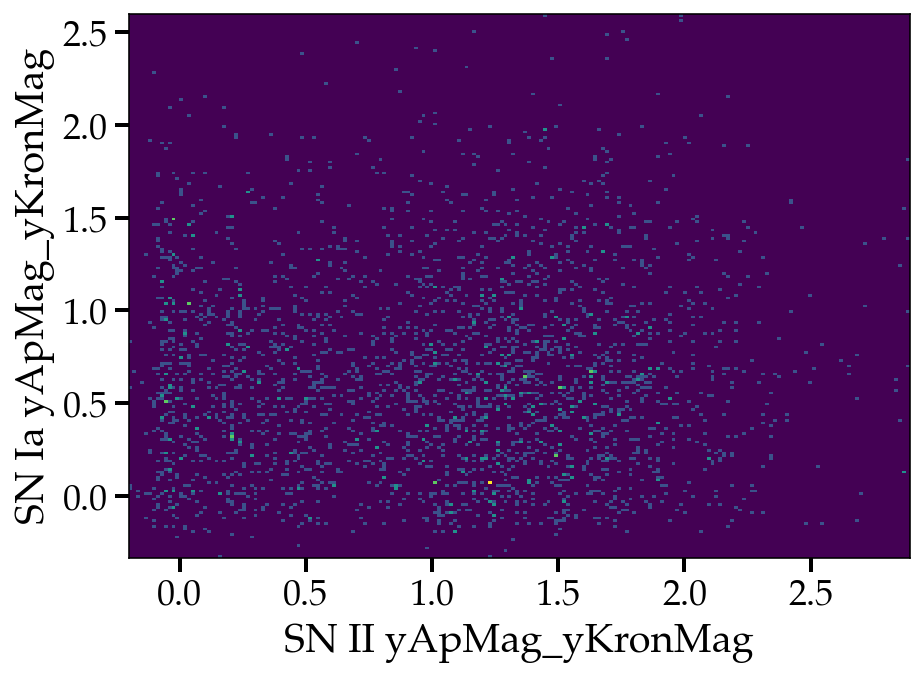

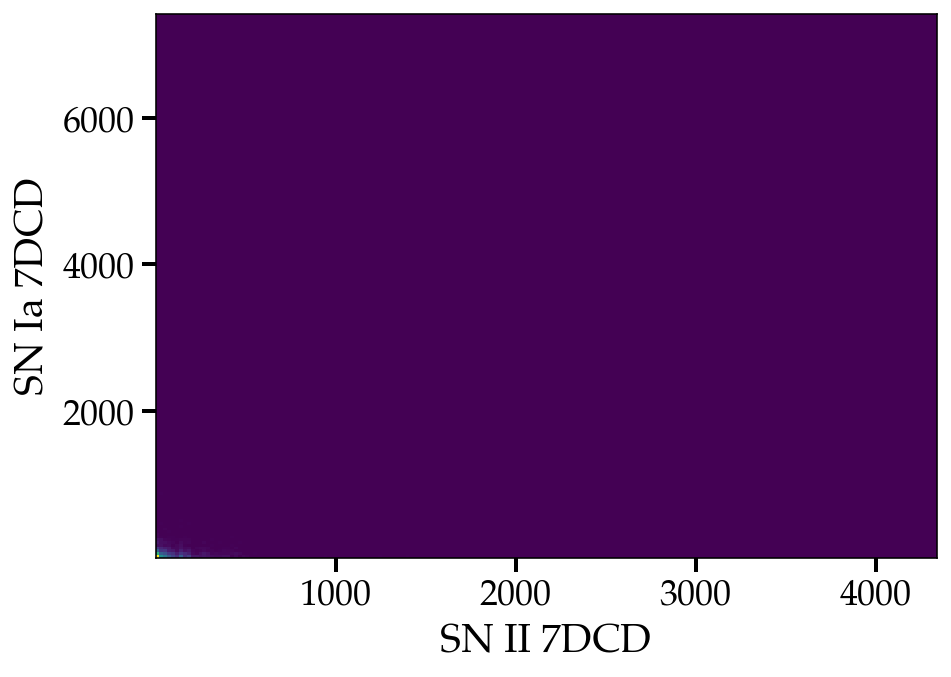

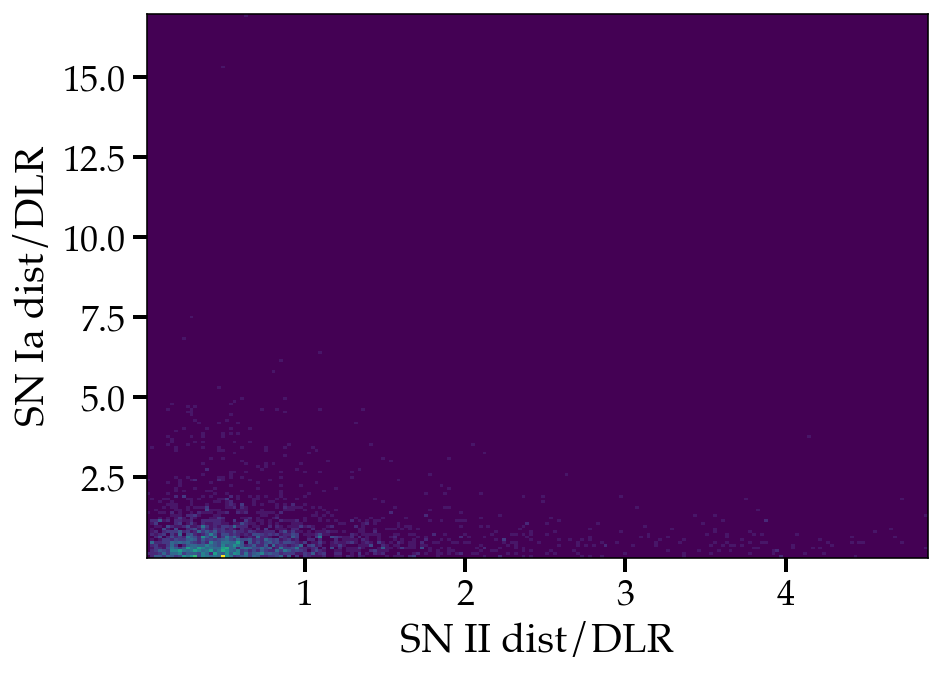

In [37]:
snii_df = dataset_bank_tns_df_resampled_train[dataset_bank_tns_df_resampled_train.tns_cls == "SN II"]
snia_df = dataset_bank_tns_df_resampled_train[dataset_bank_tns_df_resampled_train.tns_cls == "SN Ia"]

for i in range(0, 120, 1):
    feat = lc_and_host_features[0:120][i]
    plt.hist2d(snii_df[feat], snia_df[feat], bins=200)
    plt.xlabel(f"SN II {feat}")
    plt.ylabel(f"SN Ia {feat}")
    plt.show()